In [1]:
import numpy as np
import jax.numpy as jnp
from jax.example_libraries import optimizers
from jax import grad, jit, random
import matplotlib.pyplot as plt
import sys

In [2]:
def sqrt_svd(Sigma, eps=0.0):
    s, v = jnp.linalg.eigh(Sigma + eps*jnp.eye(Sigma.shape[0]))
    s = s * (s > 0.0)  # Ensure non-negative eigenvalues
    return v @ jnp.diag(jnp.sqrt(s)) @ v.T

In [3]:
from teachers import * 

P = 200
Ptest = 500
lambda0 = 1.0
seedx = 15
C, X_train, y_train, X_test, y_test = load_mnist(P, Ptest, lambda0, seed=seedx)

y_train = np.where(y_train == 0, -1, y_train)
y_test = np.where(y_test == 0, -1, y_test)

print(C.shape)

X = jnp.vstack([X_train, X_test])
D = X.shape[1]
Kx = (1 / (lambda0 * D)) * X @ X.T
Kx_root = sqrt_svd(Kx)
y = jnp.concatenate([y_train, y_test])

2025-05-28 16:12:46.308311: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-28 16:12:46.321186: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-28 16:12:46.324930: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-28 16:12:53.513541: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/n/home10/clauditi/miniconda/envs/new_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonote

(200, 200)


In [4]:
#checks 
print(Kx.shape)
print(y.shape)

(700, 700)
(700,)


# DMFT theory and Gradient descent dynamics: kernels and preactivations

In [5]:
#dmft
def sqrt_svd(Sigma, eps=1e-4):
    s, v = jnp.linalg.eigh(Sigma + eps*jnp.eye(Sigma.shape[0]))
    s = s * (s > 0.0)  # Ensure non-negative eigenvalues
    return v @ jnp.diag(jnp.sqrt(s)) @ v.T

def solve_dynamics_reg(Kx, y, P, gamma, lamb, sigma=1.0, num_iter=20000, samples=10000, lr=1e-3):
    Kx_root = sqrt_svd(Kx)  # Compute the square root of Kx, assuming sqrt_svd is defined
    h = sigma * random.normal(random.PRNGKey(0), (samples, y.shape[0])) @ Kx_root
    z = sigma * random.normal(random.PRNGKey(1), (samples,))

    # Initial Delta and compute initial phi and Phi0
    #Delta = y
    h0 = h
    phi = h * (h > 0.0)
    Phi0 = phi.T @ phi / samples
    f0 = 1.0/gamma * jnp.einsum('ij,i->j', phi, z) / samples
    Delta0 = 1.0 * y - 1/gamma * phi.T @ z / samples + f0

    train_losses = []
    test_losses = []

    for n in range(num_iter):
        phi = h * (h > 0.0)
        g = (h > 0.0) * z[:, jnp.newaxis]
        Delta = 1.0 * y - 1/gamma * phi.T @ z / samples + f0

        h += lr * (gamma * jnp.einsum('ij,kj->ik', g[:, :P] * Delta[jnp.newaxis, :P], Kx[:, :P]) - lamb * h)
        z += lr * (gamma * jnp.einsum('ij,j->i', phi[:, :P], Delta[:P]) - lamb * z)

        # Compute and store train and test losses
        train_loss = 0.5 * jnp.mean(Delta[:P] ** 2) 
        test_loss = jnp.mean(Delta[P:] ** 2)   
        train_losses.append(train_loss)
        test_losses.append(test_loss)

        print(f"Iteration {n + 1}/{num_iter}: Train Loss = {train_loss:.6f}  Test Loss = {test_loss:.6f}")

    # Final kernel matrix
    Phi = phi.T @ phi / samples

    return train_losses, test_losses, y, Phi, Phi0, h, h0, z

In [6]:
# GF
def NN_func(params, X, gamma):
    W, z = params
    N = z.shape[0]
    D = X.shape[0]  # X is assumed to have shape (D, num_samples)
    h = W @ X / jnp.sqrt(D)
    phi = h * (h > 0.0)
    f = phi.T @ z / N / gamma
    return f

def nonlinear_fn_preacts(params, X, gamma0):

    W0 = params[0]
    D = X.shape[0]
    h = W0 @ X / jnp.sqrt(D)
    all_h = [ h ]

    h = h * (h > 0.0)
    for i, W in enumerate(params[1:-1]):

        h = 1/jnp.sqrt(W.shape[1]) * W @ h
        all_h += [ h ]
        h = h * (h > 0.0)
    N = params[-1].shape[0]
    f = h.T @ params[-1] / (N * gamma0)
    return f, all_h

def NN_train(X_train, y_train, X_test, y_test, gamma, lamb, N=10000, lr=1e-3, steps=20000):

    X_train = X_train.T
    X_test = X_test.T
    D = X_train.shape[0]  # D is now the feature dimension

    # Initialize parameters
    W = random.normal(random.PRNGKey(0), (N, D))
    z = random.normal(random.PRNGKey(1), (N,))

    # Compute initial phi and Phi0 for both training and test sets
    X = jnp.hstack([X_train, X_test])
    h = W @ X / jnp.sqrt(D)
    h0 = h
    phi = h * (h > 0.0)
    Phi0 = phi.T @ phi / N

    # Define loss function and its gradient
    loss = lambda params, X, y: 0.5 * jnp.sum((NN_func(params, X, gamma) - y) ** 2)
    grad_loss = grad(loss)

    params = [W, z]
    train_losses = []
    test_losses = []

    # Training loop
    for n in range(steps):
        # Compute current train and test losses
        train_loss = 0.5 * jnp.mean((NN_func(params, X_train, gamma) - y_train) ** 2)
        test_loss = jnp.mean((NN_func(params, X_test, gamma) - y_test) ** 2)

        print(f"Iteration {n + 1}/{steps}: Train Loss = {train_loss:.6f}, Test Loss = {test_loss:.6f}")

        # Append losses to respective lists
        train_losses.append(train_loss)
        test_losses.append(test_loss)

        # Compute gradients
        grads = grad_loss(params, X_train, y_train)

        # Update parameters with gradient descent (training data only)
        W += -lr * N * gamma**2 * grads[0] - lr * lamb * W
        z += -lr * N * gamma**2 * grads[1] - lr * lamb * z
        params = [W, z]

    # Compute final phi and Phi for both training and test sets
    h = W @ X / jnp.sqrt(D)
    phi = h * (h > 0.0)
    Phi = phi.T @ phi / N

    return train_losses, test_losses, y, Phi, Phi0, h, h0, z

In [7]:
gamma_values = [0.5, 1.0, 2.0, 3.0]
train = {}
test = {}
lazy_kernels = {}
kernels = {}
hs = {}
h0s = {}

for gamma in gamma_values:
    train_dmft,test_dmft, y, Phi_dmft, Phi0_dmft, h_dmft, h0_dmft, z_dmft = solve_dynamics_reg(Kx, y, P, gamma, 1.0, lr=1e-3)
    
    train[gamma] = train_dmft
    test[gamma] = test_dmft
    kernels[gamma] = Phi_dmft
    lazy_kernels[gamma] = Phi0_dmft
    hs[gamma] = h_dmft
    h0s[gamma] = h0_dmft

Iteration 1/20000: Train Loss = 0.500000  Test Loss = 1.000000
Iteration 2/20000: Train Loss = 0.474148  Test Loss = 0.947664
Iteration 3/20000: Train Loss = 0.450168  Test Loss = 0.899141
Iteration 4/20000: Train Loss = 0.427789  Test Loss = 0.853863
Iteration 5/20000: Train Loss = 0.406797  Test Loss = 0.811401
Iteration 6/20000: Train Loss = 0.387015  Test Loss = 0.771397
Iteration 7/20000: Train Loss = 0.368311  Test Loss = 0.733575
Iteration 8/20000: Train Loss = 0.350568  Test Loss = 0.697709
Iteration 9/20000: Train Loss = 0.333695  Test Loss = 0.663609
Iteration 10/20000: Train Loss = 0.317629  Test Loss = 0.631142
Iteration 11/20000: Train Loss = 0.302311  Test Loss = 0.600188
Iteration 12/20000: Train Loss = 0.287696  Test Loss = 0.570648
Iteration 13/20000: Train Loss = 0.273742  Test Loss = 0.542443
Iteration 14/20000: Train Loss = 0.260417  Test Loss = 0.515506
Iteration 15/20000: Train Loss = 0.247693  Test Loss = 0.489782
Iteration 16/20000: Train Loss = 0.235543  Test L

Iteration 146/20000: Train Loss = 0.030603  Test Loss = 0.059561
Iteration 147/20000: Train Loss = 0.030502  Test Loss = 0.059446
Iteration 148/20000: Train Loss = 0.030402  Test Loss = 0.059332
Iteration 149/20000: Train Loss = 0.030304  Test Loss = 0.059218
Iteration 150/20000: Train Loss = 0.030206  Test Loss = 0.059106
Iteration 151/20000: Train Loss = 0.030108  Test Loss = 0.058994
Iteration 152/20000: Train Loss = 0.030012  Test Loss = 0.058883
Iteration 153/20000: Train Loss = 0.029917  Test Loss = 0.058773
Iteration 154/20000: Train Loss = 0.029822  Test Loss = 0.058664
Iteration 155/20000: Train Loss = 0.029728  Test Loss = 0.058556
Iteration 156/20000: Train Loss = 0.029635  Test Loss = 0.058449
Iteration 157/20000: Train Loss = 0.029543  Test Loss = 0.058342
Iteration 158/20000: Train Loss = 0.029452  Test Loss = 0.058237
Iteration 159/20000: Train Loss = 0.029361  Test Loss = 0.058131
Iteration 160/20000: Train Loss = 0.029271  Test Loss = 0.058027
Iteration 161/20000: Trai

Iteration 290/20000: Train Loss = 0.021676  Test Loss = 0.048799
Iteration 291/20000: Train Loss = 0.021639  Test Loss = 0.048751
Iteration 292/20000: Train Loss = 0.021601  Test Loss = 0.048703
Iteration 293/20000: Train Loss = 0.021563  Test Loss = 0.048655
Iteration 294/20000: Train Loss = 0.021526  Test Loss = 0.048607
Iteration 295/20000: Train Loss = 0.021489  Test Loss = 0.048560
Iteration 296/20000: Train Loss = 0.021453  Test Loss = 0.048513
Iteration 297/20000: Train Loss = 0.021416  Test Loss = 0.048466
Iteration 298/20000: Train Loss = 0.021380  Test Loss = 0.048419
Iteration 299/20000: Train Loss = 0.021343  Test Loss = 0.048373
Iteration 300/20000: Train Loss = 0.021307  Test Loss = 0.048327
Iteration 301/20000: Train Loss = 0.021271  Test Loss = 0.048281
Iteration 302/20000: Train Loss = 0.021236  Test Loss = 0.048235
Iteration 303/20000: Train Loss = 0.021200  Test Loss = 0.048190
Iteration 304/20000: Train Loss = 0.021165  Test Loss = 0.048144
Iteration 305/20000: Trai

Iteration 434/20000: Train Loss = 0.017801  Test Loss = 0.043703
Iteration 435/20000: Train Loss = 0.017782  Test Loss = 0.043677
Iteration 436/20000: Train Loss = 0.017763  Test Loss = 0.043652
Iteration 437/20000: Train Loss = 0.017745  Test Loss = 0.043626
Iteration 438/20000: Train Loss = 0.017726  Test Loss = 0.043601
Iteration 439/20000: Train Loss = 0.017708  Test Loss = 0.043576
Iteration 440/20000: Train Loss = 0.017689  Test Loss = 0.043551
Iteration 441/20000: Train Loss = 0.017671  Test Loss = 0.043526
Iteration 442/20000: Train Loss = 0.017653  Test Loss = 0.043501
Iteration 443/20000: Train Loss = 0.017634  Test Loss = 0.043476
Iteration 444/20000: Train Loss = 0.017616  Test Loss = 0.043451
Iteration 445/20000: Train Loss = 0.017598  Test Loss = 0.043427
Iteration 446/20000: Train Loss = 0.017581  Test Loss = 0.043402
Iteration 447/20000: Train Loss = 0.017563  Test Loss = 0.043378
Iteration 448/20000: Train Loss = 0.017545  Test Loss = 0.043354
Iteration 449/20000: Trai

Iteration 580/20000: Train Loss = 0.015723  Test Loss = 0.040797
Iteration 581/20000: Train Loss = 0.015713  Test Loss = 0.040781
Iteration 582/20000: Train Loss = 0.015702  Test Loss = 0.040766
Iteration 583/20000: Train Loss = 0.015691  Test Loss = 0.040751
Iteration 584/20000: Train Loss = 0.015681  Test Loss = 0.040735
Iteration 585/20000: Train Loss = 0.015670  Test Loss = 0.040720
Iteration 586/20000: Train Loss = 0.015660  Test Loss = 0.040705
Iteration 587/20000: Train Loss = 0.015649  Test Loss = 0.040690
Iteration 588/20000: Train Loss = 0.015639  Test Loss = 0.040675
Iteration 589/20000: Train Loss = 0.015629  Test Loss = 0.040660
Iteration 590/20000: Train Loss = 0.015618  Test Loss = 0.040645
Iteration 591/20000: Train Loss = 0.015608  Test Loss = 0.040630
Iteration 592/20000: Train Loss = 0.015598  Test Loss = 0.040616
Iteration 593/20000: Train Loss = 0.015587  Test Loss = 0.040601
Iteration 594/20000: Train Loss = 0.015577  Test Loss = 0.040586
Iteration 595/20000: Trai

Iteration 726/20000: Train Loss = 0.014489  Test Loss = 0.038975
Iteration 727/20000: Train Loss = 0.014482  Test Loss = 0.038965
Iteration 728/20000: Train Loss = 0.014476  Test Loss = 0.038955
Iteration 729/20000: Train Loss = 0.014469  Test Loss = 0.038945
Iteration 730/20000: Train Loss = 0.014463  Test Loss = 0.038935
Iteration 731/20000: Train Loss = 0.014456  Test Loss = 0.038925
Iteration 732/20000: Train Loss = 0.014450  Test Loss = 0.038915
Iteration 733/20000: Train Loss = 0.014443  Test Loss = 0.038905
Iteration 734/20000: Train Loss = 0.014437  Test Loss = 0.038895
Iteration 735/20000: Train Loss = 0.014430  Test Loss = 0.038885
Iteration 736/20000: Train Loss = 0.014424  Test Loss = 0.038876
Iteration 737/20000: Train Loss = 0.014417  Test Loss = 0.038866
Iteration 738/20000: Train Loss = 0.014411  Test Loss = 0.038856
Iteration 739/20000: Train Loss = 0.014405  Test Loss = 0.038846
Iteration 740/20000: Train Loss = 0.014398  Test Loss = 0.038837
Iteration 741/20000: Trai

Iteration 872/20000: Train Loss = 0.013705  Test Loss = 0.037754
Iteration 873/20000: Train Loss = 0.013700  Test Loss = 0.037747
Iteration 874/20000: Train Loss = 0.013696  Test Loss = 0.037740
Iteration 875/20000: Train Loss = 0.013692  Test Loss = 0.037733
Iteration 876/20000: Train Loss = 0.013687  Test Loss = 0.037726
Iteration 877/20000: Train Loss = 0.013683  Test Loss = 0.037719
Iteration 878/20000: Train Loss = 0.013679  Test Loss = 0.037712
Iteration 879/20000: Train Loss = 0.013674  Test Loss = 0.037705
Iteration 880/20000: Train Loss = 0.013670  Test Loss = 0.037698
Iteration 881/20000: Train Loss = 0.013666  Test Loss = 0.037692
Iteration 882/20000: Train Loss = 0.013662  Test Loss = 0.037685
Iteration 883/20000: Train Loss = 0.013657  Test Loss = 0.037678
Iteration 884/20000: Train Loss = 0.013653  Test Loss = 0.037671
Iteration 885/20000: Train Loss = 0.013649  Test Loss = 0.037664
Iteration 886/20000: Train Loss = 0.013645  Test Loss = 0.037657
Iteration 887/20000: Trai

Iteration 1018/20000: Train Loss = 0.013176  Test Loss = 0.036882
Iteration 1019/20000: Train Loss = 0.013173  Test Loss = 0.036877
Iteration 1020/20000: Train Loss = 0.013170  Test Loss = 0.036872
Iteration 1021/20000: Train Loss = 0.013167  Test Loss = 0.036867
Iteration 1022/20000: Train Loss = 0.013164  Test Loss = 0.036862
Iteration 1023/20000: Train Loss = 0.013161  Test Loss = 0.036857
Iteration 1024/20000: Train Loss = 0.013158  Test Loss = 0.036852
Iteration 1025/20000: Train Loss = 0.013155  Test Loss = 0.036847
Iteration 1026/20000: Train Loss = 0.013152  Test Loss = 0.036842
Iteration 1027/20000: Train Loss = 0.013149  Test Loss = 0.036837
Iteration 1028/20000: Train Loss = 0.013146  Test Loss = 0.036832
Iteration 1029/20000: Train Loss = 0.013144  Test Loss = 0.036827
Iteration 1030/20000: Train Loss = 0.013141  Test Loss = 0.036822
Iteration 1031/20000: Train Loss = 0.013138  Test Loss = 0.036817
Iteration 1032/20000: Train Loss = 0.013135  Test Loss = 0.036812
Iteration 

Iteration 1163/20000: Train Loss = 0.012806  Test Loss = 0.036245
Iteration 1164/20000: Train Loss = 0.012803  Test Loss = 0.036241
Iteration 1165/20000: Train Loss = 0.012801  Test Loss = 0.036237
Iteration 1166/20000: Train Loss = 0.012799  Test Loss = 0.036234
Iteration 1167/20000: Train Loss = 0.012797  Test Loss = 0.036230
Iteration 1168/20000: Train Loss = 0.012795  Test Loss = 0.036226
Iteration 1169/20000: Train Loss = 0.012793  Test Loss = 0.036222
Iteration 1170/20000: Train Loss = 0.012790  Test Loss = 0.036219
Iteration 1171/20000: Train Loss = 0.012788  Test Loss = 0.036215
Iteration 1172/20000: Train Loss = 0.012786  Test Loss = 0.036211
Iteration 1173/20000: Train Loss = 0.012784  Test Loss = 0.036207
Iteration 1174/20000: Train Loss = 0.012782  Test Loss = 0.036204
Iteration 1175/20000: Train Loss = 0.012780  Test Loss = 0.036200
Iteration 1176/20000: Train Loss = 0.012778  Test Loss = 0.036196
Iteration 1177/20000: Train Loss = 0.012775  Test Loss = 0.036192
Iteration 

Iteration 1309/20000: Train Loss = 0.012529  Test Loss = 0.035758
Iteration 1310/20000: Train Loss = 0.012527  Test Loss = 0.035755
Iteration 1311/20000: Train Loss = 0.012526  Test Loss = 0.035752
Iteration 1312/20000: Train Loss = 0.012524  Test Loss = 0.035749
Iteration 1313/20000: Train Loss = 0.012523  Test Loss = 0.035746
Iteration 1314/20000: Train Loss = 0.012521  Test Loss = 0.035743
Iteration 1315/20000: Train Loss = 0.012519  Test Loss = 0.035740
Iteration 1316/20000: Train Loss = 0.012518  Test Loss = 0.035737
Iteration 1317/20000: Train Loss = 0.012516  Test Loss = 0.035735
Iteration 1318/20000: Train Loss = 0.012514  Test Loss = 0.035732
Iteration 1319/20000: Train Loss = 0.012513  Test Loss = 0.035729
Iteration 1320/20000: Train Loss = 0.012511  Test Loss = 0.035726
Iteration 1321/20000: Train Loss = 0.012510  Test Loss = 0.035723
Iteration 1322/20000: Train Loss = 0.012508  Test Loss = 0.035721
Iteration 1323/20000: Train Loss = 0.012506  Test Loss = 0.035718
Iteration 

Iteration 1453/20000: Train Loss = 0.012323  Test Loss = 0.035387
Iteration 1454/20000: Train Loss = 0.012321  Test Loss = 0.035385
Iteration 1455/20000: Train Loss = 0.012320  Test Loss = 0.035382
Iteration 1456/20000: Train Loss = 0.012319  Test Loss = 0.035380
Iteration 1457/20000: Train Loss = 0.012318  Test Loss = 0.035378
Iteration 1458/20000: Train Loss = 0.012316  Test Loss = 0.035376
Iteration 1459/20000: Train Loss = 0.012315  Test Loss = 0.035374
Iteration 1460/20000: Train Loss = 0.012314  Test Loss = 0.035371
Iteration 1461/20000: Train Loss = 0.012313  Test Loss = 0.035369
Iteration 1462/20000: Train Loss = 0.012311  Test Loss = 0.035367
Iteration 1463/20000: Train Loss = 0.012310  Test Loss = 0.035364
Iteration 1464/20000: Train Loss = 0.012309  Test Loss = 0.035362
Iteration 1465/20000: Train Loss = 0.012308  Test Loss = 0.035360
Iteration 1466/20000: Train Loss = 0.012307  Test Loss = 0.035358
Iteration 1467/20000: Train Loss = 0.012305  Test Loss = 0.035356
Iteration 

Iteration 1597/20000: Train Loss = 0.012162  Test Loss = 0.035099
Iteration 1598/20000: Train Loss = 0.012161  Test Loss = 0.035097
Iteration 1599/20000: Train Loss = 0.012160  Test Loss = 0.035095
Iteration 1600/20000: Train Loss = 0.012159  Test Loss = 0.035093
Iteration 1601/20000: Train Loss = 0.012158  Test Loss = 0.035092
Iteration 1602/20000: Train Loss = 0.012157  Test Loss = 0.035090
Iteration 1603/20000: Train Loss = 0.012156  Test Loss = 0.035088
Iteration 1604/20000: Train Loss = 0.012155  Test Loss = 0.035086
Iteration 1605/20000: Train Loss = 0.012154  Test Loss = 0.035085
Iteration 1606/20000: Train Loss = 0.012153  Test Loss = 0.035083
Iteration 1607/20000: Train Loss = 0.012152  Test Loss = 0.035081
Iteration 1608/20000: Train Loss = 0.012151  Test Loss = 0.035079
Iteration 1609/20000: Train Loss = 0.012150  Test Loss = 0.035077
Iteration 1610/20000: Train Loss = 0.012149  Test Loss = 0.035076
Iteration 1611/20000: Train Loss = 0.012148  Test Loss = 0.035074
Iteration 

Iteration 1755/20000: Train Loss = 0.012023  Test Loss = 0.034854
Iteration 1756/20000: Train Loss = 0.012022  Test Loss = 0.034852
Iteration 1757/20000: Train Loss = 0.012022  Test Loss = 0.034851
Iteration 1758/20000: Train Loss = 0.012021  Test Loss = 0.034850
Iteration 1759/20000: Train Loss = 0.012020  Test Loss = 0.034848
Iteration 1760/20000: Train Loss = 0.012019  Test Loss = 0.034847
Iteration 1761/20000: Train Loss = 0.012018  Test Loss = 0.034846
Iteration 1762/20000: Train Loss = 0.012018  Test Loss = 0.034844
Iteration 1763/20000: Train Loss = 0.012017  Test Loss = 0.034843
Iteration 1764/20000: Train Loss = 0.012016  Test Loss = 0.034842
Iteration 1765/20000: Train Loss = 0.012015  Test Loss = 0.034840
Iteration 1766/20000: Train Loss = 0.012015  Test Loss = 0.034839
Iteration 1767/20000: Train Loss = 0.012014  Test Loss = 0.034838
Iteration 1768/20000: Train Loss = 0.012013  Test Loss = 0.034836
Iteration 1769/20000: Train Loss = 0.012012  Test Loss = 0.034835
Iteration 

Iteration 1919/20000: Train Loss = 0.011909  Test Loss = 0.034661
Iteration 1920/20000: Train Loss = 0.011909  Test Loss = 0.034660
Iteration 1921/20000: Train Loss = 0.011908  Test Loss = 0.034659
Iteration 1922/20000: Train Loss = 0.011907  Test Loss = 0.034658
Iteration 1923/20000: Train Loss = 0.011907  Test Loss = 0.034657
Iteration 1924/20000: Train Loss = 0.011906  Test Loss = 0.034656
Iteration 1925/20000: Train Loss = 0.011906  Test Loss = 0.034655
Iteration 1926/20000: Train Loss = 0.011905  Test Loss = 0.034654
Iteration 1927/20000: Train Loss = 0.011904  Test Loss = 0.034653
Iteration 1928/20000: Train Loss = 0.011904  Test Loss = 0.034652
Iteration 1929/20000: Train Loss = 0.011903  Test Loss = 0.034651
Iteration 1930/20000: Train Loss = 0.011902  Test Loss = 0.034650
Iteration 1931/20000: Train Loss = 0.011902  Test Loss = 0.034649
Iteration 1932/20000: Train Loss = 0.011901  Test Loss = 0.034648
Iteration 1933/20000: Train Loss = 0.011901  Test Loss = 0.034647
Iteration 

Iteration 2079/20000: Train Loss = 0.011820  Test Loss = 0.034515
Iteration 2080/20000: Train Loss = 0.011819  Test Loss = 0.034514
Iteration 2081/20000: Train Loss = 0.011819  Test Loss = 0.034513
Iteration 2082/20000: Train Loss = 0.011818  Test Loss = 0.034512
Iteration 2083/20000: Train Loss = 0.011818  Test Loss = 0.034512
Iteration 2084/20000: Train Loss = 0.011817  Test Loss = 0.034511
Iteration 2085/20000: Train Loss = 0.011817  Test Loss = 0.034510
Iteration 2086/20000: Train Loss = 0.011816  Test Loss = 0.034509
Iteration 2087/20000: Train Loss = 0.011816  Test Loss = 0.034508
Iteration 2088/20000: Train Loss = 0.011815  Test Loss = 0.034508
Iteration 2089/20000: Train Loss = 0.011814  Test Loss = 0.034507
Iteration 2090/20000: Train Loss = 0.011814  Test Loss = 0.034506
Iteration 2091/20000: Train Loss = 0.011813  Test Loss = 0.034505
Iteration 2092/20000: Train Loss = 0.011813  Test Loss = 0.034504
Iteration 2093/20000: Train Loss = 0.011812  Test Loss = 0.034503
Iteration 

Iteration 2239/20000: Train Loss = 0.011745  Test Loss = 0.034402
Iteration 2240/20000: Train Loss = 0.011744  Test Loss = 0.034401
Iteration 2241/20000: Train Loss = 0.011744  Test Loss = 0.034401
Iteration 2242/20000: Train Loss = 0.011743  Test Loss = 0.034400
Iteration 2243/20000: Train Loss = 0.011743  Test Loss = 0.034400
Iteration 2244/20000: Train Loss = 0.011743  Test Loss = 0.034399
Iteration 2245/20000: Train Loss = 0.011742  Test Loss = 0.034398
Iteration 2246/20000: Train Loss = 0.011742  Test Loss = 0.034398
Iteration 2247/20000: Train Loss = 0.011741  Test Loss = 0.034397
Iteration 2248/20000: Train Loss = 0.011741  Test Loss = 0.034396
Iteration 2249/20000: Train Loss = 0.011740  Test Loss = 0.034396
Iteration 2250/20000: Train Loss = 0.011740  Test Loss = 0.034395
Iteration 2251/20000: Train Loss = 0.011740  Test Loss = 0.034395
Iteration 2252/20000: Train Loss = 0.011739  Test Loss = 0.034394
Iteration 2253/20000: Train Loss = 0.011739  Test Loss = 0.034393
Iteration 

Iteration 2398/20000: Train Loss = 0.011682  Test Loss = 0.034316
Iteration 2399/20000: Train Loss = 0.011682  Test Loss = 0.034316
Iteration 2400/20000: Train Loss = 0.011681  Test Loss = 0.034315
Iteration 2401/20000: Train Loss = 0.011681  Test Loss = 0.034315
Iteration 2402/20000: Train Loss = 0.011681  Test Loss = 0.034314
Iteration 2403/20000: Train Loss = 0.011680  Test Loss = 0.034314
Iteration 2404/20000: Train Loss = 0.011680  Test Loss = 0.034313
Iteration 2405/20000: Train Loss = 0.011680  Test Loss = 0.034313
Iteration 2406/20000: Train Loss = 0.011679  Test Loss = 0.034312
Iteration 2407/20000: Train Loss = 0.011679  Test Loss = 0.034312
Iteration 2408/20000: Train Loss = 0.011679  Test Loss = 0.034311
Iteration 2409/20000: Train Loss = 0.011678  Test Loss = 0.034311
Iteration 2410/20000: Train Loss = 0.011678  Test Loss = 0.034311
Iteration 2411/20000: Train Loss = 0.011678  Test Loss = 0.034310
Iteration 2412/20000: Train Loss = 0.011677  Test Loss = 0.034309
Iteration 

Iteration 2543/20000: Train Loss = 0.011634  Test Loss = 0.034256
Iteration 2544/20000: Train Loss = 0.011634  Test Loss = 0.034256
Iteration 2545/20000: Train Loss = 0.011634  Test Loss = 0.034256
Iteration 2546/20000: Train Loss = 0.011634  Test Loss = 0.034255
Iteration 2547/20000: Train Loss = 0.011633  Test Loss = 0.034255
Iteration 2548/20000: Train Loss = 0.011633  Test Loss = 0.034255
Iteration 2549/20000: Train Loss = 0.011633  Test Loss = 0.034254
Iteration 2550/20000: Train Loss = 0.011632  Test Loss = 0.034254
Iteration 2551/20000: Train Loss = 0.011632  Test Loss = 0.034253
Iteration 2552/20000: Train Loss = 0.011632  Test Loss = 0.034253
Iteration 2553/20000: Train Loss = 0.011631  Test Loss = 0.034252
Iteration 2554/20000: Train Loss = 0.011631  Test Loss = 0.034252
Iteration 2555/20000: Train Loss = 0.011631  Test Loss = 0.034252
Iteration 2556/20000: Train Loss = 0.011631  Test Loss = 0.034252
Iteration 2557/20000: Train Loss = 0.011630  Test Loss = 0.034251
Iteration 

Iteration 2703/20000: Train Loss = 0.011589  Test Loss = 0.034204
Iteration 2704/20000: Train Loss = 0.011589  Test Loss = 0.034203
Iteration 2705/20000: Train Loss = 0.011589  Test Loss = 0.034203
Iteration 2706/20000: Train Loss = 0.011589  Test Loss = 0.034203
Iteration 2707/20000: Train Loss = 0.011588  Test Loss = 0.034202
Iteration 2708/20000: Train Loss = 0.011588  Test Loss = 0.034202
Iteration 2709/20000: Train Loss = 0.011588  Test Loss = 0.034202
Iteration 2710/20000: Train Loss = 0.011588  Test Loss = 0.034202
Iteration 2711/20000: Train Loss = 0.011587  Test Loss = 0.034201
Iteration 2712/20000: Train Loss = 0.011587  Test Loss = 0.034201
Iteration 2713/20000: Train Loss = 0.011587  Test Loss = 0.034201
Iteration 2714/20000: Train Loss = 0.011587  Test Loss = 0.034200
Iteration 2715/20000: Train Loss = 0.011586  Test Loss = 0.034200
Iteration 2716/20000: Train Loss = 0.011586  Test Loss = 0.034200
Iteration 2717/20000: Train Loss = 0.011586  Test Loss = 0.034200
Iteration 

Iteration 2863/20000: Train Loss = 0.011551  Test Loss = 0.034162
Iteration 2864/20000: Train Loss = 0.011551  Test Loss = 0.034161
Iteration 2865/20000: Train Loss = 0.011550  Test Loss = 0.034161
Iteration 2866/20000: Train Loss = 0.011550  Test Loss = 0.034161
Iteration 2867/20000: Train Loss = 0.011550  Test Loss = 0.034161
Iteration 2868/20000: Train Loss = 0.011550  Test Loss = 0.034160
Iteration 2869/20000: Train Loss = 0.011550  Test Loss = 0.034160
Iteration 2870/20000: Train Loss = 0.011549  Test Loss = 0.034160
Iteration 2871/20000: Train Loss = 0.011549  Test Loss = 0.034160
Iteration 2872/20000: Train Loss = 0.011549  Test Loss = 0.034159
Iteration 2873/20000: Train Loss = 0.011549  Test Loss = 0.034159
Iteration 2874/20000: Train Loss = 0.011548  Test Loss = 0.034159
Iteration 2875/20000: Train Loss = 0.011548  Test Loss = 0.034159
Iteration 2876/20000: Train Loss = 0.011548  Test Loss = 0.034158
Iteration 2877/20000: Train Loss = 0.011548  Test Loss = 0.034158
Iteration 

Iteration 3023/20000: Train Loss = 0.011518  Test Loss = 0.034127
Iteration 3024/20000: Train Loss = 0.011518  Test Loss = 0.034127
Iteration 3025/20000: Train Loss = 0.011518  Test Loss = 0.034127
Iteration 3026/20000: Train Loss = 0.011518  Test Loss = 0.034127
Iteration 3027/20000: Train Loss = 0.011518  Test Loss = 0.034127
Iteration 3028/20000: Train Loss = 0.011517  Test Loss = 0.034126
Iteration 3029/20000: Train Loss = 0.011517  Test Loss = 0.034126
Iteration 3030/20000: Train Loss = 0.011517  Test Loss = 0.034126
Iteration 3031/20000: Train Loss = 0.011517  Test Loss = 0.034126
Iteration 3032/20000: Train Loss = 0.011517  Test Loss = 0.034126
Iteration 3033/20000: Train Loss = 0.011516  Test Loss = 0.034126
Iteration 3034/20000: Train Loss = 0.011516  Test Loss = 0.034125
Iteration 3035/20000: Train Loss = 0.011516  Test Loss = 0.034125
Iteration 3036/20000: Train Loss = 0.011516  Test Loss = 0.034125
Iteration 3037/20000: Train Loss = 0.011516  Test Loss = 0.034125
Iteration 

Iteration 3183/20000: Train Loss = 0.011490  Test Loss = 0.034100
Iteration 3184/20000: Train Loss = 0.011490  Test Loss = 0.034099
Iteration 3185/20000: Train Loss = 0.011490  Test Loss = 0.034099
Iteration 3186/20000: Train Loss = 0.011490  Test Loss = 0.034099
Iteration 3187/20000: Train Loss = 0.011490  Test Loss = 0.034099
Iteration 3188/20000: Train Loss = 0.011490  Test Loss = 0.034099
Iteration 3189/20000: Train Loss = 0.011489  Test Loss = 0.034099
Iteration 3190/20000: Train Loss = 0.011489  Test Loss = 0.034099
Iteration 3191/20000: Train Loss = 0.011489  Test Loss = 0.034098
Iteration 3192/20000: Train Loss = 0.011489  Test Loss = 0.034098
Iteration 3193/20000: Train Loss = 0.011489  Test Loss = 0.034098
Iteration 3194/20000: Train Loss = 0.011489  Test Loss = 0.034098
Iteration 3195/20000: Train Loss = 0.011488  Test Loss = 0.034098
Iteration 3196/20000: Train Loss = 0.011488  Test Loss = 0.034098
Iteration 3197/20000: Train Loss = 0.011488  Test Loss = 0.034097
Iteration 

Iteration 3343/20000: Train Loss = 0.011467  Test Loss = 0.034078
Iteration 3344/20000: Train Loss = 0.011467  Test Loss = 0.034078
Iteration 3345/20000: Train Loss = 0.011467  Test Loss = 0.034078
Iteration 3346/20000: Train Loss = 0.011467  Test Loss = 0.034077
Iteration 3347/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3348/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3349/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3350/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3351/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3352/20000: Train Loss = 0.011466  Test Loss = 0.034077
Iteration 3353/20000: Train Loss = 0.011466  Test Loss = 0.034076
Iteration 3354/20000: Train Loss = 0.011465  Test Loss = 0.034077
Iteration 3355/20000: Train Loss = 0.011465  Test Loss = 0.034076
Iteration 3356/20000: Train Loss = 0.011465  Test Loss = 0.034076
Iteration 3357/20000: Train Loss = 0.011465  Test Loss = 0.034076
Iteration 

Iteration 3502/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3503/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3504/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3505/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3506/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3507/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3508/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3509/20000: Train Loss = 0.011447  Test Loss = 0.034060
Iteration 3510/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3511/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3512/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3513/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3514/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3515/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 3516/20000: Train Loss = 0.011446  Test Loss = 0.034059
Iteration 

Iteration 3648/20000: Train Loss = 0.011432  Test Loss = 0.034046
Iteration 3649/20000: Train Loss = 0.011432  Test Loss = 0.034046
Iteration 3650/20000: Train Loss = 0.011432  Test Loss = 0.034046
Iteration 3651/20000: Train Loss = 0.011432  Test Loss = 0.034046
Iteration 3652/20000: Train Loss = 0.011431  Test Loss = 0.034046
Iteration 3653/20000: Train Loss = 0.011431  Test Loss = 0.034046
Iteration 3654/20000: Train Loss = 0.011431  Test Loss = 0.034046
Iteration 3655/20000: Train Loss = 0.011431  Test Loss = 0.034046
Iteration 3656/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3657/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3658/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3659/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3660/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3661/20000: Train Loss = 0.011431  Test Loss = 0.034045
Iteration 3662/20000: Train Loss = 0.011430  Test Loss = 0.034045
Iteration 

Iteration 3793/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3794/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3795/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3796/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3797/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3798/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3799/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3800/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3801/20000: Train Loss = 0.011418  Test Loss = 0.034033
Iteration 3802/20000: Train Loss = 0.011418  Test Loss = 0.034032
Iteration 3803/20000: Train Loss = 0.011417  Test Loss = 0.034033
Iteration 3804/20000: Train Loss = 0.011417  Test Loss = 0.034032
Iteration 3805/20000: Train Loss = 0.011417  Test Loss = 0.034032
Iteration 3806/20000: Train Loss = 0.011417  Test Loss = 0.034032
Iteration 3807/20000: Train Loss = 0.011417  Test Loss = 0.034032
Iteration 

Iteration 3938/20000: Train Loss = 0.011407  Test Loss = 0.034022
Iteration 3939/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3940/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3941/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3942/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3943/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3944/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3945/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3946/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3947/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3948/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3949/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3950/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3951/20000: Train Loss = 0.011406  Test Loss = 0.034021
Iteration 3952/20000: Train Loss = 0.011405  Test Loss = 0.034020
Iteration 

Iteration 4083/20000: Train Loss = 0.011396  Test Loss = 0.034012
Iteration 4084/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4085/20000: Train Loss = 0.011396  Test Loss = 0.034012
Iteration 4086/20000: Train Loss = 0.011396  Test Loss = 0.034012
Iteration 4087/20000: Train Loss = 0.011396  Test Loss = 0.034012
Iteration 4088/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4089/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4090/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4091/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4092/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4093/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4094/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4095/20000: Train Loss = 0.011396  Test Loss = 0.034011
Iteration 4096/20000: Train Loss = 0.011395  Test Loss = 0.034011
Iteration 4097/20000: Train Loss = 0.011395  Test Loss = 0.034011
Iteration 

Iteration 4228/20000: Train Loss = 0.011388  Test Loss = 0.034003
Iteration 4229/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4230/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4231/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4232/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4233/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4234/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4235/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4236/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4237/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4238/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4239/20000: Train Loss = 0.011387  Test Loss = 0.034002
Iteration 4240/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 4241/20000: Train Loss = 0.011387  Test Loss = 0.034002
Iteration 4242/20000: Train Loss = 0.011387  Test Loss = 0.034003
Iteration 

Iteration 4374/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4375/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4376/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4377/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4378/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4379/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4380/20000: Train Loss = 0.011380  Test Loss = 0.033996
Iteration 4381/20000: Train Loss = 0.011379  Test Loss = 0.033996
Iteration 4382/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4383/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4384/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4385/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4386/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4387/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 4388/20000: Train Loss = 0.011379  Test Loss = 0.033995
Iteration 

Iteration 4520/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4521/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4522/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4523/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4524/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4525/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4526/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4527/20000: Train Loss = 0.011373  Test Loss = 0.033990
Iteration 4528/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4529/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4530/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4531/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4532/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4533/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 4534/20000: Train Loss = 0.011373  Test Loss = 0.033989
Iteration 

Iteration 4666/20000: Train Loss = 0.011368  Test Loss = 0.033985
Iteration 4667/20000: Train Loss = 0.011368  Test Loss = 0.033985
Iteration 4668/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4669/20000: Train Loss = 0.011368  Test Loss = 0.033985
Iteration 4670/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4671/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4672/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4673/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4674/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4675/20000: Train Loss = 0.011368  Test Loss = 0.033984
Iteration 4676/20000: Train Loss = 0.011367  Test Loss = 0.033984
Iteration 4677/20000: Train Loss = 0.011367  Test Loss = 0.033984
Iteration 4678/20000: Train Loss = 0.011367  Test Loss = 0.033984
Iteration 4679/20000: Train Loss = 0.011367  Test Loss = 0.033984
Iteration 4680/20000: Train Loss = 0.011367  Test Loss = 0.033984
Iteration 

Iteration 4811/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4812/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4813/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4814/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4815/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4816/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4817/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4818/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4819/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4820/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4821/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4822/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4823/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4824/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 4825/20000: Train Loss = 0.011363  Test Loss = 0.033980
Iteration 

Iteration 4957/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4958/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4959/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4960/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4961/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4962/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4963/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4964/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4965/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4966/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4967/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4968/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4969/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4970/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 4971/20000: Train Loss = 0.011359  Test Loss = 0.033976
Iteration 

Iteration 5102/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5103/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5104/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5105/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5106/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5107/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5108/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5109/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5110/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5111/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5112/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5113/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5114/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5115/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 5116/20000: Train Loss = 0.011356  Test Loss = 0.033973
Iteration 

Iteration 5248/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5249/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5250/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5251/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5252/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5253/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5254/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5255/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5256/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5257/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5258/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5259/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5260/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5261/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 5262/20000: Train Loss = 0.011353  Test Loss = 0.033970
Iteration 

Iteration 5393/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5394/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5395/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5396/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5397/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5398/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5399/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5400/20000: Train Loss = 0.011350  Test Loss = 0.033967
Iteration 5401/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5402/20000: Train Loss = 0.011350  Test Loss = 0.033967
Iteration 5403/20000: Train Loss = 0.011350  Test Loss = 0.033967
Iteration 5404/20000: Train Loss = 0.011350  Test Loss = 0.033967
Iteration 5405/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5406/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 5407/20000: Train Loss = 0.011350  Test Loss = 0.033968
Iteration 

Iteration 5538/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5539/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5540/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5541/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5542/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5543/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5544/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5545/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5546/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5547/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5548/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5549/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5550/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 5551/20000: Train Loss = 0.011348  Test Loss = 0.033965
Iteration 5552/20000: Train Loss = 0.011348  Test Loss = 0.033966
Iteration 

Iteration 5684/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5685/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5686/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5687/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5688/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5689/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5690/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5691/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5692/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5693/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5694/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5695/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5696/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5697/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 5698/20000: Train Loss = 0.011347  Test Loss = 0.033964
Iteration 

Iteration 5830/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5831/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5832/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5833/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5834/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5835/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5836/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5837/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5838/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5839/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5840/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5841/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5842/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5843/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 5844/20000: Train Loss = 0.011345  Test Loss = 0.033962
Iteration 

Iteration 5976/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5977/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5978/20000: Train Loss = 0.011344  Test Loss = 0.033960
Iteration 5979/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5980/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5981/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5982/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5983/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5984/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5985/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5986/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5987/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5988/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5989/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 5990/20000: Train Loss = 0.011344  Test Loss = 0.033961
Iteration 

Iteration 6121/20000: Train Loss = 0.011343  Test Loss = 0.033960
Iteration 6122/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6123/20000: Train Loss = 0.011343  Test Loss = 0.033960
Iteration 6124/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6125/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6126/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6127/20000: Train Loss = 0.011343  Test Loss = 0.033960
Iteration 6128/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6129/20000: Train Loss = 0.011343  Test Loss = 0.033960
Iteration 6130/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6131/20000: Train Loss = 0.011343  Test Loss = 0.033960
Iteration 6132/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6133/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6134/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 6135/20000: Train Loss = 0.011343  Test Loss = 0.033959
Iteration 

Iteration 6265/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6266/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6267/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6268/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6269/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6270/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6271/20000: Train Loss = 0.011342  Test Loss = 0.033958
Iteration 6272/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6273/20000: Train Loss = 0.011342  Test Loss = 0.033958
Iteration 6274/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6275/20000: Train Loss = 0.011342  Test Loss = 0.033958
Iteration 6276/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6277/20000: Train Loss = 0.011342  Test Loss = 0.033959
Iteration 6278/20000: Train Loss = 0.011342  Test Loss = 0.033958
Iteration 6279/20000: Train Loss = 0.011342  Test Loss = 0.033958
Iteration 

Iteration 6410/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6411/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6412/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6413/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6414/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6415/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6416/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6417/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6418/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6419/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6420/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6421/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6422/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6423/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 6424/20000: Train Loss = 0.011341  Test Loss = 0.033958
Iteration 

Iteration 6556/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6557/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6558/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6559/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6560/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6561/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6562/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6563/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6564/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6565/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6566/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6567/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6568/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6569/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 6570/20000: Train Loss = 0.011341  Test Loss = 0.033957
Iteration 

Iteration 6714/20000: Train Loss = 0.011340  Test Loss = 0.033957
Iteration 6715/20000: Train Loss = 0.011340  Test Loss = 0.033957
Iteration 6716/20000: Train Loss = 0.011340  Test Loss = 0.033957
Iteration 6717/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6718/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6719/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6720/20000: Train Loss = 0.011340  Test Loss = 0.033957
Iteration 6721/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6722/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6723/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6724/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6725/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6726/20000: Train Loss = 0.011340  Test Loss = 0.033957
Iteration 6727/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6728/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 

Iteration 6872/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6873/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6874/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6875/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6876/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6877/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6878/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6879/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6880/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6881/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6882/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6883/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6884/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6885/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 6886/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 

Iteration 7030/20000: Train Loss = 0.011340  Test Loss = 0.033955
Iteration 7031/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7032/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7033/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7034/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7035/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7036/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7037/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7038/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7039/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7040/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7041/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7042/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7043/20000: Train Loss = 0.011340  Test Loss = 0.033956
Iteration 7044/20000: Train Loss = 0.011340  Test Loss = 0.033955
Iteration 

Iteration 7188/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7189/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7190/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7191/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7192/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7193/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7194/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7195/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7196/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7197/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7198/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7199/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7200/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7201/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7202/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 

Iteration 7346/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7347/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7348/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7349/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7350/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7351/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7352/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7353/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7354/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7355/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7356/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7357/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7358/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7359/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7360/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 

Iteration 7505/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7506/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7507/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7508/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7509/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7510/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7511/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7512/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7513/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7514/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7515/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7516/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7517/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7518/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7519/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 

Iteration 7663/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7664/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7665/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7666/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7667/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7668/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7669/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7670/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7671/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7672/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7673/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7674/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7675/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7676/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7677/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 

Iteration 7821/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7822/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7823/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7824/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7825/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7826/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7827/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7828/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7829/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7830/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7831/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7832/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7833/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7834/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7835/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 

Iteration 7979/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7980/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7981/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7982/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7983/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7984/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7985/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7986/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7987/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7988/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7989/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7990/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7991/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 7992/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 7993/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 

Iteration 8137/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8138/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8139/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8140/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8141/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8142/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8143/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8144/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8145/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8146/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8147/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8148/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8149/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8150/20000: Train Loss = 0.011339  Test Loss = 0.033955
Iteration 8151/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 

Iteration 8297/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8298/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8299/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8300/20000: Train Loss = 0.011338  Test Loss = 0.033955
Iteration 8301/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8302/20000: Train Loss = 0.011338  Test Loss = 0.033955
Iteration 8303/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8304/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8305/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8306/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8307/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8308/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8309/20000: Train Loss = 0.011339  Test Loss = 0.033954
Iteration 8310/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8311/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 8450/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8451/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8452/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8453/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8454/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8455/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8456/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8457/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8458/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8459/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8460/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8461/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8462/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8463/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8464/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 8601/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8602/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8603/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8604/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8605/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8606/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8607/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8608/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8609/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8610/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8611/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8612/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8613/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8614/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8615/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 8752/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8753/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8754/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8755/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8756/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8757/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8758/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8759/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8760/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8761/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8762/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8763/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8764/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8765/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8766/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 8902/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8903/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8904/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8905/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8906/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8907/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8908/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8909/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8910/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8911/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8912/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8913/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8914/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8915/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 8916/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9052/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9053/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9054/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9055/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9056/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9057/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9058/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9059/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9060/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9061/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9062/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9063/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9064/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9065/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9066/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9202/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9203/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9204/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9205/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9206/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9207/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9208/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9209/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9210/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9211/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9212/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9213/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9214/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9215/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9216/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9351/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9352/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9353/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9354/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9355/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9356/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9357/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9358/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9359/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9360/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9361/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9362/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9363/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9364/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9365/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9501/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9502/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9503/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9504/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9505/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9506/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9507/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9508/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9509/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9510/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9511/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9512/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9513/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9514/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9515/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9651/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9652/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9653/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9654/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9655/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9656/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9657/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9658/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9659/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9660/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9661/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9662/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9663/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9664/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9665/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9801/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9802/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9803/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9804/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9805/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9806/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9807/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9808/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9809/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9810/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9811/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9812/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9813/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9814/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9815/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 9951/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9952/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9953/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9954/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9955/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9956/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9957/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9958/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9959/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9960/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9961/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9962/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9963/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9964/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 9965/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 

Iteration 10100/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10101/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10102/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10103/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10104/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10105/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10106/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10107/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10108/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10109/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10110/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10111/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10112/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10113/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10114/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10250/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10251/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10252/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10253/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10254/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10255/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10256/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10257/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10258/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10259/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10260/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10261/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10262/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10263/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10264/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10400/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10401/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10402/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10403/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10404/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10405/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10406/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10407/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10408/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10409/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10410/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10411/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10412/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10413/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10414/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10548/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10549/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10550/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10551/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10552/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10553/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10554/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10555/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10556/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10557/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10558/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10559/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10560/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10561/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10562/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10698/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10699/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10700/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10701/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10702/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10703/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10704/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10705/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10706/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10707/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10708/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10709/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10710/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10711/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10712/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10848/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10849/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10850/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10851/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10852/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10853/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10854/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10855/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10856/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10857/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10858/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10859/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10860/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10861/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 10862/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 10999/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11000/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11001/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11002/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11003/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11004/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11005/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11006/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11007/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11008/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11009/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11010/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11011/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11012/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11013/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11149/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11150/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11151/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11152/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11153/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11154/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11155/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11156/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11157/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11158/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11159/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11160/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11161/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11162/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11163/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11299/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11300/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11301/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11302/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11303/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11304/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11305/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11306/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11307/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11308/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11309/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11310/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11311/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11312/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11313/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11450/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11451/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11452/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11453/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11454/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11455/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11456/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11457/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11458/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11459/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11460/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11461/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11462/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11463/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11464/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11598/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11599/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11600/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11601/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11602/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11603/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11604/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11605/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11606/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11607/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11608/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11609/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11610/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11611/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11612/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11749/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11750/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11751/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11752/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11753/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11754/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11755/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11756/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11757/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11758/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11759/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11760/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11761/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11762/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11763/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 11900/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11901/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11902/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11903/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11904/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11905/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11906/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11907/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11908/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11909/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11910/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11911/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11912/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11913/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 11914/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12050/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12051/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12052/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12053/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12054/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12055/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12056/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12057/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12058/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12059/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12060/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12061/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12062/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12063/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12064/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12201/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12202/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12203/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12204/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12205/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12206/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12207/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12208/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12209/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12210/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12211/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12212/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12213/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12214/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12215/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12351/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12352/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12353/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12354/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12355/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12356/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12357/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12358/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12359/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12360/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12361/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12362/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12363/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12364/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12365/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12502/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12503/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12504/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12505/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12506/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12507/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12508/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12509/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12510/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12511/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12512/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12513/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12514/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12515/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12516/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12650/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12651/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12652/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12653/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12654/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12655/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12656/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12657/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12658/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12659/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12660/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12661/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12662/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12663/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12664/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12796/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12797/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12798/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12799/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12800/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12801/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12802/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12803/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12804/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12805/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12806/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12807/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12808/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12809/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12810/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 12943/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12944/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12945/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12946/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12947/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12948/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12949/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12950/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12951/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12952/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12953/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12954/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12955/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12956/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 12957/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13089/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13090/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13091/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13092/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13093/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13094/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13095/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13096/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13097/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13098/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13099/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13100/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13101/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13102/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13103/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13237/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13238/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13239/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13240/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13241/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13242/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13243/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13244/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13245/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13246/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13247/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13248/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13249/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13250/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13251/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13385/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13386/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13387/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13388/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13389/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13390/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13391/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13392/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13393/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13394/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13395/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13396/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13397/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13398/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13399/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13535/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13536/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13537/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13538/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13539/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13540/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13541/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13542/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13543/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13544/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13545/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13546/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13547/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13548/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13549/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13685/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13686/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13687/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13688/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13689/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13690/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13691/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13692/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13693/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13694/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13695/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13696/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13697/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13698/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13699/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13827/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13828/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13829/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13830/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13831/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13832/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13833/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13834/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13835/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13836/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13837/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13838/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13839/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13840/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13841/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 13974/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13975/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13976/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13977/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13978/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13979/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13980/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13981/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13982/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13983/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13984/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13985/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13986/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13987/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 13988/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14124/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14125/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14126/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14127/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14128/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14129/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14130/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14131/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14132/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14133/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14134/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14135/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14136/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14137/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14138/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14272/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14273/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14274/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14275/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14276/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14277/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14278/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14279/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14280/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14281/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14282/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14283/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14284/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14285/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14286/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14423/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14424/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14425/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14426/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14427/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14428/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14429/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14430/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14431/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14432/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14433/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14434/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14435/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14436/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14437/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14573/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14574/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14575/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14576/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14577/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14578/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14579/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14580/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14581/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14582/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14583/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14584/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14585/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14586/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14587/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14723/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14724/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14725/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14726/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14727/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14728/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14729/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14730/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14731/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14732/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14733/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14734/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14735/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14736/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14737/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 14873/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14874/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14875/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14876/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14877/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14878/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14879/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14880/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14881/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14882/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14883/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14884/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14885/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14886/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 14887/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15020/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15021/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15022/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15023/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15024/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15025/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15026/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15027/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15028/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15029/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15030/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15031/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15032/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15033/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15034/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15168/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15169/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15170/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15171/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15172/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15173/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15174/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15175/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15176/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15177/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15178/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15179/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15180/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15181/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15182/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15316/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15317/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15318/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15319/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15320/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15321/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15322/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15323/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15324/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15325/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15326/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15327/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15328/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15329/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15330/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15464/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15465/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15466/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15467/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15468/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15469/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15470/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15471/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15472/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15473/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15474/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15475/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15476/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15477/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15478/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15612/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15613/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15614/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15615/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15616/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15617/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15618/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15619/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15620/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15621/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15622/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15623/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15624/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15625/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15626/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15760/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15761/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15762/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15763/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15764/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15765/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15766/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15767/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15768/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15769/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15770/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15771/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15772/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15773/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15774/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 15907/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15908/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15909/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15910/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15911/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15912/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15913/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15914/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15915/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15916/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15917/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15918/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15919/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15920/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 15921/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16054/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16055/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16056/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16057/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16058/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16059/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16060/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16061/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16062/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16063/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16064/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16065/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16066/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16067/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16068/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16202/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16203/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16204/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16205/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16206/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16207/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16208/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16209/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16210/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16211/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16212/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16213/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16214/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16215/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16216/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16350/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16351/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16352/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16353/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16354/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16355/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16356/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16357/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16358/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16359/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16360/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16361/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16362/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16363/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16364/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16498/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16499/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16500/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16501/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16502/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16503/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16504/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16505/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16506/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16507/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16508/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16509/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16510/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16511/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16512/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16648/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16649/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16650/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16651/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16652/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16653/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16654/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16655/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16656/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16657/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16658/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16659/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16660/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16661/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16662/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16798/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16799/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16800/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16801/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16802/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16803/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16804/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16805/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16806/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16807/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16808/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16809/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16810/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16811/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16812/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 16948/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16949/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16950/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16951/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16952/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16953/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16954/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16955/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16956/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16957/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16958/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16959/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16960/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16961/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 16962/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17099/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17100/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17101/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17102/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17103/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17104/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17105/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17106/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17107/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17108/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17109/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17110/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17111/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17112/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17113/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17248/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17249/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17250/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17251/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17252/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17253/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17254/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17255/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17256/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17257/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17258/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17259/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17260/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17261/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17262/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17398/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17399/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17400/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17401/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17402/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17403/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17404/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17405/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17406/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17407/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17408/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17409/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17410/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17411/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17412/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17547/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17548/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17549/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17550/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17551/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17552/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17553/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17554/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17555/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17556/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17557/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17558/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17559/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17560/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17561/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17697/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17698/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17699/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17700/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17701/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17702/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17703/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17704/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17705/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17706/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17707/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17708/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17709/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17710/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17711/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 17847/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17848/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17849/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17850/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17851/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17852/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17853/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17854/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17855/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17856/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17857/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17858/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17859/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17860/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 17861/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18004/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18005/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18006/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18007/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18008/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18009/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18010/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18011/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18012/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18013/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18014/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18015/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18016/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18017/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18018/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18162/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18163/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18164/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18165/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18166/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18167/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18168/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18169/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18170/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18171/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18172/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18173/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18174/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18175/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18176/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18320/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18321/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18322/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18323/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18324/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18325/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18326/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18327/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18328/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18329/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18330/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18331/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18332/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18333/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18334/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18478/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18479/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18480/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18481/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18482/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18483/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18484/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18485/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18486/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18487/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18488/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18489/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18490/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18491/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18492/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18636/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18637/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18638/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18639/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18640/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18641/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18642/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18643/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18644/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18645/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18646/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18647/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18648/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18649/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18650/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18794/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18795/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18796/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18797/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18798/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18799/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18800/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18801/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18802/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18803/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18804/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18805/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18806/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18807/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18808/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 18952/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18953/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18954/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18955/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18956/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18957/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18958/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18959/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18960/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18961/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18962/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18963/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18964/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18965/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 18966/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19110/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19111/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19112/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19113/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19114/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19115/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19116/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19117/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19118/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19119/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19120/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19121/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19122/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19123/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19124/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19268/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19269/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19270/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19271/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19272/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19273/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19274/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19275/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19276/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19277/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19278/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19279/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19280/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19281/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19282/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19426/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19427/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19428/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19429/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19430/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19431/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19432/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19433/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19434/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19435/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19436/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19437/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19438/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19439/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19440/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19584/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19585/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19586/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19587/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19588/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19589/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19590/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19591/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19592/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19593/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19594/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19595/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19596/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19597/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19598/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19743/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19744/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19745/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19746/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19747/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19748/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19749/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19750/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19751/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19752/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19753/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19754/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19755/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19756/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19757/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 19901/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19902/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19903/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19904/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19905/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19906/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19907/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19908/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19909/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19910/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19911/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19912/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19913/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19914/20000: Train Loss = 0.011338  Test Loss = 0.033954
Iteration 19915/20000: Train Loss = 0.011338  Test Loss = 0.03

Iteration 55/20000: Train Loss = 0.036681  Test Loss = 0.065048
Iteration 56/20000: Train Loss = 0.036334  Test Loss = 0.064625
Iteration 57/20000: Train Loss = 0.035998  Test Loss = 0.064221
Iteration 58/20000: Train Loss = 0.035671  Test Loss = 0.063833
Iteration 59/20000: Train Loss = 0.035353  Test Loss = 0.063462
Iteration 60/20000: Train Loss = 0.035044  Test Loss = 0.063103
Iteration 61/20000: Train Loss = 0.034742  Test Loss = 0.062758
Iteration 62/20000: Train Loss = 0.034448  Test Loss = 0.062423
Iteration 63/20000: Train Loss = 0.034161  Test Loss = 0.062099
Iteration 64/20000: Train Loss = 0.033880  Test Loss = 0.061784
Iteration 65/20000: Train Loss = 0.033605  Test Loss = 0.061478
Iteration 66/20000: Train Loss = 0.033337  Test Loss = 0.061179
Iteration 67/20000: Train Loss = 0.033074  Test Loss = 0.060888
Iteration 68/20000: Train Loss = 0.032816  Test Loss = 0.060604
Iteration 69/20000: Train Loss = 0.032563  Test Loss = 0.060326
Iteration 70/20000: Train Loss = 0.03231

Iteration 213/20000: Train Loss = 0.016853  Test Loss = 0.042000
Iteration 214/20000: Train Loss = 0.016804  Test Loss = 0.041938
Iteration 215/20000: Train Loss = 0.016755  Test Loss = 0.041876
Iteration 216/20000: Train Loss = 0.016707  Test Loss = 0.041814
Iteration 217/20000: Train Loss = 0.016658  Test Loss = 0.041753
Iteration 218/20000: Train Loss = 0.016611  Test Loss = 0.041693
Iteration 219/20000: Train Loss = 0.016563  Test Loss = 0.041632
Iteration 220/20000: Train Loss = 0.016516  Test Loss = 0.041573
Iteration 221/20000: Train Loss = 0.016469  Test Loss = 0.041513
Iteration 222/20000: Train Loss = 0.016423  Test Loss = 0.041454
Iteration 223/20000: Train Loss = 0.016377  Test Loss = 0.041395
Iteration 224/20000: Train Loss = 0.016331  Test Loss = 0.041337
Iteration 225/20000: Train Loss = 0.016285  Test Loss = 0.041279
Iteration 226/20000: Train Loss = 0.016240  Test Loss = 0.041222
Iteration 227/20000: Train Loss = 0.016196  Test Loss = 0.041165
Iteration 228/20000: Trai

Iteration 371/20000: Train Loss = 0.011916  Test Loss = 0.035581
Iteration 372/20000: Train Loss = 0.011896  Test Loss = 0.035555
Iteration 373/20000: Train Loss = 0.011876  Test Loss = 0.035528
Iteration 374/20000: Train Loss = 0.011857  Test Loss = 0.035502
Iteration 375/20000: Train Loss = 0.011837  Test Loss = 0.035475
Iteration 376/20000: Train Loss = 0.011818  Test Loss = 0.035449
Iteration 377/20000: Train Loss = 0.011798  Test Loss = 0.035423
Iteration 378/20000: Train Loss = 0.011779  Test Loss = 0.035397
Iteration 379/20000: Train Loss = 0.011760  Test Loss = 0.035371
Iteration 380/20000: Train Loss = 0.011741  Test Loss = 0.035346
Iteration 381/20000: Train Loss = 0.011722  Test Loss = 0.035320
Iteration 382/20000: Train Loss = 0.011703  Test Loss = 0.035294
Iteration 383/20000: Train Loss = 0.011684  Test Loss = 0.035269
Iteration 384/20000: Train Loss = 0.011665  Test Loss = 0.035244
Iteration 385/20000: Train Loss = 0.011646  Test Loss = 0.035218
Iteration 386/20000: Trai

Iteration 529/20000: Train Loss = 0.009619  Test Loss = 0.032413
Iteration 530/20000: Train Loss = 0.009608  Test Loss = 0.032398
Iteration 531/20000: Train Loss = 0.009598  Test Loss = 0.032383
Iteration 532/20000: Train Loss = 0.009587  Test Loss = 0.032368
Iteration 533/20000: Train Loss = 0.009577  Test Loss = 0.032353
Iteration 534/20000: Train Loss = 0.009566  Test Loss = 0.032338
Iteration 535/20000: Train Loss = 0.009556  Test Loss = 0.032323
Iteration 536/20000: Train Loss = 0.009546  Test Loss = 0.032308
Iteration 537/20000: Train Loss = 0.009535  Test Loss = 0.032294
Iteration 538/20000: Train Loss = 0.009525  Test Loss = 0.032279
Iteration 539/20000: Train Loss = 0.009515  Test Loss = 0.032264
Iteration 540/20000: Train Loss = 0.009504  Test Loss = 0.032250
Iteration 541/20000: Train Loss = 0.009494  Test Loss = 0.032235
Iteration 542/20000: Train Loss = 0.009484  Test Loss = 0.032220
Iteration 543/20000: Train Loss = 0.009474  Test Loss = 0.032206
Iteration 544/20000: Trai

Iteration 687/20000: Train Loss = 0.008313  Test Loss = 0.030514
Iteration 688/20000: Train Loss = 0.008307  Test Loss = 0.030504
Iteration 689/20000: Train Loss = 0.008300  Test Loss = 0.030495
Iteration 690/20000: Train Loss = 0.008294  Test Loss = 0.030485
Iteration 691/20000: Train Loss = 0.008288  Test Loss = 0.030476
Iteration 692/20000: Train Loss = 0.008281  Test Loss = 0.030467
Iteration 693/20000: Train Loss = 0.008275  Test Loss = 0.030457
Iteration 694/20000: Train Loss = 0.008269  Test Loss = 0.030448
Iteration 695/20000: Train Loss = 0.008263  Test Loss = 0.030438
Iteration 696/20000: Train Loss = 0.008256  Test Loss = 0.030429
Iteration 697/20000: Train Loss = 0.008250  Test Loss = 0.030420
Iteration 698/20000: Train Loss = 0.008244  Test Loss = 0.030411
Iteration 699/20000: Train Loss = 0.008238  Test Loss = 0.030402
Iteration 700/20000: Train Loss = 0.008232  Test Loss = 0.030392
Iteration 701/20000: Train Loss = 0.008225  Test Loss = 0.030383
Iteration 702/20000: Trai

Iteration 834/20000: Train Loss = 0.007545  Test Loss = 0.029347
Iteration 835/20000: Train Loss = 0.007540  Test Loss = 0.029340
Iteration 836/20000: Train Loss = 0.007536  Test Loss = 0.029333
Iteration 837/20000: Train Loss = 0.007532  Test Loss = 0.029327
Iteration 838/20000: Train Loss = 0.007528  Test Loss = 0.029320
Iteration 839/20000: Train Loss = 0.007523  Test Loss = 0.029314
Iteration 840/20000: Train Loss = 0.007519  Test Loss = 0.029307
Iteration 841/20000: Train Loss = 0.007515  Test Loss = 0.029301
Iteration 842/20000: Train Loss = 0.007511  Test Loss = 0.029294
Iteration 843/20000: Train Loss = 0.007507  Test Loss = 0.029287
Iteration 844/20000: Train Loss = 0.007503  Test Loss = 0.029281
Iteration 845/20000: Train Loss = 0.007498  Test Loss = 0.029274
Iteration 846/20000: Train Loss = 0.007494  Test Loss = 0.029268
Iteration 847/20000: Train Loss = 0.007490  Test Loss = 0.029262
Iteration 848/20000: Train Loss = 0.007486  Test Loss = 0.029255
Iteration 849/20000: Trai

Iteration 985/20000: Train Loss = 0.007006  Test Loss = 0.028501
Iteration 986/20000: Train Loss = 0.007003  Test Loss = 0.028496
Iteration 987/20000: Train Loss = 0.007001  Test Loss = 0.028492
Iteration 988/20000: Train Loss = 0.006998  Test Loss = 0.028487
Iteration 989/20000: Train Loss = 0.006995  Test Loss = 0.028483
Iteration 990/20000: Train Loss = 0.006992  Test Loss = 0.028478
Iteration 991/20000: Train Loss = 0.006989  Test Loss = 0.028473
Iteration 992/20000: Train Loss = 0.006986  Test Loss = 0.028468
Iteration 993/20000: Train Loss = 0.006983  Test Loss = 0.028464
Iteration 994/20000: Train Loss = 0.006980  Test Loss = 0.028459
Iteration 995/20000: Train Loss = 0.006977  Test Loss = 0.028455
Iteration 996/20000: Train Loss = 0.006974  Test Loss = 0.028450
Iteration 997/20000: Train Loss = 0.006971  Test Loss = 0.028445
Iteration 998/20000: Train Loss = 0.006969  Test Loss = 0.028441
Iteration 999/20000: Train Loss = 0.006966  Test Loss = 0.028436
Iteration 1000/20000: Tra

Iteration 1140/20000: Train Loss = 0.006617  Test Loss = 0.027871
Iteration 1141/20000: Train Loss = 0.006615  Test Loss = 0.027868
Iteration 1142/20000: Train Loss = 0.006613  Test Loss = 0.027864
Iteration 1143/20000: Train Loss = 0.006611  Test Loss = 0.027861
Iteration 1144/20000: Train Loss = 0.006608  Test Loss = 0.027857
Iteration 1145/20000: Train Loss = 0.006606  Test Loss = 0.027854
Iteration 1146/20000: Train Loss = 0.006604  Test Loss = 0.027851
Iteration 1147/20000: Train Loss = 0.006602  Test Loss = 0.027847
Iteration 1148/20000: Train Loss = 0.006600  Test Loss = 0.027844
Iteration 1149/20000: Train Loss = 0.006598  Test Loss = 0.027840
Iteration 1150/20000: Train Loss = 0.006596  Test Loss = 0.027837
Iteration 1151/20000: Train Loss = 0.006594  Test Loss = 0.027833
Iteration 1152/20000: Train Loss = 0.006592  Test Loss = 0.027830
Iteration 1153/20000: Train Loss = 0.006590  Test Loss = 0.027827
Iteration 1154/20000: Train Loss = 0.006587  Test Loss = 0.027823
Iteration 

Iteration 1296/20000: Train Loss = 0.006333  Test Loss = 0.027405
Iteration 1297/20000: Train Loss = 0.006331  Test Loss = 0.027402
Iteration 1298/20000: Train Loss = 0.006329  Test Loss = 0.027400
Iteration 1299/20000: Train Loss = 0.006328  Test Loss = 0.027397
Iteration 1300/20000: Train Loss = 0.006326  Test Loss = 0.027395
Iteration 1301/20000: Train Loss = 0.006325  Test Loss = 0.027392
Iteration 1302/20000: Train Loss = 0.006323  Test Loss = 0.027390
Iteration 1303/20000: Train Loss = 0.006322  Test Loss = 0.027387
Iteration 1304/20000: Train Loss = 0.006320  Test Loss = 0.027385
Iteration 1305/20000: Train Loss = 0.006319  Test Loss = 0.027382
Iteration 1306/20000: Train Loss = 0.006317  Test Loss = 0.027380
Iteration 1307/20000: Train Loss = 0.006316  Test Loss = 0.027377
Iteration 1308/20000: Train Loss = 0.006314  Test Loss = 0.027375
Iteration 1309/20000: Train Loss = 0.006313  Test Loss = 0.027372
Iteration 1310/20000: Train Loss = 0.006311  Test Loss = 0.027370
Iteration 

Iteration 1451/20000: Train Loss = 0.006123  Test Loss = 0.027064
Iteration 1452/20000: Train Loss = 0.006122  Test Loss = 0.027062
Iteration 1453/20000: Train Loss = 0.006121  Test Loss = 0.027060
Iteration 1454/20000: Train Loss = 0.006119  Test Loss = 0.027058
Iteration 1455/20000: Train Loss = 0.006118  Test Loss = 0.027056
Iteration 1456/20000: Train Loss = 0.006117  Test Loss = 0.027054
Iteration 1457/20000: Train Loss = 0.006116  Test Loss = 0.027052
Iteration 1458/20000: Train Loss = 0.006115  Test Loss = 0.027051
Iteration 1459/20000: Train Loss = 0.006114  Test Loss = 0.027049
Iteration 1460/20000: Train Loss = 0.006113  Test Loss = 0.027047
Iteration 1461/20000: Train Loss = 0.006111  Test Loss = 0.027045
Iteration 1462/20000: Train Loss = 0.006110  Test Loss = 0.027043
Iteration 1463/20000: Train Loss = 0.006109  Test Loss = 0.027041
Iteration 1464/20000: Train Loss = 0.006108  Test Loss = 0.027040
Iteration 1465/20000: Train Loss = 0.006107  Test Loss = 0.027038
Iteration 

Iteration 1611/20000: Train Loss = 0.005964  Test Loss = 0.026812
Iteration 1612/20000: Train Loss = 0.005963  Test Loss = 0.026811
Iteration 1613/20000: Train Loss = 0.005962  Test Loss = 0.026810
Iteration 1614/20000: Train Loss = 0.005961  Test Loss = 0.026808
Iteration 1615/20000: Train Loss = 0.005960  Test Loss = 0.026807
Iteration 1616/20000: Train Loss = 0.005959  Test Loss = 0.026806
Iteration 1617/20000: Train Loss = 0.005958  Test Loss = 0.026804
Iteration 1618/20000: Train Loss = 0.005958  Test Loss = 0.026803
Iteration 1619/20000: Train Loss = 0.005957  Test Loss = 0.026802
Iteration 1620/20000: Train Loss = 0.005956  Test Loss = 0.026801
Iteration 1621/20000: Train Loss = 0.005955  Test Loss = 0.026799
Iteration 1622/20000: Train Loss = 0.005954  Test Loss = 0.026798
Iteration 1623/20000: Train Loss = 0.005953  Test Loss = 0.026797
Iteration 1624/20000: Train Loss = 0.005953  Test Loss = 0.026795
Iteration 1625/20000: Train Loss = 0.005952  Test Loss = 0.026794
Iteration 

Iteration 1771/20000: Train Loss = 0.005845  Test Loss = 0.026631
Iteration 1772/20000: Train Loss = 0.005845  Test Loss = 0.026630
Iteration 1773/20000: Train Loss = 0.005844  Test Loss = 0.026629
Iteration 1774/20000: Train Loss = 0.005843  Test Loss = 0.026628
Iteration 1775/20000: Train Loss = 0.005843  Test Loss = 0.026627
Iteration 1776/20000: Train Loss = 0.005842  Test Loss = 0.026626
Iteration 1777/20000: Train Loss = 0.005841  Test Loss = 0.026625
Iteration 1778/20000: Train Loss = 0.005841  Test Loss = 0.026624
Iteration 1779/20000: Train Loss = 0.005840  Test Loss = 0.026623
Iteration 1780/20000: Train Loss = 0.005840  Test Loss = 0.026622
Iteration 1781/20000: Train Loss = 0.005839  Test Loss = 0.026622
Iteration 1782/20000: Train Loss = 0.005838  Test Loss = 0.026620
Iteration 1783/20000: Train Loss = 0.005838  Test Loss = 0.026619
Iteration 1784/20000: Train Loss = 0.005837  Test Loss = 0.026619
Iteration 1785/20000: Train Loss = 0.005836  Test Loss = 0.026618
Iteration 

Iteration 1931/20000: Train Loss = 0.005757  Test Loss = 0.026503
Iteration 1932/20000: Train Loss = 0.005756  Test Loss = 0.026503
Iteration 1933/20000: Train Loss = 0.005756  Test Loss = 0.026502
Iteration 1934/20000: Train Loss = 0.005755  Test Loss = 0.026501
Iteration 1935/20000: Train Loss = 0.005755  Test Loss = 0.026501
Iteration 1936/20000: Train Loss = 0.005754  Test Loss = 0.026500
Iteration 1937/20000: Train Loss = 0.005754  Test Loss = 0.026500
Iteration 1938/20000: Train Loss = 0.005753  Test Loss = 0.026499
Iteration 1939/20000: Train Loss = 0.005753  Test Loss = 0.026498
Iteration 1940/20000: Train Loss = 0.005753  Test Loss = 0.026498
Iteration 1941/20000: Train Loss = 0.005752  Test Loss = 0.026497
Iteration 1942/20000: Train Loss = 0.005752  Test Loss = 0.026497
Iteration 1943/20000: Train Loss = 0.005751  Test Loss = 0.026496
Iteration 1944/20000: Train Loss = 0.005751  Test Loss = 0.026495
Iteration 1945/20000: Train Loss = 0.005750  Test Loss = 0.026494
Iteration 

Iteration 2090/20000: Train Loss = 0.005691  Test Loss = 0.026417
Iteration 2091/20000: Train Loss = 0.005691  Test Loss = 0.026417
Iteration 2092/20000: Train Loss = 0.005690  Test Loss = 0.026416
Iteration 2093/20000: Train Loss = 0.005690  Test Loss = 0.026416
Iteration 2094/20000: Train Loss = 0.005690  Test Loss = 0.026415
Iteration 2095/20000: Train Loss = 0.005689  Test Loss = 0.026415
Iteration 2096/20000: Train Loss = 0.005689  Test Loss = 0.026414
Iteration 2097/20000: Train Loss = 0.005689  Test Loss = 0.026414
Iteration 2098/20000: Train Loss = 0.005688  Test Loss = 0.026413
Iteration 2099/20000: Train Loss = 0.005688  Test Loss = 0.026413
Iteration 2100/20000: Train Loss = 0.005687  Test Loss = 0.026413
Iteration 2101/20000: Train Loss = 0.005687  Test Loss = 0.026412
Iteration 2102/20000: Train Loss = 0.005687  Test Loss = 0.026412
Iteration 2103/20000: Train Loss = 0.005686  Test Loss = 0.026411
Iteration 2104/20000: Train Loss = 0.005686  Test Loss = 0.026411
Iteration 

Iteration 2245/20000: Train Loss = 0.005642  Test Loss = 0.026363
Iteration 2246/20000: Train Loss = 0.005642  Test Loss = 0.026363
Iteration 2247/20000: Train Loss = 0.005642  Test Loss = 0.026363
Iteration 2248/20000: Train Loss = 0.005641  Test Loss = 0.026362
Iteration 2249/20000: Train Loss = 0.005641  Test Loss = 0.026362
Iteration 2250/20000: Train Loss = 0.005641  Test Loss = 0.026362
Iteration 2251/20000: Train Loss = 0.005640  Test Loss = 0.026361
Iteration 2252/20000: Train Loss = 0.005640  Test Loss = 0.026361
Iteration 2253/20000: Train Loss = 0.005640  Test Loss = 0.026361
Iteration 2254/20000: Train Loss = 0.005640  Test Loss = 0.026361
Iteration 2255/20000: Train Loss = 0.005639  Test Loss = 0.026360
Iteration 2256/20000: Train Loss = 0.005639  Test Loss = 0.026360
Iteration 2257/20000: Train Loss = 0.005639  Test Loss = 0.026360
Iteration 2258/20000: Train Loss = 0.005639  Test Loss = 0.026359
Iteration 2259/20000: Train Loss = 0.005638  Test Loss = 0.026359
Iteration 

Iteration 2398/20000: Train Loss = 0.005605  Test Loss = 0.026331
Iteration 2399/20000: Train Loss = 0.005605  Test Loss = 0.026330
Iteration 2400/20000: Train Loss = 0.005605  Test Loss = 0.026330
Iteration 2401/20000: Train Loss = 0.005605  Test Loss = 0.026330
Iteration 2402/20000: Train Loss = 0.005604  Test Loss = 0.026330
Iteration 2403/20000: Train Loss = 0.005604  Test Loss = 0.026330
Iteration 2404/20000: Train Loss = 0.005604  Test Loss = 0.026330
Iteration 2405/20000: Train Loss = 0.005604  Test Loss = 0.026329
Iteration 2406/20000: Train Loss = 0.005604  Test Loss = 0.026329
Iteration 2407/20000: Train Loss = 0.005603  Test Loss = 0.026329
Iteration 2408/20000: Train Loss = 0.005603  Test Loss = 0.026329
Iteration 2409/20000: Train Loss = 0.005603  Test Loss = 0.026329
Iteration 2410/20000: Train Loss = 0.005603  Test Loss = 0.026329
Iteration 2411/20000: Train Loss = 0.005603  Test Loss = 0.026329
Iteration 2412/20000: Train Loss = 0.005602  Test Loss = 0.026328
Iteration 

Iteration 2555/20000: Train Loss = 0.005577  Test Loss = 0.026315
Iteration 2556/20000: Train Loss = 0.005577  Test Loss = 0.026315
Iteration 2557/20000: Train Loss = 0.005577  Test Loss = 0.026314
Iteration 2558/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2559/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2560/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2561/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2562/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2563/20000: Train Loss = 0.005576  Test Loss = 0.026314
Iteration 2564/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 2565/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 2566/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 2567/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 2568/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 2569/20000: Train Loss = 0.005575  Test Loss = 0.026314
Iteration 

Iteration 2713/20000: Train Loss = 0.005556  Test Loss = 0.026311
Iteration 2714/20000: Train Loss = 0.005556  Test Loss = 0.026310
Iteration 2715/20000: Train Loss = 0.005556  Test Loss = 0.026311
Iteration 2716/20000: Train Loss = 0.005556  Test Loss = 0.026310
Iteration 2717/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2718/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2719/20000: Train Loss = 0.005555  Test Loss = 0.026310
Iteration 2720/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2721/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2722/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2723/20000: Train Loss = 0.005555  Test Loss = 0.026310
Iteration 2724/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2725/20000: Train Loss = 0.005555  Test Loss = 0.026311
Iteration 2726/20000: Train Loss = 0.005554  Test Loss = 0.026311
Iteration 2727/20000: Train Loss = 0.005554  Test Loss = 0.026311
Iteration 

Iteration 2871/20000: Train Loss = 0.005540  Test Loss = 0.026315
Iteration 2872/20000: Train Loss = 0.005540  Test Loss = 0.026315
Iteration 2873/20000: Train Loss = 0.005540  Test Loss = 0.026315
Iteration 2874/20000: Train Loss = 0.005540  Test Loss = 0.026315
Iteration 2875/20000: Train Loss = 0.005540  Test Loss = 0.026315
Iteration 2876/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2877/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2878/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2879/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2880/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2881/20000: Train Loss = 0.005540  Test Loss = 0.026316
Iteration 2882/20000: Train Loss = 0.005539  Test Loss = 0.026316
Iteration 2883/20000: Train Loss = 0.005539  Test Loss = 0.026316
Iteration 2884/20000: Train Loss = 0.005539  Test Loss = 0.026316
Iteration 2885/20000: Train Loss = 0.005539  Test Loss = 0.026316
Iteration 

Iteration 3029/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3030/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3031/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3032/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3033/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3034/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3035/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3036/20000: Train Loss = 0.005529  Test Loss = 0.026327
Iteration 3037/20000: Train Loss = 0.005529  Test Loss = 0.026326
Iteration 3038/20000: Train Loss = 0.005528  Test Loss = 0.026326
Iteration 3039/20000: Train Loss = 0.005528  Test Loss = 0.026326
Iteration 3040/20000: Train Loss = 0.005528  Test Loss = 0.026327
Iteration 3041/20000: Train Loss = 0.005528  Test Loss = 0.026327
Iteration 3042/20000: Train Loss = 0.005528  Test Loss = 0.026327
Iteration 3043/20000: Train Loss = 0.005528  Test Loss = 0.026327
Iteration 

Iteration 3187/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3188/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3189/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3190/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3191/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3192/20000: Train Loss = 0.005521  Test Loss = 0.026339
Iteration 3193/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3194/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3195/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3196/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3197/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3198/20000: Train Loss = 0.005520  Test Loss = 0.026339
Iteration 3199/20000: Train Loss = 0.005520  Test Loss = 0.026340
Iteration 3200/20000: Train Loss = 0.005520  Test Loss = 0.026340
Iteration 3201/20000: Train Loss = 0.005520  Test Loss = 0.026340
Iteration 

Iteration 3345/20000: Train Loss = 0.005515  Test Loss = 0.026352
Iteration 3346/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3347/20000: Train Loss = 0.005515  Test Loss = 0.026352
Iteration 3348/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3349/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3350/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3351/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3352/20000: Train Loss = 0.005515  Test Loss = 0.026353
Iteration 3353/20000: Train Loss = 0.005514  Test Loss = 0.026353
Iteration 3354/20000: Train Loss = 0.005514  Test Loss = 0.026353
Iteration 3355/20000: Train Loss = 0.005514  Test Loss = 0.026353
Iteration 3356/20000: Train Loss = 0.005514  Test Loss = 0.026353
Iteration 3357/20000: Train Loss = 0.005514  Test Loss = 0.026353
Iteration 3358/20000: Train Loss = 0.005514  Test Loss = 0.026354
Iteration 3359/20000: Train Loss = 0.005514  Test Loss = 0.026354
Iteration 

Iteration 3503/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3504/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3505/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3506/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3507/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3508/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3509/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3510/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3511/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3512/20000: Train Loss = 0.005510  Test Loss = 0.026368
Iteration 3513/20000: Train Loss = 0.005510  Test Loss = 0.026367
Iteration 3514/20000: Train Loss = 0.005510  Test Loss = 0.026368
Iteration 3515/20000: Train Loss = 0.005510  Test Loss = 0.026368
Iteration 3516/20000: Train Loss = 0.005510  Test Loss = 0.026368
Iteration 3517/20000: Train Loss = 0.005510  Test Loss = 0.026368
Iteration 

Iteration 3661/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3662/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3663/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3664/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3665/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3666/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3667/20000: Train Loss = 0.005507  Test Loss = 0.026381
Iteration 3668/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3669/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3670/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3671/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3672/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3673/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3674/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 3675/20000: Train Loss = 0.005507  Test Loss = 0.026382
Iteration 

Iteration 3808/20000: Train Loss = 0.005506  Test Loss = 0.026393
Iteration 3809/20000: Train Loss = 0.005506  Test Loss = 0.026393
Iteration 3810/20000: Train Loss = 0.005506  Test Loss = 0.026393
Iteration 3811/20000: Train Loss = 0.005505  Test Loss = 0.026393
Iteration 3812/20000: Train Loss = 0.005505  Test Loss = 0.026393
Iteration 3813/20000: Train Loss = 0.005505  Test Loss = 0.026393
Iteration 3814/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3815/20000: Train Loss = 0.005505  Test Loss = 0.026393
Iteration 3816/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3817/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3818/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3819/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3820/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3821/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 3822/20000: Train Loss = 0.005505  Test Loss = 0.026394
Iteration 

Iteration 3968/20000: Train Loss = 0.005504  Test Loss = 0.026405
Iteration 3969/20000: Train Loss = 0.005504  Test Loss = 0.026405
Iteration 3970/20000: Train Loss = 0.005504  Test Loss = 0.026405
Iteration 3971/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3972/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3973/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3974/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3975/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3976/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3977/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3978/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3979/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3980/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3981/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 3982/20000: Train Loss = 0.005504  Test Loss = 0.026406
Iteration 

Iteration 4128/20000: Train Loss = 0.005503  Test Loss = 0.026416
Iteration 4129/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4130/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4131/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4132/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4133/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4134/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4135/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4136/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4137/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4138/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4139/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4140/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4141/20000: Train Loss = 0.005503  Test Loss = 0.026417
Iteration 4142/20000: Train Loss = 0.005503  Test Loss = 0.026418
Iteration 

Iteration 4288/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4289/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4290/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4291/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4292/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4293/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4294/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4295/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4296/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4297/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4298/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4299/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4300/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4301/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 4302/20000: Train Loss = 0.005503  Test Loss = 0.026427
Iteration 

Iteration 4446/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4447/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4448/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4449/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4450/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4451/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4452/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4453/20000: Train Loss = 0.005502  Test Loss = 0.026435
Iteration 4454/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4455/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4456/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4457/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4458/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4459/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 4460/20000: Train Loss = 0.005502  Test Loss = 0.026436
Iteration 

Iteration 4605/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4606/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4607/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4608/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4609/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4610/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4611/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4612/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4613/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4614/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4615/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4616/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4617/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4618/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 4619/20000: Train Loss = 0.005502  Test Loss = 0.026443
Iteration 

Iteration 4764/20000: Train Loss = 0.005502  Test Loss = 0.026450
Iteration 4765/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4766/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4767/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4768/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4769/20000: Train Loss = 0.005502  Test Loss = 0.026450
Iteration 4770/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4771/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4772/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4773/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4774/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4775/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4776/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4777/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 4778/20000: Train Loss = 0.005503  Test Loss = 0.026450
Iteration 

Iteration 4922/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4923/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4924/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4925/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4926/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4927/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4928/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4929/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4930/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4931/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4932/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4933/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4934/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4935/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 4936/20000: Train Loss = 0.005503  Test Loss = 0.026456
Iteration 

Iteration 5080/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5081/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5082/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5083/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5084/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5085/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5086/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5087/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5088/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5089/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5090/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5091/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5092/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5093/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 5094/20000: Train Loss = 0.005503  Test Loss = 0.026461
Iteration 

Iteration 5238/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5239/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5240/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5241/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5242/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5243/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5244/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5245/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5246/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5247/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5248/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5249/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5250/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5251/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 5252/20000: Train Loss = 0.005503  Test Loss = 0.026466
Iteration 

Iteration 5396/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5397/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5398/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5399/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5400/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5401/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5402/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5403/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5404/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5405/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5406/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5407/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5408/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5409/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 5410/20000: Train Loss = 0.005504  Test Loss = 0.026470
Iteration 

Iteration 5554/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5555/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5556/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5557/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5558/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5559/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5560/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5561/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5562/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5563/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5564/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5565/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5566/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5567/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 5568/20000: Train Loss = 0.005504  Test Loss = 0.026474
Iteration 

Iteration 5712/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5713/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5714/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5715/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5716/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5717/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5718/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5719/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5720/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5721/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5722/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5723/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5724/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5725/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 5726/20000: Train Loss = 0.005505  Test Loss = 0.026477
Iteration 

Iteration 5871/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5872/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5873/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5874/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5875/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5876/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5877/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5878/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5879/20000: Train Loss = 0.005505  Test Loss = 0.026481
Iteration 5880/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5881/20000: Train Loss = 0.005505  Test Loss = 0.026481
Iteration 5882/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5883/20000: Train Loss = 0.005505  Test Loss = 0.026481
Iteration 5884/20000: Train Loss = 0.005505  Test Loss = 0.026480
Iteration 5885/20000: Train Loss = 0.005505  Test Loss = 0.026481
Iteration 

Iteration 6029/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6030/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6031/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6032/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6033/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6034/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6035/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6036/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6037/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6038/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6039/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6040/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6041/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6042/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 6043/20000: Train Loss = 0.005506  Test Loss = 0.026483
Iteration 

Iteration 6188/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6189/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6190/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6191/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6192/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6193/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6194/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6195/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6196/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6197/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6198/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6199/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6200/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6201/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 6202/20000: Train Loss = 0.005506  Test Loss = 0.026486
Iteration 

Iteration 6346/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6347/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6348/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6349/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6350/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6351/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6352/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6353/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6354/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6355/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6356/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6357/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6358/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6359/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 6360/20000: Train Loss = 0.005507  Test Loss = 0.026488
Iteration 

Iteration 6506/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6507/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6508/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6509/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6510/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6511/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6512/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6513/20000: Train Loss = 0.005507  Test Loss = 0.026491
Iteration 6514/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6515/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6516/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6517/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6518/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6519/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 6520/20000: Train Loss = 0.005507  Test Loss = 0.026490
Iteration 

Iteration 6666/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6667/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6668/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6669/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6670/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6671/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6672/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6673/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6674/20000: Train Loss = 0.005508  Test Loss = 0.026493
Iteration 6675/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6676/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6677/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6678/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6679/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 6680/20000: Train Loss = 0.005508  Test Loss = 0.026492
Iteration 

Iteration 6823/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6824/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6825/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6826/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6827/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6828/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6829/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6830/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6831/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6832/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6833/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6834/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6835/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6836/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 6837/20000: Train Loss = 0.005508  Test Loss = 0.026494
Iteration 

Iteration 6981/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6982/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6983/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6984/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6985/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6986/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6987/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6988/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6989/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6990/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6991/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6992/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6993/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6994/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 6995/20000: Train Loss = 0.005509  Test Loss = 0.026496
Iteration 

Iteration 7140/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7141/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7142/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7143/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7144/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7145/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7146/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7147/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7148/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 7149/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7150/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7151/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7152/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7153/20000: Train Loss = 0.005509  Test Loss = 0.026498
Iteration 7154/20000: Train Loss = 0.005509  Test Loss = 0.026497
Iteration 

Iteration 7298/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7299/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7300/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7301/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7302/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7303/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7304/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7305/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7306/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7307/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7308/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7309/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7310/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7311/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 7312/20000: Train Loss = 0.005510  Test Loss = 0.026499
Iteration 

Iteration 7456/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7457/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7458/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7459/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7460/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7461/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7462/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7463/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7464/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7465/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7466/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7467/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7468/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7469/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 7470/20000: Train Loss = 0.005510  Test Loss = 0.026500
Iteration 

Iteration 7614/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7615/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7616/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7617/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7618/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7619/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7620/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7621/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7622/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7623/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7624/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7625/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7626/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 7627/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7628/20000: Train Loss = 0.005511  Test Loss = 0.026501
Iteration 

Iteration 7773/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7774/20000: Train Loss = 0.005511  Test Loss = 0.026503
Iteration 7775/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7776/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7777/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7778/20000: Train Loss = 0.005511  Test Loss = 0.026503
Iteration 7779/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7780/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7781/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7782/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7783/20000: Train Loss = 0.005511  Test Loss = 0.026503
Iteration 7784/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7785/20000: Train Loss = 0.005511  Test Loss = 0.026503
Iteration 7786/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 7787/20000: Train Loss = 0.005511  Test Loss = 0.026502
Iteration 

Iteration 7931/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7932/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7933/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7934/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7935/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7936/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7937/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7938/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7939/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7940/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 7941/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7942/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 7943/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7944/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 7945/20000: Train Loss = 0.005512  Test Loss = 0.026503
Iteration 

Iteration 8089/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8090/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8091/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8092/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8093/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8094/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8095/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8096/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8097/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8098/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8099/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8100/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8101/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8102/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 8103/20000: Train Loss = 0.005512  Test Loss = 0.026504
Iteration 

Iteration 8247/20000: Train Loss = 0.005512  Test Loss = 0.026505
Iteration 8248/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8249/20000: Train Loss = 0.005512  Test Loss = 0.026505
Iteration 8250/20000: Train Loss = 0.005512  Test Loss = 0.026505
Iteration 8251/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8252/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8253/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8254/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8255/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8256/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8257/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8258/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8259/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8260/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 8261/20000: Train Loss = 0.005513  Test Loss = 0.026505
Iteration 

Iteration 8404/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8405/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8406/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8407/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8408/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8409/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8410/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8411/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8412/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8413/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8414/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8415/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8416/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8417/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 8418/20000: Train Loss = 0.005513  Test Loss = 0.026506
Iteration 

Iteration 8563/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8564/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8565/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8566/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8567/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8568/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8569/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8570/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8571/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8572/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8573/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8574/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8575/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8576/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 8577/20000: Train Loss = 0.005513  Test Loss = 0.026507
Iteration 

Iteration 8721/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8722/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8723/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8724/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8725/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8726/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8727/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8728/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8729/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8730/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8731/20000: Train Loss = 0.005514  Test Loss = 0.026507
Iteration 8732/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8733/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8734/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8735/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 

Iteration 8879/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8880/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8881/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8882/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8883/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8884/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8885/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8886/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8887/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8888/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8889/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8890/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8891/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8892/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 8893/20000: Train Loss = 0.005514  Test Loss = 0.026508
Iteration 

Iteration 9037/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9038/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9039/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9040/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9041/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9042/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9043/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9044/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9045/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9046/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9047/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9048/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9049/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9050/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 9051/20000: Train Loss = 0.005514  Test Loss = 0.026509
Iteration 

Iteration 9195/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9196/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9197/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9198/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9199/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9200/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9201/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9202/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9203/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9204/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9205/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9206/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9207/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9208/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 9209/20000: Train Loss = 0.005515  Test Loss = 0.026509
Iteration 

Iteration 9353/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9354/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9355/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9356/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9357/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9358/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9359/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9360/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9361/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9362/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9363/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9364/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9365/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9366/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9367/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 

Iteration 9511/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9512/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9513/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9514/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9515/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9516/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9517/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9518/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9519/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9520/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9521/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9522/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9523/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9524/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 9525/20000: Train Loss = 0.005515  Test Loss = 0.026510
Iteration 

Iteration 9666/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9667/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9668/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9669/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9670/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9671/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9672/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9673/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9674/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9675/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9676/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9677/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9678/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9679/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9680/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 

Iteration 9820/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9821/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9822/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9823/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9824/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9825/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9826/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9827/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9828/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9829/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9830/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9831/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9832/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9833/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9834/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 

Iteration 9976/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9977/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9978/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9979/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9980/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9981/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9982/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9983/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9984/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9985/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9986/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9987/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9988/20000: Train Loss = 0.005516  Test Loss = 0.026511
Iteration 9989/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 9990/20000: Train Loss = 0.005516  Test Loss = 0.026512
Iteration 

Iteration 10132/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10133/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10134/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10135/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10136/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10137/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10138/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10139/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10140/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10141/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10142/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10143/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10144/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10145/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10146/20000: Train Loss = 0.005517  Test Loss = 0.02

Iteration 10288/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10289/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10290/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10291/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10292/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10293/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10294/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10295/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10296/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10297/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10298/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10299/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10300/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10301/20000: Train Loss = 0.005517  Test Loss = 0.026512
Iteration 10302/20000: Train Loss = 0.005517  Test Loss = 0.02

Iteration 10445/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10446/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10447/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10448/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10449/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10450/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10451/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10452/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10453/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10454/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10455/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10456/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10457/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10458/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10459/20000: Train Loss = 0.005517  Test Loss = 0.02

Iteration 10592/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10593/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10594/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10595/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10596/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10597/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10598/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10599/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10600/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10601/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10602/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10603/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10604/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10605/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10606/20000: Train Loss = 0.005517  Test Loss = 0.02

Iteration 10741/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10742/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10743/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10744/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10745/20000: Train Loss = 0.005517  Test Loss = 0.026513
Iteration 10746/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10747/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10748/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10749/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10750/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10751/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10752/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10753/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10754/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10755/20000: Train Loss = 0.005518  Test Loss = 0.02

Iteration 10895/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10896/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10897/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10898/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10899/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10900/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10901/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10902/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10903/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10904/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10905/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10906/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10907/20000: Train Loss = 0.005518  Test Loss = 0.026513
Iteration 10908/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 10909/20000: Train Loss = 0.005518  Test Loss = 0.02

Iteration 11053/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11054/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11055/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11056/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11057/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11058/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11059/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11060/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11061/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11062/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11063/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11064/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11065/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11066/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11067/20000: Train Loss = 0.005518  Test Loss = 0.02

Iteration 11209/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11210/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11211/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11212/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11213/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11214/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11215/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11216/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11217/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11218/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11219/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11220/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11221/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11222/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11223/20000: Train Loss = 0.005518  Test Loss = 0.02

Iteration 11365/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11366/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11367/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11368/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11369/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11370/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11371/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11372/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11373/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11374/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11375/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11376/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11377/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11378/20000: Train Loss = 0.005518  Test Loss = 0.026514
Iteration 11379/20000: Train Loss = 0.005518  Test Loss = 0.02

Iteration 11522/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11523/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11524/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11525/20000: Train Loss = 0.005519  Test Loss = 0.026514
Iteration 11526/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11527/20000: Train Loss = 0.005519  Test Loss = 0.026514
Iteration 11528/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11529/20000: Train Loss = 0.005519  Test Loss = 0.026514
Iteration 11530/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11531/20000: Train Loss = 0.005519  Test Loss = 0.026514
Iteration 11532/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11533/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11534/20000: Train Loss = 0.005519  Test Loss = 0.026514
Iteration 11535/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11536/20000: Train Loss = 0.005519  Test Loss = 0.02

Iteration 11679/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11680/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11681/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11682/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11683/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11684/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11685/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11686/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11687/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11688/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11689/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11690/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11691/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11692/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11693/20000: Train Loss = 0.005519  Test Loss = 0.02

Iteration 11837/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11838/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11839/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11840/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11841/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11842/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11843/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11844/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11845/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11846/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11847/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11848/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11849/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11850/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11851/20000: Train Loss = 0.005519  Test Loss = 0.02

Iteration 11994/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11995/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11996/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11997/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11998/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 11999/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12000/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12001/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12002/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12003/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12004/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12005/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12006/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12007/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12008/20000: Train Loss = 0.005519  Test Loss = 0.02

Iteration 12152/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12153/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12154/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12155/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12156/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12157/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12158/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12159/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12160/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12161/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12162/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12163/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12164/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12165/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12166/20000: Train Loss = 0.005519  Test Loss = 0.02

Iteration 12310/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12311/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12312/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12313/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12314/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12315/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12316/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12317/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12318/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12319/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12320/20000: Train Loss = 0.005519  Test Loss = 0.026516
Iteration 12321/20000: Train Loss = 0.005520  Test Loss = 0.026515
Iteration 12322/20000: Train Loss = 0.005519  Test Loss = 0.026515
Iteration 12323/20000: Train Loss = 0.005520  Test Loss = 0.026515
Iteration 12324/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 12468/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12469/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12470/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12471/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12472/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12473/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12474/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12475/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12476/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12477/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12478/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12479/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12480/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12481/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12482/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 12626/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12627/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12628/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12629/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12630/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12631/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12632/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12633/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12634/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12635/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12636/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12637/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12638/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12639/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12640/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 12784/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12785/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12786/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12787/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12788/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12789/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12790/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12791/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12792/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12793/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12794/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12795/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12796/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12797/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12798/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 12944/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12945/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12946/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12947/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12948/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12949/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12950/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 12951/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12952/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12953/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12954/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12955/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12956/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12957/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 12958/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 13104/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13105/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13106/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13107/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13108/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13109/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13110/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13111/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13112/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13113/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13114/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13115/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13116/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13117/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13118/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 13262/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13263/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13264/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13265/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13266/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13267/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13268/20000: Train Loss = 0.005520  Test Loss = 0.026516
Iteration 13269/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13270/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13271/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13272/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13273/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13274/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13275/20000: Train Loss = 0.005520  Test Loss = 0.026517
Iteration 13276/20000: Train Loss = 0.005520  Test Loss = 0.02

Iteration 13420/20000: Train Loss = 0.005521  Test Loss = 0.026516
Iteration 13421/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13422/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13423/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13424/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13425/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13426/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13427/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13428/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13429/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13430/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13431/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13432/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13433/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13434/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 13578/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13579/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13580/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13581/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13582/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13583/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13584/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13585/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13586/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13587/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13588/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13589/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13590/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13591/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13592/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 13736/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13737/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13738/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13739/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13740/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13741/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13742/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13743/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13744/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13745/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13746/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13747/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13748/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13749/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13750/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 13894/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13895/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13896/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13897/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13898/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13899/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13900/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13901/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13902/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13903/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13904/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13905/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13906/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13907/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 13908/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14052/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14053/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14054/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14055/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14056/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14057/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14058/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14059/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14060/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14061/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14062/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14063/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14064/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14065/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14066/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14210/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14211/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14212/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14213/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14214/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14215/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14216/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14217/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14218/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14219/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14220/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14221/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14222/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14223/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14224/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14368/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14369/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14370/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14371/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14372/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14373/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14374/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14375/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14376/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14377/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14378/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14379/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14380/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14381/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14382/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14526/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14527/20000: Train Loss = 0.005521  Test Loss = 0.026517
Iteration 14528/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14529/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14530/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14531/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14532/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14533/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14534/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14535/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14536/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14537/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14538/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14539/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14540/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14684/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14685/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14686/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14687/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14688/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14689/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14690/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14691/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14692/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14693/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14694/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14695/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14696/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14697/20000: Train Loss = 0.005521  Test Loss = 0.026518
Iteration 14698/20000: Train Loss = 0.005521  Test Loss = 0.02

Iteration 14841/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14842/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14843/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14844/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14845/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14846/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14847/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14848/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14849/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14850/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14851/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14852/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14853/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14854/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 14855/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 14999/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15000/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15001/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15002/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15003/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15004/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15005/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15006/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15007/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15008/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15009/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15010/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15011/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15012/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15013/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15157/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15158/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15159/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15160/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15161/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15162/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15163/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15164/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15165/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15166/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15167/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15168/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15169/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15170/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15171/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15315/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15316/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15317/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15318/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15319/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15320/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15321/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15322/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15323/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15324/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15325/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15326/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15327/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15328/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15329/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15473/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15474/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15475/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15476/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15477/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15478/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15479/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15480/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15481/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15482/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15483/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15484/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15485/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15486/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15487/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15631/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15632/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15633/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15634/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15635/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15636/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15637/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15638/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15639/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15640/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15641/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15642/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15643/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15644/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15645/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15789/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15790/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15791/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15792/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15793/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15794/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15795/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15796/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15797/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15798/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15799/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15800/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15801/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15802/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15803/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 15947/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15948/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15949/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15950/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15951/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15952/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15953/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15954/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15955/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15956/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15957/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15958/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15959/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 15960/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 15961/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16105/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16106/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 16107/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16108/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16109/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16110/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16111/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16112/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16113/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16114/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16115/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 16116/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16117/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 16118/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16119/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16263/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16264/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16265/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16266/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16267/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16268/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16269/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16270/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16271/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16272/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16273/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16274/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16275/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16276/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16277/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16421/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16422/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16423/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16424/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16425/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16426/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16427/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16428/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 16429/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16430/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16431/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16432/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16433/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16434/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16435/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16579/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16580/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16581/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16582/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16583/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16584/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16585/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16586/20000: Train Loss = 0.005522  Test Loss = 0.026518
Iteration 16587/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16588/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16589/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16590/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16591/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16592/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16593/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16737/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16738/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16739/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16740/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16741/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16742/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16743/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16744/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16745/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16746/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16747/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16748/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16749/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16750/20000: Train Loss = 0.005522  Test Loss = 0.026519
Iteration 16751/20000: Train Loss = 0.005522  Test Loss = 0.02

Iteration 16895/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16896/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16897/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16898/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16899/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16900/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16901/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16902/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16903/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16904/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16905/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16906/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16907/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16908/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 16909/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17053/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17054/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17055/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17056/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17057/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17058/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17059/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17060/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17061/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17062/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17063/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17064/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17065/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17066/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17067/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17212/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17213/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17214/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17215/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17216/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17217/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17218/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17219/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17220/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17221/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17222/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17223/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17224/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17225/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17226/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17372/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17373/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17374/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17375/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17376/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17377/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17378/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17379/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17380/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17381/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17382/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17383/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17384/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17385/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17386/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17530/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17531/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17532/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17533/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17534/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17535/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17536/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17537/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17538/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17539/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17540/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17541/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17542/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17543/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17544/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17688/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17689/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17690/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17691/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17692/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17693/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17694/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17695/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17696/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17697/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17698/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17699/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17700/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17701/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17702/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17844/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17845/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17846/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17847/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17848/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17849/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17850/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17851/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17852/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17853/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17854/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17855/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17856/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17857/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17858/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 17997/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17998/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 17999/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18000/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18001/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18002/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18003/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18004/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18005/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18006/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18007/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18008/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18009/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18010/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18011/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18151/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18152/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18153/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18154/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18155/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18156/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18157/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18158/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18159/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18160/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18161/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18162/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18163/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18164/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18165/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18305/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18306/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18307/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18308/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18309/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18310/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18311/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18312/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18313/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18314/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18315/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18316/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18317/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18318/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18319/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18461/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18462/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18463/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18464/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18465/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18466/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18467/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18468/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18469/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18470/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18471/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18472/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18473/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18474/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18475/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18617/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18618/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18619/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18620/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18621/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18622/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18623/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18624/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18625/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18626/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18627/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18628/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18629/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18630/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18631/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18774/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18775/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18776/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18777/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18778/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18779/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18780/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18781/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18782/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18783/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18784/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18785/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18786/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18787/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18788/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 18932/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18933/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18934/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18935/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18936/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18937/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18938/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18939/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18940/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18941/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 18942/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18943/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18944/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18945/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 18946/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19089/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19090/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19091/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19092/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19093/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19094/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19095/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19096/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19097/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19098/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19099/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19100/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19101/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19102/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19103/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19246/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19247/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19248/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19249/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19250/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19251/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19252/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19253/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19254/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19255/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19256/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19257/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19258/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19259/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19260/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19401/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19402/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19403/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19404/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19405/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19406/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19407/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19408/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19409/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19410/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19411/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19412/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19413/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19414/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19415/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19549/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19550/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19551/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19552/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19553/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19554/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19555/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19556/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19557/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19558/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19559/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19560/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19561/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19562/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19563/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19699/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19700/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19701/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19702/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19703/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19704/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19705/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19706/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19707/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19708/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19709/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19710/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19711/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19712/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19713/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 19850/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19851/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19852/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19853/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19854/20000: Train Loss = 0.005523  Test Loss = 0.026519
Iteration 19855/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19856/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19857/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19858/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19859/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19860/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19861/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19862/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19863/20000: Train Loss = 0.005523  Test Loss = 0.026520
Iteration 19864/20000: Train Loss = 0.005523  Test Loss = 0.02

Iteration 2/20000: Train Loss = 0.474200  Test Loss = 0.947754
Iteration 3/20000: Train Loss = 0.449546  Test Loss = 0.897834
Iteration 4/20000: Train Loss = 0.424462  Test Loss = 0.847036
Iteration 5/20000: Train Loss = 0.397957  Test Loss = 0.793346
Iteration 6/20000: Train Loss = 0.369512  Test Loss = 0.735719
Iteration 7/20000: Train Loss = 0.339084  Test Loss = 0.674059
Iteration 8/20000: Train Loss = 0.307041  Test Loss = 0.609137
Iteration 9/20000: Train Loss = 0.274132  Test Loss = 0.542500
Iteration 10/20000: Train Loss = 0.241363  Test Loss = 0.476185
Iteration 11/20000: Train Loss = 0.209803  Test Loss = 0.412354
Iteration 12/20000: Train Loss = 0.180393  Test Loss = 0.352885
Iteration 13/20000: Train Loss = 0.153821  Test Loss = 0.299131
Iteration 14/20000: Train Loss = 0.130490  Test Loss = 0.251872
Iteration 15/20000: Train Loss = 0.110557  Test Loss = 0.211391
Iteration 16/20000: Train Loss = 0.093985  Test Loss = 0.177611
Iteration 17/20000: Train Loss = 0.080585  Test 

Iteration 159/20000: Train Loss = 0.012738  Test Loss = 0.036325
Iteration 160/20000: Train Loss = 0.012679  Test Loss = 0.036251
Iteration 161/20000: Train Loss = 0.012621  Test Loss = 0.036179
Iteration 162/20000: Train Loss = 0.012563  Test Loss = 0.036107
Iteration 163/20000: Train Loss = 0.012506  Test Loss = 0.036035
Iteration 164/20000: Train Loss = 0.012450  Test Loss = 0.035964
Iteration 165/20000: Train Loss = 0.012394  Test Loss = 0.035894
Iteration 166/20000: Train Loss = 0.012338  Test Loss = 0.035824
Iteration 167/20000: Train Loss = 0.012283  Test Loss = 0.035755
Iteration 168/20000: Train Loss = 0.012228  Test Loss = 0.035686
Iteration 169/20000: Train Loss = 0.012174  Test Loss = 0.035618
Iteration 170/20000: Train Loss = 0.012120  Test Loss = 0.035550
Iteration 171/20000: Train Loss = 0.012067  Test Loss = 0.035483
Iteration 172/20000: Train Loss = 0.012014  Test Loss = 0.035416
Iteration 173/20000: Train Loss = 0.011961  Test Loss = 0.035350
Iteration 174/20000: Trai

Iteration 316/20000: Train Loss = 0.007238  Test Loss = 0.029131
Iteration 317/20000: Train Loss = 0.007217  Test Loss = 0.029103
Iteration 318/20000: Train Loss = 0.007197  Test Loss = 0.029075
Iteration 319/20000: Train Loss = 0.007177  Test Loss = 0.029047
Iteration 320/20000: Train Loss = 0.007157  Test Loss = 0.029020
Iteration 321/20000: Train Loss = 0.007137  Test Loss = 0.028992
Iteration 322/20000: Train Loss = 0.007117  Test Loss = 0.028965
Iteration 323/20000: Train Loss = 0.007097  Test Loss = 0.028938
Iteration 324/20000: Train Loss = 0.007078  Test Loss = 0.028911
Iteration 325/20000: Train Loss = 0.007058  Test Loss = 0.028884
Iteration 326/20000: Train Loss = 0.007039  Test Loss = 0.028857
Iteration 327/20000: Train Loss = 0.007020  Test Loss = 0.028831
Iteration 328/20000: Train Loss = 0.007001  Test Loss = 0.028804
Iteration 329/20000: Train Loss = 0.006982  Test Loss = 0.028778
Iteration 330/20000: Train Loss = 0.006963  Test Loss = 0.028752
Iteration 331/20000: Trai

Iteration 474/20000: Train Loss = 0.005056  Test Loss = 0.026083
Iteration 475/20000: Train Loss = 0.005047  Test Loss = 0.026070
Iteration 476/20000: Train Loss = 0.005038  Test Loss = 0.026057
Iteration 477/20000: Train Loss = 0.005029  Test Loss = 0.026044
Iteration 478/20000: Train Loss = 0.005020  Test Loss = 0.026032
Iteration 479/20000: Train Loss = 0.005011  Test Loss = 0.026019
Iteration 480/20000: Train Loss = 0.005003  Test Loss = 0.026007
Iteration 481/20000: Train Loss = 0.004994  Test Loss = 0.025994
Iteration 482/20000: Train Loss = 0.004985  Test Loss = 0.025982
Iteration 483/20000: Train Loss = 0.004976  Test Loss = 0.025969
Iteration 484/20000: Train Loss = 0.004967  Test Loss = 0.025956
Iteration 485/20000: Train Loss = 0.004959  Test Loss = 0.025944
Iteration 486/20000: Train Loss = 0.004950  Test Loss = 0.025931
Iteration 487/20000: Train Loss = 0.004942  Test Loss = 0.025919
Iteration 488/20000: Train Loss = 0.004933  Test Loss = 0.025907
Iteration 489/20000: Trai

Iteration 632/20000: Train Loss = 0.004011  Test Loss = 0.024581
Iteration 633/20000: Train Loss = 0.004006  Test Loss = 0.024574
Iteration 634/20000: Train Loss = 0.004001  Test Loss = 0.024568
Iteration 635/20000: Train Loss = 0.003997  Test Loss = 0.024560
Iteration 636/20000: Train Loss = 0.003992  Test Loss = 0.024554
Iteration 637/20000: Train Loss = 0.003987  Test Loss = 0.024547
Iteration 638/20000: Train Loss = 0.003983  Test Loss = 0.024540
Iteration 639/20000: Train Loss = 0.003978  Test Loss = 0.024534
Iteration 640/20000: Train Loss = 0.003974  Test Loss = 0.024527
Iteration 641/20000: Train Loss = 0.003969  Test Loss = 0.024520
Iteration 642/20000: Train Loss = 0.003964  Test Loss = 0.024514
Iteration 643/20000: Train Loss = 0.003960  Test Loss = 0.024507
Iteration 644/20000: Train Loss = 0.003955  Test Loss = 0.024500
Iteration 645/20000: Train Loss = 0.003951  Test Loss = 0.024493
Iteration 646/20000: Train Loss = 0.003946  Test Loss = 0.024488
Iteration 647/20000: Trai

Iteration 790/20000: Train Loss = 0.003438  Test Loss = 0.023749
Iteration 791/20000: Train Loss = 0.003435  Test Loss = 0.023746
Iteration 792/20000: Train Loss = 0.003433  Test Loss = 0.023741
Iteration 793/20000: Train Loss = 0.003430  Test Loss = 0.023737
Iteration 794/20000: Train Loss = 0.003427  Test Loss = 0.023734
Iteration 795/20000: Train Loss = 0.003425  Test Loss = 0.023729
Iteration 796/20000: Train Loss = 0.003422  Test Loss = 0.023725
Iteration 797/20000: Train Loss = 0.003419  Test Loss = 0.023722
Iteration 798/20000: Train Loss = 0.003416  Test Loss = 0.023718
Iteration 799/20000: Train Loss = 0.003414  Test Loss = 0.023714
Iteration 800/20000: Train Loss = 0.003411  Test Loss = 0.023710
Iteration 801/20000: Train Loss = 0.003408  Test Loss = 0.023706
Iteration 802/20000: Train Loss = 0.003406  Test Loss = 0.023702
Iteration 803/20000: Train Loss = 0.003403  Test Loss = 0.023699
Iteration 804/20000: Train Loss = 0.003401  Test Loss = 0.023695
Iteration 805/20000: Trai

Iteration 948/20000: Train Loss = 0.003094  Test Loss = 0.023246
Iteration 949/20000: Train Loss = 0.003092  Test Loss = 0.023245
Iteration 950/20000: Train Loss = 0.003090  Test Loss = 0.023241
Iteration 951/20000: Train Loss = 0.003089  Test Loss = 0.023239
Iteration 952/20000: Train Loss = 0.003087  Test Loss = 0.023237
Iteration 953/20000: Train Loss = 0.003085  Test Loss = 0.023235
Iteration 954/20000: Train Loss = 0.003084  Test Loss = 0.023232
Iteration 955/20000: Train Loss = 0.003082  Test Loss = 0.023230
Iteration 956/20000: Train Loss = 0.003080  Test Loss = 0.023227
Iteration 957/20000: Train Loss = 0.003079  Test Loss = 0.023225
Iteration 958/20000: Train Loss = 0.003077  Test Loss = 0.023222
Iteration 959/20000: Train Loss = 0.003075  Test Loss = 0.023220
Iteration 960/20000: Train Loss = 0.003074  Test Loss = 0.023218
Iteration 961/20000: Train Loss = 0.003072  Test Loss = 0.023215
Iteration 962/20000: Train Loss = 0.003070  Test Loss = 0.023213
Iteration 963/20000: Trai

Iteration 1106/20000: Train Loss = 0.002872  Test Loss = 0.022921
Iteration 1107/20000: Train Loss = 0.002871  Test Loss = 0.022920
Iteration 1108/20000: Train Loss = 0.002870  Test Loss = 0.022918
Iteration 1109/20000: Train Loss = 0.002869  Test Loss = 0.022916
Iteration 1110/20000: Train Loss = 0.002867  Test Loss = 0.022915
Iteration 1111/20000: Train Loss = 0.002866  Test Loss = 0.022913
Iteration 1112/20000: Train Loss = 0.002865  Test Loss = 0.022911
Iteration 1113/20000: Train Loss = 0.002864  Test Loss = 0.022909
Iteration 1114/20000: Train Loss = 0.002863  Test Loss = 0.022909
Iteration 1115/20000: Train Loss = 0.002862  Test Loss = 0.022906
Iteration 1116/20000: Train Loss = 0.002861  Test Loss = 0.022905
Iteration 1117/20000: Train Loss = 0.002860  Test Loss = 0.022903
Iteration 1118/20000: Train Loss = 0.002859  Test Loss = 0.022902
Iteration 1119/20000: Train Loss = 0.002857  Test Loss = 0.022900
Iteration 1120/20000: Train Loss = 0.002856  Test Loss = 0.022898
Iteration 

Iteration 1264/20000: Train Loss = 0.002725  Test Loss = 0.022719
Iteration 1265/20000: Train Loss = 0.002724  Test Loss = 0.022717
Iteration 1266/20000: Train Loss = 0.002723  Test Loss = 0.022717
Iteration 1267/20000: Train Loss = 0.002723  Test Loss = 0.022716
Iteration 1268/20000: Train Loss = 0.002722  Test Loss = 0.022714
Iteration 1269/20000: Train Loss = 0.002721  Test Loss = 0.022714
Iteration 1270/20000: Train Loss = 0.002720  Test Loss = 0.022713
Iteration 1271/20000: Train Loss = 0.002720  Test Loss = 0.022712
Iteration 1272/20000: Train Loss = 0.002719  Test Loss = 0.022711
Iteration 1273/20000: Train Loss = 0.002718  Test Loss = 0.022710
Iteration 1274/20000: Train Loss = 0.002718  Test Loss = 0.022709
Iteration 1275/20000: Train Loss = 0.002717  Test Loss = 0.022708
Iteration 1276/20000: Train Loss = 0.002716  Test Loss = 0.022707
Iteration 1277/20000: Train Loss = 0.002715  Test Loss = 0.022707
Iteration 1278/20000: Train Loss = 0.002715  Test Loss = 0.022706
Iteration 

Iteration 1422/20000: Train Loss = 0.002629  Test Loss = 0.022609
Iteration 1423/20000: Train Loss = 0.002628  Test Loss = 0.022609
Iteration 1424/20000: Train Loss = 0.002628  Test Loss = 0.022608
Iteration 1425/20000: Train Loss = 0.002627  Test Loss = 0.022608
Iteration 1426/20000: Train Loss = 0.002627  Test Loss = 0.022607
Iteration 1427/20000: Train Loss = 0.002626  Test Loss = 0.022606
Iteration 1428/20000: Train Loss = 0.002626  Test Loss = 0.022606
Iteration 1429/20000: Train Loss = 0.002625  Test Loss = 0.022606
Iteration 1430/20000: Train Loss = 0.002625  Test Loss = 0.022604
Iteration 1431/20000: Train Loss = 0.002624  Test Loss = 0.022606
Iteration 1432/20000: Train Loss = 0.002624  Test Loss = 0.022604
Iteration 1433/20000: Train Loss = 0.002623  Test Loss = 0.022604
Iteration 1434/20000: Train Loss = 0.002623  Test Loss = 0.022603
Iteration 1435/20000: Train Loss = 0.002622  Test Loss = 0.022603
Iteration 1436/20000: Train Loss = 0.002622  Test Loss = 0.022602
Iteration 

Iteration 1580/20000: Train Loss = 0.002566  Test Loss = 0.022561
Iteration 1581/20000: Train Loss = 0.002566  Test Loss = 0.022561
Iteration 1582/20000: Train Loss = 0.002566  Test Loss = 0.022561
Iteration 1583/20000: Train Loss = 0.002565  Test Loss = 0.022560
Iteration 1584/20000: Train Loss = 0.002565  Test Loss = 0.022560
Iteration 1585/20000: Train Loss = 0.002565  Test Loss = 0.022560
Iteration 1586/20000: Train Loss = 0.002565  Test Loss = 0.022560
Iteration 1587/20000: Train Loss = 0.002564  Test Loss = 0.022560
Iteration 1588/20000: Train Loss = 0.002564  Test Loss = 0.022560
Iteration 1589/20000: Train Loss = 0.002564  Test Loss = 0.022559
Iteration 1590/20000: Train Loss = 0.002563  Test Loss = 0.022559
Iteration 1591/20000: Train Loss = 0.002563  Test Loss = 0.022559
Iteration 1592/20000: Train Loss = 0.002563  Test Loss = 0.022559
Iteration 1593/20000: Train Loss = 0.002562  Test Loss = 0.022559
Iteration 1594/20000: Train Loss = 0.002562  Test Loss = 0.022559
Iteration 

Iteration 1738/20000: Train Loss = 0.002526  Test Loss = 0.022554
Iteration 1739/20000: Train Loss = 0.002526  Test Loss = 0.022554
Iteration 1740/20000: Train Loss = 0.002526  Test Loss = 0.022554
Iteration 1741/20000: Train Loss = 0.002525  Test Loss = 0.022554
Iteration 1742/20000: Train Loss = 0.002525  Test Loss = 0.022554
Iteration 1743/20000: Train Loss = 0.002525  Test Loss = 0.022554
Iteration 1744/20000: Train Loss = 0.002525  Test Loss = 0.022554
Iteration 1745/20000: Train Loss = 0.002525  Test Loss = 0.022554
Iteration 1746/20000: Train Loss = 0.002524  Test Loss = 0.022554
Iteration 1747/20000: Train Loss = 0.002524  Test Loss = 0.022554
Iteration 1748/20000: Train Loss = 0.002524  Test Loss = 0.022554
Iteration 1749/20000: Train Loss = 0.002524  Test Loss = 0.022554
Iteration 1750/20000: Train Loss = 0.002524  Test Loss = 0.022555
Iteration 1751/20000: Train Loss = 0.002523  Test Loss = 0.022555
Iteration 1752/20000: Train Loss = 0.002523  Test Loss = 0.022554
Iteration 

Iteration 1896/20000: Train Loss = 0.002500  Test Loss = 0.022573
Iteration 1897/20000: Train Loss = 0.002500  Test Loss = 0.022573
Iteration 1898/20000: Train Loss = 0.002500  Test Loss = 0.022574
Iteration 1899/20000: Train Loss = 0.002499  Test Loss = 0.022574
Iteration 1900/20000: Train Loss = 0.002499  Test Loss = 0.022575
Iteration 1901/20000: Train Loss = 0.002499  Test Loss = 0.022574
Iteration 1902/20000: Train Loss = 0.002499  Test Loss = 0.022574
Iteration 1903/20000: Train Loss = 0.002499  Test Loss = 0.022575
Iteration 1904/20000: Train Loss = 0.002499  Test Loss = 0.022575
Iteration 1905/20000: Train Loss = 0.002499  Test Loss = 0.022575
Iteration 1906/20000: Train Loss = 0.002499  Test Loss = 0.022575
Iteration 1907/20000: Train Loss = 0.002498  Test Loss = 0.022576
Iteration 1908/20000: Train Loss = 0.002498  Test Loss = 0.022575
Iteration 1909/20000: Train Loss = 0.002498  Test Loss = 0.022577
Iteration 1910/20000: Train Loss = 0.002498  Test Loss = 0.022576
Iteration 

Iteration 2053/20000: Train Loss = 0.002483  Test Loss = 0.022609
Iteration 2054/20000: Train Loss = 0.002483  Test Loss = 0.022610
Iteration 2055/20000: Train Loss = 0.002483  Test Loss = 0.022610
Iteration 2056/20000: Train Loss = 0.002483  Test Loss = 0.022611
Iteration 2057/20000: Train Loss = 0.002483  Test Loss = 0.022610
Iteration 2058/20000: Train Loss = 0.002482  Test Loss = 0.022611
Iteration 2059/20000: Train Loss = 0.002482  Test Loss = 0.022611
Iteration 2060/20000: Train Loss = 0.002482  Test Loss = 0.022612
Iteration 2061/20000: Train Loss = 0.002482  Test Loss = 0.022612
Iteration 2062/20000: Train Loss = 0.002482  Test Loss = 0.022612
Iteration 2063/20000: Train Loss = 0.002482  Test Loss = 0.022612
Iteration 2064/20000: Train Loss = 0.002482  Test Loss = 0.022612
Iteration 2065/20000: Train Loss = 0.002482  Test Loss = 0.022613
Iteration 2066/20000: Train Loss = 0.002482  Test Loss = 0.022613
Iteration 2067/20000: Train Loss = 0.002482  Test Loss = 0.022613
Iteration 

Iteration 2198/20000: Train Loss = 0.002472  Test Loss = 0.022650
Iteration 2199/20000: Train Loss = 0.002472  Test Loss = 0.022649
Iteration 2200/20000: Train Loss = 0.002472  Test Loss = 0.022650
Iteration 2201/20000: Train Loss = 0.002472  Test Loss = 0.022650
Iteration 2202/20000: Train Loss = 0.002472  Test Loss = 0.022651
Iteration 2203/20000: Train Loss = 0.002472  Test Loss = 0.022651
Iteration 2204/20000: Train Loss = 0.002472  Test Loss = 0.022651
Iteration 2205/20000: Train Loss = 0.002472  Test Loss = 0.022652
Iteration 2206/20000: Train Loss = 0.002472  Test Loss = 0.022652
Iteration 2207/20000: Train Loss = 0.002472  Test Loss = 0.022652
Iteration 2208/20000: Train Loss = 0.002471  Test Loss = 0.022652
Iteration 2209/20000: Train Loss = 0.002471  Test Loss = 0.022653
Iteration 2210/20000: Train Loss = 0.002471  Test Loss = 0.022653
Iteration 2211/20000: Train Loss = 0.002471  Test Loss = 0.022654
Iteration 2212/20000: Train Loss = 0.002471  Test Loss = 0.022653
Iteration 

Iteration 2342/20000: Train Loss = 0.002465  Test Loss = 0.022692
Iteration 2343/20000: Train Loss = 0.002465  Test Loss = 0.022694
Iteration 2344/20000: Train Loss = 0.002464  Test Loss = 0.022693
Iteration 2345/20000: Train Loss = 0.002464  Test Loss = 0.022693
Iteration 2346/20000: Train Loss = 0.002464  Test Loss = 0.022694
Iteration 2347/20000: Train Loss = 0.002464  Test Loss = 0.022695
Iteration 2348/20000: Train Loss = 0.002464  Test Loss = 0.022695
Iteration 2349/20000: Train Loss = 0.002464  Test Loss = 0.022694
Iteration 2350/20000: Train Loss = 0.002464  Test Loss = 0.022695
Iteration 2351/20000: Train Loss = 0.002464  Test Loss = 0.022696
Iteration 2352/20000: Train Loss = 0.002464  Test Loss = 0.022696
Iteration 2353/20000: Train Loss = 0.002464  Test Loss = 0.022696
Iteration 2354/20000: Train Loss = 0.002464  Test Loss = 0.022696
Iteration 2355/20000: Train Loss = 0.002464  Test Loss = 0.022696
Iteration 2356/20000: Train Loss = 0.002464  Test Loss = 0.022697
Iteration 

Iteration 2486/20000: Train Loss = 0.002459  Test Loss = 0.022737
Iteration 2487/20000: Train Loss = 0.002459  Test Loss = 0.022737
Iteration 2488/20000: Train Loss = 0.002459  Test Loss = 0.022738
Iteration 2489/20000: Train Loss = 0.002459  Test Loss = 0.022738
Iteration 2490/20000: Train Loss = 0.002459  Test Loss = 0.022738
Iteration 2491/20000: Train Loss = 0.002459  Test Loss = 0.022738
Iteration 2492/20000: Train Loss = 0.002459  Test Loss = 0.022739
Iteration 2493/20000: Train Loss = 0.002459  Test Loss = 0.022739
Iteration 2494/20000: Train Loss = 0.002459  Test Loss = 0.022739
Iteration 2495/20000: Train Loss = 0.002459  Test Loss = 0.022740
Iteration 2496/20000: Train Loss = 0.002459  Test Loss = 0.022740
Iteration 2497/20000: Train Loss = 0.002459  Test Loss = 0.022741
Iteration 2498/20000: Train Loss = 0.002459  Test Loss = 0.022741
Iteration 2499/20000: Train Loss = 0.002459  Test Loss = 0.022741
Iteration 2500/20000: Train Loss = 0.002459  Test Loss = 0.022741
Iteration 

Iteration 2630/20000: Train Loss = 0.002456  Test Loss = 0.022781
Iteration 2631/20000: Train Loss = 0.002456  Test Loss = 0.022782
Iteration 2632/20000: Train Loss = 0.002456  Test Loss = 0.022782
Iteration 2633/20000: Train Loss = 0.002456  Test Loss = 0.022782
Iteration 2634/20000: Train Loss = 0.002456  Test Loss = 0.022782
Iteration 2635/20000: Train Loss = 0.002456  Test Loss = 0.022782
Iteration 2636/20000: Train Loss = 0.002456  Test Loss = 0.022783
Iteration 2637/20000: Train Loss = 0.002456  Test Loss = 0.022783
Iteration 2638/20000: Train Loss = 0.002456  Test Loss = 0.022784
Iteration 2639/20000: Train Loss = 0.002456  Test Loss = 0.022784
Iteration 2640/20000: Train Loss = 0.002456  Test Loss = 0.022784
Iteration 2641/20000: Train Loss = 0.002456  Test Loss = 0.022784
Iteration 2642/20000: Train Loss = 0.002456  Test Loss = 0.022785
Iteration 2643/20000: Train Loss = 0.002456  Test Loss = 0.022785
Iteration 2644/20000: Train Loss = 0.002456  Test Loss = 0.022786
Iteration 

Iteration 2774/20000: Train Loss = 0.002454  Test Loss = 0.022824
Iteration 2775/20000: Train Loss = 0.002454  Test Loss = 0.022825
Iteration 2776/20000: Train Loss = 0.002454  Test Loss = 0.022825
Iteration 2777/20000: Train Loss = 0.002454  Test Loss = 0.022825
Iteration 2778/20000: Train Loss = 0.002454  Test Loss = 0.022825
Iteration 2779/20000: Train Loss = 0.002453  Test Loss = 0.022826
Iteration 2780/20000: Train Loss = 0.002453  Test Loss = 0.022827
Iteration 2781/20000: Train Loss = 0.002453  Test Loss = 0.022826
Iteration 2782/20000: Train Loss = 0.002453  Test Loss = 0.022826
Iteration 2783/20000: Train Loss = 0.002453  Test Loss = 0.022827
Iteration 2784/20000: Train Loss = 0.002453  Test Loss = 0.022827
Iteration 2785/20000: Train Loss = 0.002453  Test Loss = 0.022828
Iteration 2786/20000: Train Loss = 0.002453  Test Loss = 0.022827
Iteration 2787/20000: Train Loss = 0.002453  Test Loss = 0.022828
Iteration 2788/20000: Train Loss = 0.002453  Test Loss = 0.022829
Iteration 

Iteration 2919/20000: Train Loss = 0.002452  Test Loss = 0.022866
Iteration 2920/20000: Train Loss = 0.002452  Test Loss = 0.022866
Iteration 2921/20000: Train Loss = 0.002452  Test Loss = 0.022866
Iteration 2922/20000: Train Loss = 0.002452  Test Loss = 0.022866
Iteration 2923/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 2924/20000: Train Loss = 0.002452  Test Loss = 0.022867
Iteration 2925/20000: Train Loss = 0.002452  Test Loss = 0.022867
Iteration 2926/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 2927/20000: Train Loss = 0.002452  Test Loss = 0.022869
Iteration 2928/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 2929/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 2930/20000: Train Loss = 0.002452  Test Loss = 0.022870
Iteration 2931/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 2932/20000: Train Loss = 0.002452  Test Loss = 0.022870
Iteration 2933/20000: Train Loss = 0.002452  Test Loss = 0.022868
Iteration 

Iteration 3063/20000: Train Loss = 0.002451  Test Loss = 0.022904
Iteration 3064/20000: Train Loss = 0.002451  Test Loss = 0.022905
Iteration 3065/20000: Train Loss = 0.002451  Test Loss = 0.022905
Iteration 3066/20000: Train Loss = 0.002451  Test Loss = 0.022906
Iteration 3067/20000: Train Loss = 0.002451  Test Loss = 0.022906
Iteration 3068/20000: Train Loss = 0.002451  Test Loss = 0.022906
Iteration 3069/20000: Train Loss = 0.002451  Test Loss = 0.022906
Iteration 3070/20000: Train Loss = 0.002451  Test Loss = 0.022907
Iteration 3071/20000: Train Loss = 0.002451  Test Loss = 0.022907
Iteration 3072/20000: Train Loss = 0.002451  Test Loss = 0.022907
Iteration 3073/20000: Train Loss = 0.002451  Test Loss = 0.022906
Iteration 3074/20000: Train Loss = 0.002451  Test Loss = 0.022908
Iteration 3075/20000: Train Loss = 0.002451  Test Loss = 0.022907
Iteration 3076/20000: Train Loss = 0.002451  Test Loss = 0.022908
Iteration 3077/20000: Train Loss = 0.002451  Test Loss = 0.022908
Iteration 

Iteration 3207/20000: Train Loss = 0.002451  Test Loss = 0.022941
Iteration 3208/20000: Train Loss = 0.002451  Test Loss = 0.022941
Iteration 3209/20000: Train Loss = 0.002451  Test Loss = 0.022942
Iteration 3210/20000: Train Loss = 0.002451  Test Loss = 0.022941
Iteration 3211/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3212/20000: Train Loss = 0.002451  Test Loss = 0.022942
Iteration 3213/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3214/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3215/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3216/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3217/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3218/20000: Train Loss = 0.002451  Test Loss = 0.022943
Iteration 3219/20000: Train Loss = 0.002451  Test Loss = 0.022944
Iteration 3220/20000: Train Loss = 0.002451  Test Loss = 0.022944
Iteration 3221/20000: Train Loss = 0.002451  Test Loss = 0.022944
Iteration 

Iteration 3349/20000: Train Loss = 0.002451  Test Loss = 0.022974
Iteration 3350/20000: Train Loss = 0.002451  Test Loss = 0.022974
Iteration 3351/20000: Train Loss = 0.002451  Test Loss = 0.022974
Iteration 3352/20000: Train Loss = 0.002451  Test Loss = 0.022974
Iteration 3353/20000: Train Loss = 0.002451  Test Loss = 0.022975
Iteration 3354/20000: Train Loss = 0.002451  Test Loss = 0.022975
Iteration 3355/20000: Train Loss = 0.002451  Test Loss = 0.022975
Iteration 3356/20000: Train Loss = 0.002451  Test Loss = 0.022975
Iteration 3357/20000: Train Loss = 0.002451  Test Loss = 0.022976
Iteration 3358/20000: Train Loss = 0.002451  Test Loss = 0.022975
Iteration 3359/20000: Train Loss = 0.002451  Test Loss = 0.022976
Iteration 3360/20000: Train Loss = 0.002451  Test Loss = 0.022976
Iteration 3361/20000: Train Loss = 0.002451  Test Loss = 0.022976
Iteration 3362/20000: Train Loss = 0.002451  Test Loss = 0.022977
Iteration 3363/20000: Train Loss = 0.002451  Test Loss = 0.022977
Iteration 

Iteration 3494/20000: Train Loss = 0.002451  Test Loss = 0.023004
Iteration 3495/20000: Train Loss = 0.002451  Test Loss = 0.023005
Iteration 3496/20000: Train Loss = 0.002451  Test Loss = 0.023005
Iteration 3497/20000: Train Loss = 0.002451  Test Loss = 0.023005
Iteration 3498/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3499/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3500/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3501/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3502/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3503/20000: Train Loss = 0.002451  Test Loss = 0.023006
Iteration 3504/20000: Train Loss = 0.002451  Test Loss = 0.023007
Iteration 3505/20000: Train Loss = 0.002451  Test Loss = 0.023007
Iteration 3506/20000: Train Loss = 0.002451  Test Loss = 0.023007
Iteration 3507/20000: Train Loss = 0.002451  Test Loss = 0.023007
Iteration 3508/20000: Train Loss = 0.002451  Test Loss = 0.023007
Iteration 

Iteration 3639/20000: Train Loss = 0.002452  Test Loss = 0.023032
Iteration 3640/20000: Train Loss = 0.002452  Test Loss = 0.023033
Iteration 3641/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3642/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3643/20000: Train Loss = 0.002452  Test Loss = 0.023033
Iteration 3644/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3645/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3646/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3647/20000: Train Loss = 0.002452  Test Loss = 0.023035
Iteration 3648/20000: Train Loss = 0.002452  Test Loss = 0.023035
Iteration 3649/20000: Train Loss = 0.002452  Test Loss = 0.023034
Iteration 3650/20000: Train Loss = 0.002452  Test Loss = 0.023035
Iteration 3651/20000: Train Loss = 0.002452  Test Loss = 0.023035
Iteration 3652/20000: Train Loss = 0.002452  Test Loss = 0.023036
Iteration 3653/20000: Train Loss = 0.002452  Test Loss = 0.023035
Iteration 

Iteration 3784/20000: Train Loss = 0.002452  Test Loss = 0.023058
Iteration 3785/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3786/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3787/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3788/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3789/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3790/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3791/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3792/20000: Train Loss = 0.002452  Test Loss = 0.023059
Iteration 3793/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3794/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3795/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3796/20000: Train Loss = 0.002452  Test Loss = 0.023060
Iteration 3797/20000: Train Loss = 0.002452  Test Loss = 0.023061
Iteration 3798/20000: Train Loss = 0.002452  Test Loss = 0.023061
Iteration 

Iteration 3937/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3938/20000: Train Loss = 0.002453  Test Loss = 0.023082
Iteration 3939/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3940/20000: Train Loss = 0.002453  Test Loss = 0.023083
Iteration 3941/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3942/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3943/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3944/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3945/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3946/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3947/20000: Train Loss = 0.002453  Test Loss = 0.023084
Iteration 3948/20000: Train Loss = 0.002453  Test Loss = 0.023085
Iteration 3949/20000: Train Loss = 0.002453  Test Loss = 0.023085
Iteration 3950/20000: Train Loss = 0.002453  Test Loss = 0.023085
Iteration 3951/20000: Train Loss = 0.002453  Test Loss = 0.023085
Iteration 

Iteration 4095/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4096/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4097/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4098/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4099/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4100/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4101/20000: Train Loss = 0.002454  Test Loss = 0.023107
Iteration 4102/20000: Train Loss = 0.002454  Test Loss = 0.023106
Iteration 4103/20000: Train Loss = 0.002454  Test Loss = 0.023107
Iteration 4104/20000: Train Loss = 0.002454  Test Loss = 0.023107
Iteration 4105/20000: Train Loss = 0.002454  Test Loss = 0.023107
Iteration 4106/20000: Train Loss = 0.002454  Test Loss = 0.023108
Iteration 4107/20000: Train Loss = 0.002454  Test Loss = 0.023107
Iteration 4108/20000: Train Loss = 0.002454  Test Loss = 0.023108
Iteration 4109/20000: Train Loss = 0.002454  Test Loss = 0.023108
Iteration 

Iteration 4253/20000: Train Loss = 0.002455  Test Loss = 0.023125
Iteration 4254/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4255/20000: Train Loss = 0.002455  Test Loss = 0.023125
Iteration 4256/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4257/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4258/20000: Train Loss = 0.002455  Test Loss = 0.023126
Iteration 4259/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4260/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4261/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4262/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4263/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4264/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4265/20000: Train Loss = 0.002455  Test Loss = 0.023127
Iteration 4266/20000: Train Loss = 0.002455  Test Loss = 0.023128
Iteration 4267/20000: Train Loss = 0.002455  Test Loss = 0.023128
Iteration 

Iteration 4411/20000: Train Loss = 0.002456  Test Loss = 0.023144
Iteration 4412/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4413/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4414/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4415/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4416/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4417/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4418/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4419/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4420/20000: Train Loss = 0.002456  Test Loss = 0.023145
Iteration 4421/20000: Train Loss = 0.002456  Test Loss = 0.023146
Iteration 4422/20000: Train Loss = 0.002456  Test Loss = 0.023146
Iteration 4423/20000: Train Loss = 0.002456  Test Loss = 0.023146
Iteration 4424/20000: Train Loss = 0.002456  Test Loss = 0.023147
Iteration 4425/20000: Train Loss = 0.002456  Test Loss = 0.023146
Iteration 

Iteration 4570/20000: Train Loss = 0.002457  Test Loss = 0.023161
Iteration 4571/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4572/20000: Train Loss = 0.002457  Test Loss = 0.023161
Iteration 4573/20000: Train Loss = 0.002457  Test Loss = 0.023161
Iteration 4574/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4575/20000: Train Loss = 0.002457  Test Loss = 0.023161
Iteration 4576/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4577/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4578/20000: Train Loss = 0.002457  Test Loss = 0.023163
Iteration 4579/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4580/20000: Train Loss = 0.002457  Test Loss = 0.023163
Iteration 4581/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4582/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 4583/20000: Train Loss = 0.002457  Test Loss = 0.023163
Iteration 4584/20000: Train Loss = 0.002457  Test Loss = 0.023162
Iteration 

Iteration 4729/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4730/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4731/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4732/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4733/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4734/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4735/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4736/20000: Train Loss = 0.002459  Test Loss = 0.023178
Iteration 4737/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4738/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4739/20000: Train Loss = 0.002459  Test Loss = 0.023178
Iteration 4740/20000: Train Loss = 0.002459  Test Loss = 0.023177
Iteration 4741/20000: Train Loss = 0.002459  Test Loss = 0.023178
Iteration 4742/20000: Train Loss = 0.002459  Test Loss = 0.023178
Iteration 4743/20000: Train Loss = 0.002459  Test Loss = 0.023178
Iteration 

Iteration 4887/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4888/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4889/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4890/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4891/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4892/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4893/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4894/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4895/20000: Train Loss = 0.002460  Test Loss = 0.023192
Iteration 4896/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4897/20000: Train Loss = 0.002460  Test Loss = 0.023192
Iteration 4898/20000: Train Loss = 0.002460  Test Loss = 0.023191
Iteration 4899/20000: Train Loss = 0.002460  Test Loss = 0.023192
Iteration 4900/20000: Train Loss = 0.002460  Test Loss = 0.023192
Iteration 4901/20000: Train Loss = 0.002460  Test Loss = 0.023192
Iteration 

Iteration 5045/20000: Train Loss = 0.002461  Test Loss = 0.023204
Iteration 5046/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5047/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5048/20000: Train Loss = 0.002461  Test Loss = 0.023203
Iteration 5049/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5050/20000: Train Loss = 0.002461  Test Loss = 0.023204
Iteration 5051/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5052/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5053/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5054/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5055/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5056/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5057/20000: Train Loss = 0.002461  Test Loss = 0.023206
Iteration 5058/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 5059/20000: Train Loss = 0.002461  Test Loss = 0.023205
Iteration 

Iteration 5205/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5206/20000: Train Loss = 0.002462  Test Loss = 0.023216
Iteration 5207/20000: Train Loss = 0.002462  Test Loss = 0.023216
Iteration 5208/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5209/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5210/20000: Train Loss = 0.002462  Test Loss = 0.023216
Iteration 5211/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5212/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5213/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5214/20000: Train Loss = 0.002462  Test Loss = 0.023218
Iteration 5215/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5216/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 5217/20000: Train Loss = 0.002462  Test Loss = 0.023218
Iteration 5218/20000: Train Loss = 0.002462  Test Loss = 0.023218
Iteration 5219/20000: Train Loss = 0.002462  Test Loss = 0.023217
Iteration 

Iteration 5364/20000: Train Loss = 0.002463  Test Loss = 0.023228
Iteration 5365/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5366/20000: Train Loss = 0.002463  Test Loss = 0.023228
Iteration 5367/20000: Train Loss = 0.002463  Test Loss = 0.023228
Iteration 5368/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5369/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5370/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5371/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5372/20000: Train Loss = 0.002463  Test Loss = 0.023228
Iteration 5373/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5374/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5375/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5376/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5377/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 5378/20000: Train Loss = 0.002463  Test Loss = 0.023229
Iteration 

Iteration 5522/20000: Train Loss = 0.002464  Test Loss = 0.023239
Iteration 5523/20000: Train Loss = 0.002464  Test Loss = 0.023239
Iteration 5524/20000: Train Loss = 0.002464  Test Loss = 0.023239
Iteration 5525/20000: Train Loss = 0.002464  Test Loss = 0.023239
Iteration 5526/20000: Train Loss = 0.002464  Test Loss = 0.023240
Iteration 5527/20000: Train Loss = 0.002464  Test Loss = 0.023240
Iteration 5528/20000: Train Loss = 0.002464  Test Loss = 0.023239
Iteration 5529/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5530/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5531/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5532/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5533/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5534/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5535/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 5536/20000: Train Loss = 0.002465  Test Loss = 0.023240
Iteration 

Iteration 5680/20000: Train Loss = 0.002466  Test Loss = 0.023249
Iteration 5681/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5682/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5683/20000: Train Loss = 0.002466  Test Loss = 0.023249
Iteration 5684/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5685/20000: Train Loss = 0.002466  Test Loss = 0.023249
Iteration 5686/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5687/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5688/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5689/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5690/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5691/20000: Train Loss = 0.002466  Test Loss = 0.023251
Iteration 5692/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5693/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 5694/20000: Train Loss = 0.002466  Test Loss = 0.023250
Iteration 

Iteration 5838/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5839/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5840/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5841/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5842/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5843/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5844/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5845/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5846/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5847/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5848/20000: Train Loss = 0.002467  Test Loss = 0.023259
Iteration 5849/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5850/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5851/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 5852/20000: Train Loss = 0.002467  Test Loss = 0.023260
Iteration 

Iteration 5998/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 5999/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 6000/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6001/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 6002/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 6003/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6004/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 6005/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6006/20000: Train Loss = 0.002468  Test Loss = 0.023268
Iteration 6007/20000: Train Loss = 0.002468  Test Loss = 0.023270
Iteration 6008/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6009/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6010/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6011/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 6012/20000: Train Loss = 0.002468  Test Loss = 0.023269
Iteration 

Iteration 6150/20000: Train Loss = 0.002469  Test Loss = 0.023276
Iteration 6151/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6152/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6153/20000: Train Loss = 0.002469  Test Loss = 0.023276
Iteration 6154/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6155/20000: Train Loss = 0.002469  Test Loss = 0.023276
Iteration 6156/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6157/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6158/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6159/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6160/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6161/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6162/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6163/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 6164/20000: Train Loss = 0.002469  Test Loss = 0.023277
Iteration 

Iteration 6295/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6296/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6297/20000: Train Loss = 0.002470  Test Loss = 0.023285
Iteration 6298/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6299/20000: Train Loss = 0.002470  Test Loss = 0.023285
Iteration 6300/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6301/20000: Train Loss = 0.002470  Test Loss = 0.023285
Iteration 6302/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6303/20000: Train Loss = 0.002470  Test Loss = 0.023285
Iteration 6304/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6305/20000: Train Loss = 0.002470  Test Loss = 0.023285
Iteration 6306/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6307/20000: Train Loss = 0.002470  Test Loss = 0.023286
Iteration 6308/20000: Train Loss = 0.002470  Test Loss = 0.023284
Iteration 6309/20000: Train Loss = 0.002470  Test Loss = 0.023286
Iteration 

Iteration 6439/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6440/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6441/20000: Train Loss = 0.002471  Test Loss = 0.023292
Iteration 6442/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6443/20000: Train Loss = 0.002471  Test Loss = 0.023292
Iteration 6444/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6445/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6446/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6447/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6448/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6449/20000: Train Loss = 0.002471  Test Loss = 0.023292
Iteration 6450/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 6451/20000: Train Loss = 0.002471  Test Loss = 0.023292
Iteration 6452/20000: Train Loss = 0.002471  Test Loss = 0.023292
Iteration 6453/20000: Train Loss = 0.002471  Test Loss = 0.023291
Iteration 

Iteration 6584/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6585/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6586/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6587/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6588/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6589/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6590/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6591/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6592/20000: Train Loss = 0.002472  Test Loss = 0.023299
Iteration 6593/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6594/20000: Train Loss = 0.002472  Test Loss = 0.023299
Iteration 6595/20000: Train Loss = 0.002472  Test Loss = 0.023298
Iteration 6596/20000: Train Loss = 0.002472  Test Loss = 0.023299
Iteration 6597/20000: Train Loss = 0.002472  Test Loss = 0.023299
Iteration 6598/20000: Train Loss = 0.002472  Test Loss = 0.023299
Iteration 

Iteration 6729/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6730/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6731/20000: Train Loss = 0.002473  Test Loss = 0.023306
Iteration 6732/20000: Train Loss = 0.002473  Test Loss = 0.023304
Iteration 6733/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6734/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6735/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6736/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6737/20000: Train Loss = 0.002473  Test Loss = 0.023304
Iteration 6738/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6739/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6740/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6741/20000: Train Loss = 0.002473  Test Loss = 0.023306
Iteration 6742/20000: Train Loss = 0.002473  Test Loss = 0.023305
Iteration 6743/20000: Train Loss = 0.002473  Test Loss = 0.023306
Iteration 

Iteration 6873/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6874/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6875/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6876/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6877/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6878/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6879/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6880/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6881/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6882/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6883/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6884/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6885/20000: Train Loss = 0.002474  Test Loss = 0.023311
Iteration 6886/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 6887/20000: Train Loss = 0.002474  Test Loss = 0.023312
Iteration 

Iteration 7019/20000: Train Loss = 0.002474  Test Loss = 0.023317
Iteration 7020/20000: Train Loss = 0.002474  Test Loss = 0.023319
Iteration 7021/20000: Train Loss = 0.002474  Test Loss = 0.023317
Iteration 7022/20000: Train Loss = 0.002474  Test Loss = 0.023318
Iteration 7023/20000: Train Loss = 0.002474  Test Loss = 0.023319
Iteration 7024/20000: Train Loss = 0.002474  Test Loss = 0.023318
Iteration 7025/20000: Train Loss = 0.002474  Test Loss = 0.023318
Iteration 7026/20000: Train Loss = 0.002474  Test Loss = 0.023319
Iteration 7027/20000: Train Loss = 0.002474  Test Loss = 0.023318
Iteration 7028/20000: Train Loss = 0.002474  Test Loss = 0.023318
Iteration 7029/20000: Train Loss = 0.002475  Test Loss = 0.023318
Iteration 7030/20000: Train Loss = 0.002475  Test Loss = 0.023319
Iteration 7031/20000: Train Loss = 0.002475  Test Loss = 0.023317
Iteration 7032/20000: Train Loss = 0.002475  Test Loss = 0.023319
Iteration 7033/20000: Train Loss = 0.002475  Test Loss = 0.023317
Iteration 

Iteration 7165/20000: Train Loss = 0.002475  Test Loss = 0.023325
Iteration 7166/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7167/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7168/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7169/20000: Train Loss = 0.002475  Test Loss = 0.023325
Iteration 7170/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7171/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7172/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7173/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7174/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7175/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7176/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7177/20000: Train Loss = 0.002475  Test Loss = 0.023325
Iteration 7178/20000: Train Loss = 0.002475  Test Loss = 0.023324
Iteration 7179/20000: Train Loss = 0.002475  Test Loss = 0.023325
Iteration 

Iteration 7310/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7311/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7312/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7313/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7314/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7315/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7316/20000: Train Loss = 0.002476  Test Loss = 0.023329
Iteration 7317/20000: Train Loss = 0.002476  Test Loss = 0.023331
Iteration 7318/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7319/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7320/20000: Train Loss = 0.002476  Test Loss = 0.023331
Iteration 7321/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7322/20000: Train Loss = 0.002476  Test Loss = 0.023331
Iteration 7323/20000: Train Loss = 0.002476  Test Loss = 0.023330
Iteration 7324/20000: Train Loss = 0.002476  Test Loss = 0.023331
Iteration 

Iteration 7456/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7457/20000: Train Loss = 0.002477  Test Loss = 0.023335
Iteration 7458/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7459/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7460/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7461/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7462/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7463/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7464/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7465/20000: Train Loss = 0.002477  Test Loss = 0.023337
Iteration 7466/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7467/20000: Train Loss = 0.002477  Test Loss = 0.023337
Iteration 7468/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7469/20000: Train Loss = 0.002477  Test Loss = 0.023336
Iteration 7470/20000: Train Loss = 0.002477  Test Loss = 0.023337
Iteration 

Iteration 7602/20000: Train Loss = 0.002478  Test Loss = 0.023341
Iteration 7603/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7604/20000: Train Loss = 0.002478  Test Loss = 0.023341
Iteration 7605/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7606/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7607/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7608/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7609/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7610/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7611/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7612/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7613/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7614/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7615/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 7616/20000: Train Loss = 0.002478  Test Loss = 0.023342
Iteration 

Iteration 7747/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7748/20000: Train Loss = 0.002479  Test Loss = 0.023346
Iteration 7749/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7750/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7751/20000: Train Loss = 0.002479  Test Loss = 0.023346
Iteration 7752/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7753/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7754/20000: Train Loss = 0.002479  Test Loss = 0.023346
Iteration 7755/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7756/20000: Train Loss = 0.002479  Test Loss = 0.023348
Iteration 7757/20000: Train Loss = 0.002479  Test Loss = 0.023346
Iteration 7758/20000: Train Loss = 0.002479  Test Loss = 0.023348
Iteration 7759/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7760/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 7761/20000: Train Loss = 0.002479  Test Loss = 0.023347
Iteration 

Iteration 7892/20000: Train Loss = 0.002479  Test Loss = 0.023351
Iteration 7893/20000: Train Loss = 0.002479  Test Loss = 0.023352
Iteration 7894/20000: Train Loss = 0.002479  Test Loss = 0.023351
Iteration 7895/20000: Train Loss = 0.002479  Test Loss = 0.023352
Iteration 7896/20000: Train Loss = 0.002479  Test Loss = 0.023351
Iteration 7897/20000: Train Loss = 0.002479  Test Loss = 0.023352
Iteration 7898/20000: Train Loss = 0.002479  Test Loss = 0.023351
Iteration 7899/20000: Train Loss = 0.002479  Test Loss = 0.023353
Iteration 7900/20000: Train Loss = 0.002479  Test Loss = 0.023351
Iteration 7901/20000: Train Loss = 0.002479  Test Loss = 0.023353
Iteration 7902/20000: Train Loss = 0.002479  Test Loss = 0.023352
Iteration 7903/20000: Train Loss = 0.002480  Test Loss = 0.023353
Iteration 7904/20000: Train Loss = 0.002480  Test Loss = 0.023352
Iteration 7905/20000: Train Loss = 0.002480  Test Loss = 0.023353
Iteration 7906/20000: Train Loss = 0.002480  Test Loss = 0.023351
Iteration 

Iteration 8037/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8038/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8039/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8040/20000: Train Loss = 0.002480  Test Loss = 0.023356
Iteration 8041/20000: Train Loss = 0.002480  Test Loss = 0.023358
Iteration 8042/20000: Train Loss = 0.002480  Test Loss = 0.023356
Iteration 8043/20000: Train Loss = 0.002480  Test Loss = 0.023358
Iteration 8044/20000: Train Loss = 0.002480  Test Loss = 0.023356
Iteration 8045/20000: Train Loss = 0.002480  Test Loss = 0.023358
Iteration 8046/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8047/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8048/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8049/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8050/20000: Train Loss = 0.002480  Test Loss = 0.023357
Iteration 8051/20000: Train Loss = 0.002480  Test Loss = 0.023358
Iteration 

Iteration 8183/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8184/20000: Train Loss = 0.002481  Test Loss = 0.023363
Iteration 8185/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8186/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8187/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8188/20000: Train Loss = 0.002481  Test Loss = 0.023361
Iteration 8189/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8190/20000: Train Loss = 0.002481  Test Loss = 0.023361
Iteration 8191/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8192/20000: Train Loss = 0.002481  Test Loss = 0.023361
Iteration 8193/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8194/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8195/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8196/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 8197/20000: Train Loss = 0.002481  Test Loss = 0.023362
Iteration 

Iteration 8330/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8331/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8332/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8333/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8334/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8335/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8336/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8337/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8338/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8339/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8340/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 8341/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8342/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8343/20000: Train Loss = 0.002482  Test Loss = 0.023367
Iteration 8344/20000: Train Loss = 0.002482  Test Loss = 0.023366
Iteration 

Iteration 8490/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8491/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8492/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8493/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8494/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8495/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8496/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8497/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8498/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8499/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8500/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8501/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8502/20000: Train Loss = 0.002483  Test Loss = 0.023371
Iteration 8503/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 8504/20000: Train Loss = 0.002483  Test Loss = 0.023372
Iteration 

Iteration 8649/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8650/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8651/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8652/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8653/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8654/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8655/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8656/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8657/20000: Train Loss = 0.002483  Test Loss = 0.023376
Iteration 8658/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8659/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8660/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8661/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8662/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 8663/20000: Train Loss = 0.002483  Test Loss = 0.023377
Iteration 

Iteration 8803/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8804/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8805/20000: Train Loss = 0.002484  Test Loss = 0.023382
Iteration 8806/20000: Train Loss = 0.002484  Test Loss = 0.023380
Iteration 8807/20000: Train Loss = 0.002484  Test Loss = 0.023382
Iteration 8808/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8809/20000: Train Loss = 0.002484  Test Loss = 0.023382
Iteration 8810/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8811/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8812/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8813/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8814/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8815/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8816/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 8817/20000: Train Loss = 0.002484  Test Loss = 0.023381
Iteration 

Iteration 8958/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8959/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8960/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8961/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8962/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8963/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8964/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8965/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8966/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8967/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8968/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8969/20000: Train Loss = 0.002485  Test Loss = 0.023386
Iteration 8970/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8971/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 8972/20000: Train Loss = 0.002485  Test Loss = 0.023385
Iteration 

Iteration 9113/20000: Train Loss = 0.002485  Test Loss = 0.023389
Iteration 9114/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9115/20000: Train Loss = 0.002485  Test Loss = 0.023389
Iteration 9116/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9117/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9118/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9119/20000: Train Loss = 0.002485  Test Loss = 0.023389
Iteration 9120/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9121/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9122/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9123/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9124/20000: Train Loss = 0.002485  Test Loss = 0.023389
Iteration 9125/20000: Train Loss = 0.002485  Test Loss = 0.023391
Iteration 9126/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 9127/20000: Train Loss = 0.002485  Test Loss = 0.023390
Iteration 

Iteration 9269/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9270/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9271/20000: Train Loss = 0.002486  Test Loss = 0.023393
Iteration 9272/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9273/20000: Train Loss = 0.002486  Test Loss = 0.023393
Iteration 9274/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9275/20000: Train Loss = 0.002486  Test Loss = 0.023393
Iteration 9276/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9277/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9278/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9279/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 9280/20000: Train Loss = 0.002486  Test Loss = 0.023395
Iteration 9281/20000: Train Loss = 0.002486  Test Loss = 0.023393
Iteration 9282/20000: Train Loss = 0.002486  Test Loss = 0.023395
Iteration 9283/20000: Train Loss = 0.002486  Test Loss = 0.023394
Iteration 

Iteration 9425/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9426/20000: Train Loss = 0.002487  Test Loss = 0.023397
Iteration 9427/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9428/20000: Train Loss = 0.002487  Test Loss = 0.023397
Iteration 9429/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9430/20000: Train Loss = 0.002487  Test Loss = 0.023397
Iteration 9431/20000: Train Loss = 0.002487  Test Loss = 0.023399
Iteration 9432/20000: Train Loss = 0.002487  Test Loss = 0.023397
Iteration 9433/20000: Train Loss = 0.002487  Test Loss = 0.023399
Iteration 9434/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9435/20000: Train Loss = 0.002487  Test Loss = 0.023399
Iteration 9436/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9437/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9438/20000: Train Loss = 0.002487  Test Loss = 0.023398
Iteration 9439/20000: Train Loss = 0.002487  Test Loss = 0.023397
Iteration 

Iteration 9583/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9584/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9585/20000: Train Loss = 0.002487  Test Loss = 0.023401
Iteration 9586/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9587/20000: Train Loss = 0.002487  Test Loss = 0.023401
Iteration 9588/20000: Train Loss = 0.002487  Test Loss = 0.023403
Iteration 9589/20000: Train Loss = 0.002487  Test Loss = 0.023401
Iteration 9590/20000: Train Loss = 0.002487  Test Loss = 0.023403
Iteration 9591/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9592/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9593/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9594/20000: Train Loss = 0.002487  Test Loss = 0.023403
Iteration 9595/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9596/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 9597/20000: Train Loss = 0.002487  Test Loss = 0.023402
Iteration 

Iteration 9741/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9742/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9743/20000: Train Loss = 0.002488  Test Loss = 0.023405
Iteration 9744/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9745/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9746/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9747/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9748/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9749/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9750/20000: Train Loss = 0.002488  Test Loss = 0.023405
Iteration 9751/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9752/20000: Train Loss = 0.002488  Test Loss = 0.023405
Iteration 9753/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9754/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 9755/20000: Train Loss = 0.002488  Test Loss = 0.023406
Iteration 

Iteration 9899/20000: Train Loss = 0.002489  Test Loss = 0.023409
Iteration 9900/20000: Train Loss = 0.002489  Test Loss = 0.023409
Iteration 9901/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9902/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9903/20000: Train Loss = 0.002489  Test Loss = 0.023409
Iteration 9904/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9905/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9906/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9907/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9908/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9909/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9910/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9911/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 9912/20000: Train Loss = 0.002489  Test Loss = 0.023409
Iteration 9913/20000: Train Loss = 0.002489  Test Loss = 0.023410
Iteration 

Iteration 10057/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10058/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10059/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10060/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10061/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10062/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10063/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10064/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10065/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10066/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10067/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10068/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10069/20000: Train Loss = 0.002489  Test Loss = 0.023413
Iteration 10070/20000: Train Loss = 0.002489  Test Loss = 0.023414
Iteration 10071/20000: Train Loss = 0.002489  Test Loss = 0.02

Iteration 10215/20000: Train Loss = 0.002490  Test Loss = 0.023416
Iteration 10216/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10217/20000: Train Loss = 0.002490  Test Loss = 0.023416
Iteration 10218/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10219/20000: Train Loss = 0.002490  Test Loss = 0.023416
Iteration 10220/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10221/20000: Train Loss = 0.002490  Test Loss = 0.023416
Iteration 10222/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10223/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10224/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10225/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10226/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10227/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10228/20000: Train Loss = 0.002490  Test Loss = 0.023417
Iteration 10229/20000: Train Loss = 0.002490  Test Loss = 0.02

Iteration 10367/20000: Train Loss = 0.002490  Test Loss = 0.023419
Iteration 10368/20000: Train Loss = 0.002490  Test Loss = 0.023421
Iteration 10369/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10370/20000: Train Loss = 0.002490  Test Loss = 0.023421
Iteration 10371/20000: Train Loss = 0.002490  Test Loss = 0.023419
Iteration 10372/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10373/20000: Train Loss = 0.002490  Test Loss = 0.023421
Iteration 10374/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10375/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10376/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10377/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10378/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10379/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10380/20000: Train Loss = 0.002490  Test Loss = 0.023420
Iteration 10381/20000: Train Loss = 0.002490  Test Loss = 0.02

Iteration 10539/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10540/20000: Train Loss = 0.002491  Test Loss = 0.023425
Iteration 10541/20000: Train Loss = 0.002491  Test Loss = 0.023423
Iteration 10542/20000: Train Loss = 0.002491  Test Loss = 0.023425
Iteration 10543/20000: Train Loss = 0.002491  Test Loss = 0.023423
Iteration 10544/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10545/20000: Train Loss = 0.002491  Test Loss = 0.023423
Iteration 10546/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10547/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10548/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10549/20000: Train Loss = 0.002491  Test Loss = 0.023425
Iteration 10550/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10551/20000: Train Loss = 0.002491  Test Loss = 0.023425
Iteration 10552/20000: Train Loss = 0.002491  Test Loss = 0.023424
Iteration 10553/20000: Train Loss = 0.002491  Test Loss = 0.02

Iteration 10697/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10698/20000: Train Loss = 0.002492  Test Loss = 0.023426
Iteration 10699/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10700/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10701/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10702/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10703/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10704/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10705/20000: Train Loss = 0.002492  Test Loss = 0.023428
Iteration 10706/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10707/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10708/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10709/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10710/20000: Train Loss = 0.002492  Test Loss = 0.023427
Iteration 10711/20000: Train Loss = 0.002492  Test Loss = 0.02

Iteration 10855/20000: Train Loss = 0.002492  Test Loss = 0.023431
Iteration 10856/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10857/20000: Train Loss = 0.002492  Test Loss = 0.023431
Iteration 10858/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10859/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10860/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10861/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10862/20000: Train Loss = 0.002492  Test Loss = 0.023431
Iteration 10863/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10864/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10865/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10866/20000: Train Loss = 0.002492  Test Loss = 0.023431
Iteration 10867/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10868/20000: Train Loss = 0.002492  Test Loss = 0.023430
Iteration 10869/20000: Train Loss = 0.002492  Test Loss = 0.02

Iteration 11013/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11014/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11015/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11016/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11017/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11018/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11019/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11020/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11021/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11022/20000: Train Loss = 0.002493  Test Loss = 0.023433
Iteration 11023/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11024/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11025/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11026/20000: Train Loss = 0.002493  Test Loss = 0.023434
Iteration 11027/20000: Train Loss = 0.002493  Test Loss = 0.02

Iteration 11171/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11172/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11173/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11174/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11175/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11176/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11177/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11178/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11179/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11180/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11181/20000: Train Loss = 0.002493  Test Loss = 0.023435
Iteration 11182/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11183/20000: Train Loss = 0.002493  Test Loss = 0.023437
Iteration 11184/20000: Train Loss = 0.002493  Test Loss = 0.023436
Iteration 11185/20000: Train Loss = 0.002493  Test Loss = 0.02

Iteration 11329/20000: Train Loss = 0.002494  Test Loss = 0.023438
Iteration 11330/20000: Train Loss = 0.002494  Test Loss = 0.023441
Iteration 11331/20000: Train Loss = 0.002494  Test Loss = 0.023438
Iteration 11332/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11333/20000: Train Loss = 0.002494  Test Loss = 0.023439
Iteration 11334/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11335/20000: Train Loss = 0.002494  Test Loss = 0.023439
Iteration 11336/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11337/20000: Train Loss = 0.002494  Test Loss = 0.023439
Iteration 11338/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11339/20000: Train Loss = 0.002494  Test Loss = 0.023439
Iteration 11340/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11341/20000: Train Loss = 0.002494  Test Loss = 0.023439
Iteration 11342/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11343/20000: Train Loss = 0.002494  Test Loss = 0.02

Iteration 11487/20000: Train Loss = 0.002494  Test Loss = 0.023442
Iteration 11488/20000: Train Loss = 0.002494  Test Loss = 0.023443
Iteration 11489/20000: Train Loss = 0.002494  Test Loss = 0.023442
Iteration 11490/20000: Train Loss = 0.002494  Test Loss = 0.023442
Iteration 11491/20000: Train Loss = 0.002494  Test Loss = 0.023443
Iteration 11492/20000: Train Loss = 0.002494  Test Loss = 0.023441
Iteration 11493/20000: Train Loss = 0.002494  Test Loss = 0.023443
Iteration 11494/20000: Train Loss = 0.002494  Test Loss = 0.023440
Iteration 11495/20000: Train Loss = 0.002494  Test Loss = 0.023444
Iteration 11496/20000: Train Loss = 0.002494  Test Loss = 0.023441
Iteration 11497/20000: Train Loss = 0.002494  Test Loss = 0.023444
Iteration 11498/20000: Train Loss = 0.002494  Test Loss = 0.023442
Iteration 11499/20000: Train Loss = 0.002494  Test Loss = 0.023443
Iteration 11500/20000: Train Loss = 0.002494  Test Loss = 0.023442
Iteration 11501/20000: Train Loss = 0.002494  Test Loss = 0.02

Iteration 11645/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11646/20000: Train Loss = 0.002495  Test Loss = 0.023444
Iteration 11647/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11648/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11649/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11650/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11651/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11652/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11653/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11654/20000: Train Loss = 0.002495  Test Loss = 0.023446
Iteration 11655/20000: Train Loss = 0.002495  Test Loss = 0.023444
Iteration 11656/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11657/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11658/20000: Train Loss = 0.002495  Test Loss = 0.023445
Iteration 11659/20000: Train Loss = 0.002495  Test Loss = 0.02

Iteration 11799/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11800/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11801/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11802/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11803/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11804/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11805/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11806/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11807/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11808/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11809/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11810/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11811/20000: Train Loss = 0.002495  Test Loss = 0.023447
Iteration 11812/20000: Train Loss = 0.002495  Test Loss = 0.023448
Iteration 11813/20000: Train Loss = 0.002495  Test Loss = 0.02

Iteration 11951/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11952/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11953/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11954/20000: Train Loss = 0.002496  Test Loss = 0.023449
Iteration 11955/20000: Train Loss = 0.002496  Test Loss = 0.023451
Iteration 11956/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11957/20000: Train Loss = 0.002496  Test Loss = 0.023451
Iteration 11958/20000: Train Loss = 0.002496  Test Loss = 0.023449
Iteration 11959/20000: Train Loss = 0.002496  Test Loss = 0.023451
Iteration 11960/20000: Train Loss = 0.002496  Test Loss = 0.023449
Iteration 11961/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11962/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11963/20000: Train Loss = 0.002496  Test Loss = 0.023451
Iteration 11964/20000: Train Loss = 0.002496  Test Loss = 0.023450
Iteration 11965/20000: Train Loss = 0.002496  Test Loss = 0.02

Iteration 12104/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12105/20000: Train Loss = 0.002496  Test Loss = 0.023453
Iteration 12106/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12107/20000: Train Loss = 0.002496  Test Loss = 0.023453
Iteration 12108/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12109/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12110/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12111/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12112/20000: Train Loss = 0.002496  Test Loss = 0.023453
Iteration 12113/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12114/20000: Train Loss = 0.002496  Test Loss = 0.023453
Iteration 12115/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12116/20000: Train Loss = 0.002496  Test Loss = 0.023453
Iteration 12117/20000: Train Loss = 0.002496  Test Loss = 0.023452
Iteration 12118/20000: Train Loss = 0.002496  Test Loss = 0.02

Iteration 12258/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12259/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12260/20000: Train Loss = 0.002496  Test Loss = 0.023454
Iteration 12261/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12262/20000: Train Loss = 0.002496  Test Loss = 0.023454
Iteration 12263/20000: Train Loss = 0.002496  Test Loss = 0.023456
Iteration 12264/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12265/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12266/20000: Train Loss = 0.002496  Test Loss = 0.023454
Iteration 12267/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12268/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12269/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12270/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12271/20000: Train Loss = 0.002496  Test Loss = 0.023455
Iteration 12272/20000: Train Loss = 0.002496  Test Loss = 0.02

Iteration 12415/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12416/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12417/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12418/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12419/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12420/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12421/20000: Train Loss = 0.002497  Test Loss = 0.023458
Iteration 12422/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12423/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12424/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12425/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12426/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12427/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12428/20000: Train Loss = 0.002497  Test Loss = 0.023457
Iteration 12429/20000: Train Loss = 0.002497  Test Loss = 0.02

Iteration 12573/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12574/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12575/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12576/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12577/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12578/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12579/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12580/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12581/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12582/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12583/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12584/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12585/20000: Train Loss = 0.002497  Test Loss = 0.023459
Iteration 12586/20000: Train Loss = 0.002497  Test Loss = 0.023460
Iteration 12587/20000: Train Loss = 0.002497  Test Loss = 0.02

Iteration 12731/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12732/20000: Train Loss = 0.002498  Test Loss = 0.023463
Iteration 12733/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12734/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12735/20000: Train Loss = 0.002498  Test Loss = 0.023461
Iteration 12736/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12737/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12738/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12739/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12740/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12741/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12742/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12743/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12744/20000: Train Loss = 0.002498  Test Loss = 0.023462
Iteration 12745/20000: Train Loss = 0.002498  Test Loss = 0.02

Iteration 12889/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12890/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12891/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12892/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12893/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12894/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12895/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12896/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12897/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12898/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12899/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12900/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12901/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12902/20000: Train Loss = 0.002498  Test Loss = 0.023464
Iteration 12903/20000: Train Loss = 0.002498  Test Loss = 0.02

Iteration 13048/20000: Train Loss = 0.002498  Test Loss = 0.023465
Iteration 13049/20000: Train Loss = 0.002498  Test Loss = 0.023467
Iteration 13050/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13051/20000: Train Loss = 0.002498  Test Loss = 0.023467
Iteration 13052/20000: Train Loss = 0.002498  Test Loss = 0.023465
Iteration 13053/20000: Train Loss = 0.002498  Test Loss = 0.023467
Iteration 13054/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13055/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13056/20000: Train Loss = 0.002498  Test Loss = 0.023467
Iteration 13057/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13058/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13059/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13060/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13061/20000: Train Loss = 0.002498  Test Loss = 0.023466
Iteration 13062/20000: Train Loss = 0.002498  Test Loss = 0.02

Iteration 13207/20000: Train Loss = 0.002499  Test Loss = 0.023467
Iteration 13208/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13209/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13210/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13211/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13212/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13213/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13214/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13215/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13216/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13217/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13218/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13219/20000: Train Loss = 0.002499  Test Loss = 0.023468
Iteration 13220/20000: Train Loss = 0.002499  Test Loss = 0.023469
Iteration 13221/20000: Train Loss = 0.002499  Test Loss = 0.02

Iteration 13365/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13366/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13367/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13368/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13369/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13370/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13371/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13372/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13373/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13374/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13375/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13376/20000: Train Loss = 0.002499  Test Loss = 0.023470
Iteration 13377/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13378/20000: Train Loss = 0.002499  Test Loss = 0.023471
Iteration 13379/20000: Train Loss = 0.002499  Test Loss = 0.02

Iteration 13523/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13524/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13525/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13526/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13527/20000: Train Loss = 0.002499  Test Loss = 0.023473
Iteration 13528/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13529/20000: Train Loss = 0.002499  Test Loss = 0.023473
Iteration 13530/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13531/20000: Train Loss = 0.002499  Test Loss = 0.023473
Iteration 13532/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13533/20000: Train Loss = 0.002500  Test Loss = 0.023473
Iteration 13534/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13535/20000: Train Loss = 0.002499  Test Loss = 0.023472
Iteration 13536/20000: Train Loss = 0.002499  Test Loss = 0.023473
Iteration 13537/20000: Train Loss = 0.002499  Test Loss = 0.02

Iteration 13681/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13682/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13683/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13684/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13685/20000: Train Loss = 0.002500  Test Loss = 0.023475
Iteration 13686/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13687/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13688/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13689/20000: Train Loss = 0.002500  Test Loss = 0.023475
Iteration 13690/20000: Train Loss = 0.002500  Test Loss = 0.023475
Iteration 13691/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13692/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13693/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13694/20000: Train Loss = 0.002500  Test Loss = 0.023474
Iteration 13695/20000: Train Loss = 0.002500  Test Loss = 0.02

Iteration 13839/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13840/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13841/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13842/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13843/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13844/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13845/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13846/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13847/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13848/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13849/20000: Train Loss = 0.002500  Test Loss = 0.023477
Iteration 13850/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13851/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13852/20000: Train Loss = 0.002500  Test Loss = 0.023476
Iteration 13853/20000: Train Loss = 0.002500  Test Loss = 0.02

Iteration 13998/20000: Train Loss = 0.002500  Test Loss = 0.023479
Iteration 13999/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14000/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14001/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14002/20000: Train Loss = 0.002501  Test Loss = 0.023478
Iteration 14003/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14004/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14005/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14006/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14007/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14008/20000: Train Loss = 0.002501  Test Loss = 0.023478
Iteration 14009/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14010/20000: Train Loss = 0.002501  Test Loss = 0.023478
Iteration 14011/20000: Train Loss = 0.002500  Test Loss = 0.023478
Iteration 14012/20000: Train Loss = 0.002501  Test Loss = 0.02

Iteration 14157/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14158/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14159/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14160/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14161/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14162/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14163/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14164/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14165/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14166/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14167/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14168/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14169/20000: Train Loss = 0.002501  Test Loss = 0.023479
Iteration 14170/20000: Train Loss = 0.002501  Test Loss = 0.023480
Iteration 14171/20000: Train Loss = 0.002501  Test Loss = 0.02

Iteration 14315/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14316/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14317/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14318/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14319/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14320/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14321/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14322/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14323/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14324/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14325/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14326/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14327/20000: Train Loss = 0.002501  Test Loss = 0.023482
Iteration 14328/20000: Train Loss = 0.002501  Test Loss = 0.023481
Iteration 14329/20000: Train Loss = 0.002501  Test Loss = 0.02

Iteration 14473/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14474/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14475/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14476/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14477/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14478/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14479/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14480/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14481/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14482/20000: Train Loss = 0.002501  Test Loss = 0.023483
Iteration 14483/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14484/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14485/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14486/20000: Train Loss = 0.002501  Test Loss = 0.023484
Iteration 14487/20000: Train Loss = 0.002501  Test Loss = 0.02

Iteration 14631/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14632/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14633/20000: Train Loss = 0.002502  Test Loss = 0.023484
Iteration 14634/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14635/20000: Train Loss = 0.002502  Test Loss = 0.023484
Iteration 14636/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14637/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14638/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14639/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14640/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14641/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14642/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14643/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14644/20000: Train Loss = 0.002502  Test Loss = 0.023485
Iteration 14645/20000: Train Loss = 0.002502  Test Loss = 0.02

Iteration 14789/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14790/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14791/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14792/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14793/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14794/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14795/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14796/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14797/20000: Train Loss = 0.002502  Test Loss = 0.023486
Iteration 14798/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14799/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14800/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14801/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14802/20000: Train Loss = 0.002502  Test Loss = 0.023487
Iteration 14803/20000: Train Loss = 0.002502  Test Loss = 0.02

Iteration 14947/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14948/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14949/20000: Train Loss = 0.002502  Test Loss = 0.023489
Iteration 14950/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14951/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14952/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14953/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14954/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14955/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14956/20000: Train Loss = 0.002502  Test Loss = 0.023489
Iteration 14957/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14958/20000: Train Loss = 0.002502  Test Loss = 0.023489
Iteration 14959/20000: Train Loss = 0.002502  Test Loss = 0.023488
Iteration 14960/20000: Train Loss = 0.002502  Test Loss = 0.023489
Iteration 14961/20000: Train Loss = 0.002502  Test Loss = 0.02

Iteration 15106/20000: Train Loss = 0.002503  Test Loss = 0.023489
Iteration 15107/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15108/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15109/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15110/20000: Train Loss = 0.002503  Test Loss = 0.023489
Iteration 15111/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15112/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15113/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15114/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15115/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15116/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15117/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15118/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15119/20000: Train Loss = 0.002503  Test Loss = 0.023490
Iteration 15120/20000: Train Loss = 0.002503  Test Loss = 0.02

Iteration 15264/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15265/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15266/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15267/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15268/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15269/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15270/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15271/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15272/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15273/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15274/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15275/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15276/20000: Train Loss = 0.002503  Test Loss = 0.023491
Iteration 15277/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15278/20000: Train Loss = 0.002503  Test Loss = 0.02

Iteration 15422/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15423/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15424/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15425/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15426/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15427/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15428/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15429/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15430/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15431/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15432/20000: Train Loss = 0.002503  Test Loss = 0.023492
Iteration 15433/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15434/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15435/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15436/20000: Train Loss = 0.002503  Test Loss = 0.02

Iteration 15580/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15581/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15582/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15583/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15584/20000: Train Loss = 0.002503  Test Loss = 0.023493
Iteration 15585/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15586/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15587/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15588/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15589/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15590/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15591/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15592/20000: Train Loss = 0.002503  Test Loss = 0.023494
Iteration 15593/20000: Train Loss = 0.002503  Test Loss = 0.023495
Iteration 15594/20000: Train Loss = 0.002503  Test Loss = 0.02

Iteration 15738/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15739/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15740/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15741/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15742/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15743/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15744/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15745/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15746/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15747/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15748/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15749/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15750/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15751/20000: Train Loss = 0.002504  Test Loss = 0.023495
Iteration 15752/20000: Train Loss = 0.002504  Test Loss = 0.02

Iteration 15897/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 15898/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15899/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15900/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15901/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15902/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15903/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15904/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15905/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15906/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15907/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15908/20000: Train Loss = 0.002504  Test Loss = 0.023496
Iteration 15909/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 15910/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 15911/20000: Train Loss = 0.002504  Test Loss = 0.02

Iteration 16055/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16056/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16057/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16058/20000: Train Loss = 0.002504  Test Loss = 0.023497
Iteration 16059/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16060/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16061/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16062/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16063/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16064/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16065/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16066/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16067/20000: Train Loss = 0.002504  Test Loss = 0.023498
Iteration 16068/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16069/20000: Train Loss = 0.002504  Test Loss = 0.02

Iteration 16213/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16214/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16215/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16216/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16217/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16218/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16219/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16220/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16221/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16222/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16223/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16224/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16225/20000: Train Loss = 0.002504  Test Loss = 0.023499
Iteration 16226/20000: Train Loss = 0.002504  Test Loss = 0.023500
Iteration 16227/20000: Train Loss = 0.002504  Test Loss = 0.02

Iteration 16371/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16372/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16373/20000: Train Loss = 0.002505  Test Loss = 0.023500
Iteration 16374/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16375/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16376/20000: Train Loss = 0.002505  Test Loss = 0.023500
Iteration 16377/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16378/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16379/20000: Train Loss = 0.002505  Test Loss = 0.023500
Iteration 16380/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16381/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16382/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16383/20000: Train Loss = 0.002505  Test Loss = 0.023500
Iteration 16384/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16385/20000: Train Loss = 0.002505  Test Loss = 0.02

Iteration 16529/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16530/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16531/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16532/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16533/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16534/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16535/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16536/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16537/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16538/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16539/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16540/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16541/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16542/20000: Train Loss = 0.002505  Test Loss = 0.023501
Iteration 16543/20000: Train Loss = 0.002505  Test Loss = 0.02

Iteration 16687/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16688/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16689/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16690/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16691/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16692/20000: Train Loss = 0.002505  Test Loss = 0.023502
Iteration 16693/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16694/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16695/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16696/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16697/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16698/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16699/20000: Train Loss = 0.002505  Test Loss = 0.023503
Iteration 16700/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16701/20000: Train Loss = 0.002505  Test Loss = 0.02

Iteration 16845/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16846/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16847/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16848/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16849/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16850/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16851/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16852/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16853/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16854/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16855/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16856/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16857/20000: Train Loss = 0.002505  Test Loss = 0.023505
Iteration 16858/20000: Train Loss = 0.002505  Test Loss = 0.023504
Iteration 16859/20000: Train Loss = 0.002505  Test Loss = 0.02

Iteration 16997/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 16998/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 16999/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17000/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 17001/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17002/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17003/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 17004/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17005/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17006/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17007/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17008/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 17009/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 17010/20000: Train Loss = 0.002506  Test Loss = 0.023505
Iteration 17011/20000: Train Loss = 0.002506  Test Loss = 0.02

Iteration 17147/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17148/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17149/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17150/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17151/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17152/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17153/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17154/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17155/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17156/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17157/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17158/20000: Train Loss = 0.002506  Test Loss = 0.023506
Iteration 17159/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17160/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17161/20000: Train Loss = 0.002506  Test Loss = 0.02

Iteration 17296/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17297/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17298/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17299/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17300/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17301/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17302/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17303/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17304/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17305/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17306/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17307/20000: Train Loss = 0.002506  Test Loss = 0.023507
Iteration 17308/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17309/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17310/20000: Train Loss = 0.002506  Test Loss = 0.02

Iteration 17448/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17449/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17450/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17451/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17452/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17453/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17454/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17455/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17456/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17457/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17458/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17459/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17460/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17461/20000: Train Loss = 0.002506  Test Loss = 0.023508
Iteration 17462/20000: Train Loss = 0.002506  Test Loss = 0.02

Iteration 17598/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17599/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17600/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17601/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17602/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17603/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17604/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17605/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17606/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17607/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17608/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17609/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17610/20000: Train Loss = 0.002506  Test Loss = 0.023511
Iteration 17611/20000: Train Loss = 0.002506  Test Loss = 0.023509
Iteration 17612/20000: Train Loss = 0.002506  Test Loss = 0.02

Iteration 17747/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17748/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17749/20000: Train Loss = 0.002506  Test Loss = 0.023510
Iteration 17750/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17751/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17752/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17753/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17754/20000: Train Loss = 0.002507  Test Loss = 0.023510
Iteration 17755/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17756/20000: Train Loss = 0.002507  Test Loss = 0.023510
Iteration 17757/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17758/20000: Train Loss = 0.002507  Test Loss = 0.023509
Iteration 17759/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17760/20000: Train Loss = 0.002507  Test Loss = 0.023509
Iteration 17761/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 17897/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17898/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17899/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17900/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17901/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17902/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17903/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17904/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17905/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17906/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17907/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17908/20000: Train Loss = 0.002507  Test Loss = 0.023511
Iteration 17909/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17910/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 17911/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 18047/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18048/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18049/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18050/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18051/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18052/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18053/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18054/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18055/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18056/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18057/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18058/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18059/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18060/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18061/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 18197/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18198/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18199/20000: Train Loss = 0.002507  Test Loss = 0.023512
Iteration 18200/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18201/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18202/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18203/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18204/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18205/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18206/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18207/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18208/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18209/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18210/20000: Train Loss = 0.002507  Test Loss = 0.023513
Iteration 18211/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 18347/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18348/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18349/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18350/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18351/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18352/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18353/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18354/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18355/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18356/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18357/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18358/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18359/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18360/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18361/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 18497/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18498/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18499/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18500/20000: Train Loss = 0.002507  Test Loss = 0.023516
Iteration 18501/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18502/20000: Train Loss = 0.002507  Test Loss = 0.023516
Iteration 18503/20000: Train Loss = 0.002507  Test Loss = 0.023514
Iteration 18504/20000: Train Loss = 0.002507  Test Loss = 0.023516
Iteration 18505/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18506/20000: Train Loss = 0.002507  Test Loss = 0.023516
Iteration 18507/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18508/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18509/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18510/20000: Train Loss = 0.002507  Test Loss = 0.023515
Iteration 18511/20000: Train Loss = 0.002507  Test Loss = 0.02

Iteration 18647/20000: Train Loss = 0.002508  Test Loss = 0.023515
Iteration 18648/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18649/20000: Train Loss = 0.002508  Test Loss = 0.023515
Iteration 18650/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18651/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18652/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18653/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18654/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18655/20000: Train Loss = 0.002508  Test Loss = 0.023515
Iteration 18656/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18657/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18658/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18659/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18660/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18661/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 18797/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18798/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18799/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18800/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18801/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18802/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18803/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18804/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18805/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18806/20000: Train Loss = 0.002508  Test Loss = 0.023516
Iteration 18807/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18808/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18809/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18810/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18811/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 18948/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18949/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18950/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18951/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18952/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18953/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18954/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18955/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18956/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18957/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18958/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 18959/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18960/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 18961/20000: Train Loss = 0.002508  Test Loss = 0.023517
Iteration 18962/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 19098/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19099/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19100/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19101/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19102/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19103/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19104/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19105/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19106/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19107/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19108/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19109/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19110/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19111/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19112/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 19247/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19248/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19249/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19250/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19251/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19252/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19253/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19254/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19255/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19256/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19257/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19258/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19259/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19260/20000: Train Loss = 0.002508  Test Loss = 0.023518
Iteration 19261/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 19395/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19396/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19397/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19398/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19399/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19400/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19401/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19402/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19403/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19404/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19405/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19406/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19407/20000: Train Loss = 0.002508  Test Loss = 0.023519
Iteration 19408/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19409/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 19544/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19545/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19546/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19547/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19548/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19549/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19550/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19551/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19552/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19553/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19554/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19555/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19556/20000: Train Loss = 0.002508  Test Loss = 0.023521
Iteration 19557/20000: Train Loss = 0.002508  Test Loss = 0.023520
Iteration 19558/20000: Train Loss = 0.002508  Test Loss = 0.02

Iteration 19692/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19693/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19694/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19695/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19696/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19697/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19698/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19699/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19700/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19701/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19702/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19703/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19704/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19705/20000: Train Loss = 0.002509  Test Loss = 0.023521
Iteration 19706/20000: Train Loss = 0.002509  Test Loss = 0.02

Iteration 19841/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19842/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19843/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19844/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19845/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19846/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19847/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19848/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19849/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19850/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19851/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19852/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19853/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19854/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19855/20000: Train Loss = 0.002509  Test Loss = 0.02

Iteration 19989/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19990/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19991/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19992/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19993/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19994/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19995/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19996/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 19997/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19998/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 19999/20000: Train Loss = 0.002509  Test Loss = 0.023523
Iteration 20000/20000: Train Loss = 0.002509  Test Loss = 0.023522
Iteration 1/20000: Train Loss = 0.500000  Test Loss = 1.000000
Iteration 2/20000: Train Loss = 0.474235  Test Loss = 0.947815
Iteration 3/20000: Train Loss = 0.448587  Test Loss = 0.895865
Iterati

Iteration 135/20000: Train Loss = 0.010550  Test Loss = 0.033389
Iteration 136/20000: Train Loss = 0.010484  Test Loss = 0.033306
Iteration 137/20000: Train Loss = 0.010419  Test Loss = 0.033224
Iteration 138/20000: Train Loss = 0.010354  Test Loss = 0.033142
Iteration 139/20000: Train Loss = 0.010291  Test Loss = 0.033061
Iteration 140/20000: Train Loss = 0.010227  Test Loss = 0.032981
Iteration 141/20000: Train Loss = 0.010164  Test Loss = 0.032901
Iteration 142/20000: Train Loss = 0.010102  Test Loss = 0.032822
Iteration 143/20000: Train Loss = 0.010041  Test Loss = 0.032744
Iteration 144/20000: Train Loss = 0.009980  Test Loss = 0.032667
Iteration 145/20000: Train Loss = 0.009920  Test Loss = 0.032590
Iteration 146/20000: Train Loss = 0.009860  Test Loss = 0.032514
Iteration 147/20000: Train Loss = 0.009801  Test Loss = 0.032438
Iteration 148/20000: Train Loss = 0.009742  Test Loss = 0.032363
Iteration 149/20000: Train Loss = 0.009684  Test Loss = 0.032289
Iteration 150/20000: Trai

Iteration 284/20000: Train Loss = 0.005101  Test Loss = 0.026174
Iteration 285/20000: Train Loss = 0.005082  Test Loss = 0.026148
Iteration 286/20000: Train Loss = 0.005063  Test Loss = 0.026123
Iteration 287/20000: Train Loss = 0.005045  Test Loss = 0.026097
Iteration 288/20000: Train Loss = 0.005027  Test Loss = 0.026072
Iteration 289/20000: Train Loss = 0.005009  Test Loss = 0.026047
Iteration 290/20000: Train Loss = 0.004990  Test Loss = 0.026021
Iteration 291/20000: Train Loss = 0.004973  Test Loss = 0.025997
Iteration 292/20000: Train Loss = 0.004955  Test Loss = 0.025972
Iteration 293/20000: Train Loss = 0.004937  Test Loss = 0.025948
Iteration 294/20000: Train Loss = 0.004920  Test Loss = 0.025923
Iteration 295/20000: Train Loss = 0.004902  Test Loss = 0.025899
Iteration 296/20000: Train Loss = 0.004885  Test Loss = 0.025875
Iteration 297/20000: Train Loss = 0.004868  Test Loss = 0.025852
Iteration 298/20000: Train Loss = 0.004851  Test Loss = 0.025828
Iteration 299/20000: Trai

Iteration 434/20000: Train Loss = 0.003325  Test Loss = 0.023689
Iteration 435/20000: Train Loss = 0.003318  Test Loss = 0.023678
Iteration 436/20000: Train Loss = 0.003310  Test Loss = 0.023669
Iteration 437/20000: Train Loss = 0.003303  Test Loss = 0.023657
Iteration 438/20000: Train Loss = 0.003296  Test Loss = 0.023649
Iteration 439/20000: Train Loss = 0.003289  Test Loss = 0.023637
Iteration 440/20000: Train Loss = 0.003282  Test Loss = 0.023628
Iteration 441/20000: Train Loss = 0.003275  Test Loss = 0.023618
Iteration 442/20000: Train Loss = 0.003268  Test Loss = 0.023609
Iteration 443/20000: Train Loss = 0.003262  Test Loss = 0.023598
Iteration 444/20000: Train Loss = 0.003255  Test Loss = 0.023590
Iteration 445/20000: Train Loss = 0.003248  Test Loss = 0.023579
Iteration 446/20000: Train Loss = 0.003241  Test Loss = 0.023570
Iteration 447/20000: Train Loss = 0.003234  Test Loss = 0.023560
Iteration 448/20000: Train Loss = 0.003228  Test Loss = 0.023552
Iteration 449/20000: Trai

Iteration 580/20000: Train Loss = 0.002585  Test Loss = 0.022659
Iteration 581/20000: Train Loss = 0.002582  Test Loss = 0.022654
Iteration 582/20000: Train Loss = 0.002578  Test Loss = 0.022649
Iteration 583/20000: Train Loss = 0.002575  Test Loss = 0.022645
Iteration 584/20000: Train Loss = 0.002571  Test Loss = 0.022639
Iteration 585/20000: Train Loss = 0.002568  Test Loss = 0.022636
Iteration 586/20000: Train Loss = 0.002564  Test Loss = 0.022630
Iteration 587/20000: Train Loss = 0.002561  Test Loss = 0.022626
Iteration 588/20000: Train Loss = 0.002558  Test Loss = 0.022621
Iteration 589/20000: Train Loss = 0.002554  Test Loss = 0.022617
Iteration 590/20000: Train Loss = 0.002551  Test Loss = 0.022612
Iteration 591/20000: Train Loss = 0.002548  Test Loss = 0.022607
Iteration 592/20000: Train Loss = 0.002544  Test Loss = 0.022603
Iteration 593/20000: Train Loss = 0.002541  Test Loss = 0.022599
Iteration 594/20000: Train Loss = 0.002538  Test Loss = 0.022594
Iteration 595/20000: Trai

Iteration 724/20000: Train Loss = 0.002205  Test Loss = 0.022148
Iteration 725/20000: Train Loss = 0.002203  Test Loss = 0.022146
Iteration 726/20000: Train Loss = 0.002201  Test Loss = 0.022143
Iteration 727/20000: Train Loss = 0.002199  Test Loss = 0.022141
Iteration 728/20000: Train Loss = 0.002198  Test Loss = 0.022137
Iteration 729/20000: Train Loss = 0.002196  Test Loss = 0.022136
Iteration 730/20000: Train Loss = 0.002194  Test Loss = 0.022132
Iteration 731/20000: Train Loss = 0.002192  Test Loss = 0.022130
Iteration 732/20000: Train Loss = 0.002190  Test Loss = 0.022127
Iteration 733/20000: Train Loss = 0.002188  Test Loss = 0.022124
Iteration 734/20000: Train Loss = 0.002186  Test Loss = 0.022122
Iteration 735/20000: Train Loss = 0.002184  Test Loss = 0.022119
Iteration 736/20000: Train Loss = 0.002182  Test Loss = 0.022117
Iteration 737/20000: Train Loss = 0.002180  Test Loss = 0.022113
Iteration 738/20000: Train Loss = 0.002178  Test Loss = 0.022112
Iteration 739/20000: Trai

Iteration 869/20000: Train Loss = 0.001978  Test Loss = 0.021845
Iteration 870/20000: Train Loss = 0.001976  Test Loss = 0.021844
Iteration 871/20000: Train Loss = 0.001975  Test Loss = 0.021843
Iteration 872/20000: Train Loss = 0.001974  Test Loss = 0.021841
Iteration 873/20000: Train Loss = 0.001973  Test Loss = 0.021839
Iteration 874/20000: Train Loss = 0.001971  Test Loss = 0.021837
Iteration 875/20000: Train Loss = 0.001970  Test Loss = 0.021837
Iteration 876/20000: Train Loss = 0.001969  Test Loss = 0.021834
Iteration 877/20000: Train Loss = 0.001968  Test Loss = 0.021833
Iteration 878/20000: Train Loss = 0.001967  Test Loss = 0.021831
Iteration 879/20000: Train Loss = 0.001965  Test Loss = 0.021831
Iteration 880/20000: Train Loss = 0.001964  Test Loss = 0.021828
Iteration 881/20000: Train Loss = 0.001963  Test Loss = 0.021827
Iteration 882/20000: Train Loss = 0.001962  Test Loss = 0.021825
Iteration 883/20000: Train Loss = 0.001961  Test Loss = 0.021824
Iteration 884/20000: Trai

Iteration 1013/20000: Train Loss = 0.001833  Test Loss = 0.021666
Iteration 1014/20000: Train Loss = 0.001832  Test Loss = 0.021667
Iteration 1015/20000: Train Loss = 0.001831  Test Loss = 0.021664
Iteration 1016/20000: Train Loss = 0.001830  Test Loss = 0.021665
Iteration 1017/20000: Train Loss = 0.001830  Test Loss = 0.021662
Iteration 1018/20000: Train Loss = 0.001829  Test Loss = 0.021663
Iteration 1019/20000: Train Loss = 0.001828  Test Loss = 0.021661
Iteration 1020/20000: Train Loss = 0.001827  Test Loss = 0.021661
Iteration 1021/20000: Train Loss = 0.001826  Test Loss = 0.021659
Iteration 1022/20000: Train Loss = 0.001826  Test Loss = 0.021659
Iteration 1023/20000: Train Loss = 0.001825  Test Loss = 0.021657
Iteration 1024/20000: Train Loss = 0.001824  Test Loss = 0.021657
Iteration 1025/20000: Train Loss = 0.001823  Test Loss = 0.021655
Iteration 1026/20000: Train Loss = 0.001822  Test Loss = 0.021655
Iteration 1027/20000: Train Loss = 0.001822  Test Loss = 0.021654
Iteration 

Iteration 1158/20000: Train Loss = 0.001735  Test Loss = 0.021568
Iteration 1159/20000: Train Loss = 0.001734  Test Loss = 0.021566
Iteration 1160/20000: Train Loss = 0.001733  Test Loss = 0.021566
Iteration 1161/20000: Train Loss = 0.001733  Test Loss = 0.021565
Iteration 1162/20000: Train Loss = 0.001732  Test Loss = 0.021565
Iteration 1163/20000: Train Loss = 0.001732  Test Loss = 0.021565
Iteration 1164/20000: Train Loss = 0.001731  Test Loss = 0.021564
Iteration 1165/20000: Train Loss = 0.001731  Test Loss = 0.021564
Iteration 1166/20000: Train Loss = 0.001730  Test Loss = 0.021563
Iteration 1167/20000: Train Loss = 0.001730  Test Loss = 0.021563
Iteration 1168/20000: Train Loss = 0.001729  Test Loss = 0.021562
Iteration 1169/20000: Train Loss = 0.001729  Test Loss = 0.021563
Iteration 1170/20000: Train Loss = 0.001728  Test Loss = 0.021561
Iteration 1171/20000: Train Loss = 0.001728  Test Loss = 0.021562
Iteration 1172/20000: Train Loss = 0.001727  Test Loss = 0.021560
Iteration 

Iteration 1305/20000: Train Loss = 0.001669  Test Loss = 0.021533
Iteration 1306/20000: Train Loss = 0.001669  Test Loss = 0.021534
Iteration 1307/20000: Train Loss = 0.001669  Test Loss = 0.021534
Iteration 1308/20000: Train Loss = 0.001668  Test Loss = 0.021534
Iteration 1309/20000: Train Loss = 0.001668  Test Loss = 0.021534
Iteration 1310/20000: Train Loss = 0.001667  Test Loss = 0.021533
Iteration 1311/20000: Train Loss = 0.001667  Test Loss = 0.021534
Iteration 1312/20000: Train Loss = 0.001667  Test Loss = 0.021533
Iteration 1313/20000: Train Loss = 0.001666  Test Loss = 0.021534
Iteration 1314/20000: Train Loss = 0.001666  Test Loss = 0.021533
Iteration 1315/20000: Train Loss = 0.001666  Test Loss = 0.021533
Iteration 1316/20000: Train Loss = 0.001665  Test Loss = 0.021533
Iteration 1317/20000: Train Loss = 0.001665  Test Loss = 0.021533
Iteration 1318/20000: Train Loss = 0.001665  Test Loss = 0.021534
Iteration 1319/20000: Train Loss = 0.001664  Test Loss = 0.021533
Iteration 

Iteration 1453/20000: Train Loss = 0.001624  Test Loss = 0.021534
Iteration 1454/20000: Train Loss = 0.001624  Test Loss = 0.021532
Iteration 1455/20000: Train Loss = 0.001624  Test Loss = 0.021534
Iteration 1456/20000: Train Loss = 0.001623  Test Loss = 0.021533
Iteration 1457/20000: Train Loss = 0.001623  Test Loss = 0.021533
Iteration 1458/20000: Train Loss = 0.001623  Test Loss = 0.021534
Iteration 1459/20000: Train Loss = 0.001623  Test Loss = 0.021533
Iteration 1460/20000: Train Loss = 0.001622  Test Loss = 0.021534
Iteration 1461/20000: Train Loss = 0.001622  Test Loss = 0.021534
Iteration 1462/20000: Train Loss = 0.001622  Test Loss = 0.021534
Iteration 1463/20000: Train Loss = 0.001622  Test Loss = 0.021534
Iteration 1464/20000: Train Loss = 0.001621  Test Loss = 0.021534
Iteration 1465/20000: Train Loss = 0.001621  Test Loss = 0.021534
Iteration 1466/20000: Train Loss = 0.001621  Test Loss = 0.021533
Iteration 1467/20000: Train Loss = 0.001620  Test Loss = 0.021534
Iteration 

Iteration 1601/20000: Train Loss = 0.001592  Test Loss = 0.021551
Iteration 1602/20000: Train Loss = 0.001592  Test Loss = 0.021550
Iteration 1603/20000: Train Loss = 0.001591  Test Loss = 0.021551
Iteration 1604/20000: Train Loss = 0.001591  Test Loss = 0.021551
Iteration 1605/20000: Train Loss = 0.001591  Test Loss = 0.021551
Iteration 1606/20000: Train Loss = 0.001591  Test Loss = 0.021550
Iteration 1607/20000: Train Loss = 0.001591  Test Loss = 0.021552
Iteration 1608/20000: Train Loss = 0.001591  Test Loss = 0.021551
Iteration 1609/20000: Train Loss = 0.001590  Test Loss = 0.021553
Iteration 1610/20000: Train Loss = 0.001590  Test Loss = 0.021552
Iteration 1611/20000: Train Loss = 0.001590  Test Loss = 0.021552
Iteration 1612/20000: Train Loss = 0.001590  Test Loss = 0.021553
Iteration 1613/20000: Train Loss = 0.001590  Test Loss = 0.021552
Iteration 1614/20000: Train Loss = 0.001589  Test Loss = 0.021553
Iteration 1615/20000: Train Loss = 0.001589  Test Loss = 0.021553
Iteration 

Iteration 1749/20000: Train Loss = 0.001569  Test Loss = 0.021578
Iteration 1750/20000: Train Loss = 0.001569  Test Loss = 0.021581
Iteration 1751/20000: Train Loss = 0.001569  Test Loss = 0.021579
Iteration 1752/20000: Train Loss = 0.001569  Test Loss = 0.021581
Iteration 1753/20000: Train Loss = 0.001568  Test Loss = 0.021579
Iteration 1754/20000: Train Loss = 0.001568  Test Loss = 0.021581
Iteration 1755/20000: Train Loss = 0.001568  Test Loss = 0.021580
Iteration 1756/20000: Train Loss = 0.001568  Test Loss = 0.021582
Iteration 1757/20000: Train Loss = 0.001568  Test Loss = 0.021580
Iteration 1758/20000: Train Loss = 0.001568  Test Loss = 0.021582
Iteration 1759/20000: Train Loss = 0.001568  Test Loss = 0.021581
Iteration 1760/20000: Train Loss = 0.001568  Test Loss = 0.021581
Iteration 1761/20000: Train Loss = 0.001567  Test Loss = 0.021582
Iteration 1762/20000: Train Loss = 0.001567  Test Loss = 0.021582
Iteration 1763/20000: Train Loss = 0.001567  Test Loss = 0.021583
Iteration 

Iteration 1897/20000: Train Loss = 0.001552  Test Loss = 0.021618
Iteration 1898/20000: Train Loss = 0.001552  Test Loss = 0.021615
Iteration 1899/20000: Train Loss = 0.001552  Test Loss = 0.021619
Iteration 1900/20000: Train Loss = 0.001552  Test Loss = 0.021616
Iteration 1901/20000: Train Loss = 0.001552  Test Loss = 0.021619
Iteration 1902/20000: Train Loss = 0.001552  Test Loss = 0.021617
Iteration 1903/20000: Train Loss = 0.001552  Test Loss = 0.021620
Iteration 1904/20000: Train Loss = 0.001552  Test Loss = 0.021617
Iteration 1905/20000: Train Loss = 0.001552  Test Loss = 0.021620
Iteration 1906/20000: Train Loss = 0.001552  Test Loss = 0.021618
Iteration 1907/20000: Train Loss = 0.001552  Test Loss = 0.021621
Iteration 1908/20000: Train Loss = 0.001552  Test Loss = 0.021618
Iteration 1909/20000: Train Loss = 0.001551  Test Loss = 0.021622
Iteration 1910/20000: Train Loss = 0.001551  Test Loss = 0.021619
Iteration 1911/20000: Train Loss = 0.001551  Test Loss = 0.021621
Iteration 

Iteration 2044/20000: Train Loss = 0.001541  Test Loss = 0.021657
Iteration 2045/20000: Train Loss = 0.001541  Test Loss = 0.021658
Iteration 2046/20000: Train Loss = 0.001541  Test Loss = 0.021658
Iteration 2047/20000: Train Loss = 0.001541  Test Loss = 0.021659
Iteration 2048/20000: Train Loss = 0.001541  Test Loss = 0.021659
Iteration 2049/20000: Train Loss = 0.001541  Test Loss = 0.021659
Iteration 2050/20000: Train Loss = 0.001541  Test Loss = 0.021660
Iteration 2051/20000: Train Loss = 0.001541  Test Loss = 0.021660
Iteration 2052/20000: Train Loss = 0.001541  Test Loss = 0.021660
Iteration 2053/20000: Train Loss = 0.001541  Test Loss = 0.021660
Iteration 2054/20000: Train Loss = 0.001541  Test Loss = 0.021661
Iteration 2055/20000: Train Loss = 0.001540  Test Loss = 0.021661
Iteration 2056/20000: Train Loss = 0.001540  Test Loss = 0.021661
Iteration 2057/20000: Train Loss = 0.001540  Test Loss = 0.021662
Iteration 2058/20000: Train Loss = 0.001540  Test Loss = 0.021661
Iteration 

Iteration 2186/20000: Train Loss = 0.001534  Test Loss = 0.021699
Iteration 2187/20000: Train Loss = 0.001534  Test Loss = 0.021700
Iteration 2188/20000: Train Loss = 0.001534  Test Loss = 0.021700
Iteration 2189/20000: Train Loss = 0.001533  Test Loss = 0.021700
Iteration 2190/20000: Train Loss = 0.001533  Test Loss = 0.021701
Iteration 2191/20000: Train Loss = 0.001533  Test Loss = 0.021701
Iteration 2192/20000: Train Loss = 0.001533  Test Loss = 0.021701
Iteration 2193/20000: Train Loss = 0.001533  Test Loss = 0.021702
Iteration 2194/20000: Train Loss = 0.001533  Test Loss = 0.021702
Iteration 2195/20000: Train Loss = 0.001533  Test Loss = 0.021703
Iteration 2196/20000: Train Loss = 0.001533  Test Loss = 0.021702
Iteration 2197/20000: Train Loss = 0.001533  Test Loss = 0.021703
Iteration 2198/20000: Train Loss = 0.001533  Test Loss = 0.021702
Iteration 2199/20000: Train Loss = 0.001533  Test Loss = 0.021704
Iteration 2200/20000: Train Loss = 0.001533  Test Loss = 0.021702
Iteration 

Iteration 2328/20000: Train Loss = 0.001528  Test Loss = 0.021738
Iteration 2329/20000: Train Loss = 0.001528  Test Loss = 0.021741
Iteration 2330/20000: Train Loss = 0.001528  Test Loss = 0.021739
Iteration 2331/20000: Train Loss = 0.001528  Test Loss = 0.021741
Iteration 2332/20000: Train Loss = 0.001528  Test Loss = 0.021739
Iteration 2333/20000: Train Loss = 0.001528  Test Loss = 0.021741
Iteration 2334/20000: Train Loss = 0.001528  Test Loss = 0.021740
Iteration 2335/20000: Train Loss = 0.001528  Test Loss = 0.021741
Iteration 2336/20000: Train Loss = 0.001528  Test Loss = 0.021741
Iteration 2337/20000: Train Loss = 0.001528  Test Loss = 0.021742
Iteration 2338/20000: Train Loss = 0.001528  Test Loss = 0.021742
Iteration 2339/20000: Train Loss = 0.001527  Test Loss = 0.021742
Iteration 2340/20000: Train Loss = 0.001527  Test Loss = 0.021743
Iteration 2341/20000: Train Loss = 0.001527  Test Loss = 0.021742
Iteration 2342/20000: Train Loss = 0.001527  Test Loss = 0.021743
Iteration 

Iteration 2470/20000: Train Loss = 0.001524  Test Loss = 0.021780
Iteration 2471/20000: Train Loss = 0.001524  Test Loss = 0.021777
Iteration 2472/20000: Train Loss = 0.001524  Test Loss = 0.021780
Iteration 2473/20000: Train Loss = 0.001524  Test Loss = 0.021778
Iteration 2474/20000: Train Loss = 0.001524  Test Loss = 0.021781
Iteration 2475/20000: Train Loss = 0.001524  Test Loss = 0.021779
Iteration 2476/20000: Train Loss = 0.001524  Test Loss = 0.021781
Iteration 2477/20000: Train Loss = 0.001524  Test Loss = 0.021779
Iteration 2478/20000: Train Loss = 0.001524  Test Loss = 0.021782
Iteration 2479/20000: Train Loss = 0.001524  Test Loss = 0.021780
Iteration 2480/20000: Train Loss = 0.001524  Test Loss = 0.021782
Iteration 2481/20000: Train Loss = 0.001524  Test Loss = 0.021781
Iteration 2482/20000: Train Loss = 0.001524  Test Loss = 0.021783
Iteration 2483/20000: Train Loss = 0.001524  Test Loss = 0.021782
Iteration 2484/20000: Train Loss = 0.001523  Test Loss = 0.021782
Iteration 

Iteration 2614/20000: Train Loss = 0.001521  Test Loss = 0.021817
Iteration 2615/20000: Train Loss = 0.001521  Test Loss = 0.021817
Iteration 2616/20000: Train Loss = 0.001521  Test Loss = 0.021817
Iteration 2617/20000: Train Loss = 0.001521  Test Loss = 0.021817
Iteration 2618/20000: Train Loss = 0.001521  Test Loss = 0.021818
Iteration 2619/20000: Train Loss = 0.001521  Test Loss = 0.021818
Iteration 2620/20000: Train Loss = 0.001521  Test Loss = 0.021818
Iteration 2621/20000: Train Loss = 0.001521  Test Loss = 0.021818
Iteration 2622/20000: Train Loss = 0.001521  Test Loss = 0.021818
Iteration 2623/20000: Train Loss = 0.001521  Test Loss = 0.021819
Iteration 2624/20000: Train Loss = 0.001521  Test Loss = 0.021819
Iteration 2625/20000: Train Loss = 0.001521  Test Loss = 0.021820
Iteration 2626/20000: Train Loss = 0.001521  Test Loss = 0.021819
Iteration 2627/20000: Train Loss = 0.001521  Test Loss = 0.021821
Iteration 2628/20000: Train Loss = 0.001521  Test Loss = 0.021820
Iteration 

Iteration 2758/20000: Train Loss = 0.001519  Test Loss = 0.021854
Iteration 2759/20000: Train Loss = 0.001519  Test Loss = 0.021854
Iteration 2760/20000: Train Loss = 0.001519  Test Loss = 0.021854
Iteration 2761/20000: Train Loss = 0.001519  Test Loss = 0.021854
Iteration 2762/20000: Train Loss = 0.001519  Test Loss = 0.021855
Iteration 2763/20000: Train Loss = 0.001519  Test Loss = 0.021855
Iteration 2764/20000: Train Loss = 0.001519  Test Loss = 0.021855
Iteration 2765/20000: Train Loss = 0.001519  Test Loss = 0.021855
Iteration 2766/20000: Train Loss = 0.001519  Test Loss = 0.021855
Iteration 2767/20000: Train Loss = 0.001519  Test Loss = 0.021856
Iteration 2768/20000: Train Loss = 0.001519  Test Loss = 0.021856
Iteration 2769/20000: Train Loss = 0.001519  Test Loss = 0.021856
Iteration 2770/20000: Train Loss = 0.001519  Test Loss = 0.021857
Iteration 2771/20000: Train Loss = 0.001519  Test Loss = 0.021857
Iteration 2772/20000: Train Loss = 0.001519  Test Loss = 0.021857
Iteration 

Iteration 2906/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2907/20000: Train Loss = 0.001517  Test Loss = 0.021889
Iteration 2908/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2909/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2910/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2911/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2912/20000: Train Loss = 0.001517  Test Loss = 0.021890
Iteration 2913/20000: Train Loss = 0.001517  Test Loss = 0.021891
Iteration 2914/20000: Train Loss = 0.001517  Test Loss = 0.021891
Iteration 2915/20000: Train Loss = 0.001517  Test Loss = 0.021891
Iteration 2916/20000: Train Loss = 0.001517  Test Loss = 0.021892
Iteration 2917/20000: Train Loss = 0.001517  Test Loss = 0.021892
Iteration 2918/20000: Train Loss = 0.001517  Test Loss = 0.021891
Iteration 2919/20000: Train Loss = 0.001517  Test Loss = 0.021893
Iteration 2920/20000: Train Loss = 0.001517  Test Loss = 0.021892
Iteration 

Iteration 3054/20000: Train Loss = 0.001516  Test Loss = 0.021921
Iteration 3055/20000: Train Loss = 0.001516  Test Loss = 0.021921
Iteration 3056/20000: Train Loss = 0.001516  Test Loss = 0.021922
Iteration 3057/20000: Train Loss = 0.001516  Test Loss = 0.021922
Iteration 3058/20000: Train Loss = 0.001516  Test Loss = 0.021922
Iteration 3059/20000: Train Loss = 0.001516  Test Loss = 0.021921
Iteration 3060/20000: Train Loss = 0.001516  Test Loss = 0.021923
Iteration 3061/20000: Train Loss = 0.001516  Test Loss = 0.021922
Iteration 3062/20000: Train Loss = 0.001516  Test Loss = 0.021924
Iteration 3063/20000: Train Loss = 0.001516  Test Loss = 0.021922
Iteration 3064/20000: Train Loss = 0.001516  Test Loss = 0.021924
Iteration 3065/20000: Train Loss = 0.001516  Test Loss = 0.021923
Iteration 3066/20000: Train Loss = 0.001516  Test Loss = 0.021924
Iteration 3067/20000: Train Loss = 0.001516  Test Loss = 0.021923
Iteration 3068/20000: Train Loss = 0.001516  Test Loss = 0.021925
Iteration 

Iteration 3203/20000: Train Loss = 0.001516  Test Loss = 0.021950
Iteration 3204/20000: Train Loss = 0.001516  Test Loss = 0.021951
Iteration 3205/20000: Train Loss = 0.001516  Test Loss = 0.021950
Iteration 3206/20000: Train Loss = 0.001516  Test Loss = 0.021951
Iteration 3207/20000: Train Loss = 0.001516  Test Loss = 0.021951
Iteration 3208/20000: Train Loss = 0.001516  Test Loss = 0.021952
Iteration 3209/20000: Train Loss = 0.001516  Test Loss = 0.021951
Iteration 3210/20000: Train Loss = 0.001516  Test Loss = 0.021952
Iteration 3211/20000: Train Loss = 0.001516  Test Loss = 0.021951
Iteration 3212/20000: Train Loss = 0.001516  Test Loss = 0.021953
Iteration 3213/20000: Train Loss = 0.001516  Test Loss = 0.021953
Iteration 3214/20000: Train Loss = 0.001516  Test Loss = 0.021952
Iteration 3215/20000: Train Loss = 0.001516  Test Loss = 0.021953
Iteration 3216/20000: Train Loss = 0.001516  Test Loss = 0.021953
Iteration 3217/20000: Train Loss = 0.001516  Test Loss = 0.021953
Iteration 

Iteration 3352/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3353/20000: Train Loss = 0.001515  Test Loss = 0.021977
Iteration 3354/20000: Train Loss = 0.001515  Test Loss = 0.021977
Iteration 3355/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3356/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3357/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3358/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3359/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3360/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3361/20000: Train Loss = 0.001515  Test Loss = 0.021979
Iteration 3362/20000: Train Loss = 0.001515  Test Loss = 0.021979
Iteration 3363/20000: Train Loss = 0.001515  Test Loss = 0.021978
Iteration 3364/20000: Train Loss = 0.001515  Test Loss = 0.021980
Iteration 3365/20000: Train Loss = 0.001515  Test Loss = 0.021979
Iteration 3366/20000: Train Loss = 0.001515  Test Loss = 0.021980
Iteration 

Iteration 3501/20000: Train Loss = 0.001515  Test Loss = 0.022003
Iteration 3502/20000: Train Loss = 0.001515  Test Loss = 0.022000
Iteration 3503/20000: Train Loss = 0.001515  Test Loss = 0.022003
Iteration 3504/20000: Train Loss = 0.001515  Test Loss = 0.022001
Iteration 3505/20000: Train Loss = 0.001515  Test Loss = 0.022003
Iteration 3506/20000: Train Loss = 0.001515  Test Loss = 0.022001
Iteration 3507/20000: Train Loss = 0.001515  Test Loss = 0.022004
Iteration 3508/20000: Train Loss = 0.001515  Test Loss = 0.022001
Iteration 3509/20000: Train Loss = 0.001515  Test Loss = 0.022004
Iteration 3510/20000: Train Loss = 0.001515  Test Loss = 0.022002
Iteration 3511/20000: Train Loss = 0.001515  Test Loss = 0.022003
Iteration 3512/20000: Train Loss = 0.001515  Test Loss = 0.022002
Iteration 3513/20000: Train Loss = 0.001515  Test Loss = 0.022004
Iteration 3514/20000: Train Loss = 0.001515  Test Loss = 0.022003
Iteration 3515/20000: Train Loss = 0.001515  Test Loss = 0.022004
Iteration 

Iteration 3646/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3647/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3648/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3649/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3650/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3651/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3652/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3653/20000: Train Loss = 0.001515  Test Loss = 0.022023
Iteration 3654/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3655/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3656/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3657/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3658/20000: Train Loss = 0.001515  Test Loss = 0.022025
Iteration 3659/20000: Train Loss = 0.001515  Test Loss = 0.022024
Iteration 3660/20000: Train Loss = 0.001515  Test Loss = 0.022025
Iteration 

Iteration 3791/20000: Train Loss = 0.001515  Test Loss = 0.022041
Iteration 3792/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3793/20000: Train Loss = 0.001515  Test Loss = 0.022041
Iteration 3794/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3795/20000: Train Loss = 0.001515  Test Loss = 0.022041
Iteration 3796/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3797/20000: Train Loss = 0.001515  Test Loss = 0.022042
Iteration 3798/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3799/20000: Train Loss = 0.001515  Test Loss = 0.022042
Iteration 3800/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3801/20000: Train Loss = 0.001515  Test Loss = 0.022042
Iteration 3802/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3803/20000: Train Loss = 0.001515  Test Loss = 0.022043
Iteration 3804/20000: Train Loss = 0.001515  Test Loss = 0.022044
Iteration 3805/20000: Train Loss = 0.001515  Test Loss = 0.022043
Iteration 

Iteration 3938/20000: Train Loss = 0.001515  Test Loss = 0.022058
Iteration 3939/20000: Train Loss = 0.001515  Test Loss = 0.022060
Iteration 3940/20000: Train Loss = 0.001515  Test Loss = 0.022058
Iteration 3941/20000: Train Loss = 0.001515  Test Loss = 0.022061
Iteration 3942/20000: Train Loss = 0.001515  Test Loss = 0.022059
Iteration 3943/20000: Train Loss = 0.001515  Test Loss = 0.022061
Iteration 3944/20000: Train Loss = 0.001515  Test Loss = 0.022059
Iteration 3945/20000: Train Loss = 0.001515  Test Loss = 0.022061
Iteration 3946/20000: Train Loss = 0.001515  Test Loss = 0.022059
Iteration 3947/20000: Train Loss = 0.001515  Test Loss = 0.022061
Iteration 3948/20000: Train Loss = 0.001515  Test Loss = 0.022060
Iteration 3949/20000: Train Loss = 0.001515  Test Loss = 0.022062
Iteration 3950/20000: Train Loss = 0.001515  Test Loss = 0.022060
Iteration 3951/20000: Train Loss = 0.001515  Test Loss = 0.022061
Iteration 3952/20000: Train Loss = 0.001515  Test Loss = 0.022060
Iteration 

Iteration 4086/20000: Train Loss = 0.001515  Test Loss = 0.022073
Iteration 4087/20000: Train Loss = 0.001515  Test Loss = 0.022078
Iteration 4088/20000: Train Loss = 0.001515  Test Loss = 0.022073
Iteration 4089/20000: Train Loss = 0.001515  Test Loss = 0.022078
Iteration 4090/20000: Train Loss = 0.001515  Test Loss = 0.022073
Iteration 4091/20000: Train Loss = 0.001515  Test Loss = 0.022078
Iteration 4092/20000: Train Loss = 0.001515  Test Loss = 0.022073
Iteration 4093/20000: Train Loss = 0.001515  Test Loss = 0.022079
Iteration 4094/20000: Train Loss = 0.001515  Test Loss = 0.022073
Iteration 4095/20000: Train Loss = 0.001515  Test Loss = 0.022079
Iteration 4096/20000: Train Loss = 0.001515  Test Loss = 0.022074
Iteration 4097/20000: Train Loss = 0.001515  Test Loss = 0.022079
Iteration 4098/20000: Train Loss = 0.001515  Test Loss = 0.022074
Iteration 4099/20000: Train Loss = 0.001515  Test Loss = 0.022079
Iteration 4100/20000: Train Loss = 0.001515  Test Loss = 0.022075
Iteration 

Iteration 4235/20000: Train Loss = 0.001515  Test Loss = 0.022094
Iteration 4236/20000: Train Loss = 0.001515  Test Loss = 0.022085
Iteration 4237/20000: Train Loss = 0.001515  Test Loss = 0.022094
Iteration 4238/20000: Train Loss = 0.001515  Test Loss = 0.022085
Iteration 4239/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 4240/20000: Train Loss = 0.001516  Test Loss = 0.022085
Iteration 4241/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 4242/20000: Train Loss = 0.001515  Test Loss = 0.022085
Iteration 4243/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 4244/20000: Train Loss = 0.001516  Test Loss = 0.022085
Iteration 4245/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 4246/20000: Train Loss = 0.001515  Test Loss = 0.022086
Iteration 4247/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 4248/20000: Train Loss = 0.001515  Test Loss = 0.022086
Iteration 4249/20000: Train Loss = 0.001515  Test Loss = 0.022095
Iteration 

Iteration 4385/20000: Train Loss = 0.001516  Test Loss = 0.022105
Iteration 4386/20000: Train Loss = 0.001516  Test Loss = 0.022101
Iteration 4387/20000: Train Loss = 0.001516  Test Loss = 0.022105
Iteration 4388/20000: Train Loss = 0.001516  Test Loss = 0.022101
Iteration 4389/20000: Train Loss = 0.001516  Test Loss = 0.022105
Iteration 4390/20000: Train Loss = 0.001516  Test Loss = 0.022102
Iteration 4391/20000: Train Loss = 0.001516  Test Loss = 0.022104
Iteration 4392/20000: Train Loss = 0.001516  Test Loss = 0.022102
Iteration 4393/20000: Train Loss = 0.001516  Test Loss = 0.022105
Iteration 4394/20000: Train Loss = 0.001516  Test Loss = 0.022102
Iteration 4395/20000: Train Loss = 0.001516  Test Loss = 0.022105
Iteration 4396/20000: Train Loss = 0.001516  Test Loss = 0.022103
Iteration 4397/20000: Train Loss = 0.001516  Test Loss = 0.022104
Iteration 4398/20000: Train Loss = 0.001516  Test Loss = 0.022103
Iteration 4399/20000: Train Loss = 0.001516  Test Loss = 0.022104
Iteration 

Iteration 4534/20000: Train Loss = 0.001516  Test Loss = 0.022119
Iteration 4535/20000: Train Loss = 0.001516  Test Loss = 0.022109
Iteration 4536/20000: Train Loss = 0.001516  Test Loss = 0.022120
Iteration 4537/20000: Train Loss = 0.001516  Test Loss = 0.022109
Iteration 4538/20000: Train Loss = 0.001516  Test Loss = 0.022120
Iteration 4539/20000: Train Loss = 0.001516  Test Loss = 0.022109
Iteration 4540/20000: Train Loss = 0.001516  Test Loss = 0.022120
Iteration 4541/20000: Train Loss = 0.001516  Test Loss = 0.022111
Iteration 4542/20000: Train Loss = 0.001516  Test Loss = 0.022119
Iteration 4543/20000: Train Loss = 0.001516  Test Loss = 0.022111
Iteration 4544/20000: Train Loss = 0.001516  Test Loss = 0.022119
Iteration 4545/20000: Train Loss = 0.001516  Test Loss = 0.022111
Iteration 4546/20000: Train Loss = 0.001516  Test Loss = 0.022119
Iteration 4547/20000: Train Loss = 0.001516  Test Loss = 0.022112
Iteration 4548/20000: Train Loss = 0.001516  Test Loss = 0.022119
Iteration 

Iteration 4683/20000: Train Loss = 0.001516  Test Loss = 0.022129
Iteration 4684/20000: Train Loss = 0.001516  Test Loss = 0.022120
Iteration 4685/20000: Train Loss = 0.001516  Test Loss = 0.022129
Iteration 4686/20000: Train Loss = 0.001516  Test Loss = 0.022121
Iteration 4687/20000: Train Loss = 0.001516  Test Loss = 0.022129
Iteration 4688/20000: Train Loss = 0.001516  Test Loss = 0.022122
Iteration 4689/20000: Train Loss = 0.001516  Test Loss = 0.022129
Iteration 4690/20000: Train Loss = 0.001516  Test Loss = 0.022122
Iteration 4691/20000: Train Loss = 0.001516  Test Loss = 0.022128
Iteration 4692/20000: Train Loss = 0.001516  Test Loss = 0.022122
Iteration 4693/20000: Train Loss = 0.001516  Test Loss = 0.022128
Iteration 4694/20000: Train Loss = 0.001516  Test Loss = 0.022123
Iteration 4695/20000: Train Loss = 0.001516  Test Loss = 0.022128
Iteration 4696/20000: Train Loss = 0.001516  Test Loss = 0.022123
Iteration 4697/20000: Train Loss = 0.001516  Test Loss = 0.022129
Iteration 

Iteration 4832/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4833/20000: Train Loss = 0.001516  Test Loss = 0.022137
Iteration 4834/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4835/20000: Train Loss = 0.001516  Test Loss = 0.022137
Iteration 4836/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4837/20000: Train Loss = 0.001516  Test Loss = 0.022137
Iteration 4838/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4839/20000: Train Loss = 0.001516  Test Loss = 0.022138
Iteration 4840/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4841/20000: Train Loss = 0.001516  Test Loss = 0.022138
Iteration 4842/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4843/20000: Train Loss = 0.001516  Test Loss = 0.022138
Iteration 4844/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 4845/20000: Train Loss = 0.001516  Test Loss = 0.022139
Iteration 4846/20000: Train Loss = 0.001516  Test Loss = 0.022132
Iteration 

Iteration 4982/20000: Train Loss = 0.001516  Test Loss = 0.022143
Iteration 4983/20000: Train Loss = 0.001517  Test Loss = 0.022144
Iteration 4984/20000: Train Loss = 0.001516  Test Loss = 0.022142
Iteration 4985/20000: Train Loss = 0.001516  Test Loss = 0.022144
Iteration 4986/20000: Train Loss = 0.001516  Test Loss = 0.022142
Iteration 4987/20000: Train Loss = 0.001517  Test Loss = 0.022145
Iteration 4988/20000: Train Loss = 0.001517  Test Loss = 0.022142
Iteration 4989/20000: Train Loss = 0.001517  Test Loss = 0.022145
Iteration 4990/20000: Train Loss = 0.001517  Test Loss = 0.022141
Iteration 4991/20000: Train Loss = 0.001517  Test Loss = 0.022146
Iteration 4992/20000: Train Loss = 0.001516  Test Loss = 0.022141
Iteration 4993/20000: Train Loss = 0.001516  Test Loss = 0.022146
Iteration 4994/20000: Train Loss = 0.001517  Test Loss = 0.022141
Iteration 4995/20000: Train Loss = 0.001517  Test Loss = 0.022146
Iteration 4996/20000: Train Loss = 0.001517  Test Loss = 0.022141
Iteration 

Iteration 5131/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5132/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5133/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5134/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5135/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5136/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5137/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5138/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5139/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5140/20000: Train Loss = 0.001517  Test Loss = 0.022147
Iteration 5141/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5142/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5143/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5144/20000: Train Loss = 0.001517  Test Loss = 0.022148
Iteration 5145/20000: Train Loss = 0.001517  Test Loss = 0.022156
Iteration 

Iteration 5281/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5282/20000: Train Loss = 0.001517  Test Loss = 0.022153
Iteration 5283/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5284/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5285/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5286/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5287/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5288/20000: Train Loss = 0.001517  Test Loss = 0.022154
Iteration 5289/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5290/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5291/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5292/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5293/20000: Train Loss = 0.001517  Test Loss = 0.022162
Iteration 5294/20000: Train Loss = 0.001517  Test Loss = 0.022155
Iteration 5295/20000: Train Loss = 0.001517  Test Loss = 0.022161
Iteration 

Iteration 5430/20000: Train Loss = 0.001517  Test Loss = 0.022167
Iteration 5431/20000: Train Loss = 0.001517  Test Loss = 0.022161
Iteration 5432/20000: Train Loss = 0.001517  Test Loss = 0.022169
Iteration 5433/20000: Train Loss = 0.001517  Test Loss = 0.022160
Iteration 5434/20000: Train Loss = 0.001517  Test Loss = 0.022169
Iteration 5435/20000: Train Loss = 0.001517  Test Loss = 0.022159
Iteration 5436/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5437/20000: Train Loss = 0.001517  Test Loss = 0.022160
Iteration 5438/20000: Train Loss = 0.001517  Test Loss = 0.022169
Iteration 5439/20000: Train Loss = 0.001517  Test Loss = 0.022160
Iteration 5440/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5441/20000: Train Loss = 0.001517  Test Loss = 0.022159
Iteration 5442/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5443/20000: Train Loss = 0.001517  Test Loss = 0.022159
Iteration 5444/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 

Iteration 5580/20000: Train Loss = 0.001517  Test Loss = 0.022167
Iteration 5581/20000: Train Loss = 0.001517  Test Loss = 0.022173
Iteration 5582/20000: Train Loss = 0.001517  Test Loss = 0.022166
Iteration 5583/20000: Train Loss = 0.001517  Test Loss = 0.022174
Iteration 5584/20000: Train Loss = 0.001517  Test Loss = 0.022166
Iteration 5585/20000: Train Loss = 0.001517  Test Loss = 0.022174
Iteration 5586/20000: Train Loss = 0.001517  Test Loss = 0.022166
Iteration 5587/20000: Train Loss = 0.001517  Test Loss = 0.022175
Iteration 5588/20000: Train Loss = 0.001517  Test Loss = 0.022167
Iteration 5589/20000: Train Loss = 0.001517  Test Loss = 0.022175
Iteration 5590/20000: Train Loss = 0.001517  Test Loss = 0.022167
Iteration 5591/20000: Train Loss = 0.001517  Test Loss = 0.022175
Iteration 5592/20000: Train Loss = 0.001517  Test Loss = 0.022166
Iteration 5593/20000: Train Loss = 0.001517  Test Loss = 0.022175
Iteration 5594/20000: Train Loss = 0.001517  Test Loss = 0.022166
Iteration 

Iteration 5730/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5731/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5732/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5733/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5734/20000: Train Loss = 0.001517  Test Loss = 0.022181
Iteration 5735/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5736/20000: Train Loss = 0.001517  Test Loss = 0.022181
Iteration 5737/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5738/20000: Train Loss = 0.001517  Test Loss = 0.022181
Iteration 5739/20000: Train Loss = 0.001517  Test Loss = 0.022170
Iteration 5740/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5741/20000: Train Loss = 0.001517  Test Loss = 0.022171
Iteration 5742/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5743/20000: Train Loss = 0.001517  Test Loss = 0.022171
Iteration 5744/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 

Iteration 5881/20000: Train Loss = 0.001517  Test Loss = 0.022185
Iteration 5882/20000: Train Loss = 0.001518  Test Loss = 0.022176
Iteration 5883/20000: Train Loss = 0.001517  Test Loss = 0.022184
Iteration 5884/20000: Train Loss = 0.001517  Test Loss = 0.022177
Iteration 5885/20000: Train Loss = 0.001517  Test Loss = 0.022183
Iteration 5886/20000: Train Loss = 0.001517  Test Loss = 0.022177
Iteration 5887/20000: Train Loss = 0.001517  Test Loss = 0.022183
Iteration 5888/20000: Train Loss = 0.001517  Test Loss = 0.022179
Iteration 5889/20000: Train Loss = 0.001517  Test Loss = 0.022182
Iteration 5890/20000: Train Loss = 0.001517  Test Loss = 0.022179
Iteration 5891/20000: Train Loss = 0.001517  Test Loss = 0.022182
Iteration 5892/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5893/20000: Train Loss = 0.001517  Test Loss = 0.022182
Iteration 5894/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 5895/20000: Train Loss = 0.001517  Test Loss = 0.022180
Iteration 

Iteration 6033/20000: Train Loss = 0.001517  Test Loss = 0.022189
Iteration 6034/20000: Train Loss = 0.001518  Test Loss = 0.022181
Iteration 6035/20000: Train Loss = 0.001518  Test Loss = 0.022190
Iteration 6036/20000: Train Loss = 0.001518  Test Loss = 0.022180
Iteration 6037/20000: Train Loss = 0.001517  Test Loss = 0.022190
Iteration 6038/20000: Train Loss = 0.001518  Test Loss = 0.022180
Iteration 6039/20000: Train Loss = 0.001518  Test Loss = 0.022190
Iteration 6040/20000: Train Loss = 0.001518  Test Loss = 0.022180
Iteration 6041/20000: Train Loss = 0.001518  Test Loss = 0.022189
Iteration 6042/20000: Train Loss = 0.001518  Test Loss = 0.022180
Iteration 6043/20000: Train Loss = 0.001517  Test Loss = 0.022189
Iteration 6044/20000: Train Loss = 0.001518  Test Loss = 0.022180
Iteration 6045/20000: Train Loss = 0.001517  Test Loss = 0.022189
Iteration 6046/20000: Train Loss = 0.001518  Test Loss = 0.022181
Iteration 6047/20000: Train Loss = 0.001517  Test Loss = 0.022188
Iteration 

Iteration 6184/20000: Train Loss = 0.001518  Test Loss = 0.022186
Iteration 6185/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 6186/20000: Train Loss = 0.001518  Test Loss = 0.022186
Iteration 6187/20000: Train Loss = 0.001518  Test Loss = 0.022192
Iteration 6188/20000: Train Loss = 0.001518  Test Loss = 0.022185
Iteration 6189/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 6190/20000: Train Loss = 0.001518  Test Loss = 0.022184
Iteration 6191/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6192/20000: Train Loss = 0.001518  Test Loss = 0.022184
Iteration 6193/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 6194/20000: Train Loss = 0.001518  Test Loss = 0.022184
Iteration 6195/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6196/20000: Train Loss = 0.001518  Test Loss = 0.022183
Iteration 6197/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6198/20000: Train Loss = 0.001518  Test Loss = 0.022183
Iteration 

Iteration 6334/20000: Train Loss = 0.001518  Test Loss = 0.022192
Iteration 6335/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 6336/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 6337/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6338/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 6339/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6340/20000: Train Loss = 0.001518  Test Loss = 0.022190
Iteration 6341/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6342/20000: Train Loss = 0.001518  Test Loss = 0.022188
Iteration 6343/20000: Train Loss = 0.001518  Test Loss = 0.022197
Iteration 6344/20000: Train Loss = 0.001518  Test Loss = 0.022188
Iteration 6345/20000: Train Loss = 0.001518  Test Loss = 0.022197
Iteration 6346/20000: Train Loss = 0.001518  Test Loss = 0.022187
Iteration 6347/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6348/20000: Train Loss = 0.001518  Test Loss = 0.022187
Iteration 

Iteration 6484/20000: Train Loss = 0.001518  Test Loss = 0.022197
Iteration 6485/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6486/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6487/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6488/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6489/20000: Train Loss = 0.001518  Test Loss = 0.022197
Iteration 6490/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 6491/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6492/20000: Train Loss = 0.001518  Test Loss = 0.022192
Iteration 6493/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 6494/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 6495/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 6496/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 6497/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 6498/20000: Train Loss = 0.001518  Test Loss = 0.022191
Iteration 

Iteration 6634/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6635/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 6636/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6637/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 6638/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6639/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 6640/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6641/20000: Train Loss = 0.001518  Test Loss = 0.022202
Iteration 6642/20000: Train Loss = 0.001518  Test Loss = 0.022194
Iteration 6643/20000: Train Loss = 0.001518  Test Loss = 0.022203
Iteration 6644/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 6645/20000: Train Loss = 0.001518  Test Loss = 0.022204
Iteration 6646/20000: Train Loss = 0.001518  Test Loss = 0.022192
Iteration 6647/20000: Train Loss = 0.001518  Test Loss = 0.022204
Iteration 6648/20000: Train Loss = 0.001518  Test Loss = 0.022193
Iteration 

Iteration 6784/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6785/20000: Train Loss = 0.001518  Test Loss = 0.022205
Iteration 6786/20000: Train Loss = 0.001518  Test Loss = 0.022196
Iteration 6787/20000: Train Loss = 0.001518  Test Loss = 0.022205
Iteration 6788/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6789/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 6790/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6791/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 6792/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6793/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 6794/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6795/20000: Train Loss = 0.001518  Test Loss = 0.022207
Iteration 6796/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 6797/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 6798/20000: Train Loss = 0.001518  Test Loss = 0.022195
Iteration 

Iteration 6934/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6935/20000: Train Loss = 0.001518  Test Loss = 0.022207
Iteration 6936/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6937/20000: Train Loss = 0.001518  Test Loss = 0.022208
Iteration 6938/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6939/20000: Train Loss = 0.001518  Test Loss = 0.022208
Iteration 6940/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6941/20000: Train Loss = 0.001518  Test Loss = 0.022207
Iteration 6942/20000: Train Loss = 0.001518  Test Loss = 0.022198
Iteration 6943/20000: Train Loss = 0.001518  Test Loss = 0.022207
Iteration 6944/20000: Train Loss = 0.001518  Test Loss = 0.022199
Iteration 6945/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 6946/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 6947/20000: Train Loss = 0.001518  Test Loss = 0.022205
Iteration 6948/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 

Iteration 7084/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 7085/20000: Train Loss = 0.001517  Test Loss = 0.022208
Iteration 7086/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 7087/20000: Train Loss = 0.001517  Test Loss = 0.022207
Iteration 7088/20000: Train Loss = 0.001518  Test Loss = 0.022203
Iteration 7089/20000: Train Loss = 0.001517  Test Loss = 0.022206
Iteration 7090/20000: Train Loss = 0.001518  Test Loss = 0.022204
Iteration 7091/20000: Train Loss = 0.001517  Test Loss = 0.022205
Iteration 7092/20000: Train Loss = 0.001518  Test Loss = 0.022205
Iteration 7093/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7094/20000: Train Loss = 0.001518  Test Loss = 0.022206
Iteration 7095/20000: Train Loss = 0.001518  Test Loss = 0.022203
Iteration 7096/20000: Train Loss = 0.001518  Test Loss = 0.022207
Iteration 7097/20000: Train Loss = 0.001518  Test Loss = 0.022201
Iteration 7098/20000: Train Loss = 0.001518  Test Loss = 0.022209
Iteration 

Iteration 7234/20000: Train Loss = 0.001517  Test Loss = 0.022208
Iteration 7235/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7236/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 7237/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7238/20000: Train Loss = 0.001517  Test Loss = 0.022211
Iteration 7239/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7240/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7241/20000: Train Loss = 0.001517  Test Loss = 0.022200
Iteration 7242/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7243/20000: Train Loss = 0.001518  Test Loss = 0.022200
Iteration 7244/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7245/20000: Train Loss = 0.001518  Test Loss = 0.022199
Iteration 7246/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7247/20000: Train Loss = 0.001517  Test Loss = 0.022200
Iteration 7248/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 

Iteration 7383/20000: Train Loss = 0.001517  Test Loss = 0.022201
Iteration 7384/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7385/20000: Train Loss = 0.001517  Test Loss = 0.022201
Iteration 7386/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7387/20000: Train Loss = 0.001517  Test Loss = 0.022201
Iteration 7388/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7389/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7390/20000: Train Loss = 0.001517  Test Loss = 0.022214
Iteration 7391/20000: Train Loss = 0.001517  Test Loss = 0.022201
Iteration 7392/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7393/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7394/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7395/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7396/20000: Train Loss = 0.001517  Test Loss = 0.022211
Iteration 7397/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 

Iteration 7533/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7534/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7535/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7536/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7537/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7538/20000: Train Loss = 0.001517  Test Loss = 0.022211
Iteration 7539/20000: Train Loss = 0.001517  Test Loss = 0.022205
Iteration 7540/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 7541/20000: Train Loss = 0.001517  Test Loss = 0.022206
Iteration 7542/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 7543/20000: Train Loss = 0.001517  Test Loss = 0.022207
Iteration 7544/20000: Train Loss = 0.001517  Test Loss = 0.022209
Iteration 7545/20000: Train Loss = 0.001517  Test Loss = 0.022209
Iteration 7546/20000: Train Loss = 0.001517  Test Loss = 0.022208
Iteration 7547/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 

Iteration 7682/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 7683/20000: Train Loss = 0.001517  Test Loss = 0.022209
Iteration 7684/20000: Train Loss = 0.001517  Test Loss = 0.022209
Iteration 7685/20000: Train Loss = 0.001517  Test Loss = 0.022210
Iteration 7686/20000: Train Loss = 0.001517  Test Loss = 0.022207
Iteration 7687/20000: Train Loss = 0.001517  Test Loss = 0.022211
Iteration 7688/20000: Train Loss = 0.001517  Test Loss = 0.022207
Iteration 7689/20000: Train Loss = 0.001517  Test Loss = 0.022212
Iteration 7690/20000: Train Loss = 0.001517  Test Loss = 0.022205
Iteration 7691/20000: Train Loss = 0.001517  Test Loss = 0.022214
Iteration 7692/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7693/20000: Train Loss = 0.001517  Test Loss = 0.022214
Iteration 7694/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7695/20000: Train Loss = 0.001517  Test Loss = 0.022215
Iteration 7696/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 

Iteration 7831/20000: Train Loss = 0.001517  Test Loss = 0.022213
Iteration 7832/20000: Train Loss = 0.001517  Test Loss = 0.022206
Iteration 7833/20000: Train Loss = 0.001517  Test Loss = 0.022214
Iteration 7834/20000: Train Loss = 0.001517  Test Loss = 0.022204
Iteration 7835/20000: Train Loss = 0.001517  Test Loss = 0.022215
Iteration 7836/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7837/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7838/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7839/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7840/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7841/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7842/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7843/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7844/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7845/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 

Iteration 7981/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7982/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7983/20000: Train Loss = 0.001517  Test Loss = 0.022217
Iteration 7984/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7985/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7986/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7987/20000: Train Loss = 0.001517  Test Loss = 0.022216
Iteration 7988/20000: Train Loss = 0.001517  Test Loss = 0.022202
Iteration 7989/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 7990/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7991/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 7992/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7993/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 7994/20000: Train Loss = 0.001517  Test Loss = 0.022203
Iteration 7995/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 

Iteration 8131/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 8132/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8133/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8134/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8135/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 8136/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8137/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 8138/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8139/20000: Train Loss = 0.001516  Test Loss = 0.022214
Iteration 8140/20000: Train Loss = 0.001516  Test Loss = 0.022204
Iteration 8141/20000: Train Loss = 0.001516  Test Loss = 0.022214
Iteration 8142/20000: Train Loss = 0.001516  Test Loss = 0.022206
Iteration 8143/20000: Train Loss = 0.001516  Test Loss = 0.022213
Iteration 8144/20000: Train Loss = 0.001516  Test Loss = 0.022206
Iteration 8145/20000: Train Loss = 0.001516  Test Loss = 0.022211
Iteration 

Iteration 8280/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8281/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 8282/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8283/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8284/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8285/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8286/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8287/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8288/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8289/20000: Train Loss = 0.001516  Test Loss = 0.022214
Iteration 8290/20000: Train Loss = 0.001516  Test Loss = 0.022204
Iteration 8291/20000: Train Loss = 0.001516  Test Loss = 0.022213
Iteration 8292/20000: Train Loss = 0.001516  Test Loss = 0.022205
Iteration 8293/20000: Train Loss = 0.001516  Test Loss = 0.022213
Iteration 8294/20000: Train Loss = 0.001516  Test Loss = 0.022206
Iteration 

Iteration 8431/20000: Train Loss = 0.001516  Test Loss = 0.022216
Iteration 8432/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8433/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8434/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8435/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8436/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8437/20000: Train Loss = 0.001516  Test Loss = 0.022215
Iteration 8438/20000: Train Loss = 0.001516  Test Loss = 0.022202
Iteration 8439/20000: Train Loss = 0.001516  Test Loss = 0.022214
Iteration 8440/20000: Train Loss = 0.001516  Test Loss = 0.022203
Iteration 8441/20000: Train Loss = 0.001516  Test Loss = 0.022213
Iteration 8442/20000: Train Loss = 0.001516  Test Loss = 0.022204
Iteration 8443/20000: Train Loss = 0.001516  Test Loss = 0.022213
Iteration 8444/20000: Train Loss = 0.001516  Test Loss = 0.022204
Iteration 8445/20000: Train Loss = 0.001516  Test Loss = 0.022212
Iteration 

Iteration 8581/20000: Train Loss = 0.001515  Test Loss = 0.022213
Iteration 8582/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8583/20000: Train Loss = 0.001515  Test Loss = 0.022214
Iteration 8584/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8585/20000: Train Loss = 0.001515  Test Loss = 0.022214
Iteration 8586/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8587/20000: Train Loss = 0.001515  Test Loss = 0.022215
Iteration 8588/20000: Train Loss = 0.001516  Test Loss = 0.022200
Iteration 8589/20000: Train Loss = 0.001515  Test Loss = 0.022214
Iteration 8590/20000: Train Loss = 0.001516  Test Loss = 0.022200
Iteration 8591/20000: Train Loss = 0.001515  Test Loss = 0.022214
Iteration 8592/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8593/20000: Train Loss = 0.001515  Test Loss = 0.022213
Iteration 8594/20000: Train Loss = 0.001516  Test Loss = 0.022201
Iteration 8595/20000: Train Loss = 0.001515  Test Loss = 0.022213
Iteration 

Iteration 8731/20000: Train Loss = 0.001515  Test Loss = 0.022208
Iteration 8732/20000: Train Loss = 0.001515  Test Loss = 0.022204
Iteration 8733/20000: Train Loss = 0.001515  Test Loss = 0.022209
Iteration 8734/20000: Train Loss = 0.001515  Test Loss = 0.022203
Iteration 8735/20000: Train Loss = 0.001515  Test Loss = 0.022210
Iteration 8736/20000: Train Loss = 0.001515  Test Loss = 0.022203
Iteration 8737/20000: Train Loss = 0.001515  Test Loss = 0.022211
Iteration 8738/20000: Train Loss = 0.001515  Test Loss = 0.022202
Iteration 8739/20000: Train Loss = 0.001515  Test Loss = 0.022212
Iteration 8740/20000: Train Loss = 0.001515  Test Loss = 0.022201
Iteration 8741/20000: Train Loss = 0.001515  Test Loss = 0.022212
Iteration 8742/20000: Train Loss = 0.001515  Test Loss = 0.022200
Iteration 8743/20000: Train Loss = 0.001515  Test Loss = 0.022213
Iteration 8744/20000: Train Loss = 0.001515  Test Loss = 0.022200
Iteration 8745/20000: Train Loss = 0.001515  Test Loss = 0.022213
Iteration 

Iteration 8881/20000: Train Loss = 0.001515  Test Loss = 0.022198
Iteration 8882/20000: Train Loss = 0.001515  Test Loss = 0.022211
Iteration 8883/20000: Train Loss = 0.001515  Test Loss = 0.022198
Iteration 8884/20000: Train Loss = 0.001515  Test Loss = 0.022211
Iteration 8885/20000: Train Loss = 0.001515  Test Loss = 0.022199
Iteration 8886/20000: Train Loss = 0.001515  Test Loss = 0.022210
Iteration 8887/20000: Train Loss = 0.001515  Test Loss = 0.022200
Iteration 8888/20000: Train Loss = 0.001515  Test Loss = 0.022209
Iteration 8889/20000: Train Loss = 0.001515  Test Loss = 0.022201
Iteration 8890/20000: Train Loss = 0.001515  Test Loss = 0.022208
Iteration 8891/20000: Train Loss = 0.001515  Test Loss = 0.022202
Iteration 8892/20000: Train Loss = 0.001515  Test Loss = 0.022207
Iteration 8893/20000: Train Loss = 0.001515  Test Loss = 0.022204
Iteration 8894/20000: Train Loss = 0.001515  Test Loss = 0.022206
Iteration 8895/20000: Train Loss = 0.001515  Test Loss = 0.022205
Iteration 

Iteration 9039/20000: Train Loss = 0.001514  Test Loss = 0.022197
Iteration 9040/20000: Train Loss = 0.001514  Test Loss = 0.022210
Iteration 9041/20000: Train Loss = 0.001514  Test Loss = 0.022197
Iteration 9042/20000: Train Loss = 0.001514  Test Loss = 0.022210
Iteration 9043/20000: Train Loss = 0.001514  Test Loss = 0.022197
Iteration 9044/20000: Train Loss = 0.001514  Test Loss = 0.022211
Iteration 9045/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9046/20000: Train Loss = 0.001514  Test Loss = 0.022211
Iteration 9047/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9048/20000: Train Loss = 0.001514  Test Loss = 0.022211
Iteration 9049/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9050/20000: Train Loss = 0.001514  Test Loss = 0.022211
Iteration 9051/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9052/20000: Train Loss = 0.001514  Test Loss = 0.022211
Iteration 9053/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 

Iteration 9197/20000: Train Loss = 0.001514  Test Loss = 0.022209
Iteration 9198/20000: Train Loss = 0.001514  Test Loss = 0.022194
Iteration 9199/20000: Train Loss = 0.001514  Test Loss = 0.022208
Iteration 9200/20000: Train Loss = 0.001514  Test Loss = 0.022194
Iteration 9201/20000: Train Loss = 0.001514  Test Loss = 0.022208
Iteration 9202/20000: Train Loss = 0.001514  Test Loss = 0.022195
Iteration 9203/20000: Train Loss = 0.001514  Test Loss = 0.022208
Iteration 9204/20000: Train Loss = 0.001514  Test Loss = 0.022195
Iteration 9205/20000: Train Loss = 0.001514  Test Loss = 0.022206
Iteration 9206/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9207/20000: Train Loss = 0.001514  Test Loss = 0.022205
Iteration 9208/20000: Train Loss = 0.001514  Test Loss = 0.022197
Iteration 9209/20000: Train Loss = 0.001514  Test Loss = 0.022204
Iteration 9210/20000: Train Loss = 0.001514  Test Loss = 0.022198
Iteration 9211/20000: Train Loss = 0.001514  Test Loss = 0.022204
Iteration 

Iteration 9355/20000: Train Loss = 0.001514  Test Loss = 0.022193
Iteration 9356/20000: Train Loss = 0.001513  Test Loss = 0.022205
Iteration 9357/20000: Train Loss = 0.001514  Test Loss = 0.022194
Iteration 9358/20000: Train Loss = 0.001513  Test Loss = 0.022204
Iteration 9359/20000: Train Loss = 0.001514  Test Loss = 0.022195
Iteration 9360/20000: Train Loss = 0.001513  Test Loss = 0.022203
Iteration 9361/20000: Train Loss = 0.001514  Test Loss = 0.022196
Iteration 9362/20000: Train Loss = 0.001513  Test Loss = 0.022202
Iteration 9363/20000: Train Loss = 0.001514  Test Loss = 0.022197
Iteration 9364/20000: Train Loss = 0.001513  Test Loss = 0.022201
Iteration 9365/20000: Train Loss = 0.001513  Test Loss = 0.022198
Iteration 9366/20000: Train Loss = 0.001513  Test Loss = 0.022200
Iteration 9367/20000: Train Loss = 0.001514  Test Loss = 0.022200
Iteration 9368/20000: Train Loss = 0.001513  Test Loss = 0.022199
Iteration 9369/20000: Train Loss = 0.001513  Test Loss = 0.022200
Iteration 

Iteration 9513/20000: Train Loss = 0.001513  Test Loss = 0.022203
Iteration 9514/20000: Train Loss = 0.001513  Test Loss = 0.022191
Iteration 9515/20000: Train Loss = 0.001513  Test Loss = 0.022202
Iteration 9516/20000: Train Loss = 0.001513  Test Loss = 0.022192
Iteration 9517/20000: Train Loss = 0.001513  Test Loss = 0.022201
Iteration 9518/20000: Train Loss = 0.001513  Test Loss = 0.022192
Iteration 9519/20000: Train Loss = 0.001513  Test Loss = 0.022201
Iteration 9520/20000: Train Loss = 0.001513  Test Loss = 0.022193
Iteration 9521/20000: Train Loss = 0.001513  Test Loss = 0.022200
Iteration 9522/20000: Train Loss = 0.001513  Test Loss = 0.022195
Iteration 9523/20000: Train Loss = 0.001513  Test Loss = 0.022199
Iteration 9524/20000: Train Loss = 0.001513  Test Loss = 0.022196
Iteration 9525/20000: Train Loss = 0.001513  Test Loss = 0.022198
Iteration 9526/20000: Train Loss = 0.001513  Test Loss = 0.022197
Iteration 9527/20000: Train Loss = 0.001513  Test Loss = 0.022196
Iteration 

Iteration 9671/20000: Train Loss = 0.001513  Test Loss = 0.022185
Iteration 9672/20000: Train Loss = 0.001512  Test Loss = 0.022203
Iteration 9673/20000: Train Loss = 0.001513  Test Loss = 0.022185
Iteration 9674/20000: Train Loss = 0.001513  Test Loss = 0.022203
Iteration 9675/20000: Train Loss = 0.001513  Test Loss = 0.022185
Iteration 9676/20000: Train Loss = 0.001512  Test Loss = 0.022203
Iteration 9677/20000: Train Loss = 0.001513  Test Loss = 0.022186
Iteration 9678/20000: Train Loss = 0.001512  Test Loss = 0.022202
Iteration 9679/20000: Train Loss = 0.001513  Test Loss = 0.022186
Iteration 9680/20000: Train Loss = 0.001512  Test Loss = 0.022202
Iteration 9681/20000: Train Loss = 0.001513  Test Loss = 0.022186
Iteration 9682/20000: Train Loss = 0.001512  Test Loss = 0.022201
Iteration 9683/20000: Train Loss = 0.001513  Test Loss = 0.022187
Iteration 9684/20000: Train Loss = 0.001512  Test Loss = 0.022201
Iteration 9685/20000: Train Loss = 0.001513  Test Loss = 0.022187
Iteration 

Iteration 9829/20000: Train Loss = 0.001512  Test Loss = 0.022192
Iteration 9830/20000: Train Loss = 0.001512  Test Loss = 0.022191
Iteration 9831/20000: Train Loss = 0.001512  Test Loss = 0.022193
Iteration 9832/20000: Train Loss = 0.001512  Test Loss = 0.022190
Iteration 9833/20000: Train Loss = 0.001512  Test Loss = 0.022194
Iteration 9834/20000: Train Loss = 0.001512  Test Loss = 0.022189
Iteration 9835/20000: Train Loss = 0.001512  Test Loss = 0.022195
Iteration 9836/20000: Train Loss = 0.001512  Test Loss = 0.022188
Iteration 9837/20000: Train Loss = 0.001512  Test Loss = 0.022196
Iteration 9838/20000: Train Loss = 0.001512  Test Loss = 0.022187
Iteration 9839/20000: Train Loss = 0.001512  Test Loss = 0.022196
Iteration 9840/20000: Train Loss = 0.001512  Test Loss = 0.022187
Iteration 9841/20000: Train Loss = 0.001512  Test Loss = 0.022197
Iteration 9842/20000: Train Loss = 0.001512  Test Loss = 0.022186
Iteration 9843/20000: Train Loss = 0.001512  Test Loss = 0.022197
Iteration 

Iteration 9987/20000: Train Loss = 0.001512  Test Loss = 0.022195
Iteration 9988/20000: Train Loss = 0.001512  Test Loss = 0.022182
Iteration 9989/20000: Train Loss = 0.001512  Test Loss = 0.022195
Iteration 9990/20000: Train Loss = 0.001512  Test Loss = 0.022182
Iteration 9991/20000: Train Loss = 0.001512  Test Loss = 0.022196
Iteration 9992/20000: Train Loss = 0.001512  Test Loss = 0.022181
Iteration 9993/20000: Train Loss = 0.001511  Test Loss = 0.022196
Iteration 9994/20000: Train Loss = 0.001512  Test Loss = 0.022181
Iteration 9995/20000: Train Loss = 0.001512  Test Loss = 0.022196
Iteration 9996/20000: Train Loss = 0.001512  Test Loss = 0.022180
Iteration 9997/20000: Train Loss = 0.001511  Test Loss = 0.022197
Iteration 9998/20000: Train Loss = 0.001512  Test Loss = 0.022180
Iteration 9999/20000: Train Loss = 0.001511  Test Loss = 0.022197
Iteration 10000/20000: Train Loss = 0.001512  Test Loss = 0.022180
Iteration 10001/20000: Train Loss = 0.001511  Test Loss = 0.022196
Iteratio

Iteration 10145/20000: Train Loss = 0.001511  Test Loss = 0.022192
Iteration 10146/20000: Train Loss = 0.001511  Test Loss = 0.022180
Iteration 10147/20000: Train Loss = 0.001511  Test Loss = 0.022192
Iteration 10148/20000: Train Loss = 0.001511  Test Loss = 0.022179
Iteration 10149/20000: Train Loss = 0.001511  Test Loss = 0.022192
Iteration 10150/20000: Train Loss = 0.001511  Test Loss = 0.022178
Iteration 10151/20000: Train Loss = 0.001511  Test Loss = 0.022193
Iteration 10152/20000: Train Loss = 0.001511  Test Loss = 0.022178
Iteration 10153/20000: Train Loss = 0.001511  Test Loss = 0.022193
Iteration 10154/20000: Train Loss = 0.001511  Test Loss = 0.022177
Iteration 10155/20000: Train Loss = 0.001511  Test Loss = 0.022193
Iteration 10156/20000: Train Loss = 0.001511  Test Loss = 0.022177
Iteration 10157/20000: Train Loss = 0.001511  Test Loss = 0.022193
Iteration 10158/20000: Train Loss = 0.001511  Test Loss = 0.022177
Iteration 10159/20000: Train Loss = 0.001511  Test Loss = 0.02

Iteration 10303/20000: Train Loss = 0.001510  Test Loss = 0.022181
Iteration 10304/20000: Train Loss = 0.001510  Test Loss = 0.022183
Iteration 10305/20000: Train Loss = 0.001510  Test Loss = 0.022181
Iteration 10306/20000: Train Loss = 0.001510  Test Loss = 0.022183
Iteration 10307/20000: Train Loss = 0.001510  Test Loss = 0.022182
Iteration 10308/20000: Train Loss = 0.001510  Test Loss = 0.022182
Iteration 10309/20000: Train Loss = 0.001510  Test Loss = 0.022182
Iteration 10310/20000: Train Loss = 0.001510  Test Loss = 0.022181
Iteration 10311/20000: Train Loss = 0.001510  Test Loss = 0.022183
Iteration 10312/20000: Train Loss = 0.001510  Test Loss = 0.022181
Iteration 10313/20000: Train Loss = 0.001510  Test Loss = 0.022184
Iteration 10314/20000: Train Loss = 0.001510  Test Loss = 0.022180
Iteration 10315/20000: Train Loss = 0.001510  Test Loss = 0.022184
Iteration 10316/20000: Train Loss = 0.001510  Test Loss = 0.022179
Iteration 10317/20000: Train Loss = 0.001510  Test Loss = 0.02

Iteration 10458/20000: Train Loss = 0.001510  Test Loss = 0.022188
Iteration 10459/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10460/20000: Train Loss = 0.001510  Test Loss = 0.022188
Iteration 10461/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10462/20000: Train Loss = 0.001510  Test Loss = 0.022188
Iteration 10463/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10464/20000: Train Loss = 0.001510  Test Loss = 0.022188
Iteration 10465/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10466/20000: Train Loss = 0.001510  Test Loss = 0.022188
Iteration 10467/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10468/20000: Train Loss = 0.001510  Test Loss = 0.022187
Iteration 10469/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10470/20000: Train Loss = 0.001510  Test Loss = 0.022187
Iteration 10471/20000: Train Loss = 0.001510  Test Loss = 0.022169
Iteration 10472/20000: Train Loss = 0.001510  Test Loss = 0.02

Iteration 10614/20000: Train Loss = 0.001509  Test Loss = 0.022165
Iteration 10615/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10616/20000: Train Loss = 0.001509  Test Loss = 0.022165
Iteration 10617/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10618/20000: Train Loss = 0.001509  Test Loss = 0.022165
Iteration 10619/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10620/20000: Train Loss = 0.001509  Test Loss = 0.022164
Iteration 10621/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10622/20000: Train Loss = 0.001509  Test Loss = 0.022164
Iteration 10623/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10624/20000: Train Loss = 0.001509  Test Loss = 0.022165
Iteration 10625/20000: Train Loss = 0.001509  Test Loss = 0.022184
Iteration 10626/20000: Train Loss = 0.001509  Test Loss = 0.022165
Iteration 10627/20000: Train Loss = 0.001509  Test Loss = 0.022183
Iteration 10628/20000: Train Loss = 0.001509  Test Loss = 0.02

Iteration 10770/20000: Train Loss = 0.001509  Test Loss = 0.022180
Iteration 10771/20000: Train Loss = 0.001509  Test Loss = 0.022160
Iteration 10772/20000: Train Loss = 0.001509  Test Loss = 0.022181
Iteration 10773/20000: Train Loss = 0.001509  Test Loss = 0.022160
Iteration 10774/20000: Train Loss = 0.001509  Test Loss = 0.022180
Iteration 10775/20000: Train Loss = 0.001509  Test Loss = 0.022160
Iteration 10776/20000: Train Loss = 0.001509  Test Loss = 0.022180
Iteration 10777/20000: Train Loss = 0.001509  Test Loss = 0.022161
Iteration 10778/20000: Train Loss = 0.001509  Test Loss = 0.022179
Iteration 10779/20000: Train Loss = 0.001509  Test Loss = 0.022161
Iteration 10780/20000: Train Loss = 0.001509  Test Loss = 0.022180
Iteration 10781/20000: Train Loss = 0.001509  Test Loss = 0.022160
Iteration 10782/20000: Train Loss = 0.001509  Test Loss = 0.022181
Iteration 10783/20000: Train Loss = 0.001509  Test Loss = 0.022160
Iteration 10784/20000: Train Loss = 0.001509  Test Loss = 0.02

Iteration 10926/20000: Train Loss = 0.001508  Test Loss = 0.022172
Iteration 10927/20000: Train Loss = 0.001508  Test Loss = 0.022159
Iteration 10928/20000: Train Loss = 0.001508  Test Loss = 0.022173
Iteration 10929/20000: Train Loss = 0.001508  Test Loss = 0.022159
Iteration 10930/20000: Train Loss = 0.001508  Test Loss = 0.022172
Iteration 10931/20000: Train Loss = 0.001508  Test Loss = 0.022159
Iteration 10932/20000: Train Loss = 0.001508  Test Loss = 0.022173
Iteration 10933/20000: Train Loss = 0.001508  Test Loss = 0.022159
Iteration 10934/20000: Train Loss = 0.001508  Test Loss = 0.022172
Iteration 10935/20000: Train Loss = 0.001508  Test Loss = 0.022160
Iteration 10936/20000: Train Loss = 0.001508  Test Loss = 0.022171
Iteration 10937/20000: Train Loss = 0.001508  Test Loss = 0.022159
Iteration 10938/20000: Train Loss = 0.001508  Test Loss = 0.022171
Iteration 10939/20000: Train Loss = 0.001508  Test Loss = 0.022160
Iteration 10940/20000: Train Loss = 0.001508  Test Loss = 0.02

Iteration 11082/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11083/20000: Train Loss = 0.001507  Test Loss = 0.022160
Iteration 11084/20000: Train Loss = 0.001507  Test Loss = 0.022164
Iteration 11085/20000: Train Loss = 0.001507  Test Loss = 0.022160
Iteration 11086/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11087/20000: Train Loss = 0.001507  Test Loss = 0.022160
Iteration 11088/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11089/20000: Train Loss = 0.001507  Test Loss = 0.022160
Iteration 11090/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11091/20000: Train Loss = 0.001507  Test Loss = 0.022159
Iteration 11092/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11093/20000: Train Loss = 0.001507  Test Loss = 0.022160
Iteration 11094/20000: Train Loss = 0.001507  Test Loss = 0.022163
Iteration 11095/20000: Train Loss = 0.001507  Test Loss = 0.022159
Iteration 11096/20000: Train Loss = 0.001507  Test Loss = 0.02

Iteration 11238/20000: Train Loss = 0.001507  Test Loss = 0.022168
Iteration 11239/20000: Train Loss = 0.001507  Test Loss = 0.022144
Iteration 11240/20000: Train Loss = 0.001507  Test Loss = 0.022168
Iteration 11241/20000: Train Loss = 0.001507  Test Loss = 0.022144
Iteration 11242/20000: Train Loss = 0.001507  Test Loss = 0.022168
Iteration 11243/20000: Train Loss = 0.001507  Test Loss = 0.022144
Iteration 11244/20000: Train Loss = 0.001507  Test Loss = 0.022169
Iteration 11245/20000: Train Loss = 0.001507  Test Loss = 0.022143
Iteration 11246/20000: Train Loss = 0.001507  Test Loss = 0.022169
Iteration 11247/20000: Train Loss = 0.001507  Test Loss = 0.022143
Iteration 11248/20000: Train Loss = 0.001507  Test Loss = 0.022169
Iteration 11249/20000: Train Loss = 0.001507  Test Loss = 0.022143
Iteration 11250/20000: Train Loss = 0.001507  Test Loss = 0.022168
Iteration 11251/20000: Train Loss = 0.001507  Test Loss = 0.022143
Iteration 11252/20000: Train Loss = 0.001507  Test Loss = 0.02

Iteration 11395/20000: Train Loss = 0.001506  Test Loss = 0.022138
Iteration 11396/20000: Train Loss = 0.001506  Test Loss = 0.022166
Iteration 11397/20000: Train Loss = 0.001506  Test Loss = 0.022137
Iteration 11398/20000: Train Loss = 0.001506  Test Loss = 0.022166
Iteration 11399/20000: Train Loss = 0.001506  Test Loss = 0.022137
Iteration 11400/20000: Train Loss = 0.001506  Test Loss = 0.022165
Iteration 11401/20000: Train Loss = 0.001506  Test Loss = 0.022137
Iteration 11402/20000: Train Loss = 0.001506  Test Loss = 0.022165
Iteration 11403/20000: Train Loss = 0.001506  Test Loss = 0.022138
Iteration 11404/20000: Train Loss = 0.001506  Test Loss = 0.022165
Iteration 11405/20000: Train Loss = 0.001506  Test Loss = 0.022137
Iteration 11406/20000: Train Loss = 0.001506  Test Loss = 0.022166
Iteration 11407/20000: Train Loss = 0.001506  Test Loss = 0.022137
Iteration 11408/20000: Train Loss = 0.001506  Test Loss = 0.022165
Iteration 11409/20000: Train Loss = 0.001506  Test Loss = 0.02

Iteration 11551/20000: Train Loss = 0.001505  Test Loss = 0.022133
Iteration 11552/20000: Train Loss = 0.001506  Test Loss = 0.022161
Iteration 11553/20000: Train Loss = 0.001506  Test Loss = 0.022133
Iteration 11554/20000: Train Loss = 0.001506  Test Loss = 0.022160
Iteration 11555/20000: Train Loss = 0.001505  Test Loss = 0.022133
Iteration 11556/20000: Train Loss = 0.001505  Test Loss = 0.022160
Iteration 11557/20000: Train Loss = 0.001505  Test Loss = 0.022132
Iteration 11558/20000: Train Loss = 0.001506  Test Loss = 0.022160
Iteration 11559/20000: Train Loss = 0.001505  Test Loss = 0.022133
Iteration 11560/20000: Train Loss = 0.001505  Test Loss = 0.022160
Iteration 11561/20000: Train Loss = 0.001505  Test Loss = 0.022133
Iteration 11562/20000: Train Loss = 0.001505  Test Loss = 0.022160
Iteration 11563/20000: Train Loss = 0.001505  Test Loss = 0.022133
Iteration 11564/20000: Train Loss = 0.001505  Test Loss = 0.022159
Iteration 11565/20000: Train Loss = 0.001505  Test Loss = 0.02

Iteration 11707/20000: Train Loss = 0.001505  Test Loss = 0.022152
Iteration 11708/20000: Train Loss = 0.001505  Test Loss = 0.022130
Iteration 11709/20000: Train Loss = 0.001505  Test Loss = 0.022152
Iteration 11710/20000: Train Loss = 0.001505  Test Loss = 0.022129
Iteration 11711/20000: Train Loss = 0.001505  Test Loss = 0.022153
Iteration 11712/20000: Train Loss = 0.001505  Test Loss = 0.022128
Iteration 11713/20000: Train Loss = 0.001505  Test Loss = 0.022153
Iteration 11714/20000: Train Loss = 0.001505  Test Loss = 0.022128
Iteration 11715/20000: Train Loss = 0.001505  Test Loss = 0.022154
Iteration 11716/20000: Train Loss = 0.001505  Test Loss = 0.022128
Iteration 11717/20000: Train Loss = 0.001505  Test Loss = 0.022153
Iteration 11718/20000: Train Loss = 0.001505  Test Loss = 0.022129
Iteration 11719/20000: Train Loss = 0.001505  Test Loss = 0.022153
Iteration 11720/20000: Train Loss = 0.001505  Test Loss = 0.022128
Iteration 11721/20000: Train Loss = 0.001505  Test Loss = 0.02

Iteration 11858/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11859/20000: Train Loss = 0.001504  Test Loss = 0.022125
Iteration 11860/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11861/20000: Train Loss = 0.001504  Test Loss = 0.022125
Iteration 11862/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11863/20000: Train Loss = 0.001504  Test Loss = 0.022125
Iteration 11864/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11865/20000: Train Loss = 0.001504  Test Loss = 0.022125
Iteration 11866/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11867/20000: Train Loss = 0.001504  Test Loss = 0.022124
Iteration 11868/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11869/20000: Train Loss = 0.001504  Test Loss = 0.022124
Iteration 11870/20000: Train Loss = 0.001504  Test Loss = 0.022147
Iteration 11871/20000: Train Loss = 0.001504  Test Loss = 0.022124
Iteration 11872/20000: Train Loss = 0.001504  Test Loss = 0.02

Iteration 12011/20000: Train Loss = 0.001503  Test Loss = 0.022129
Iteration 12012/20000: Train Loss = 0.001503  Test Loss = 0.022133
Iteration 12013/20000: Train Loss = 0.001503  Test Loss = 0.022126
Iteration 12014/20000: Train Loss = 0.001503  Test Loss = 0.022135
Iteration 12015/20000: Train Loss = 0.001503  Test Loss = 0.022125
Iteration 12016/20000: Train Loss = 0.001503  Test Loss = 0.022136
Iteration 12017/20000: Train Loss = 0.001503  Test Loss = 0.022124
Iteration 12018/20000: Train Loss = 0.001503  Test Loss = 0.022137
Iteration 12019/20000: Train Loss = 0.001503  Test Loss = 0.022123
Iteration 12020/20000: Train Loss = 0.001503  Test Loss = 0.022138
Iteration 12021/20000: Train Loss = 0.001503  Test Loss = 0.022122
Iteration 12022/20000: Train Loss = 0.001503  Test Loss = 0.022138
Iteration 12023/20000: Train Loss = 0.001503  Test Loss = 0.022122
Iteration 12024/20000: Train Loss = 0.001503  Test Loss = 0.022139
Iteration 12025/20000: Train Loss = 0.001503  Test Loss = 0.02

Iteration 12164/20000: Train Loss = 0.001502  Test Loss = 0.022132
Iteration 12165/20000: Train Loss = 0.001502  Test Loss = 0.022118
Iteration 12166/20000: Train Loss = 0.001502  Test Loss = 0.022132
Iteration 12167/20000: Train Loss = 0.001502  Test Loss = 0.022117
Iteration 12168/20000: Train Loss = 0.001502  Test Loss = 0.022132
Iteration 12169/20000: Train Loss = 0.001502  Test Loss = 0.022117
Iteration 12170/20000: Train Loss = 0.001502  Test Loss = 0.022132
Iteration 12171/20000: Train Loss = 0.001502  Test Loss = 0.022117
Iteration 12172/20000: Train Loss = 0.001502  Test Loss = 0.022133
Iteration 12173/20000: Train Loss = 0.001502  Test Loss = 0.022116
Iteration 12174/20000: Train Loss = 0.001502  Test Loss = 0.022133
Iteration 12175/20000: Train Loss = 0.001502  Test Loss = 0.022116
Iteration 12176/20000: Train Loss = 0.001502  Test Loss = 0.022134
Iteration 12177/20000: Train Loss = 0.001502  Test Loss = 0.022115
Iteration 12178/20000: Train Loss = 0.001502  Test Loss = 0.02

Iteration 12318/20000: Train Loss = 0.001502  Test Loss = 0.022122
Iteration 12319/20000: Train Loss = 0.001502  Test Loss = 0.022116
Iteration 12320/20000: Train Loss = 0.001502  Test Loss = 0.022122
Iteration 12321/20000: Train Loss = 0.001502  Test Loss = 0.022117
Iteration 12322/20000: Train Loss = 0.001502  Test Loss = 0.022121
Iteration 12323/20000: Train Loss = 0.001502  Test Loss = 0.022118
Iteration 12324/20000: Train Loss = 0.001502  Test Loss = 0.022120
Iteration 12325/20000: Train Loss = 0.001502  Test Loss = 0.022119
Iteration 12326/20000: Train Loss = 0.001502  Test Loss = 0.022118
Iteration 12327/20000: Train Loss = 0.001502  Test Loss = 0.022119
Iteration 12328/20000: Train Loss = 0.001502  Test Loss = 0.022118
Iteration 12329/20000: Train Loss = 0.001502  Test Loss = 0.022121
Iteration 12330/20000: Train Loss = 0.001502  Test Loss = 0.022117
Iteration 12331/20000: Train Loss = 0.001502  Test Loss = 0.022121
Iteration 12332/20000: Train Loss = 0.001502  Test Loss = 0.02

Iteration 12472/20000: Train Loss = 0.001501  Test Loss = 0.022112
Iteration 12473/20000: Train Loss = 0.001501  Test Loss = 0.022114
Iteration 12474/20000: Train Loss = 0.001501  Test Loss = 0.022113
Iteration 12475/20000: Train Loss = 0.001501  Test Loss = 0.022113
Iteration 12476/20000: Train Loss = 0.001501  Test Loss = 0.022114
Iteration 12477/20000: Train Loss = 0.001501  Test Loss = 0.022112
Iteration 12478/20000: Train Loss = 0.001501  Test Loss = 0.022114
Iteration 12479/20000: Train Loss = 0.001501  Test Loss = 0.022112
Iteration 12480/20000: Train Loss = 0.001501  Test Loss = 0.022114
Iteration 12481/20000: Train Loss = 0.001501  Test Loss = 0.022111
Iteration 12482/20000: Train Loss = 0.001501  Test Loss = 0.022115
Iteration 12483/20000: Train Loss = 0.001501  Test Loss = 0.022110
Iteration 12484/20000: Train Loss = 0.001501  Test Loss = 0.022116
Iteration 12485/20000: Train Loss = 0.001501  Test Loss = 0.022110
Iteration 12486/20000: Train Loss = 0.001501  Test Loss = 0.02

Iteration 12626/20000: Train Loss = 0.001500  Test Loss = 0.022106
Iteration 12627/20000: Train Loss = 0.001500  Test Loss = 0.022109
Iteration 12628/20000: Train Loss = 0.001500  Test Loss = 0.022105
Iteration 12629/20000: Train Loss = 0.001500  Test Loss = 0.022110
Iteration 12630/20000: Train Loss = 0.001500  Test Loss = 0.022105
Iteration 12631/20000: Train Loss = 0.001500  Test Loss = 0.022109
Iteration 12632/20000: Train Loss = 0.001500  Test Loss = 0.022106
Iteration 12633/20000: Train Loss = 0.001500  Test Loss = 0.022109
Iteration 12634/20000: Train Loss = 0.001500  Test Loss = 0.022106
Iteration 12635/20000: Train Loss = 0.001500  Test Loss = 0.022108
Iteration 12636/20000: Train Loss = 0.001500  Test Loss = 0.022106
Iteration 12637/20000: Train Loss = 0.001500  Test Loss = 0.022108
Iteration 12638/20000: Train Loss = 0.001500  Test Loss = 0.022106
Iteration 12639/20000: Train Loss = 0.001500  Test Loss = 0.022108
Iteration 12640/20000: Train Loss = 0.001500  Test Loss = 0.02

Iteration 12782/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12783/20000: Train Loss = 0.001499  Test Loss = 0.022103
Iteration 12784/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12785/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12786/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12787/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12788/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12789/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12790/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12791/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12792/20000: Train Loss = 0.001499  Test Loss = 0.022099
Iteration 12793/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12794/20000: Train Loss = 0.001499  Test Loss = 0.022100
Iteration 12795/20000: Train Loss = 0.001499  Test Loss = 0.022102
Iteration 12796/20000: Train Loss = 0.001499  Test Loss = 0.02

Iteration 12938/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12939/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12940/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12941/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12942/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12943/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12944/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12945/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12946/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12947/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12948/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12949/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12950/20000: Train Loss = 0.001499  Test Loss = 0.022095
Iteration 12951/20000: Train Loss = 0.001499  Test Loss = 0.022094
Iteration 12952/20000: Train Loss = 0.001499  Test Loss = 0.02

Iteration 13094/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13095/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13096/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13097/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13098/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13099/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13100/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13101/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13102/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13103/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13104/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13105/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13106/20000: Train Loss = 0.001498  Test Loss = 0.022088
Iteration 13107/20000: Train Loss = 0.001498  Test Loss = 0.022089
Iteration 13108/20000: Train Loss = 0.001498  Test Loss = 0.02

Iteration 13245/20000: Train Loss = 0.001497  Test Loss = 0.022083
Iteration 13246/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13247/20000: Train Loss = 0.001497  Test Loss = 0.022083
Iteration 13248/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13249/20000: Train Loss = 0.001497  Test Loss = 0.022083
Iteration 13250/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13251/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13252/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13253/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13254/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13255/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13256/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13257/20000: Train Loss = 0.001497  Test Loss = 0.022082
Iteration 13258/20000: Train Loss = 0.001497  Test Loss = 0.022081
Iteration 13259/20000: Train Loss = 0.001497  Test Loss = 0.02

Iteration 13395/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13396/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13397/20000: Train Loss = 0.001496  Test Loss = 0.022077
Iteration 13398/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13399/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13400/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13401/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13402/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13403/20000: Train Loss = 0.001496  Test Loss = 0.022077
Iteration 13404/20000: Train Loss = 0.001496  Test Loss = 0.022075
Iteration 13405/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13406/20000: Train Loss = 0.001496  Test Loss = 0.022075
Iteration 13407/20000: Train Loss = 0.001496  Test Loss = 0.022076
Iteration 13408/20000: Train Loss = 0.001496  Test Loss = 0.022075
Iteration 13409/20000: Train Loss = 0.001496  Test Loss = 0.02

Iteration 13547/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13548/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13549/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13550/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13551/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13552/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13553/20000: Train Loss = 0.001496  Test Loss = 0.022068
Iteration 13554/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13555/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13556/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13557/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13558/20000: Train Loss = 0.001496  Test Loss = 0.022070
Iteration 13559/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13560/20000: Train Loss = 0.001496  Test Loss = 0.022069
Iteration 13561/20000: Train Loss = 0.001496  Test Loss = 0.02

Iteration 13697/20000: Train Loss = 0.001495  Test Loss = 0.022063
Iteration 13698/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13699/20000: Train Loss = 0.001495  Test Loss = 0.022063
Iteration 13700/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13701/20000: Train Loss = 0.001495  Test Loss = 0.022063
Iteration 13702/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13703/20000: Train Loss = 0.001495  Test Loss = 0.022062
Iteration 13704/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13705/20000: Train Loss = 0.001495  Test Loss = 0.022062
Iteration 13706/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13707/20000: Train Loss = 0.001495  Test Loss = 0.022062
Iteration 13708/20000: Train Loss = 0.001495  Test Loss = 0.022063
Iteration 13709/20000: Train Loss = 0.001495  Test Loss = 0.022062
Iteration 13710/20000: Train Loss = 0.001495  Test Loss = 0.022064
Iteration 13711/20000: Train Loss = 0.001495  Test Loss = 0.02

Iteration 13849/20000: Train Loss = 0.001494  Test Loss = 0.022059
Iteration 13850/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13851/20000: Train Loss = 0.001494  Test Loss = 0.022058
Iteration 13852/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13853/20000: Train Loss = 0.001494  Test Loss = 0.022058
Iteration 13854/20000: Train Loss = 0.001494  Test Loss = 0.022057
Iteration 13855/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13856/20000: Train Loss = 0.001494  Test Loss = 0.022057
Iteration 13857/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13858/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13859/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13860/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13861/20000: Train Loss = 0.001494  Test Loss = 0.022057
Iteration 13862/20000: Train Loss = 0.001494  Test Loss = 0.022056
Iteration 13863/20000: Train Loss = 0.001494  Test Loss = 0.02

Iteration 14001/20000: Train Loss = 0.001493  Test Loss = 0.022051
Iteration 14002/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14003/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14004/20000: Train Loss = 0.001493  Test Loss = 0.022051
Iteration 14005/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14006/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14007/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14008/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14009/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14010/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14011/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14012/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14013/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14014/20000: Train Loss = 0.001493  Test Loss = 0.022050
Iteration 14015/20000: Train Loss = 0.001493  Test Loss = 0.02

Iteration 14156/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14157/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14158/20000: Train Loss = 0.001492  Test Loss = 0.022044
Iteration 14159/20000: Train Loss = 0.001492  Test Loss = 0.022044
Iteration 14160/20000: Train Loss = 0.001492  Test Loss = 0.022044
Iteration 14161/20000: Train Loss = 0.001492  Test Loss = 0.022044
Iteration 14162/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14163/20000: Train Loss = 0.001492  Test Loss = 0.022045
Iteration 14164/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14165/20000: Train Loss = 0.001492  Test Loss = 0.022045
Iteration 14166/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14167/20000: Train Loss = 0.001492  Test Loss = 0.022044
Iteration 14168/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14169/20000: Train Loss = 0.001492  Test Loss = 0.022043
Iteration 14170/20000: Train Loss = 0.001492  Test Loss = 0.02

Iteration 14312/20000: Train Loss = 0.001492  Test Loss = 0.022038
Iteration 14313/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14314/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14315/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14316/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14317/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14318/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14319/20000: Train Loss = 0.001492  Test Loss = 0.022038
Iteration 14320/20000: Train Loss = 0.001492  Test Loss = 0.022036
Iteration 14321/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14322/20000: Train Loss = 0.001492  Test Loss = 0.022036
Iteration 14323/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14324/20000: Train Loss = 0.001492  Test Loss = 0.022036
Iteration 14325/20000: Train Loss = 0.001492  Test Loss = 0.022037
Iteration 14326/20000: Train Loss = 0.001492  Test Loss = 0.02

Iteration 14469/20000: Train Loss = 0.001491  Test Loss = 0.022030
Iteration 14470/20000: Train Loss = 0.001491  Test Loss = 0.022031
Iteration 14471/20000: Train Loss = 0.001491  Test Loss = 0.022030
Iteration 14472/20000: Train Loss = 0.001491  Test Loss = 0.022030
Iteration 14473/20000: Train Loss = 0.001491  Test Loss = 0.022030
Iteration 14474/20000: Train Loss = 0.001491  Test Loss = 0.022030
Iteration 14475/20000: Train Loss = 0.001491  Test Loss = 0.022029
Iteration 14476/20000: Train Loss = 0.001491  Test Loss = 0.022031
Iteration 14477/20000: Train Loss = 0.001491  Test Loss = 0.022029
Iteration 14478/20000: Train Loss = 0.001491  Test Loss = 0.022031
Iteration 14479/20000: Train Loss = 0.001491  Test Loss = 0.022028
Iteration 14480/20000: Train Loss = 0.001491  Test Loss = 0.022031
Iteration 14481/20000: Train Loss = 0.001491  Test Loss = 0.022028
Iteration 14482/20000: Train Loss = 0.001491  Test Loss = 0.022031
Iteration 14483/20000: Train Loss = 0.001491  Test Loss = 0.02

Iteration 14624/20000: Train Loss = 0.001490  Test Loss = 0.022024
Iteration 14625/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14626/20000: Train Loss = 0.001490  Test Loss = 0.022024
Iteration 14627/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14628/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14629/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14630/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14631/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14632/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14633/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14634/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14635/20000: Train Loss = 0.001490  Test Loss = 0.022022
Iteration 14636/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14637/20000: Train Loss = 0.001490  Test Loss = 0.022023
Iteration 14638/20000: Train Loss = 0.001490  Test Loss = 0.02

Iteration 14776/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14777/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14778/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14779/20000: Train Loss = 0.001489  Test Loss = 0.022016
Iteration 14780/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14781/20000: Train Loss = 0.001489  Test Loss = 0.022016
Iteration 14782/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14783/20000: Train Loss = 0.001489  Test Loss = 0.022016
Iteration 14784/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14785/20000: Train Loss = 0.001489  Test Loss = 0.022016
Iteration 14786/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14787/20000: Train Loss = 0.001489  Test Loss = 0.022015
Iteration 14788/20000: Train Loss = 0.001489  Test Loss = 0.022017
Iteration 14789/20000: Train Loss = 0.001489  Test Loss = 0.022015
Iteration 14790/20000: Train Loss = 0.001489  Test Loss = 0.02

Iteration 14929/20000: Train Loss = 0.001489  Test Loss = 0.022010
Iteration 14930/20000: Train Loss = 0.001489  Test Loss = 0.022010
Iteration 14931/20000: Train Loss = 0.001489  Test Loss = 0.022009
Iteration 14932/20000: Train Loss = 0.001489  Test Loss = 0.022011
Iteration 14933/20000: Train Loss = 0.001489  Test Loss = 0.022009
Iteration 14934/20000: Train Loss = 0.001489  Test Loss = 0.022011
Iteration 14935/20000: Train Loss = 0.001489  Test Loss = 0.022009
Iteration 14936/20000: Train Loss = 0.001489  Test Loss = 0.022010
Iteration 14937/20000: Train Loss = 0.001489  Test Loss = 0.022010
Iteration 14938/20000: Train Loss = 0.001489  Test Loss = 0.022010
Iteration 14939/20000: Train Loss = 0.001488  Test Loss = 0.022010
Iteration 14940/20000: Train Loss = 0.001488  Test Loss = 0.022009
Iteration 14941/20000: Train Loss = 0.001488  Test Loss = 0.022010
Iteration 14942/20000: Train Loss = 0.001488  Test Loss = 0.022010
Iteration 14943/20000: Train Loss = 0.001489  Test Loss = 0.02

Iteration 15082/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15083/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15084/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15085/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15086/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15087/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15088/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15089/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15090/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15091/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15092/20000: Train Loss = 0.001488  Test Loss = 0.022003
Iteration 15093/20000: Train Loss = 0.001488  Test Loss = 0.022004
Iteration 15094/20000: Train Loss = 0.001488  Test Loss = 0.022002
Iteration 15095/20000: Train Loss = 0.001488  Test Loss = 0.022004
Iteration 15096/20000: Train Loss = 0.001488  Test Loss = 0.02

Iteration 15236/20000: Train Loss = 0.001487  Test Loss = 0.021997
Iteration 15237/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15238/20000: Train Loss = 0.001487  Test Loss = 0.021997
Iteration 15239/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15240/20000: Train Loss = 0.001487  Test Loss = 0.021997
Iteration 15241/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15242/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15243/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15244/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15245/20000: Train Loss = 0.001487  Test Loss = 0.021997
Iteration 15246/20000: Train Loss = 0.001487  Test Loss = 0.021995
Iteration 15247/20000: Train Loss = 0.001487  Test Loss = 0.021997
Iteration 15248/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15249/20000: Train Loss = 0.001487  Test Loss = 0.021996
Iteration 15250/20000: Train Loss = 0.001487  Test Loss = 0.02

Iteration 15390/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15391/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15392/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15393/20000: Train Loss = 0.001486  Test Loss = 0.021991
Iteration 15394/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15395/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15396/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15397/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15398/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15399/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15400/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15401/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15402/20000: Train Loss = 0.001486  Test Loss = 0.021989
Iteration 15403/20000: Train Loss = 0.001486  Test Loss = 0.021990
Iteration 15404/20000: Train Loss = 0.001486  Test Loss = 0.02

Iteration 15546/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15547/20000: Train Loss = 0.001485  Test Loss = 0.021984
Iteration 15548/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15549/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15550/20000: Train Loss = 0.001485  Test Loss = 0.021982
Iteration 15551/20000: Train Loss = 0.001485  Test Loss = 0.021984
Iteration 15552/20000: Train Loss = 0.001485  Test Loss = 0.021982
Iteration 15553/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15554/20000: Train Loss = 0.001485  Test Loss = 0.021982
Iteration 15555/20000: Train Loss = 0.001485  Test Loss = 0.021984
Iteration 15556/20000: Train Loss = 0.001485  Test Loss = 0.021982
Iteration 15557/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15558/20000: Train Loss = 0.001485  Test Loss = 0.021983
Iteration 15559/20000: Train Loss = 0.001485  Test Loss = 0.021982
Iteration 15560/20000: Train Loss = 0.001485  Test Loss = 0.02

Iteration 15704/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15705/20000: Train Loss = 0.001485  Test Loss = 0.021977
Iteration 15706/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15707/20000: Train Loss = 0.001485  Test Loss = 0.021977
Iteration 15708/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15709/20000: Train Loss = 0.001485  Test Loss = 0.021977
Iteration 15710/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15711/20000: Train Loss = 0.001485  Test Loss = 0.021976
Iteration 15712/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15713/20000: Train Loss = 0.001485  Test Loss = 0.021977
Iteration 15714/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15715/20000: Train Loss = 0.001485  Test Loss = 0.021976
Iteration 15716/20000: Train Loss = 0.001485  Test Loss = 0.021975
Iteration 15717/20000: Train Loss = 0.001485  Test Loss = 0.021976
Iteration 15718/20000: Train Loss = 0.001485  Test Loss = 0.02

Iteration 15861/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15862/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15863/20000: Train Loss = 0.001484  Test Loss = 0.021970
Iteration 15864/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15865/20000: Train Loss = 0.001484  Test Loss = 0.021970
Iteration 15866/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15867/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15868/20000: Train Loss = 0.001484  Test Loss = 0.021969
Iteration 15869/20000: Train Loss = 0.001484  Test Loss = 0.021970
Iteration 15870/20000: Train Loss = 0.001484  Test Loss = 0.021968
Iteration 15871/20000: Train Loss = 0.001484  Test Loss = 0.021970
Iteration 15872/20000: Train Loss = 0.001484  Test Loss = 0.021968
Iteration 15873/20000: Train Loss = 0.001484  Test Loss = 0.021970
Iteration 15874/20000: Train Loss = 0.001484  Test Loss = 0.021968
Iteration 15875/20000: Train Loss = 0.001484  Test Loss = 0.02

Iteration 16019/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16020/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16021/20000: Train Loss = 0.001483  Test Loss = 0.021963
Iteration 16022/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16023/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16024/20000: Train Loss = 0.001483  Test Loss = 0.021963
Iteration 16025/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16026/20000: Train Loss = 0.001483  Test Loss = 0.021963
Iteration 16027/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16028/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16029/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16030/20000: Train Loss = 0.001483  Test Loss = 0.021963
Iteration 16031/20000: Train Loss = 0.001483  Test Loss = 0.021962
Iteration 16032/20000: Train Loss = 0.001483  Test Loss = 0.021961
Iteration 16033/20000: Train Loss = 0.001483  Test Loss = 0.02

Iteration 16177/20000: Train Loss = 0.001482  Test Loss = 0.021954
Iteration 16178/20000: Train Loss = 0.001482  Test Loss = 0.021957
Iteration 16179/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16180/20000: Train Loss = 0.001482  Test Loss = 0.021956
Iteration 16181/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16182/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16183/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16184/20000: Train Loss = 0.001482  Test Loss = 0.021957
Iteration 16185/20000: Train Loss = 0.001482  Test Loss = 0.021954
Iteration 16186/20000: Train Loss = 0.001482  Test Loss = 0.021957
Iteration 16187/20000: Train Loss = 0.001482  Test Loss = 0.021954
Iteration 16188/20000: Train Loss = 0.001482  Test Loss = 0.021956
Iteration 16189/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16190/20000: Train Loss = 0.001482  Test Loss = 0.021955
Iteration 16191/20000: Train Loss = 0.001482  Test Loss = 0.02

Iteration 16335/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16336/20000: Train Loss = 0.001482  Test Loss = 0.021950
Iteration 16337/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16338/20000: Train Loss = 0.001482  Test Loss = 0.021950
Iteration 16339/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16340/20000: Train Loss = 0.001482  Test Loss = 0.021949
Iteration 16341/20000: Train Loss = 0.001482  Test Loss = 0.021949
Iteration 16342/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16343/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16344/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16345/20000: Train Loss = 0.001482  Test Loss = 0.021949
Iteration 16346/20000: Train Loss = 0.001482  Test Loss = 0.021947
Iteration 16347/20000: Train Loss = 0.001482  Test Loss = 0.021948
Iteration 16348/20000: Train Loss = 0.001482  Test Loss = 0.021949
Iteration 16349/20000: Train Loss = 0.001482  Test Loss = 0.02

Iteration 16493/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16494/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16495/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16496/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16497/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16498/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16499/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16500/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16501/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16502/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16503/20000: Train Loss = 0.001481  Test Loss = 0.021941
Iteration 16504/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16505/20000: Train Loss = 0.001481  Test Loss = 0.021941
Iteration 16506/20000: Train Loss = 0.001481  Test Loss = 0.021942
Iteration 16507/20000: Train Loss = 0.001481  Test Loss = 0.02

Iteration 16651/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16652/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16653/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16654/20000: Train Loss = 0.001480  Test Loss = 0.021936
Iteration 16655/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16656/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16657/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16658/20000: Train Loss = 0.001480  Test Loss = 0.021936
Iteration 16659/20000: Train Loss = 0.001480  Test Loss = 0.021934
Iteration 16660/20000: Train Loss = 0.001480  Test Loss = 0.021936
Iteration 16661/20000: Train Loss = 0.001480  Test Loss = 0.021934
Iteration 16662/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16663/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16664/20000: Train Loss = 0.001480  Test Loss = 0.021935
Iteration 16665/20000: Train Loss = 0.001480  Test Loss = 0.02

Iteration 16809/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16810/20000: Train Loss = 0.001479  Test Loss = 0.021927
Iteration 16811/20000: Train Loss = 0.001479  Test Loss = 0.021930
Iteration 16812/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16813/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16814/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16815/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16816/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16817/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16818/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16819/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16820/20000: Train Loss = 0.001479  Test Loss = 0.021929
Iteration 16821/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16822/20000: Train Loss = 0.001479  Test Loss = 0.021928
Iteration 16823/20000: Train Loss = 0.001479  Test Loss = 0.02

Iteration 16966/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16967/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16968/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16969/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16970/20000: Train Loss = 0.001479  Test Loss = 0.021921
Iteration 16971/20000: Train Loss = 0.001479  Test Loss = 0.021924
Iteration 16972/20000: Train Loss = 0.001479  Test Loss = 0.021921
Iteration 16973/20000: Train Loss = 0.001479  Test Loss = 0.021923
Iteration 16974/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16975/20000: Train Loss = 0.001479  Test Loss = 0.021921
Iteration 16976/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16977/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16978/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16979/20000: Train Loss = 0.001479  Test Loss = 0.021922
Iteration 16980/20000: Train Loss = 0.001479  Test Loss = 0.02

Iteration 17124/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17125/20000: Train Loss = 0.001478  Test Loss = 0.021916
Iteration 17126/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17127/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17128/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17129/20000: Train Loss = 0.001478  Test Loss = 0.021916
Iteration 17130/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17131/20000: Train Loss = 0.001478  Test Loss = 0.021916
Iteration 17132/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17133/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17134/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17135/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17136/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17137/20000: Train Loss = 0.001478  Test Loss = 0.021915
Iteration 17138/20000: Train Loss = 0.001478  Test Loss = 0.02

Iteration 17282/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17283/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17284/20000: Train Loss = 0.001477  Test Loss = 0.021910
Iteration 17285/20000: Train Loss = 0.001477  Test Loss = 0.021908
Iteration 17286/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17287/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17288/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17289/20000: Train Loss = 0.001477  Test Loss = 0.021909
Iteration 17290/20000: Train Loss = 0.001477  Test Loss = 0.021908
Iteration 17291/20000: Train Loss = 0.001477  Test Loss = 0.021910
Iteration 17292/20000: Train Loss = 0.001477  Test Loss = 0.021908
Iteration 17293/20000: Train Loss = 0.001477  Test Loss = 0.021910
Iteration 17294/20000: Train Loss = 0.001477  Test Loss = 0.021907
Iteration 17295/20000: Train Loss = 0.001477  Test Loss = 0.021910
Iteration 17296/20000: Train Loss = 0.001477  Test Loss = 0.02

Iteration 17440/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17441/20000: Train Loss = 0.001477  Test Loss = 0.021902
Iteration 17442/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17443/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17444/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17445/20000: Train Loss = 0.001477  Test Loss = 0.021902
Iteration 17446/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17447/20000: Train Loss = 0.001477  Test Loss = 0.021901
Iteration 17448/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17449/20000: Train Loss = 0.001477  Test Loss = 0.021902
Iteration 17450/20000: Train Loss = 0.001477  Test Loss = 0.021902
Iteration 17451/20000: Train Loss = 0.001477  Test Loss = 0.021902
Iteration 17452/20000: Train Loss = 0.001477  Test Loss = 0.021903
Iteration 17453/20000: Train Loss = 0.001476  Test Loss = 0.021902
Iteration 17454/20000: Train Loss = 0.001476  Test Loss = 0.02

Iteration 17598/20000: Train Loss = 0.001476  Test Loss = 0.021897
Iteration 17599/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17600/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17601/20000: Train Loss = 0.001476  Test Loss = 0.021897
Iteration 17602/20000: Train Loss = 0.001476  Test Loss = 0.021895
Iteration 17603/20000: Train Loss = 0.001476  Test Loss = 0.021897
Iteration 17604/20000: Train Loss = 0.001476  Test Loss = 0.021895
Iteration 17605/20000: Train Loss = 0.001476  Test Loss = 0.021897
Iteration 17606/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17607/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17608/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17609/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17610/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17611/20000: Train Loss = 0.001476  Test Loss = 0.021896
Iteration 17612/20000: Train Loss = 0.001476  Test Loss = 0.02

Iteration 17756/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17757/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17758/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17759/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17760/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17761/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17762/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17763/20000: Train Loss = 0.001475  Test Loss = 0.021889
Iteration 17764/20000: Train Loss = 0.001475  Test Loss = 0.021891
Iteration 17765/20000: Train Loss = 0.001475  Test Loss = 0.021889
Iteration 17766/20000: Train Loss = 0.001475  Test Loss = 0.021891
Iteration 17767/20000: Train Loss = 0.001475  Test Loss = 0.021889
Iteration 17768/20000: Train Loss = 0.001475  Test Loss = 0.021890
Iteration 17769/20000: Train Loss = 0.001475  Test Loss = 0.021889
Iteration 17770/20000: Train Loss = 0.001475  Test Loss = 0.02

Iteration 17914/20000: Train Loss = 0.001475  Test Loss = 0.021884
Iteration 17915/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17916/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17917/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17918/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17919/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17920/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17921/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17922/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17923/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17924/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17925/20000: Train Loss = 0.001474  Test Loss = 0.021882
Iteration 17926/20000: Train Loss = 0.001474  Test Loss = 0.021884
Iteration 17927/20000: Train Loss = 0.001474  Test Loss = 0.021883
Iteration 17928/20000: Train Loss = 0.001474  Test Loss = 0.02

Iteration 18072/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18073/20000: Train Loss = 0.001474  Test Loss = 0.021878
Iteration 18074/20000: Train Loss = 0.001474  Test Loss = 0.021878
Iteration 18075/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18076/20000: Train Loss = 0.001474  Test Loss = 0.021878
Iteration 18077/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18078/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18079/20000: Train Loss = 0.001474  Test Loss = 0.021878
Iteration 18080/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18081/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18082/20000: Train Loss = 0.001474  Test Loss = 0.021878
Iteration 18083/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18084/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18085/20000: Train Loss = 0.001474  Test Loss = 0.021877
Iteration 18086/20000: Train Loss = 0.001474  Test Loss = 0.02

Iteration 18230/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18231/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18232/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18233/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18234/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18235/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18236/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18237/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18238/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18239/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18240/20000: Train Loss = 0.001473  Test Loss = 0.021870
Iteration 18241/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18242/20000: Train Loss = 0.001473  Test Loss = 0.021871
Iteration 18243/20000: Train Loss = 0.001473  Test Loss = 0.021872
Iteration 18244/20000: Train Loss = 0.001473  Test Loss = 0.02

Iteration 18388/20000: Train Loss = 0.001473  Test Loss = 0.021864
Iteration 18389/20000: Train Loss = 0.001473  Test Loss = 0.021867
Iteration 18390/20000: Train Loss = 0.001473  Test Loss = 0.021864
Iteration 18391/20000: Train Loss = 0.001473  Test Loss = 0.021866
Iteration 18392/20000: Train Loss = 0.001473  Test Loss = 0.021865
Iteration 18393/20000: Train Loss = 0.001473  Test Loss = 0.021866
Iteration 18394/20000: Train Loss = 0.001473  Test Loss = 0.021865
Iteration 18395/20000: Train Loss = 0.001473  Test Loss = 0.021865
Iteration 18396/20000: Train Loss = 0.001472  Test Loss = 0.021866
Iteration 18397/20000: Train Loss = 0.001472  Test Loss = 0.021865
Iteration 18398/20000: Train Loss = 0.001472  Test Loss = 0.021865
Iteration 18399/20000: Train Loss = 0.001472  Test Loss = 0.021865
Iteration 18400/20000: Train Loss = 0.001472  Test Loss = 0.021865
Iteration 18401/20000: Train Loss = 0.001472  Test Loss = 0.021865
Iteration 18402/20000: Train Loss = 0.001472  Test Loss = 0.02

Iteration 18546/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18547/20000: Train Loss = 0.001472  Test Loss = 0.021859
Iteration 18548/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18549/20000: Train Loss = 0.001472  Test Loss = 0.021859
Iteration 18550/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18551/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18552/20000: Train Loss = 0.001472  Test Loss = 0.021859
Iteration 18553/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18554/20000: Train Loss = 0.001472  Test Loss = 0.021859
Iteration 18555/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18556/20000: Train Loss = 0.001472  Test Loss = 0.021858
Iteration 18557/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18558/20000: Train Loss = 0.001472  Test Loss = 0.021860
Iteration 18559/20000: Train Loss = 0.001472  Test Loss = 0.021859
Iteration 18560/20000: Train Loss = 0.001472  Test Loss = 0.02

Iteration 18704/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18705/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18706/20000: Train Loss = 0.001471  Test Loss = 0.021853
Iteration 18707/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18708/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18709/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18710/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18711/20000: Train Loss = 0.001471  Test Loss = 0.021853
Iteration 18712/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18713/20000: Train Loss = 0.001471  Test Loss = 0.021853
Iteration 18714/20000: Train Loss = 0.001471  Test Loss = 0.021853
Iteration 18715/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18716/20000: Train Loss = 0.001471  Test Loss = 0.021852
Iteration 18717/20000: Train Loss = 0.001471  Test Loss = 0.021854
Iteration 18718/20000: Train Loss = 0.001471  Test Loss = 0.02

Iteration 18861/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18862/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18863/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18864/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18865/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18866/20000: Train Loss = 0.001471  Test Loss = 0.021847
Iteration 18867/20000: Train Loss = 0.001471  Test Loss = 0.021849
Iteration 18868/20000: Train Loss = 0.001471  Test Loss = 0.021847
Iteration 18869/20000: Train Loss = 0.001471  Test Loss = 0.021849
Iteration 18870/20000: Train Loss = 0.001471  Test Loss = 0.021847
Iteration 18871/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18872/20000: Train Loss = 0.001471  Test Loss = 0.021847
Iteration 18873/20000: Train Loss = 0.001471  Test Loss = 0.021847
Iteration 18874/20000: Train Loss = 0.001471  Test Loss = 0.021848
Iteration 18875/20000: Train Loss = 0.001471  Test Loss = 0.02

Iteration 19019/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19020/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19021/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19022/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19023/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19024/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19025/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19026/20000: Train Loss = 0.001470  Test Loss = 0.021841
Iteration 19027/20000: Train Loss = 0.001470  Test Loss = 0.021844
Iteration 19028/20000: Train Loss = 0.001470  Test Loss = 0.021841
Iteration 19029/20000: Train Loss = 0.001470  Test Loss = 0.021843
Iteration 19030/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19031/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19032/20000: Train Loss = 0.001470  Test Loss = 0.021842
Iteration 19033/20000: Train Loss = 0.001470  Test Loss = 0.02

Iteration 19177/20000: Train Loss = 0.001470  Test Loss = 0.021838
Iteration 19178/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19179/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19180/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19181/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19182/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19183/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19184/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19185/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19186/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19187/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19188/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19189/20000: Train Loss = 0.001469  Test Loss = 0.021836
Iteration 19190/20000: Train Loss = 0.001469  Test Loss = 0.021837
Iteration 19191/20000: Train Loss = 0.001469  Test Loss = 0.02

Iteration 19335/20000: Train Loss = 0.001469  Test Loss = 0.021832
Iteration 19336/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19337/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19338/20000: Train Loss = 0.001469  Test Loss = 0.021832
Iteration 19339/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19340/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19341/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19342/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19343/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19344/20000: Train Loss = 0.001469  Test Loss = 0.021832
Iteration 19345/20000: Train Loss = 0.001469  Test Loss = 0.021830
Iteration 19346/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19347/20000: Train Loss = 0.001469  Test Loss = 0.021830
Iteration 19348/20000: Train Loss = 0.001469  Test Loss = 0.021831
Iteration 19349/20000: Train Loss = 0.001469  Test Loss = 0.02

Iteration 19493/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19494/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19495/20000: Train Loss = 0.001468  Test Loss = 0.021825
Iteration 19496/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19497/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19498/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19499/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19500/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19501/20000: Train Loss = 0.001468  Test Loss = 0.021825
Iteration 19502/20000: Train Loss = 0.001468  Test Loss = 0.021826
Iteration 19503/20000: Train Loss = 0.001468  Test Loss = 0.021825
Iteration 19504/20000: Train Loss = 0.001468  Test Loss = 0.021827
Iteration 19505/20000: Train Loss = 0.001468  Test Loss = 0.021824
Iteration 19506/20000: Train Loss = 0.001468  Test Loss = 0.021827
Iteration 19507/20000: Train Loss = 0.001468  Test Loss = 0.02

Iteration 19651/20000: Train Loss = 0.001468  Test Loss = 0.021822
Iteration 19652/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19653/20000: Train Loss = 0.001468  Test Loss = 0.021821
Iteration 19654/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19655/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19656/20000: Train Loss = 0.001468  Test Loss = 0.021821
Iteration 19657/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19658/20000: Train Loss = 0.001468  Test Loss = 0.021822
Iteration 19659/20000: Train Loss = 0.001468  Test Loss = 0.021819
Iteration 19660/20000: Train Loss = 0.001468  Test Loss = 0.021821
Iteration 19661/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19662/20000: Train Loss = 0.001468  Test Loss = 0.021820
Iteration 19663/20000: Train Loss = 0.001468  Test Loss = 0.021821
Iteration 19664/20000: Train Loss = 0.001468  Test Loss = 0.021819
Iteration 19665/20000: Train Loss = 0.001468  Test Loss = 0.02

Iteration 19809/20000: Train Loss = 0.001467  Test Loss = 0.021814
Iteration 19810/20000: Train Loss = 0.001467  Test Loss = 0.021816
Iteration 19811/20000: Train Loss = 0.001467  Test Loss = 0.021814
Iteration 19812/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19813/20000: Train Loss = 0.001467  Test Loss = 0.021814
Iteration 19814/20000: Train Loss = 0.001467  Test Loss = 0.021816
Iteration 19815/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19816/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19817/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19818/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19819/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19820/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19821/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19822/20000: Train Loss = 0.001467  Test Loss = 0.021815
Iteration 19823/20000: Train Loss = 0.001467  Test Loss = 0.02

Iteration 19967/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19968/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19969/20000: Train Loss = 0.001467  Test Loss = 0.021811
Iteration 19970/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19971/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19972/20000: Train Loss = 0.001467  Test Loss = 0.021809
Iteration 19973/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19974/20000: Train Loss = 0.001467  Test Loss = 0.021809
Iteration 19975/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19976/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19977/20000: Train Loss = 0.001467  Test Loss = 0.021809
Iteration 19978/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19979/20000: Train Loss = 0.001467  Test Loss = 0.021809
Iteration 19980/20000: Train Loss = 0.001467  Test Loss = 0.021810
Iteration 19981/20000: Train Loss = 0.001467  Test Loss = 0.02

In [8]:
train_exp= {}
test_exp = {}
lazy_kernels_exp = {}
kernels_exp = {}
hs_exp = {}
h0s_exp = {}

for gamma in gamma_values:
    train_gf ,test_gf, y, Phi_gf, Phi0_gf, h_gf, h0_gf, z_gf = NN_train(X_train, y_train, X_test, y_test, gamma, 1.0)
    
    train_exp[gamma] = train_gf
    test_exp[gamma] = test_gf
    lazy_kernels_exp[gamma] = Phi0_gf
    kernels_exp[gamma] = Phi_gf
    hs_exp[gamma] = h_gf
    h0s_exp[gamma] = h0_gf

Iteration 1/20000: Train Loss = 0.501043, Test Loss = 1.001146
Iteration 2/20000: Train Loss = 0.475273, Test Loss = 0.949081
Iteration 3/20000: Train Loss = 0.451310, Test Loss = 0.900677
Iteration 4/20000: Train Loss = 0.428898, Test Loss = 0.855411
Iteration 5/20000: Train Loss = 0.407823, Test Loss = 0.812848
Iteration 6/20000: Train Loss = 0.387930, Test Loss = 0.772678
Iteration 7/20000: Train Loss = 0.369089, Test Loss = 0.734642
Iteration 8/20000: Train Loss = 0.351188, Test Loss = 0.698505
Iteration 9/20000: Train Loss = 0.334153, Test Loss = 0.664113
Iteration 10/20000: Train Loss = 0.317923, Test Loss = 0.631341
Iteration 11/20000: Train Loss = 0.302441, Test Loss = 0.600074
Iteration 12/20000: Train Loss = 0.287662, Test Loss = 0.570222
Iteration 13/20000: Train Loss = 0.273544, Test Loss = 0.541699
Iteration 14/20000: Train Loss = 0.260062, Test Loss = 0.514454
Iteration 15/20000: Train Loss = 0.247186, Test Loss = 0.488427
Iteration 16/20000: Train Loss = 0.234895, Test L

Iteration 141/20000: Train Loss = 0.031201, Test Loss = 0.060078
Iteration 142/20000: Train Loss = 0.031096, Test Loss = 0.059958
Iteration 143/20000: Train Loss = 0.030991, Test Loss = 0.059839
Iteration 144/20000: Train Loss = 0.030887, Test Loss = 0.059721
Iteration 145/20000: Train Loss = 0.030784, Test Loss = 0.059604
Iteration 146/20000: Train Loss = 0.030683, Test Loss = 0.059489
Iteration 147/20000: Train Loss = 0.030582, Test Loss = 0.059374
Iteration 148/20000: Train Loss = 0.030482, Test Loss = 0.059260
Iteration 149/20000: Train Loss = 0.030382, Test Loss = 0.059147
Iteration 150/20000: Train Loss = 0.030284, Test Loss = 0.059035
Iteration 151/20000: Train Loss = 0.030186, Test Loss = 0.058924
Iteration 152/20000: Train Loss = 0.030090, Test Loss = 0.058814
Iteration 153/20000: Train Loss = 0.029994, Test Loss = 0.058704
Iteration 154/20000: Train Loss = 0.029899, Test Loss = 0.058595
Iteration 155/20000: Train Loss = 0.029804, Test Loss = 0.058488
Iteration 156/20000: Trai

Iteration 281/20000: Train Loss = 0.022049, Test Loss = 0.049183
Iteration 282/20000: Train Loss = 0.022009, Test Loss = 0.049133
Iteration 283/20000: Train Loss = 0.021969, Test Loss = 0.049082
Iteration 284/20000: Train Loss = 0.021930, Test Loss = 0.049032
Iteration 285/20000: Train Loss = 0.021890, Test Loss = 0.048982
Iteration 286/20000: Train Loss = 0.021851, Test Loss = 0.048932
Iteration 287/20000: Train Loss = 0.021812, Test Loss = 0.048883
Iteration 288/20000: Train Loss = 0.021774, Test Loss = 0.048833
Iteration 289/20000: Train Loss = 0.021735, Test Loss = 0.048784
Iteration 290/20000: Train Loss = 0.021697, Test Loss = 0.048736
Iteration 291/20000: Train Loss = 0.021659, Test Loss = 0.048687
Iteration 292/20000: Train Loss = 0.021621, Test Loss = 0.048638
Iteration 293/20000: Train Loss = 0.021584, Test Loss = 0.048590
Iteration 294/20000: Train Loss = 0.021546, Test Loss = 0.048542
Iteration 295/20000: Train Loss = 0.021509, Test Loss = 0.048495
Iteration 296/20000: Trai

Iteration 421/20000: Train Loss = 0.018063, Test Loss = 0.043974
Iteration 422/20000: Train Loss = 0.018043, Test Loss = 0.043947
Iteration 423/20000: Train Loss = 0.018023, Test Loss = 0.043920
Iteration 424/20000: Train Loss = 0.018003, Test Loss = 0.043893
Iteration 425/20000: Train Loss = 0.017984, Test Loss = 0.043867
Iteration 426/20000: Train Loss = 0.017964, Test Loss = 0.043840
Iteration 427/20000: Train Loss = 0.017945, Test Loss = 0.043813
Iteration 428/20000: Train Loss = 0.017925, Test Loss = 0.043787
Iteration 429/20000: Train Loss = 0.017906, Test Loss = 0.043761
Iteration 430/20000: Train Loss = 0.017887, Test Loss = 0.043735
Iteration 431/20000: Train Loss = 0.017867, Test Loss = 0.043709
Iteration 432/20000: Train Loss = 0.017848, Test Loss = 0.043683
Iteration 433/20000: Train Loss = 0.017829, Test Loss = 0.043657
Iteration 434/20000: Train Loss = 0.017810, Test Loss = 0.043631
Iteration 435/20000: Train Loss = 0.017792, Test Loss = 0.043605
Iteration 436/20000: Trai

Iteration 561/20000: Train Loss = 0.015931, Test Loss = 0.041007
Iteration 562/20000: Train Loss = 0.015920, Test Loss = 0.040991
Iteration 563/20000: Train Loss = 0.015908, Test Loss = 0.040974
Iteration 564/20000: Train Loss = 0.015897, Test Loss = 0.040958
Iteration 565/20000: Train Loss = 0.015885, Test Loss = 0.040941
Iteration 566/20000: Train Loss = 0.015874, Test Loss = 0.040925
Iteration 567/20000: Train Loss = 0.015863, Test Loss = 0.040909
Iteration 568/20000: Train Loss = 0.015851, Test Loss = 0.040893
Iteration 569/20000: Train Loss = 0.015840, Test Loss = 0.040876
Iteration 570/20000: Train Loss = 0.015829, Test Loss = 0.040860
Iteration 571/20000: Train Loss = 0.015818, Test Loss = 0.040844
Iteration 572/20000: Train Loss = 0.015807, Test Loss = 0.040828
Iteration 573/20000: Train Loss = 0.015796, Test Loss = 0.040812
Iteration 574/20000: Train Loss = 0.015785, Test Loss = 0.040796
Iteration 575/20000: Train Loss = 0.015774, Test Loss = 0.040781
Iteration 576/20000: Trai

Iteration 701/20000: Train Loss = 0.014653, Test Loss = 0.039129
Iteration 702/20000: Train Loss = 0.014646, Test Loss = 0.039118
Iteration 703/20000: Train Loss = 0.014639, Test Loss = 0.039107
Iteration 704/20000: Train Loss = 0.014632, Test Loss = 0.039096
Iteration 705/20000: Train Loss = 0.014625, Test Loss = 0.039086
Iteration 706/20000: Train Loss = 0.014618, Test Loss = 0.039075
Iteration 707/20000: Train Loss = 0.014611, Test Loss = 0.039064
Iteration 708/20000: Train Loss = 0.014604, Test Loss = 0.039053
Iteration 709/20000: Train Loss = 0.014597, Test Loss = 0.039043
Iteration 710/20000: Train Loss = 0.014590, Test Loss = 0.039032
Iteration 711/20000: Train Loss = 0.014583, Test Loss = 0.039021
Iteration 712/20000: Train Loss = 0.014576, Test Loss = 0.039011
Iteration 713/20000: Train Loss = 0.014569, Test Loss = 0.039000
Iteration 714/20000: Train Loss = 0.014562, Test Loss = 0.038990
Iteration 715/20000: Train Loss = 0.014555, Test Loss = 0.038979
Iteration 716/20000: Trai

Iteration 841/20000: Train Loss = 0.013830, Test Loss = 0.037856
Iteration 842/20000: Train Loss = 0.013825, Test Loss = 0.037848
Iteration 843/20000: Train Loss = 0.013820, Test Loss = 0.037840
Iteration 844/20000: Train Loss = 0.013815, Test Loss = 0.037833
Iteration 845/20000: Train Loss = 0.013811, Test Loss = 0.037825
Iteration 846/20000: Train Loss = 0.013806, Test Loss = 0.037818
Iteration 847/20000: Train Loss = 0.013801, Test Loss = 0.037810
Iteration 848/20000: Train Loss = 0.013797, Test Loss = 0.037803
Iteration 849/20000: Train Loss = 0.013792, Test Loss = 0.037795
Iteration 850/20000: Train Loss = 0.013787, Test Loss = 0.037788
Iteration 851/20000: Train Loss = 0.013782, Test Loss = 0.037780
Iteration 852/20000: Train Loss = 0.013778, Test Loss = 0.037773
Iteration 853/20000: Train Loss = 0.013773, Test Loss = 0.037766
Iteration 854/20000: Train Loss = 0.013769, Test Loss = 0.037758
Iteration 855/20000: Train Loss = 0.013764, Test Loss = 0.037751
Iteration 856/20000: Trai

Iteration 985/20000: Train Loss = 0.013256, Test Loss = 0.036918
Iteration 986/20000: Train Loss = 0.013253, Test Loss = 0.036913
Iteration 987/20000: Train Loss = 0.013250, Test Loss = 0.036907
Iteration 988/20000: Train Loss = 0.013246, Test Loss = 0.036901
Iteration 989/20000: Train Loss = 0.013243, Test Loss = 0.036896
Iteration 990/20000: Train Loss = 0.013240, Test Loss = 0.036890
Iteration 991/20000: Train Loss = 0.013237, Test Loss = 0.036885
Iteration 992/20000: Train Loss = 0.013233, Test Loss = 0.036879
Iteration 993/20000: Train Loss = 0.013230, Test Loss = 0.036874
Iteration 994/20000: Train Loss = 0.013227, Test Loss = 0.036868
Iteration 995/20000: Train Loss = 0.013224, Test Loss = 0.036863
Iteration 996/20000: Train Loss = 0.013220, Test Loss = 0.036858
Iteration 997/20000: Train Loss = 0.013217, Test Loss = 0.036852
Iteration 998/20000: Train Loss = 0.013214, Test Loss = 0.036847
Iteration 999/20000: Train Loss = 0.013211, Test Loss = 0.036841
Iteration 1000/20000: Tra

Iteration 1125/20000: Train Loss = 0.012860, Test Loss = 0.036242
Iteration 1126/20000: Train Loss = 0.012858, Test Loss = 0.036238
Iteration 1127/20000: Train Loss = 0.012855, Test Loss = 0.036234
Iteration 1128/20000: Train Loss = 0.012853, Test Loss = 0.036230
Iteration 1129/20000: Train Loss = 0.012851, Test Loss = 0.036226
Iteration 1130/20000: Train Loss = 0.012848, Test Loss = 0.036222
Iteration 1131/20000: Train Loss = 0.012846, Test Loss = 0.036217
Iteration 1132/20000: Train Loss = 0.012843, Test Loss = 0.036213
Iteration 1133/20000: Train Loss = 0.012841, Test Loss = 0.036209
Iteration 1134/20000: Train Loss = 0.012839, Test Loss = 0.036205
Iteration 1135/20000: Train Loss = 0.012836, Test Loss = 0.036201
Iteration 1136/20000: Train Loss = 0.012834, Test Loss = 0.036197
Iteration 1137/20000: Train Loss = 0.012832, Test Loss = 0.036193
Iteration 1138/20000: Train Loss = 0.012829, Test Loss = 0.036189
Iteration 1139/20000: Train Loss = 0.012827, Test Loss = 0.036185
Iteration 

Iteration 1265/20000: Train Loss = 0.012566, Test Loss = 0.035726
Iteration 1266/20000: Train Loss = 0.012565, Test Loss = 0.035722
Iteration 1267/20000: Train Loss = 0.012563, Test Loss = 0.035719
Iteration 1268/20000: Train Loss = 0.012561, Test Loss = 0.035716
Iteration 1269/20000: Train Loss = 0.012559, Test Loss = 0.035713
Iteration 1270/20000: Train Loss = 0.012557, Test Loss = 0.035709
Iteration 1271/20000: Train Loss = 0.012555, Test Loss = 0.035706
Iteration 1272/20000: Train Loss = 0.012554, Test Loss = 0.035703
Iteration 1273/20000: Train Loss = 0.012552, Test Loss = 0.035700
Iteration 1274/20000: Train Loss = 0.012550, Test Loss = 0.035697
Iteration 1275/20000: Train Loss = 0.012548, Test Loss = 0.035694
Iteration 1276/20000: Train Loss = 0.012547, Test Loss = 0.035690
Iteration 1277/20000: Train Loss = 0.012545, Test Loss = 0.035687
Iteration 1278/20000: Train Loss = 0.012543, Test Loss = 0.035684
Iteration 1279/20000: Train Loss = 0.012541, Test Loss = 0.035681
Iteration 

Iteration 1404/20000: Train Loss = 0.012342, Test Loss = 0.035324
Iteration 1405/20000: Train Loss = 0.012341, Test Loss = 0.035322
Iteration 1406/20000: Train Loss = 0.012340, Test Loss = 0.035319
Iteration 1407/20000: Train Loss = 0.012338, Test Loss = 0.035317
Iteration 1408/20000: Train Loss = 0.012337, Test Loss = 0.035314
Iteration 1409/20000: Train Loss = 0.012335, Test Loss = 0.035312
Iteration 1410/20000: Train Loss = 0.012334, Test Loss = 0.035309
Iteration 1411/20000: Train Loss = 0.012333, Test Loss = 0.035307
Iteration 1412/20000: Train Loss = 0.012331, Test Loss = 0.035304
Iteration 1413/20000: Train Loss = 0.012330, Test Loss = 0.035302
Iteration 1414/20000: Train Loss = 0.012329, Test Loss = 0.035299
Iteration 1415/20000: Train Loss = 0.012327, Test Loss = 0.035297
Iteration 1416/20000: Train Loss = 0.012326, Test Loss = 0.035294
Iteration 1417/20000: Train Loss = 0.012324, Test Loss = 0.035292
Iteration 1418/20000: Train Loss = 0.012323, Test Loss = 0.035289
Iteration 

Iteration 1544/20000: Train Loss = 0.012166, Test Loss = 0.035001
Iteration 1545/20000: Train Loss = 0.012164, Test Loss = 0.034999
Iteration 1546/20000: Train Loss = 0.012163, Test Loss = 0.034997
Iteration 1547/20000: Train Loss = 0.012162, Test Loss = 0.034995
Iteration 1548/20000: Train Loss = 0.012161, Test Loss = 0.034993
Iteration 1549/20000: Train Loss = 0.012160, Test Loss = 0.034991
Iteration 1550/20000: Train Loss = 0.012159, Test Loss = 0.034989
Iteration 1551/20000: Train Loss = 0.012158, Test Loss = 0.034987
Iteration 1552/20000: Train Loss = 0.012157, Test Loss = 0.034985
Iteration 1553/20000: Train Loss = 0.012155, Test Loss = 0.034983
Iteration 1554/20000: Train Loss = 0.012154, Test Loss = 0.034981
Iteration 1555/20000: Train Loss = 0.012153, Test Loss = 0.034979
Iteration 1556/20000: Train Loss = 0.012152, Test Loss = 0.034976
Iteration 1557/20000: Train Loss = 0.012151, Test Loss = 0.034975
Iteration 1558/20000: Train Loss = 0.012150, Test Loss = 0.034973
Iteration 

Iteration 1684/20000: Train Loss = 0.012022, Test Loss = 0.034742
Iteration 1685/20000: Train Loss = 0.012021, Test Loss = 0.034741
Iteration 1686/20000: Train Loss = 0.012020, Test Loss = 0.034739
Iteration 1687/20000: Train Loss = 0.012019, Test Loss = 0.034737
Iteration 1688/20000: Train Loss = 0.012018, Test Loss = 0.034736
Iteration 1689/20000: Train Loss = 0.012017, Test Loss = 0.034734
Iteration 1690/20000: Train Loss = 0.012016, Test Loss = 0.034732
Iteration 1691/20000: Train Loss = 0.012015, Test Loss = 0.034731
Iteration 1692/20000: Train Loss = 0.012014, Test Loss = 0.034729
Iteration 1693/20000: Train Loss = 0.012013, Test Loss = 0.034727
Iteration 1694/20000: Train Loss = 0.012012, Test Loss = 0.034726
Iteration 1695/20000: Train Loss = 0.012012, Test Loss = 0.034724
Iteration 1696/20000: Train Loss = 0.012011, Test Loss = 0.034723
Iteration 1697/20000: Train Loss = 0.012010, Test Loss = 0.034721
Iteration 1698/20000: Train Loss = 0.012009, Test Loss = 0.034720
Iteration 

Iteration 1823/20000: Train Loss = 0.011904, Test Loss = 0.034533
Iteration 1824/20000: Train Loss = 0.011903, Test Loss = 0.034532
Iteration 1825/20000: Train Loss = 0.011903, Test Loss = 0.034530
Iteration 1826/20000: Train Loss = 0.011902, Test Loss = 0.034529
Iteration 1827/20000: Train Loss = 0.011901, Test Loss = 0.034528
Iteration 1828/20000: Train Loss = 0.011900, Test Loss = 0.034526
Iteration 1829/20000: Train Loss = 0.011900, Test Loss = 0.034525
Iteration 1830/20000: Train Loss = 0.011899, Test Loss = 0.034524
Iteration 1831/20000: Train Loss = 0.011898, Test Loss = 0.034522
Iteration 1832/20000: Train Loss = 0.011897, Test Loss = 0.034521
Iteration 1833/20000: Train Loss = 0.011897, Test Loss = 0.034519
Iteration 1834/20000: Train Loss = 0.011896, Test Loss = 0.034518
Iteration 1835/20000: Train Loss = 0.011895, Test Loss = 0.034517
Iteration 1836/20000: Train Loss = 0.011894, Test Loss = 0.034515
Iteration 1837/20000: Train Loss = 0.011894, Test Loss = 0.034514
Iteration 

Iteration 1963/20000: Train Loss = 0.011805, Test Loss = 0.034360
Iteration 1964/20000: Train Loss = 0.011805, Test Loss = 0.034358
Iteration 1965/20000: Train Loss = 0.011804, Test Loss = 0.034357
Iteration 1966/20000: Train Loss = 0.011803, Test Loss = 0.034356
Iteration 1967/20000: Train Loss = 0.011803, Test Loss = 0.034355
Iteration 1968/20000: Train Loss = 0.011802, Test Loss = 0.034354
Iteration 1969/20000: Train Loss = 0.011801, Test Loss = 0.034353
Iteration 1970/20000: Train Loss = 0.011801, Test Loss = 0.034352
Iteration 1971/20000: Train Loss = 0.011800, Test Loss = 0.034351
Iteration 1972/20000: Train Loss = 0.011800, Test Loss = 0.034349
Iteration 1973/20000: Train Loss = 0.011799, Test Loss = 0.034348
Iteration 1974/20000: Train Loss = 0.011798, Test Loss = 0.034347
Iteration 1975/20000: Train Loss = 0.011798, Test Loss = 0.034346
Iteration 1976/20000: Train Loss = 0.011797, Test Loss = 0.034345
Iteration 1977/20000: Train Loss = 0.011796, Test Loss = 0.034344
Iteration 

Iteration 2103/20000: Train Loss = 0.011721, Test Loss = 0.034219
Iteration 2104/20000: Train Loss = 0.011721, Test Loss = 0.034218
Iteration 2105/20000: Train Loss = 0.011720, Test Loss = 0.034218
Iteration 2106/20000: Train Loss = 0.011719, Test Loss = 0.034217
Iteration 2107/20000: Train Loss = 0.011719, Test Loss = 0.034216
Iteration 2108/20000: Train Loss = 0.011718, Test Loss = 0.034215
Iteration 2109/20000: Train Loss = 0.011718, Test Loss = 0.034214
Iteration 2110/20000: Train Loss = 0.011717, Test Loss = 0.034213
Iteration 2111/20000: Train Loss = 0.011717, Test Loss = 0.034212
Iteration 2112/20000: Train Loss = 0.011716, Test Loss = 0.034211
Iteration 2113/20000: Train Loss = 0.011716, Test Loss = 0.034210
Iteration 2114/20000: Train Loss = 0.011715, Test Loss = 0.034209
Iteration 2115/20000: Train Loss = 0.011714, Test Loss = 0.034209
Iteration 2116/20000: Train Loss = 0.011714, Test Loss = 0.034208
Iteration 2117/20000: Train Loss = 0.011713, Test Loss = 0.034207
Iteration 

Iteration 2243/20000: Train Loss = 0.011649, Test Loss = 0.034105
Iteration 2244/20000: Train Loss = 0.011649, Test Loss = 0.034105
Iteration 2245/20000: Train Loss = 0.011648, Test Loss = 0.034104
Iteration 2246/20000: Train Loss = 0.011648, Test Loss = 0.034103
Iteration 2247/20000: Train Loss = 0.011647, Test Loss = 0.034103
Iteration 2248/20000: Train Loss = 0.011647, Test Loss = 0.034102
Iteration 2249/20000: Train Loss = 0.011646, Test Loss = 0.034101
Iteration 2250/20000: Train Loss = 0.011646, Test Loss = 0.034100
Iteration 2251/20000: Train Loss = 0.011645, Test Loss = 0.034100
Iteration 2252/20000: Train Loss = 0.011645, Test Loss = 0.034099
Iteration 2253/20000: Train Loss = 0.011644, Test Loss = 0.034098
Iteration 2254/20000: Train Loss = 0.011644, Test Loss = 0.034098
Iteration 2255/20000: Train Loss = 0.011644, Test Loss = 0.034097
Iteration 2256/20000: Train Loss = 0.011643, Test Loss = 0.034096
Iteration 2257/20000: Train Loss = 0.011643, Test Loss = 0.034095
Iteration 

Iteration 2378/20000: Train Loss = 0.011590, Test Loss = 0.034014
Iteration 2379/20000: Train Loss = 0.011589, Test Loss = 0.034014
Iteration 2380/20000: Train Loss = 0.011589, Test Loss = 0.034013
Iteration 2381/20000: Train Loss = 0.011588, Test Loss = 0.034012
Iteration 2382/20000: Train Loss = 0.011588, Test Loss = 0.034012
Iteration 2383/20000: Train Loss = 0.011588, Test Loss = 0.034011
Iteration 2384/20000: Train Loss = 0.011587, Test Loss = 0.034011
Iteration 2385/20000: Train Loss = 0.011587, Test Loss = 0.034010
Iteration 2386/20000: Train Loss = 0.011586, Test Loss = 0.034010
Iteration 2387/20000: Train Loss = 0.011586, Test Loss = 0.034009
Iteration 2388/20000: Train Loss = 0.011586, Test Loss = 0.034008
Iteration 2389/20000: Train Loss = 0.011585, Test Loss = 0.034008
Iteration 2390/20000: Train Loss = 0.011585, Test Loss = 0.034007
Iteration 2391/20000: Train Loss = 0.011584, Test Loss = 0.034007
Iteration 2392/20000: Train Loss = 0.011584, Test Loss = 0.034006
Iteration 

Iteration 2516/20000: Train Loss = 0.011537, Test Loss = 0.033939
Iteration 2517/20000: Train Loss = 0.011537, Test Loss = 0.033939
Iteration 2518/20000: Train Loss = 0.011537, Test Loss = 0.033938
Iteration 2519/20000: Train Loss = 0.011536, Test Loss = 0.033937
Iteration 2520/20000: Train Loss = 0.011536, Test Loss = 0.033937
Iteration 2521/20000: Train Loss = 0.011536, Test Loss = 0.033936
Iteration 2522/20000: Train Loss = 0.011535, Test Loss = 0.033936
Iteration 2523/20000: Train Loss = 0.011535, Test Loss = 0.033935
Iteration 2524/20000: Train Loss = 0.011535, Test Loss = 0.033935
Iteration 2525/20000: Train Loss = 0.011534, Test Loss = 0.033935
Iteration 2526/20000: Train Loss = 0.011534, Test Loss = 0.033934
Iteration 2527/20000: Train Loss = 0.011534, Test Loss = 0.033934
Iteration 2528/20000: Train Loss = 0.011533, Test Loss = 0.033933
Iteration 2529/20000: Train Loss = 0.011533, Test Loss = 0.033933
Iteration 2530/20000: Train Loss = 0.011533, Test Loss = 0.033932
Iteration 

Iteration 2655/20000: Train Loss = 0.011492, Test Loss = 0.033877
Iteration 2656/20000: Train Loss = 0.011491, Test Loss = 0.033877
Iteration 2657/20000: Train Loss = 0.011491, Test Loss = 0.033877
Iteration 2658/20000: Train Loss = 0.011491, Test Loss = 0.033876
Iteration 2659/20000: Train Loss = 0.011490, Test Loss = 0.033876
Iteration 2660/20000: Train Loss = 0.011490, Test Loss = 0.033875
Iteration 2661/20000: Train Loss = 0.011490, Test Loss = 0.033875
Iteration 2662/20000: Train Loss = 0.011489, Test Loss = 0.033875
Iteration 2663/20000: Train Loss = 0.011489, Test Loss = 0.033874
Iteration 2664/20000: Train Loss = 0.011489, Test Loss = 0.033874
Iteration 2665/20000: Train Loss = 0.011489, Test Loss = 0.033874
Iteration 2666/20000: Train Loss = 0.011488, Test Loss = 0.033873
Iteration 2667/20000: Train Loss = 0.011488, Test Loss = 0.033873
Iteration 2668/20000: Train Loss = 0.011488, Test Loss = 0.033872
Iteration 2669/20000: Train Loss = 0.011487, Test Loss = 0.033872
Iteration 

Iteration 2793/20000: Train Loss = 0.011453, Test Loss = 0.033828
Iteration 2794/20000: Train Loss = 0.011452, Test Loss = 0.033827
Iteration 2795/20000: Train Loss = 0.011452, Test Loss = 0.033827
Iteration 2796/20000: Train Loss = 0.011452, Test Loss = 0.033827
Iteration 2797/20000: Train Loss = 0.011451, Test Loss = 0.033826
Iteration 2798/20000: Train Loss = 0.011451, Test Loss = 0.033826
Iteration 2799/20000: Train Loss = 0.011451, Test Loss = 0.033826
Iteration 2800/20000: Train Loss = 0.011451, Test Loss = 0.033825
Iteration 2801/20000: Train Loss = 0.011450, Test Loss = 0.033825
Iteration 2802/20000: Train Loss = 0.011450, Test Loss = 0.033825
Iteration 2803/20000: Train Loss = 0.011450, Test Loss = 0.033824
Iteration 2804/20000: Train Loss = 0.011450, Test Loss = 0.033824
Iteration 2805/20000: Train Loss = 0.011449, Test Loss = 0.033824
Iteration 2806/20000: Train Loss = 0.011449, Test Loss = 0.033823
Iteration 2807/20000: Train Loss = 0.011449, Test Loss = 0.033823
Iteration 

Iteration 2932/20000: Train Loss = 0.011418, Test Loss = 0.033785
Iteration 2933/20000: Train Loss = 0.011418, Test Loss = 0.033785
Iteration 2934/20000: Train Loss = 0.011418, Test Loss = 0.033784
Iteration 2935/20000: Train Loss = 0.011418, Test Loss = 0.033784
Iteration 2936/20000: Train Loss = 0.011417, Test Loss = 0.033784
Iteration 2937/20000: Train Loss = 0.011417, Test Loss = 0.033783
Iteration 2938/20000: Train Loss = 0.011417, Test Loss = 0.033783
Iteration 2939/20000: Train Loss = 0.011417, Test Loss = 0.033783
Iteration 2940/20000: Train Loss = 0.011417, Test Loss = 0.033783
Iteration 2941/20000: Train Loss = 0.011416, Test Loss = 0.033782
Iteration 2942/20000: Train Loss = 0.011416, Test Loss = 0.033782
Iteration 2943/20000: Train Loss = 0.011416, Test Loss = 0.033782
Iteration 2944/20000: Train Loss = 0.011416, Test Loss = 0.033782
Iteration 2945/20000: Train Loss = 0.011415, Test Loss = 0.033781
Iteration 2946/20000: Train Loss = 0.011415, Test Loss = 0.033781
Iteration 

Iteration 3072/20000: Train Loss = 0.011389, Test Loss = 0.033749
Iteration 3073/20000: Train Loss = 0.011389, Test Loss = 0.033749
Iteration 3074/20000: Train Loss = 0.011389, Test Loss = 0.033749
Iteration 3075/20000: Train Loss = 0.011388, Test Loss = 0.033748
Iteration 3076/20000: Train Loss = 0.011388, Test Loss = 0.033748
Iteration 3077/20000: Train Loss = 0.011388, Test Loss = 0.033748
Iteration 3078/20000: Train Loss = 0.011388, Test Loss = 0.033748
Iteration 3079/20000: Train Loss = 0.011388, Test Loss = 0.033748
Iteration 3080/20000: Train Loss = 0.011387, Test Loss = 0.033747
Iteration 3081/20000: Train Loss = 0.011387, Test Loss = 0.033747
Iteration 3082/20000: Train Loss = 0.011387, Test Loss = 0.033747
Iteration 3083/20000: Train Loss = 0.011387, Test Loss = 0.033747
Iteration 3084/20000: Train Loss = 0.011387, Test Loss = 0.033747
Iteration 3085/20000: Train Loss = 0.011387, Test Loss = 0.033746
Iteration 3086/20000: Train Loss = 0.011386, Test Loss = 0.033746
Iteration 

Iteration 3212/20000: Train Loss = 0.011364, Test Loss = 0.033719
Iteration 3213/20000: Train Loss = 0.011363, Test Loss = 0.033719
Iteration 3214/20000: Train Loss = 0.011363, Test Loss = 0.033719
Iteration 3215/20000: Train Loss = 0.011363, Test Loss = 0.033719
Iteration 3216/20000: Train Loss = 0.011363, Test Loss = 0.033719
Iteration 3217/20000: Train Loss = 0.011363, Test Loss = 0.033718
Iteration 3218/20000: Train Loss = 0.011363, Test Loss = 0.033718
Iteration 3219/20000: Train Loss = 0.011362, Test Loss = 0.033718
Iteration 3220/20000: Train Loss = 0.011362, Test Loss = 0.033718
Iteration 3221/20000: Train Loss = 0.011362, Test Loss = 0.033718
Iteration 3222/20000: Train Loss = 0.011362, Test Loss = 0.033718
Iteration 3223/20000: Train Loss = 0.011362, Test Loss = 0.033717
Iteration 3224/20000: Train Loss = 0.011362, Test Loss = 0.033717
Iteration 3225/20000: Train Loss = 0.011361, Test Loss = 0.033717
Iteration 3226/20000: Train Loss = 0.011361, Test Loss = 0.033717
Iteration 

Iteration 3352/20000: Train Loss = 0.011342, Test Loss = 0.033694
Iteration 3353/20000: Train Loss = 0.011341, Test Loss = 0.033694
Iteration 3354/20000: Train Loss = 0.011341, Test Loss = 0.033693
Iteration 3355/20000: Train Loss = 0.011341, Test Loss = 0.033693
Iteration 3356/20000: Train Loss = 0.011341, Test Loss = 0.033693
Iteration 3357/20000: Train Loss = 0.011341, Test Loss = 0.033693
Iteration 3358/20000: Train Loss = 0.011341, Test Loss = 0.033693
Iteration 3359/20000: Train Loss = 0.011341, Test Loss = 0.033692
Iteration 3360/20000: Train Loss = 0.011340, Test Loss = 0.033692
Iteration 3361/20000: Train Loss = 0.011340, Test Loss = 0.033692
Iteration 3362/20000: Train Loss = 0.011340, Test Loss = 0.033692
Iteration 3363/20000: Train Loss = 0.011340, Test Loss = 0.033692
Iteration 3364/20000: Train Loss = 0.011340, Test Loss = 0.033692
Iteration 3365/20000: Train Loss = 0.011340, Test Loss = 0.033691
Iteration 3366/20000: Train Loss = 0.011340, Test Loss = 0.033691
Iteration 

Iteration 3491/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3492/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3493/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3494/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3495/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3496/20000: Train Loss = 0.011322, Test Loss = 0.033671
Iteration 3497/20000: Train Loss = 0.011322, Test Loss = 0.033670
Iteration 3498/20000: Train Loss = 0.011321, Test Loss = 0.033670
Iteration 3499/20000: Train Loss = 0.011321, Test Loss = 0.033670
Iteration 3500/20000: Train Loss = 0.011321, Test Loss = 0.033670
Iteration 3501/20000: Train Loss = 0.011321, Test Loss = 0.033670
Iteration 3502/20000: Train Loss = 0.011321, Test Loss = 0.033670
Iteration 3503/20000: Train Loss = 0.011321, Test Loss = 0.033669
Iteration 3504/20000: Train Loss = 0.011321, Test Loss = 0.033669
Iteration 3505/20000: Train Loss = 0.011321, Test Loss = 0.033669
Iteration 

Iteration 3626/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3627/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3628/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3629/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3630/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3631/20000: Train Loss = 0.011306, Test Loss = 0.033652
Iteration 3632/20000: Train Loss = 0.011305, Test Loss = 0.033652
Iteration 3633/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3634/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3635/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3636/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3637/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3638/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3639/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 3640/20000: Train Loss = 0.011305, Test Loss = 0.033651
Iteration 

Iteration 3761/20000: Train Loss = 0.011292, Test Loss = 0.033636
Iteration 3762/20000: Train Loss = 0.011292, Test Loss = 0.033636
Iteration 3763/20000: Train Loss = 0.011292, Test Loss = 0.033636
Iteration 3764/20000: Train Loss = 0.011292, Test Loss = 0.033636
Iteration 3765/20000: Train Loss = 0.011291, Test Loss = 0.033636
Iteration 3766/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3767/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3768/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3769/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3770/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3771/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3772/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3773/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3774/20000: Train Loss = 0.011291, Test Loss = 0.033635
Iteration 3775/20000: Train Loss = 0.011290, Test Loss = 0.033634
Iteration 

Iteration 3896/20000: Train Loss = 0.011279, Test Loss = 0.033622
Iteration 3897/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3898/20000: Train Loss = 0.011279, Test Loss = 0.033622
Iteration 3899/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3900/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3901/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3902/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3903/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3904/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3905/20000: Train Loss = 0.011279, Test Loss = 0.033621
Iteration 3906/20000: Train Loss = 0.011279, Test Loss = 0.033620
Iteration 3907/20000: Train Loss = 0.011278, Test Loss = 0.033621
Iteration 3908/20000: Train Loss = 0.011278, Test Loss = 0.033620
Iteration 3909/20000: Train Loss = 0.011278, Test Loss = 0.033620
Iteration 3910/20000: Train Loss = 0.011278, Test Loss = 0.033620
Iteration 

Iteration 4031/20000: Train Loss = 0.011269, Test Loss = 0.033609
Iteration 4032/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4033/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4034/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4035/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4036/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4037/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4038/20000: Train Loss = 0.011268, Test Loss = 0.033609
Iteration 4039/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4040/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4041/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4042/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4043/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4044/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 4045/20000: Train Loss = 0.011268, Test Loss = 0.033608
Iteration 

Iteration 4166/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4167/20000: Train Loss = 0.011259, Test Loss = 0.033599
Iteration 4168/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4169/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4170/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4171/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4172/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4173/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4174/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4175/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4176/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4177/20000: Train Loss = 0.011259, Test Loss = 0.033598
Iteration 4178/20000: Train Loss = 0.011258, Test Loss = 0.033598
Iteration 4179/20000: Train Loss = 0.011258, Test Loss = 0.033598
Iteration 4180/20000: Train Loss = 0.011258, Test Loss = 0.033598
Iteration 

Iteration 4301/20000: Train Loss = 0.011251, Test Loss = 0.033590
Iteration 4302/20000: Train Loss = 0.011251, Test Loss = 0.033590
Iteration 4303/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4304/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4305/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4306/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4307/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4308/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4309/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4310/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4311/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4312/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4313/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4314/20000: Train Loss = 0.011251, Test Loss = 0.033589
Iteration 4315/20000: Train Loss = 0.011250, Test Loss = 0.033589
Iteration 

Iteration 4434/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4435/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4436/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4437/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4438/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4439/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4440/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4441/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4442/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 4443/20000: Train Loss = 0.011244, Test Loss = 0.033582
Iteration 4444/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 4445/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 4446/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 4447/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 4448/20000: Train Loss = 0.011244, Test Loss = 0.033581
Iteration 

Iteration 4569/20000: Train Loss = 0.011239, Test Loss = 0.033575
Iteration 4570/20000: Train Loss = 0.011239, Test Loss = 0.033575
Iteration 4571/20000: Train Loss = 0.011239, Test Loss = 0.033575
Iteration 4572/20000: Train Loss = 0.011239, Test Loss = 0.033575
Iteration 4573/20000: Train Loss = 0.011239, Test Loss = 0.033575
Iteration 4574/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4575/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4576/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4577/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4578/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4579/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4580/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4581/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4582/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 4583/20000: Train Loss = 0.011238, Test Loss = 0.033575
Iteration 

Iteration 4704/20000: Train Loss = 0.011234, Test Loss = 0.033570
Iteration 4705/20000: Train Loss = 0.011234, Test Loss = 0.033570
Iteration 4706/20000: Train Loss = 0.011234, Test Loss = 0.033569
Iteration 4707/20000: Train Loss = 0.011234, Test Loss = 0.033569
Iteration 4708/20000: Train Loss = 0.011234, Test Loss = 0.033569
Iteration 4709/20000: Train Loss = 0.011234, Test Loss = 0.033569
Iteration 4710/20000: Train Loss = 0.011234, Test Loss = 0.033569
Iteration 4711/20000: Train Loss = 0.011234, Test Loss = 0.033570
Iteration 4712/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4713/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4714/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4715/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4716/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4717/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 4718/20000: Train Loss = 0.011233, Test Loss = 0.033569
Iteration 

Iteration 4839/20000: Train Loss = 0.011230, Test Loss = 0.033565
Iteration 4840/20000: Train Loss = 0.011230, Test Loss = 0.033565
Iteration 4841/20000: Train Loss = 0.011230, Test Loss = 0.033565
Iteration 4842/20000: Train Loss = 0.011230, Test Loss = 0.033565
Iteration 4843/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4844/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4845/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4846/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4847/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4848/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4849/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4850/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4851/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4852/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 4853/20000: Train Loss = 0.011229, Test Loss = 0.033565
Iteration 

Iteration 4973/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4974/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4975/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4976/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4977/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4978/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4979/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4980/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4981/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4982/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4983/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4984/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4985/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4986/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 4987/20000: Train Loss = 0.011226, Test Loss = 0.033561
Iteration 

Iteration 5108/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5109/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5110/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5111/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5112/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5113/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5114/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5115/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5116/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5117/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5118/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5119/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5120/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 5121/20000: Train Loss = 0.011223, Test Loss = 0.033557
Iteration 5122/20000: Train Loss = 0.011223, Test Loss = 0.033558
Iteration 

Iteration 5243/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5244/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5245/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5246/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5247/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5248/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5249/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5250/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5251/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5252/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5253/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5254/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5255/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5256/20000: Train Loss = 0.011221, Test Loss = 0.033555
Iteration 5257/20000: Train Loss = 0.011220, Test Loss = 0.033555
Iteration 

Iteration 5378/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5379/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5380/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5381/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5382/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5383/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5384/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5385/20000: Train Loss = 0.011219, Test Loss = 0.033552
Iteration 5386/20000: Train Loss = 0.011219, Test Loss = 0.033553
Iteration 5387/20000: Train Loss = 0.011219, Test Loss = 0.033552
Iteration 5388/20000: Train Loss = 0.011219, Test Loss = 0.033552
Iteration 5389/20000: Train Loss = 0.011218, Test Loss = 0.033552
Iteration 5390/20000: Train Loss = 0.011218, Test Loss = 0.033552
Iteration 5391/20000: Train Loss = 0.011218, Test Loss = 0.033552
Iteration 5392/20000: Train Loss = 0.011218, Test Loss = 0.033553
Iteration 

Iteration 5513/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5514/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5515/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5516/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5517/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5518/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5519/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 5520/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5521/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5522/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 5523/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 5524/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 5525/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 5526/20000: Train Loss = 0.011217, Test Loss = 0.033551
Iteration 5527/20000: Train Loss = 0.011217, Test Loss = 0.033550
Iteration 

Iteration 5648/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5649/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5650/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5651/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5652/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5653/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5654/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5655/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5656/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5657/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5658/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5659/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5660/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5661/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 5662/20000: Train Loss = 0.011215, Test Loss = 0.033549
Iteration 

Iteration 5783/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5784/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5785/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5786/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5787/20000: Train Loss = 0.011214, Test Loss = 0.033547
Iteration 5788/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5789/20000: Train Loss = 0.011214, Test Loss = 0.033547
Iteration 5790/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5791/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5792/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5793/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5794/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5795/20000: Train Loss = 0.011214, Test Loss = 0.033547
Iteration 5796/20000: Train Loss = 0.011214, Test Loss = 0.033548
Iteration 5797/20000: Train Loss = 0.011214, Test Loss = 0.033547
Iteration 

Iteration 5917/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5918/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5919/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5920/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5921/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5922/20000: Train Loss = 0.011213, Test Loss = 0.033546
Iteration 5923/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5924/20000: Train Loss = 0.011213, Test Loss = 0.033546
Iteration 5925/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5926/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5927/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5928/20000: Train Loss = 0.011213, Test Loss = 0.033546
Iteration 5929/20000: Train Loss = 0.011213, Test Loss = 0.033547
Iteration 5930/20000: Train Loss = 0.011213, Test Loss = 0.033546
Iteration 5931/20000: Train Loss = 0.011213, Test Loss = 0.033546
Iteration 

Iteration 6052/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6053/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6054/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6055/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6056/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6057/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6058/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6059/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6060/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6061/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6062/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6063/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6064/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6065/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 6066/20000: Train Loss = 0.011212, Test Loss = 0.033546
Iteration 

Iteration 6187/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6188/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6189/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6190/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6191/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6192/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6193/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6194/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6195/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6196/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6197/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6198/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6199/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6200/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 6201/20000: Train Loss = 0.011212, Test Loss = 0.033545
Iteration 

Iteration 6322/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6323/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 6324/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6325/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 6326/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6327/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 6328/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6329/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6330/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6331/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6332/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 6333/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6334/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 6335/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6336/20000: Train Loss = 0.011211, Test Loss = 0.033545
Iteration 

Iteration 6457/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6458/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6459/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6460/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6461/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6462/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6463/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6464/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6465/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6466/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6467/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6468/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6469/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6470/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 6471/20000: Train Loss = 0.011211, Test Loss = 0.033544
Iteration 

Iteration 6592/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6593/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6594/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6595/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6596/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6597/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6598/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6599/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6600/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6601/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6602/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6603/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6604/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6605/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6606/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 

Iteration 6727/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6728/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 6729/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6730/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6731/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6732/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6733/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6734/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6735/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6736/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6737/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6738/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6739/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6740/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6741/20000: Train Loss = 0.011210, Test Loss = 0.033544
Iteration 

Iteration 6860/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6861/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6862/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6863/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6864/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6865/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6866/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6867/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6868/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6869/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6870/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6871/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6872/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6873/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6874/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 

Iteration 6995/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6996/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6997/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6998/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 6999/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7000/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7001/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7002/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7003/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7004/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7005/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7006/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7007/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 7008/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7009/20000: Train Loss = 0.011210, Test Loss = 0.033543
Iteration 

Iteration 7128/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7129/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7130/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7131/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7132/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7133/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7134/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7135/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7136/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7137/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7138/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7139/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7140/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7141/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7142/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 

Iteration 7258/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7259/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7260/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7261/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7262/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7263/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7264/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7265/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7266/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7267/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7268/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7269/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7270/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7271/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7272/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 7393/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7394/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7395/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7396/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7397/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7398/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7399/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7400/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7401/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7402/20000: Train Loss = 0.011209, Test Loss = 0.033543
Iteration 7403/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7404/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7405/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7406/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7407/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 7528/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7529/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7530/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7531/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7532/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7533/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7534/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7535/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7536/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7537/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7538/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7539/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7540/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7541/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7542/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 7663/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7664/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7665/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7666/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7667/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7668/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7669/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7670/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7671/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7672/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7673/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7674/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7675/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7676/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7677/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 7798/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7799/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7800/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7801/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7802/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7803/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7804/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7805/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7806/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7807/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7808/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7809/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7810/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7811/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7812/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 7933/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7934/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7935/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7936/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7937/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7938/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7939/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7940/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7941/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7942/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7943/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7944/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7945/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7946/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 7947/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8068/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8069/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8070/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8071/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8072/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8073/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8074/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8075/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8076/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8077/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8078/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8079/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8080/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8081/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8082/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8203/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8204/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8205/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8206/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8207/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8208/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8209/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8210/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8211/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8212/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8213/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8214/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8215/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8216/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8217/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8338/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8339/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8340/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8341/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8342/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8343/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8344/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8345/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8346/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8347/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8348/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8349/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8350/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8351/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8352/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8473/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8474/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8475/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8476/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8477/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8478/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8479/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8480/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8481/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8482/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8483/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8484/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8485/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8486/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8487/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8608/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8609/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8610/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8611/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8612/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8613/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8614/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8615/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8616/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8617/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8618/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8619/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8620/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8621/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8622/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8743/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8744/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8745/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8746/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8747/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8748/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8749/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8750/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8751/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8752/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8753/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8754/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8755/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8756/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8757/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 8878/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8879/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8880/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8881/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8882/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8883/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8884/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8885/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8886/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8887/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8888/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8889/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8890/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8891/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 8892/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9013/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9014/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9015/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9016/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9017/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9018/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9019/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9020/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9021/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9022/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9023/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9024/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9025/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9026/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9027/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9148/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9149/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9150/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9151/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9152/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9153/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9154/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9155/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9156/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9157/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9158/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9159/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9160/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9161/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9162/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9283/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9284/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9285/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9286/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9287/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9288/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9289/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9290/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9291/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9292/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9293/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9294/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9295/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9296/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9297/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9418/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9419/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9420/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9421/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9422/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9423/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9424/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9425/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9426/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9427/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9428/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9429/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9430/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9431/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9432/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9553/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9554/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9555/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9556/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9557/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9558/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9559/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9560/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9561/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9562/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9563/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9564/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9565/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9566/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9567/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9688/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9689/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9690/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9691/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9692/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9693/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9694/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9695/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9696/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9697/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9698/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9699/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9700/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9701/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9702/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9823/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9824/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9825/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9826/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9827/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9828/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9829/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9830/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9831/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9832/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9833/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9834/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9835/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9836/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9837/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 9958/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9959/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9960/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9961/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9962/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9963/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9964/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9965/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9966/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9967/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9968/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9969/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9970/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9971/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 9972/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 

Iteration 10093/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10094/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10095/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10096/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10097/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10098/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10099/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10100/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10101/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10102/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10103/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10104/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10105/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10106/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10107/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10227/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10228/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10229/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10230/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10231/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10232/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10233/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10234/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10235/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10236/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10237/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10238/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10239/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10240/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10241/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10362/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10363/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10364/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10365/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10366/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10367/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10368/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10369/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10370/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10371/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10372/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10373/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10374/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10375/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10376/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10497/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10498/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10499/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10500/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10501/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10502/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10503/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10504/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10505/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10506/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10507/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10508/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10509/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10510/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10511/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10631/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10632/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10633/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10634/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10635/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10636/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10637/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10638/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10639/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10640/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10641/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10642/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10643/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10644/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10645/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10766/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10767/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10768/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10769/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10770/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10771/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10772/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10773/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10774/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10775/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10776/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 10777/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10778/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10779/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10780/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 10901/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10902/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10903/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10904/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10905/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10906/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10907/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10908/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10909/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10910/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10911/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10912/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10913/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10914/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 10915/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11033/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11034/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11035/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11036/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11037/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11038/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11039/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11040/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11041/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11042/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11043/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11044/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11045/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11046/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11047/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11163/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11164/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11165/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11166/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11167/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11168/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11169/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11170/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11171/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11172/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11173/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11174/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11175/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11176/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11177/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11295/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11296/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11297/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11298/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11299/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11300/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11301/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11302/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11303/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11304/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11305/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11306/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11307/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11308/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11309/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11428/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11429/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11430/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11431/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11432/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11433/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11434/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11435/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11436/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11437/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11438/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11439/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11440/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11441/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11442/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11563/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11564/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11565/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11566/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11567/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11568/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11569/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11570/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11571/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11572/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11573/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11574/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11575/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11576/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11577/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11698/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11699/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11700/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11701/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11702/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11703/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11704/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11705/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11706/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11707/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11708/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11709/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11710/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11711/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11712/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11833/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11834/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11835/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11836/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11837/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11838/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 11839/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11840/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11841/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11842/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11843/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11844/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11845/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11846/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11847/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 11968/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11969/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11970/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11971/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11972/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11973/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11974/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11975/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11976/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 11977/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11978/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 11979/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11980/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 11981/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 11982/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12103/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12104/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12105/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12106/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 12107/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12108/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12109/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12110/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12111/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12112/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12113/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12114/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12115/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12116/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12117/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12238/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12239/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12240/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12241/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12242/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 12243/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12244/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12245/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12246/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12247/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12248/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12249/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12250/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12251/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12252/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12373/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12374/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12375/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12376/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12377/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12378/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12379/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12380/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12381/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12382/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12383/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12384/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12385/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12386/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12387/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12508/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12509/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12510/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12511/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12512/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12513/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12514/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12515/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12516/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12517/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12518/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12519/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12520/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12521/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12522/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12643/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12644/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12645/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12646/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 12647/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12648/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 12649/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12650/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12651/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12652/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12653/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12654/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12655/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12656/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12657/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12778/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12779/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12780/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12781/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12782/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12783/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12784/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12785/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12786/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12787/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12788/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12789/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12790/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12791/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12792/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 12913/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12914/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12915/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12916/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12917/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12918/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12919/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12920/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12921/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12922/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12923/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12924/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12925/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12926/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 12927/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13048/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13049/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13050/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13051/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13052/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13053/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13054/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13055/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13056/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13057/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13058/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13059/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13060/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13061/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13062/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13183/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13184/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13185/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13186/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13187/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13188/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13189/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13190/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13191/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13192/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13193/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13194/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13195/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13196/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13197/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13318/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13319/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13320/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13321/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13322/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13323/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13324/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13325/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13326/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13327/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13328/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13329/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13330/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13331/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13332/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13453/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13454/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13455/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13456/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13457/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13458/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13459/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13460/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13461/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13462/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13463/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13464/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13465/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13466/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13467/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13587/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13588/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13589/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13590/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13591/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13592/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13593/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13594/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13595/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13596/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13597/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13598/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13599/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13600/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13601/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13722/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13723/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13724/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13725/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13726/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13727/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13728/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13729/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13730/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13731/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13732/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13733/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13734/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13735/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13736/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13857/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13858/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13859/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13860/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13861/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13862/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13863/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13864/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13865/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13866/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13867/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13868/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13869/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13870/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13871/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 13991/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13992/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13993/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13994/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 13995/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13996/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13997/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13998/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 13999/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14000/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14001/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14002/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14003/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14004/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14005/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14126/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14127/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14128/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14129/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14130/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14131/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14132/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14133/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14134/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14135/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14136/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14137/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14138/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14139/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14140/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14261/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14262/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14263/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14264/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14265/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14266/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14267/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14268/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14269/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14270/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14271/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14272/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14273/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14274/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14275/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14396/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14397/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14398/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14399/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14400/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14401/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14402/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14403/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14404/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14405/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14406/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14407/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14408/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14409/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14410/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14530/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14531/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14532/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14533/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14534/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14535/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14536/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14537/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14538/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14539/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14540/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14541/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14542/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14543/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14544/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14665/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14666/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14667/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14668/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14669/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14670/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14671/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14672/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14673/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14674/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14675/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14676/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14677/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14678/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14679/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14800/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14801/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14802/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14803/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14804/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14805/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14806/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14807/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14808/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14809/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14810/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14811/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14812/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14813/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14814/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 14932/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14933/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14934/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14935/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14936/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14937/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14938/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 14939/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14940/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14941/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14942/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14943/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14944/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14945/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 14946/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15064/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15065/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15066/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15067/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15068/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15069/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15070/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15071/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15072/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15073/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15074/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15075/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15076/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15077/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15078/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15196/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15197/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15198/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15199/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15200/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15201/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15202/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15203/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15204/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15205/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15206/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 15207/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15208/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15209/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15210/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15329/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15330/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 15331/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15332/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15333/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15334/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15335/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15336/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15337/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15338/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15339/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15340/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15341/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15342/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15343/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15463/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15464/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15465/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15466/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15467/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15468/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15469/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15470/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15471/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15472/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15473/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15474/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15475/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15476/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15477/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15598/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15599/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15600/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15601/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15602/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15603/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15604/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15605/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15606/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15607/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 15608/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15609/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15610/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15611/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15612/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15733/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15734/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15735/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15736/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15737/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15738/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15739/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15740/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15741/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15742/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15743/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15744/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15745/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15746/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15747/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 15868/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15869/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15870/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15871/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15872/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15873/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15874/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15875/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15876/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15877/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15878/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15879/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15880/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15881/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 15882/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16003/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16004/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16005/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16006/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16007/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16008/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16009/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16010/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16011/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16012/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16013/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16014/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16015/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16016/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16017/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16138/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16139/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16140/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16141/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16142/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16143/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16144/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16145/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16146/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16147/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16148/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16149/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16150/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16151/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16152/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16273/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16274/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16275/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16276/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16277/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16278/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16279/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16280/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16281/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16282/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16283/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16284/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16285/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16286/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16287/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16408/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16409/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16410/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16411/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16412/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16413/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16414/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16415/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16416/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16417/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16418/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16419/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16420/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16421/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16422/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16543/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16544/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16545/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16546/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16547/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16548/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16549/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16550/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16551/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16552/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16553/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16554/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16555/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16556/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16557/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16678/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16679/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16680/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16681/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16682/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16683/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16684/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16685/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16686/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16687/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16688/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16689/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16690/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16691/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16692/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16813/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16814/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16815/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16816/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16817/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16818/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16819/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16820/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16821/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16822/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16823/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16824/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16825/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16826/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16827/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 16948/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16949/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16950/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16951/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 16952/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16953/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16954/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16955/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16956/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16957/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16958/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16959/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16960/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16961/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 16962/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17083/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17084/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17085/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17086/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17087/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17088/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17089/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17090/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17091/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17092/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17093/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17094/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17095/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17096/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17097/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17218/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17219/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17220/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17221/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17222/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17223/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 17224/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17225/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17226/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17227/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17228/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17229/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17230/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17231/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17232/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17353/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17354/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17355/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17356/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17357/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17358/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17359/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17360/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17361/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17362/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17363/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17364/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 17365/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17366/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17367/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17487/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17488/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17489/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17490/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17491/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17492/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17493/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17494/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17495/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17496/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17497/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17498/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17499/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17500/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17501/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17622/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17623/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17624/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17625/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17626/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17627/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 17628/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17629/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17630/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17631/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17632/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17633/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17634/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17635/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17636/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17757/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17758/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17759/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 17760/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17761/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17762/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17763/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17764/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17765/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17766/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17767/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17768/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17769/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17770/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17771/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 17891/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17892/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17893/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17894/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17895/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17896/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17897/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17898/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17899/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17900/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17901/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17902/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17903/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17904/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 17905/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18026/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18027/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18028/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18029/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18030/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18031/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18032/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18033/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18034/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18035/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18036/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18037/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18038/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 18039/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18040/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18161/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18162/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18163/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18164/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18165/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18166/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18167/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18168/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18169/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18170/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18171/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18172/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18173/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18174/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18175/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18295/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18296/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18297/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18298/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18299/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18300/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18301/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18302/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18303/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18304/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18305/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18306/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18307/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18308/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18309/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18430/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18431/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18432/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18433/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18434/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18435/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18436/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18437/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18438/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18439/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18440/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18441/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18442/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18443/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18444/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18565/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18566/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18567/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18568/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18569/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18570/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18571/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18572/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18573/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18574/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18575/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18576/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18577/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18578/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18579/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18700/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18701/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18702/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18703/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18704/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18705/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18706/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18707/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18708/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18709/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18710/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18711/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18712/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18713/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18714/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18830/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18831/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 18832/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18833/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18834/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18835/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18836/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18837/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18838/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18839/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 18840/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18841/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18842/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18843/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18844/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 18961/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18962/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18963/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18964/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18965/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18966/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18967/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18968/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18969/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18970/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18971/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18972/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18973/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18974/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 18975/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19093/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19094/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19095/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19096/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19097/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19098/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19099/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19100/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19101/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19102/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19103/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19104/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19105/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19106/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19107/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19228/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19229/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19230/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19231/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19232/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19233/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19234/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19235/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19236/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19237/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19238/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19239/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19240/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19241/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19242/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19363/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19364/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19365/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19366/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19367/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19368/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19369/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19370/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 19371/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19372/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19373/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19374/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 19375/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19376/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19377/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19498/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19499/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19500/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19501/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19502/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19503/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19504/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19505/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19506/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19507/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19508/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19509/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19510/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19511/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 19512/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19633/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19634/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19635/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19636/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19637/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19638/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19639/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19640/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19641/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19642/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19643/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19644/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19645/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19646/20000: Train Loss = 0.011209, Test Loss = 0.033541
Iteration 19647/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19768/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19769/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19770/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19771/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19772/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19773/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19774/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19775/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19776/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19777/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19778/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19779/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19780/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19781/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19782/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 19903/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19904/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19905/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19906/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19907/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19908/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19909/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19910/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19911/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19912/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19913/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19914/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19915/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19916/20000: Train Loss = 0.011209, Test Loss = 0.033542
Iteration 19917/20000: Train Loss = 0.011209, Test Loss = 0.03

Iteration 38/20000: Train Loss = 0.046698, Test Loss = 0.080803
Iteration 39/20000: Train Loss = 0.045632, Test Loss = 0.078792
Iteration 40/20000: Train Loss = 0.044685, Test Loss = 0.077046
Iteration 41/20000: Train Loss = 0.043837, Test Loss = 0.075521
Iteration 42/20000: Train Loss = 0.043071, Test Loss = 0.074182
Iteration 43/20000: Train Loss = 0.042375, Test Loss = 0.072998
Iteration 44/20000: Train Loss = 0.041735, Test Loss = 0.071946
Iteration 45/20000: Train Loss = 0.041144, Test Loss = 0.071005
Iteration 46/20000: Train Loss = 0.040595, Test Loss = 0.070156
Iteration 47/20000: Train Loss = 0.040080, Test Loss = 0.069388
Iteration 48/20000: Train Loss = 0.039596, Test Loss = 0.068686
Iteration 49/20000: Train Loss = 0.039138, Test Loss = 0.068040
Iteration 50/20000: Train Loss = 0.038702, Test Loss = 0.067444
Iteration 51/20000: Train Loss = 0.038285, Test Loss = 0.066889
Iteration 52/20000: Train Loss = 0.037886, Test Loss = 0.066371
Iteration 53/20000: Train Loss = 0.03750

Iteration 173/20000: Train Loss = 0.019252, Test Loss = 0.045006
Iteration 174/20000: Train Loss = 0.019184, Test Loss = 0.044921
Iteration 175/20000: Train Loss = 0.019116, Test Loss = 0.044838
Iteration 176/20000: Train Loss = 0.019049, Test Loss = 0.044755
Iteration 177/20000: Train Loss = 0.018983, Test Loss = 0.044672
Iteration 178/20000: Train Loss = 0.018917, Test Loss = 0.044590
Iteration 179/20000: Train Loss = 0.018851, Test Loss = 0.044509
Iteration 180/20000: Train Loss = 0.018787, Test Loss = 0.044429
Iteration 181/20000: Train Loss = 0.018722, Test Loss = 0.044349
Iteration 182/20000: Train Loss = 0.018659, Test Loss = 0.044270
Iteration 183/20000: Train Loss = 0.018596, Test Loss = 0.044191
Iteration 184/20000: Train Loss = 0.018533, Test Loss = 0.044113
Iteration 185/20000: Train Loss = 0.018471, Test Loss = 0.044036
Iteration 186/20000: Train Loss = 0.018410, Test Loss = 0.043959
Iteration 187/20000: Train Loss = 0.018349, Test Loss = 0.043883
Iteration 188/20000: Trai

Iteration 308/20000: Train Loss = 0.013447, Test Loss = 0.037622
Iteration 309/20000: Train Loss = 0.013420, Test Loss = 0.037586
Iteration 310/20000: Train Loss = 0.013393, Test Loss = 0.037551
Iteration 311/20000: Train Loss = 0.013366, Test Loss = 0.037516
Iteration 312/20000: Train Loss = 0.013339, Test Loss = 0.037481
Iteration 313/20000: Train Loss = 0.013312, Test Loss = 0.037446
Iteration 314/20000: Train Loss = 0.013286, Test Loss = 0.037412
Iteration 315/20000: Train Loss = 0.013260, Test Loss = 0.037378
Iteration 316/20000: Train Loss = 0.013234, Test Loss = 0.037343
Iteration 317/20000: Train Loss = 0.013207, Test Loss = 0.037309
Iteration 318/20000: Train Loss = 0.013182, Test Loss = 0.037276
Iteration 319/20000: Train Loss = 0.013156, Test Loss = 0.037242
Iteration 320/20000: Train Loss = 0.013130, Test Loss = 0.037208
Iteration 321/20000: Train Loss = 0.013105, Test Loss = 0.037175
Iteration 322/20000: Train Loss = 0.013079, Test Loss = 0.037142
Iteration 323/20000: Trai

Iteration 443/20000: Train Loss = 0.010755, Test Loss = 0.034027
Iteration 444/20000: Train Loss = 0.010740, Test Loss = 0.034007
Iteration 445/20000: Train Loss = 0.010726, Test Loss = 0.033987
Iteration 446/20000: Train Loss = 0.010711, Test Loss = 0.033967
Iteration 447/20000: Train Loss = 0.010697, Test Loss = 0.033948
Iteration 448/20000: Train Loss = 0.010683, Test Loss = 0.033928
Iteration 449/20000: Train Loss = 0.010668, Test Loss = 0.033908
Iteration 450/20000: Train Loss = 0.010654, Test Loss = 0.033888
Iteration 451/20000: Train Loss = 0.010640, Test Loss = 0.033869
Iteration 452/20000: Train Loss = 0.010626, Test Loss = 0.033849
Iteration 453/20000: Train Loss = 0.010612, Test Loss = 0.033830
Iteration 454/20000: Train Loss = 0.010598, Test Loss = 0.033810
Iteration 455/20000: Train Loss = 0.010584, Test Loss = 0.033791
Iteration 456/20000: Train Loss = 0.010570, Test Loss = 0.033772
Iteration 457/20000: Train Loss = 0.010556, Test Loss = 0.033753
Iteration 458/20000: Trai

Iteration 578/20000: Train Loss = 0.009202, Test Loss = 0.031834
Iteration 579/20000: Train Loss = 0.009193, Test Loss = 0.031821
Iteration 580/20000: Train Loss = 0.009184, Test Loss = 0.031808
Iteration 581/20000: Train Loss = 0.009175, Test Loss = 0.031795
Iteration 582/20000: Train Loss = 0.009166, Test Loss = 0.031782
Iteration 583/20000: Train Loss = 0.009157, Test Loss = 0.031769
Iteration 584/20000: Train Loss = 0.009149, Test Loss = 0.031756
Iteration 585/20000: Train Loss = 0.009140, Test Loss = 0.031743
Iteration 586/20000: Train Loss = 0.009131, Test Loss = 0.031730
Iteration 587/20000: Train Loss = 0.009122, Test Loss = 0.031718
Iteration 588/20000: Train Loss = 0.009113, Test Loss = 0.031705
Iteration 589/20000: Train Loss = 0.009105, Test Loss = 0.031692
Iteration 590/20000: Train Loss = 0.009096, Test Loss = 0.031680
Iteration 591/20000: Train Loss = 0.009087, Test Loss = 0.031667
Iteration 592/20000: Train Loss = 0.009079, Test Loss = 0.031655
Iteration 593/20000: Trai

Iteration 713/20000: Train Loss = 0.008206, Test Loss = 0.030357
Iteration 714/20000: Train Loss = 0.008200, Test Loss = 0.030348
Iteration 715/20000: Train Loss = 0.008194, Test Loss = 0.030339
Iteration 716/20000: Train Loss = 0.008188, Test Loss = 0.030330
Iteration 717/20000: Train Loss = 0.008182, Test Loss = 0.030321
Iteration 718/20000: Train Loss = 0.008176, Test Loss = 0.030312
Iteration 719/20000: Train Loss = 0.008171, Test Loss = 0.030303
Iteration 720/20000: Train Loss = 0.008165, Test Loss = 0.030294
Iteration 721/20000: Train Loss = 0.008159, Test Loss = 0.030285
Iteration 722/20000: Train Loss = 0.008153, Test Loss = 0.030276
Iteration 723/20000: Train Loss = 0.008147, Test Loss = 0.030267
Iteration 724/20000: Train Loss = 0.008141, Test Loss = 0.030258
Iteration 725/20000: Train Loss = 0.008135, Test Loss = 0.030250
Iteration 726/20000: Train Loss = 0.008130, Test Loss = 0.030241
Iteration 727/20000: Train Loss = 0.008124, Test Loss = 0.030232
Iteration 728/20000: Trai

Iteration 848/20000: Train Loss = 0.007524, Test Loss = 0.029304
Iteration 849/20000: Train Loss = 0.007519, Test Loss = 0.029298
Iteration 850/20000: Train Loss = 0.007515, Test Loss = 0.029291
Iteration 851/20000: Train Loss = 0.007511, Test Loss = 0.029284
Iteration 852/20000: Train Loss = 0.007507, Test Loss = 0.029278
Iteration 853/20000: Train Loss = 0.007503, Test Loss = 0.029271
Iteration 854/20000: Train Loss = 0.007498, Test Loss = 0.029265
Iteration 855/20000: Train Loss = 0.007494, Test Loss = 0.029258
Iteration 856/20000: Train Loss = 0.007490, Test Loss = 0.029251
Iteration 857/20000: Train Loss = 0.007486, Test Loss = 0.029245
Iteration 858/20000: Train Loss = 0.007482, Test Loss = 0.029238
Iteration 859/20000: Train Loss = 0.007478, Test Loss = 0.029232
Iteration 860/20000: Train Loss = 0.007474, Test Loss = 0.029226
Iteration 861/20000: Train Loss = 0.007470, Test Loss = 0.029219
Iteration 862/20000: Train Loss = 0.007465, Test Loss = 0.029213
Iteration 863/20000: Trai

Iteration 983/20000: Train Loss = 0.007036, Test Loss = 0.028526
Iteration 984/20000: Train Loss = 0.007033, Test Loss = 0.028522
Iteration 985/20000: Train Loss = 0.007030, Test Loss = 0.028516
Iteration 986/20000: Train Loss = 0.007027, Test Loss = 0.028512
Iteration 987/20000: Train Loss = 0.007024, Test Loss = 0.028507
Iteration 988/20000: Train Loss = 0.007021, Test Loss = 0.028502
Iteration 989/20000: Train Loss = 0.007018, Test Loss = 0.028497
Iteration 990/20000: Train Loss = 0.007015, Test Loss = 0.028492
Iteration 991/20000: Train Loss = 0.007012, Test Loss = 0.028487
Iteration 992/20000: Train Loss = 0.007009, Test Loss = 0.028482
Iteration 993/20000: Train Loss = 0.007006, Test Loss = 0.028478
Iteration 994/20000: Train Loss = 0.007003, Test Loss = 0.028473
Iteration 995/20000: Train Loss = 0.007000, Test Loss = 0.028468
Iteration 996/20000: Train Loss = 0.006997, Test Loss = 0.028463
Iteration 997/20000: Train Loss = 0.006994, Test Loss = 0.028458
Iteration 998/20000: Trai

Iteration 1118/20000: Train Loss = 0.006677, Test Loss = 0.027943
Iteration 1119/20000: Train Loss = 0.006675, Test Loss = 0.027939
Iteration 1120/20000: Train Loss = 0.006673, Test Loss = 0.027936
Iteration 1121/20000: Train Loss = 0.006671, Test Loss = 0.027932
Iteration 1122/20000: Train Loss = 0.006668, Test Loss = 0.027928
Iteration 1123/20000: Train Loss = 0.006666, Test Loss = 0.027924
Iteration 1124/20000: Train Loss = 0.006664, Test Loss = 0.027921
Iteration 1125/20000: Train Loss = 0.006662, Test Loss = 0.027917
Iteration 1126/20000: Train Loss = 0.006659, Test Loss = 0.027914
Iteration 1127/20000: Train Loss = 0.006657, Test Loss = 0.027910
Iteration 1128/20000: Train Loss = 0.006655, Test Loss = 0.027906
Iteration 1129/20000: Train Loss = 0.006653, Test Loss = 0.027902
Iteration 1130/20000: Train Loss = 0.006650, Test Loss = 0.027899
Iteration 1131/20000: Train Loss = 0.006648, Test Loss = 0.027895
Iteration 1132/20000: Train Loss = 0.006646, Test Loss = 0.027892
Iteration 

Iteration 1253/20000: Train Loss = 0.006409, Test Loss = 0.027502
Iteration 1254/20000: Train Loss = 0.006407, Test Loss = 0.027499
Iteration 1255/20000: Train Loss = 0.006405, Test Loss = 0.027496
Iteration 1256/20000: Train Loss = 0.006403, Test Loss = 0.027493
Iteration 1257/20000: Train Loss = 0.006402, Test Loss = 0.027490
Iteration 1258/20000: Train Loss = 0.006400, Test Loss = 0.027487
Iteration 1259/20000: Train Loss = 0.006398, Test Loss = 0.027484
Iteration 1260/20000: Train Loss = 0.006397, Test Loss = 0.027482
Iteration 1261/20000: Train Loss = 0.006395, Test Loss = 0.027479
Iteration 1262/20000: Train Loss = 0.006393, Test Loss = 0.027476
Iteration 1263/20000: Train Loss = 0.006391, Test Loss = 0.027473
Iteration 1264/20000: Train Loss = 0.006390, Test Loss = 0.027470
Iteration 1265/20000: Train Loss = 0.006388, Test Loss = 0.027468
Iteration 1266/20000: Train Loss = 0.006386, Test Loss = 0.027465
Iteration 1267/20000: Train Loss = 0.006385, Test Loss = 0.027462
Iteration 

Iteration 1388/20000: Train Loss = 0.006203, Test Loss = 0.027160
Iteration 1389/20000: Train Loss = 0.006201, Test Loss = 0.027158
Iteration 1390/20000: Train Loss = 0.006200, Test Loss = 0.027155
Iteration 1391/20000: Train Loss = 0.006199, Test Loss = 0.027153
Iteration 1392/20000: Train Loss = 0.006197, Test Loss = 0.027151
Iteration 1393/20000: Train Loss = 0.006196, Test Loss = 0.027149
Iteration 1394/20000: Train Loss = 0.006195, Test Loss = 0.027147
Iteration 1395/20000: Train Loss = 0.006193, Test Loss = 0.027144
Iteration 1396/20000: Train Loss = 0.006192, Test Loss = 0.027142
Iteration 1397/20000: Train Loss = 0.006191, Test Loss = 0.027140
Iteration 1398/20000: Train Loss = 0.006189, Test Loss = 0.027138
Iteration 1399/20000: Train Loss = 0.006188, Test Loss = 0.027136
Iteration 1400/20000: Train Loss = 0.006187, Test Loss = 0.027134
Iteration 1401/20000: Train Loss = 0.006185, Test Loss = 0.027132
Iteration 1402/20000: Train Loss = 0.006184, Test Loss = 0.027129
Iteration 

Iteration 1523/20000: Train Loss = 0.006042, Test Loss = 0.026898
Iteration 1524/20000: Train Loss = 0.006041, Test Loss = 0.026896
Iteration 1525/20000: Train Loss = 0.006040, Test Loss = 0.026895
Iteration 1526/20000: Train Loss = 0.006039, Test Loss = 0.026893
Iteration 1527/20000: Train Loss = 0.006037, Test Loss = 0.026891
Iteration 1528/20000: Train Loss = 0.006036, Test Loss = 0.026889
Iteration 1529/20000: Train Loss = 0.006035, Test Loss = 0.026888
Iteration 1530/20000: Train Loss = 0.006034, Test Loss = 0.026886
Iteration 1531/20000: Train Loss = 0.006033, Test Loss = 0.026884
Iteration 1532/20000: Train Loss = 0.006032, Test Loss = 0.026883
Iteration 1533/20000: Train Loss = 0.006031, Test Loss = 0.026881
Iteration 1534/20000: Train Loss = 0.006030, Test Loss = 0.026879
Iteration 1535/20000: Train Loss = 0.006029, Test Loss = 0.026878
Iteration 1536/20000: Train Loss = 0.006028, Test Loss = 0.026876
Iteration 1537/20000: Train Loss = 0.006027, Test Loss = 0.026874
Iteration 

Iteration 1658/20000: Train Loss = 0.005916, Test Loss = 0.026697
Iteration 1659/20000: Train Loss = 0.005915, Test Loss = 0.026696
Iteration 1660/20000: Train Loss = 0.005914, Test Loss = 0.026694
Iteration 1661/20000: Train Loss = 0.005913, Test Loss = 0.026693
Iteration 1662/20000: Train Loss = 0.005912, Test Loss = 0.026692
Iteration 1663/20000: Train Loss = 0.005912, Test Loss = 0.026691
Iteration 1664/20000: Train Loss = 0.005911, Test Loss = 0.026689
Iteration 1665/20000: Train Loss = 0.005910, Test Loss = 0.026688
Iteration 1666/20000: Train Loss = 0.005909, Test Loss = 0.026687
Iteration 1667/20000: Train Loss = 0.005908, Test Loss = 0.026686
Iteration 1668/20000: Train Loss = 0.005908, Test Loss = 0.026684
Iteration 1669/20000: Train Loss = 0.005907, Test Loss = 0.026683
Iteration 1670/20000: Train Loss = 0.005906, Test Loss = 0.026682
Iteration 1671/20000: Train Loss = 0.005905, Test Loss = 0.026680
Iteration 1672/20000: Train Loss = 0.005904, Test Loss = 0.026679
Iteration 

Iteration 1793/20000: Train Loss = 0.005817, Test Loss = 0.026544
Iteration 1794/20000: Train Loss = 0.005816, Test Loss = 0.026543
Iteration 1795/20000: Train Loss = 0.005816, Test Loss = 0.026543
Iteration 1796/20000: Train Loss = 0.005815, Test Loss = 0.026541
Iteration 1797/20000: Train Loss = 0.005815, Test Loss = 0.026541
Iteration 1798/20000: Train Loss = 0.005814, Test Loss = 0.026540
Iteration 1799/20000: Train Loss = 0.005813, Test Loss = 0.026539
Iteration 1800/20000: Train Loss = 0.005813, Test Loss = 0.026538
Iteration 1801/20000: Train Loss = 0.005812, Test Loss = 0.026537
Iteration 1802/20000: Train Loss = 0.005811, Test Loss = 0.026536
Iteration 1803/20000: Train Loss = 0.005811, Test Loss = 0.026535
Iteration 1804/20000: Train Loss = 0.005810, Test Loss = 0.026534
Iteration 1805/20000: Train Loss = 0.005809, Test Loss = 0.026533
Iteration 1806/20000: Train Loss = 0.005809, Test Loss = 0.026532
Iteration 1807/20000: Train Loss = 0.005808, Test Loss = 0.026531
Iteration 

Iteration 1928/20000: Train Loss = 0.005740, Test Loss = 0.026435
Iteration 1929/20000: Train Loss = 0.005740, Test Loss = 0.026434
Iteration 1930/20000: Train Loss = 0.005739, Test Loss = 0.026434
Iteration 1931/20000: Train Loss = 0.005739, Test Loss = 0.026433
Iteration 1932/20000: Train Loss = 0.005738, Test Loss = 0.026432
Iteration 1933/20000: Train Loss = 0.005738, Test Loss = 0.026431
Iteration 1934/20000: Train Loss = 0.005737, Test Loss = 0.026431
Iteration 1935/20000: Train Loss = 0.005737, Test Loss = 0.026430
Iteration 1936/20000: Train Loss = 0.005736, Test Loss = 0.026429
Iteration 1937/20000: Train Loss = 0.005736, Test Loss = 0.026429
Iteration 1938/20000: Train Loss = 0.005735, Test Loss = 0.026428
Iteration 1939/20000: Train Loss = 0.005735, Test Loss = 0.026427
Iteration 1940/20000: Train Loss = 0.005734, Test Loss = 0.026427
Iteration 1941/20000: Train Loss = 0.005734, Test Loss = 0.026426
Iteration 1942/20000: Train Loss = 0.005733, Test Loss = 0.026425
Iteration 

Iteration 2063/20000: Train Loss = 0.005681, Test Loss = 0.026356
Iteration 2064/20000: Train Loss = 0.005680, Test Loss = 0.026356
Iteration 2065/20000: Train Loss = 0.005680, Test Loss = 0.026355
Iteration 2066/20000: Train Loss = 0.005680, Test Loss = 0.026355
Iteration 2067/20000: Train Loss = 0.005679, Test Loss = 0.026354
Iteration 2068/20000: Train Loss = 0.005679, Test Loss = 0.026353
Iteration 2069/20000: Train Loss = 0.005678, Test Loss = 0.026353
Iteration 2070/20000: Train Loss = 0.005678, Test Loss = 0.026353
Iteration 2071/20000: Train Loss = 0.005678, Test Loss = 0.026352
Iteration 2072/20000: Train Loss = 0.005677, Test Loss = 0.026351
Iteration 2073/20000: Train Loss = 0.005677, Test Loss = 0.026351
Iteration 2074/20000: Train Loss = 0.005676, Test Loss = 0.026351
Iteration 2075/20000: Train Loss = 0.005676, Test Loss = 0.026350
Iteration 2076/20000: Train Loss = 0.005676, Test Loss = 0.026349
Iteration 2077/20000: Train Loss = 0.005675, Test Loss = 0.026349
Iteration 

Iteration 2198/20000: Train Loss = 0.005634, Test Loss = 0.026299
Iteration 2199/20000: Train Loss = 0.005633, Test Loss = 0.026298
Iteration 2200/20000: Train Loss = 0.005633, Test Loss = 0.026298
Iteration 2201/20000: Train Loss = 0.005633, Test Loss = 0.026298
Iteration 2202/20000: Train Loss = 0.005632, Test Loss = 0.026298
Iteration 2203/20000: Train Loss = 0.005632, Test Loss = 0.026297
Iteration 2204/20000: Train Loss = 0.005632, Test Loss = 0.026297
Iteration 2205/20000: Train Loss = 0.005632, Test Loss = 0.026296
Iteration 2206/20000: Train Loss = 0.005631, Test Loss = 0.026296
Iteration 2207/20000: Train Loss = 0.005631, Test Loss = 0.026296
Iteration 2208/20000: Train Loss = 0.005631, Test Loss = 0.026295
Iteration 2209/20000: Train Loss = 0.005630, Test Loss = 0.026295
Iteration 2210/20000: Train Loss = 0.005630, Test Loss = 0.026295
Iteration 2211/20000: Train Loss = 0.005630, Test Loss = 0.026294
Iteration 2212/20000: Train Loss = 0.005629, Test Loss = 0.026294
Iteration 

Iteration 2333/20000: Train Loss = 0.005597, Test Loss = 0.026260
Iteration 2334/20000: Train Loss = 0.005597, Test Loss = 0.026260
Iteration 2335/20000: Train Loss = 0.005596, Test Loss = 0.026259
Iteration 2336/20000: Train Loss = 0.005596, Test Loss = 0.026259
Iteration 2337/20000: Train Loss = 0.005596, Test Loss = 0.026259
Iteration 2338/20000: Train Loss = 0.005596, Test Loss = 0.026259
Iteration 2339/20000: Train Loss = 0.005595, Test Loss = 0.026258
Iteration 2340/20000: Train Loss = 0.005595, Test Loss = 0.026258
Iteration 2341/20000: Train Loss = 0.005595, Test Loss = 0.026258
Iteration 2342/20000: Train Loss = 0.005595, Test Loss = 0.026258
Iteration 2343/20000: Train Loss = 0.005594, Test Loss = 0.026257
Iteration 2344/20000: Train Loss = 0.005594, Test Loss = 0.026257
Iteration 2345/20000: Train Loss = 0.005594, Test Loss = 0.026257
Iteration 2346/20000: Train Loss = 0.005594, Test Loss = 0.026257
Iteration 2347/20000: Train Loss = 0.005593, Test Loss = 0.026257
Iteration 

Iteration 2468/20000: Train Loss = 0.005568, Test Loss = 0.026235
Iteration 2469/20000: Train Loss = 0.005568, Test Loss = 0.026235
Iteration 2470/20000: Train Loss = 0.005568, Test Loss = 0.026235
Iteration 2471/20000: Train Loss = 0.005567, Test Loss = 0.026235
Iteration 2472/20000: Train Loss = 0.005567, Test Loss = 0.026235
Iteration 2473/20000: Train Loss = 0.005567, Test Loss = 0.026235
Iteration 2474/20000: Train Loss = 0.005567, Test Loss = 0.026235
Iteration 2475/20000: Train Loss = 0.005567, Test Loss = 0.026234
Iteration 2476/20000: Train Loss = 0.005567, Test Loss = 0.026234
Iteration 2477/20000: Train Loss = 0.005566, Test Loss = 0.026234
Iteration 2478/20000: Train Loss = 0.005566, Test Loss = 0.026234
Iteration 2479/20000: Train Loss = 0.005566, Test Loss = 0.026234
Iteration 2480/20000: Train Loss = 0.005566, Test Loss = 0.026234
Iteration 2481/20000: Train Loss = 0.005566, Test Loss = 0.026234
Iteration 2482/20000: Train Loss = 0.005565, Test Loss = 0.026233
Iteration 

Iteration 2603/20000: Train Loss = 0.005546, Test Loss = 0.026222
Iteration 2604/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2605/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2606/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2607/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2608/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2609/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2610/20000: Train Loss = 0.005545, Test Loss = 0.026222
Iteration 2611/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2612/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2613/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2614/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2615/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2616/20000: Train Loss = 0.005544, Test Loss = 0.026222
Iteration 2617/20000: Train Loss = 0.005544, Test Loss = 0.026221
Iteration 

Iteration 2737/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2738/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2739/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2740/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2741/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2742/20000: Train Loss = 0.005528, Test Loss = 0.026219
Iteration 2743/20000: Train Loss = 0.005528, Test Loss = 0.026218
Iteration 2744/20000: Train Loss = 0.005528, Test Loss = 0.026218
Iteration 2745/20000: Train Loss = 0.005528, Test Loss = 0.026218
Iteration 2746/20000: Train Loss = 0.005527, Test Loss = 0.026219
Iteration 2747/20000: Train Loss = 0.005527, Test Loss = 0.026218
Iteration 2748/20000: Train Loss = 0.005527, Test Loss = 0.026219
Iteration 2749/20000: Train Loss = 0.005527, Test Loss = 0.026218
Iteration 2750/20000: Train Loss = 0.005527, Test Loss = 0.026219
Iteration 2751/20000: Train Loss = 0.005527, Test Loss = 0.026219
Iteration 

Iteration 2872/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2873/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2874/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2875/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2876/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2877/20000: Train Loss = 0.005515, Test Loss = 0.026221
Iteration 2878/20000: Train Loss = 0.005515, Test Loss = 0.026221
Iteration 2879/20000: Train Loss = 0.005515, Test Loss = 0.026220
Iteration 2880/20000: Train Loss = 0.005515, Test Loss = 0.026221
Iteration 2881/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 2882/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 2883/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 2884/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 2885/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 2886/20000: Train Loss = 0.005514, Test Loss = 0.026221
Iteration 

Iteration 3007/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3008/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3009/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3010/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3011/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3012/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3013/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3014/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3015/20000: Train Loss = 0.005505, Test Loss = 0.026227
Iteration 3016/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 3017/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 3018/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 3019/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 3020/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 3021/20000: Train Loss = 0.005504, Test Loss = 0.026227
Iteration 

Iteration 3142/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3143/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3144/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3145/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3146/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3147/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3148/20000: Train Loss = 0.005497, Test Loss = 0.026235
Iteration 3149/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3150/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3151/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3152/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3153/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3154/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3155/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 3156/20000: Train Loss = 0.005497, Test Loss = 0.026236
Iteration 

Iteration 3277/20000: Train Loss = 0.005491, Test Loss = 0.026245
Iteration 3278/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3279/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3280/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3281/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3282/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3283/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3284/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3285/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 3286/20000: Train Loss = 0.005491, Test Loss = 0.026246
Iteration 3287/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 3288/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 3289/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 3290/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 3291/20000: Train Loss = 0.005491, Test Loss = 0.026247
Iteration 

Iteration 3412/20000: Train Loss = 0.005487, Test Loss = 0.026257
Iteration 3413/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3414/20000: Train Loss = 0.005487, Test Loss = 0.026257
Iteration 3415/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3416/20000: Train Loss = 0.005487, Test Loss = 0.026257
Iteration 3417/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3418/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3419/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3420/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3421/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3422/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3423/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3424/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3425/20000: Train Loss = 0.005487, Test Loss = 0.026258
Iteration 3426/20000: Train Loss = 0.005487, Test Loss = 0.026259
Iteration 

Iteration 3547/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3548/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3549/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3550/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3551/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3552/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3553/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3554/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3555/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3556/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3557/20000: Train Loss = 0.005484, Test Loss = 0.026269
Iteration 3558/20000: Train Loss = 0.005484, Test Loss = 0.026270
Iteration 3559/20000: Train Loss = 0.005484, Test Loss = 0.026270
Iteration 3560/20000: Train Loss = 0.005484, Test Loss = 0.026270
Iteration 3561/20000: Train Loss = 0.005484, Test Loss = 0.026270
Iteration 

Iteration 3682/20000: Train Loss = 0.005482, Test Loss = 0.026279
Iteration 3683/20000: Train Loss = 0.005482, Test Loss = 0.026279
Iteration 3684/20000: Train Loss = 0.005482, Test Loss = 0.026279
Iteration 3685/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3686/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3687/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3688/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3689/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3690/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3691/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3692/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3693/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3694/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3695/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 3696/20000: Train Loss = 0.005482, Test Loss = 0.026280
Iteration 

Iteration 3817/20000: Train Loss = 0.005480, Test Loss = 0.026289
Iteration 3818/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3819/20000: Train Loss = 0.005480, Test Loss = 0.026289
Iteration 3820/20000: Train Loss = 0.005480, Test Loss = 0.026289
Iteration 3821/20000: Train Loss = 0.005480, Test Loss = 0.026289
Iteration 3822/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3823/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3824/20000: Train Loss = 0.005480, Test Loss = 0.026289
Iteration 3825/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3826/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3827/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3828/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3829/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3830/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 3831/20000: Train Loss = 0.005480, Test Loss = 0.026290
Iteration 

Iteration 3952/20000: Train Loss = 0.005479, Test Loss = 0.026298
Iteration 3953/20000: Train Loss = 0.005479, Test Loss = 0.026298
Iteration 3954/20000: Train Loss = 0.005479, Test Loss = 0.026298
Iteration 3955/20000: Train Loss = 0.005479, Test Loss = 0.026298
Iteration 3956/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3957/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3958/20000: Train Loss = 0.005479, Test Loss = 0.026298
Iteration 3959/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3960/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3961/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3962/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3963/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3964/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3965/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 3966/20000: Train Loss = 0.005479, Test Loss = 0.026299
Iteration 

Iteration 4087/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4088/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4089/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4090/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4091/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4092/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4093/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4094/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4095/20000: Train Loss = 0.005479, Test Loss = 0.026308
Iteration 4096/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4097/20000: Train Loss = 0.005479, Test Loss = 0.026308
Iteration 4098/20000: Train Loss = 0.005479, Test Loss = 0.026308
Iteration 4099/20000: Train Loss = 0.005479, Test Loss = 0.026307
Iteration 4100/20000: Train Loss = 0.005479, Test Loss = 0.026308
Iteration 4101/20000: Train Loss = 0.005479, Test Loss = 0.026308
Iteration 

Iteration 4222/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4223/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4224/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4225/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4226/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4227/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4228/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4229/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4230/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4231/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4232/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 4233/20000: Train Loss = 0.005478, Test Loss = 0.026316
Iteration 4234/20000: Train Loss = 0.005478, Test Loss = 0.026316
Iteration 4235/20000: Train Loss = 0.005478, Test Loss = 0.026316
Iteration 4236/20000: Train Loss = 0.005478, Test Loss = 0.026315
Iteration 

Iteration 4357/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4358/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4359/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4360/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4361/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4362/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4363/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4364/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4365/20000: Train Loss = 0.005478, Test Loss = 0.026323
Iteration 4366/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4367/20000: Train Loss = 0.005478, Test Loss = 0.026323
Iteration 4368/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4369/20000: Train Loss = 0.005478, Test Loss = 0.026323
Iteration 4370/20000: Train Loss = 0.005478, Test Loss = 0.026322
Iteration 4371/20000: Train Loss = 0.005478, Test Loss = 0.026323
Iteration 

Iteration 4492/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4493/20000: Train Loss = 0.005478, Test Loss = 0.026328
Iteration 4494/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4495/20000: Train Loss = 0.005478, Test Loss = 0.026328
Iteration 4496/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4497/20000: Train Loss = 0.005478, Test Loss = 0.026328
Iteration 4498/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4499/20000: Train Loss = 0.005478, Test Loss = 0.026328
Iteration 4500/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4501/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4502/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4503/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4504/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4505/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 4506/20000: Train Loss = 0.005478, Test Loss = 0.026329
Iteration 

Iteration 4627/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4628/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4629/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4630/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4631/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4632/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4633/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4634/20000: Train Loss = 0.005478, Test Loss = 0.026335
Iteration 4635/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4636/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4637/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4638/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4639/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4640/20000: Train Loss = 0.005478, Test Loss = 0.026334
Iteration 4641/20000: Train Loss = 0.005478, Test Loss = 0.026335
Iteration 

Iteration 4761/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4762/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4763/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4764/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4765/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4766/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4767/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4768/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4769/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4770/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4771/20000: Train Loss = 0.005478, Test Loss = 0.026340
Iteration 4772/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4773/20000: Train Loss = 0.005478, Test Loss = 0.026340
Iteration 4774/20000: Train Loss = 0.005478, Test Loss = 0.026339
Iteration 4775/20000: Train Loss = 0.005478, Test Loss = 0.026340
Iteration 

Iteration 4896/20000: Train Loss = 0.005478, Test Loss = 0.026343
Iteration 4897/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4898/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4899/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4900/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4901/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4902/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4903/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4904/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4905/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4906/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4907/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4908/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4909/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 4910/20000: Train Loss = 0.005478, Test Loss = 0.026344
Iteration 

Iteration 5031/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5032/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5033/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5034/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5035/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5036/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5037/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5038/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5039/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5040/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5041/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5042/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5043/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5044/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 5045/20000: Train Loss = 0.005478, Test Loss = 0.026348
Iteration 

Iteration 5166/20000: Train Loss = 0.005479, Test Loss = 0.026351
Iteration 5167/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5168/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5169/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5170/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5171/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5172/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5173/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5174/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5175/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5176/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5177/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5178/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5179/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 5180/20000: Train Loss = 0.005479, Test Loss = 0.026352
Iteration 

Iteration 5301/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5302/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5303/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5304/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5305/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5306/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5307/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5308/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5309/20000: Train Loss = 0.005479, Test Loss = 0.026356
Iteration 5310/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5311/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5312/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5313/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5314/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 5315/20000: Train Loss = 0.005479, Test Loss = 0.026355
Iteration 

Iteration 5436/20000: Train Loss = 0.005479, Test Loss = 0.026358
Iteration 5437/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5438/20000: Train Loss = 0.005479, Test Loss = 0.026358
Iteration 5439/20000: Train Loss = 0.005479, Test Loss = 0.026358
Iteration 5440/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5441/20000: Train Loss = 0.005479, Test Loss = 0.026358
Iteration 5442/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5443/20000: Train Loss = 0.005479, Test Loss = 0.026358
Iteration 5444/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5445/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5446/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5447/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5448/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5449/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 5450/20000: Train Loss = 0.005479, Test Loss = 0.026359
Iteration 

Iteration 5571/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5572/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5573/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5574/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5575/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5576/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5577/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5578/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5579/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5580/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5581/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5582/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5583/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5584/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 5585/20000: Train Loss = 0.005480, Test Loss = 0.026362
Iteration 

Iteration 5706/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5707/20000: Train Loss = 0.005480, Test Loss = 0.026364
Iteration 5708/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5709/20000: Train Loss = 0.005480, Test Loss = 0.026364
Iteration 5710/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5711/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5712/20000: Train Loss = 0.005480, Test Loss = 0.026364
Iteration 5713/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5714/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5715/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5716/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5717/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5718/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5719/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 5720/20000: Train Loss = 0.005480, Test Loss = 0.026365
Iteration 

Iteration 5841/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5842/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5843/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5844/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5845/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5846/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5847/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5848/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5849/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5850/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5851/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5852/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5853/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5854/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 5855/20000: Train Loss = 0.005481, Test Loss = 0.026367
Iteration 

Iteration 5976/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5977/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 5978/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 5979/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 5980/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 5981/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5982/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 5983/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5984/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5985/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5986/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5987/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5988/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5989/20000: Train Loss = 0.005481, Test Loss = 0.026370
Iteration 5990/20000: Train Loss = 0.005481, Test Loss = 0.026369
Iteration 

Iteration 6111/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6112/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6113/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6114/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6115/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6116/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6117/20000: Train Loss = 0.005482, Test Loss = 0.026371
Iteration 6118/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6119/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6120/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6121/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6122/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6123/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6124/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 6125/20000: Train Loss = 0.005482, Test Loss = 0.026372
Iteration 

Iteration 6246/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6247/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6248/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6249/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6250/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6251/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6252/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6253/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6254/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6255/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6256/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6257/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6258/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6259/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 6260/20000: Train Loss = 0.005482, Test Loss = 0.026374
Iteration 

Iteration 6381/20000: Train Loss = 0.005483, Test Loss = 0.026375
Iteration 6382/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6383/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6384/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6385/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6386/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6387/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6388/20000: Train Loss = 0.005483, Test Loss = 0.026375
Iteration 6389/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6390/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6391/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6392/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6393/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6394/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 6395/20000: Train Loss = 0.005483, Test Loss = 0.026376
Iteration 

Iteration 6515/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6516/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6517/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6518/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 6519/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6520/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 6521/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6522/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 6523/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6524/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 6525/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6526/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6527/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 6528/20000: Train Loss = 0.005483, Test Loss = 0.026377
Iteration 6529/20000: Train Loss = 0.005483, Test Loss = 0.026378
Iteration 

Iteration 6650/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6651/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6652/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6653/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6654/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6655/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6656/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6657/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6658/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6659/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6660/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6661/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6662/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6663/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 6664/20000: Train Loss = 0.005484, Test Loss = 0.026379
Iteration 

Iteration 6785/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6786/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6787/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6788/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6789/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6790/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6791/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6792/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6793/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6794/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6795/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6796/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6797/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 6798/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6799/20000: Train Loss = 0.005484, Test Loss = 0.026380
Iteration 

Iteration 6916/20000: Train Loss = 0.005484, Test Loss = 0.026381
Iteration 6917/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6918/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6919/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6920/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6921/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6922/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6923/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 6924/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6925/20000: Train Loss = 0.005484, Test Loss = 0.026382
Iteration 6926/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 6927/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 6928/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 6929/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 6930/20000: Train Loss = 0.005485, Test Loss = 0.026382
Iteration 

Iteration 7048/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7049/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7050/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7051/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7052/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7053/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7054/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7055/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7056/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7057/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7058/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7059/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7060/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7061/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 7062/20000: Train Loss = 0.005485, Test Loss = 0.026383
Iteration 

Iteration 7179/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7180/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7181/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7182/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7183/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7184/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7185/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7186/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7187/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7188/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7189/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7190/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7191/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7192/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 7193/20000: Train Loss = 0.005485, Test Loss = 0.026384
Iteration 

Iteration 7309/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7310/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7311/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7312/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7313/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7314/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7315/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7316/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7317/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7318/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7319/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7320/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7321/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7322/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 7323/20000: Train Loss = 0.005486, Test Loss = 0.026385
Iteration 

Iteration 7439/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7440/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7441/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7442/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7443/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7444/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7445/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7446/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7447/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7448/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7449/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7450/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7451/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7452/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 7453/20000: Train Loss = 0.005486, Test Loss = 0.026386
Iteration 

Iteration 7569/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7570/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7571/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7572/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7573/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7574/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7575/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7576/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7577/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7578/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7579/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7580/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7581/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7582/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 7583/20000: Train Loss = 0.005487, Test Loss = 0.026387
Iteration 

Iteration 7699/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7700/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7701/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7702/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7703/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7704/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7705/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7706/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7707/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7708/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7709/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7710/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7711/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7712/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7713/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 

Iteration 7830/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7831/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7832/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7833/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7834/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7835/20000: Train Loss = 0.005487, Test Loss = 0.026388
Iteration 7836/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7837/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7838/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7839/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7840/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7841/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7842/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7843/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 7844/20000: Train Loss = 0.005487, Test Loss = 0.026389
Iteration 

Iteration 7961/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7962/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7963/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7964/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7965/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7966/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7967/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7968/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7969/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7970/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7971/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7972/20000: Train Loss = 0.005488, Test Loss = 0.026389
Iteration 7973/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7974/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 7975/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 

Iteration 8095/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8096/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8097/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8098/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8099/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8100/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8101/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8102/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8103/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8104/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8105/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8106/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8107/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8108/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 8109/20000: Train Loss = 0.005488, Test Loss = 0.026390
Iteration 

Iteration 8230/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8231/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8232/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8233/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8234/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8235/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8236/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8237/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8238/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8239/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8240/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8241/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8242/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8243/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 8244/20000: Train Loss = 0.005488, Test Loss = 0.026391
Iteration 

Iteration 8365/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8366/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8367/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8368/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8369/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8370/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8371/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8372/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8373/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8374/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8375/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8376/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8377/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8378/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8379/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 

Iteration 8499/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8500/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8501/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8502/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8503/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8504/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8505/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8506/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8507/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8508/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8509/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8510/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8511/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8512/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 8513/20000: Train Loss = 0.005489, Test Loss = 0.026392
Iteration 

Iteration 8634/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8635/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8636/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8637/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8638/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8639/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8640/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8641/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8642/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8643/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8644/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8645/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8646/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8647/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8648/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 

Iteration 8769/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8770/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8771/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8772/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8773/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8774/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8775/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8776/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8777/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8778/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8779/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8780/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8781/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8782/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 8783/20000: Train Loss = 0.005490, Test Loss = 0.026393
Iteration 

Iteration 8904/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8905/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8906/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8907/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8908/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8909/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8910/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8911/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8912/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8913/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8914/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8915/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8916/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8917/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 8918/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 

Iteration 9039/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9040/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9041/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9042/20000: Train Loss = 0.005491, Test Loss = 0.026394
Iteration 9043/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9044/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9045/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9046/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9047/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9048/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9049/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9050/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9051/20000: Train Loss = 0.005490, Test Loss = 0.026394
Iteration 9052/20000: Train Loss = 0.005491, Test Loss = 0.026394
Iteration 9053/20000: Train Loss = 0.005491, Test Loss = 0.026394
Iteration 

Iteration 9174/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9175/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9176/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9177/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9178/20000: Train Loss = 0.005491, Test Loss = 0.026394
Iteration 9179/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9180/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9181/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9182/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9183/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9184/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9185/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9186/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9187/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9188/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 

Iteration 9309/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9310/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9311/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9312/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9313/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9314/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9315/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9316/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9317/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9318/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9319/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9320/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9321/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9322/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9323/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 

Iteration 9444/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9445/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9446/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9447/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9448/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9449/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9450/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9451/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9452/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9453/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9454/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9455/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9456/20000: Train Loss = 0.005491, Test Loss = 0.026396
Iteration 9457/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 9458/20000: Train Loss = 0.005491, Test Loss = 0.026395
Iteration 

Iteration 9579/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9580/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9581/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9582/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9583/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9584/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9585/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9586/20000: Train Loss = 0.005492, Test Loss = 0.026395
Iteration 9587/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9588/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9589/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9590/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9591/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9592/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9593/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 

Iteration 9713/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9714/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9715/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9716/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9717/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9718/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9719/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9720/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9721/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9722/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9723/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9724/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9725/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9726/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9727/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 

Iteration 9848/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9849/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9850/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9851/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9852/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9853/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9854/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9855/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9856/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9857/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9858/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9859/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9860/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9861/20000: Train Loss = 0.005492, Test Loss = 0.026396
Iteration 9862/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 

Iteration 9983/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9984/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9985/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9986/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9987/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9988/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9989/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9990/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9991/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9992/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9993/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9994/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9995/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9996/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 9997/20000: Train Loss = 0.005492, Test Loss = 0.026397
Iteration 

Iteration 10117/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10118/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10119/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10120/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10121/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10122/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10123/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10124/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10125/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10126/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10127/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10128/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10129/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10130/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10131/20000: Train Loss = 0.005493, Test Loss = 0.02

Iteration 10252/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10253/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10254/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10255/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10256/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10257/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10258/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10259/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10260/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10261/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10262/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10263/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10264/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10265/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10266/20000: Train Loss = 0.005493, Test Loss = 0.02

Iteration 10387/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10388/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10389/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10390/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10391/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10392/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10393/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10394/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10395/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10396/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10397/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10398/20000: Train Loss = 0.005493, Test Loss = 0.026397
Iteration 10399/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10400/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10401/20000: Train Loss = 0.005493, Test Loss = 0.02

Iteration 10521/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10522/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10523/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10524/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10525/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10526/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10527/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10528/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10529/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10530/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10531/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10532/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10533/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10534/20000: Train Loss = 0.005493, Test Loss = 0.026398
Iteration 10535/20000: Train Loss = 0.005493, Test Loss = 0.02

Iteration 10656/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10657/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10658/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10659/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10660/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10661/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10662/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10663/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10664/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10665/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10666/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10667/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10668/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10669/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10670/20000: Train Loss = 0.005494, Test Loss = 0.02

Iteration 10791/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10792/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10793/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10794/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10795/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10796/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10797/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10798/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10799/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10800/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10801/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10802/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10803/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10804/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10805/20000: Train Loss = 0.005494, Test Loss = 0.02

Iteration 10924/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10925/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10926/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10927/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10928/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10929/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10930/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10931/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10932/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 10933/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10934/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 10935/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10936/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10937/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 10938/20000: Train Loss = 0.005494, Test Loss = 0.02

Iteration 11057/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11058/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11059/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11060/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11061/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11062/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11063/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11064/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11065/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11066/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11067/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11068/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11069/20000: Train Loss = 0.005494, Test Loss = 0.026398
Iteration 11070/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11071/20000: Train Loss = 0.005494, Test Loss = 0.02

Iteration 11191/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11192/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11193/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11194/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11195/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11196/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11197/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11198/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11199/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11200/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11201/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11202/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11203/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11204/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11205/20000: Train Loss = 0.005494, Test Loss = 0.02

Iteration 11323/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11324/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11325/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11326/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11327/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11328/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11329/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11330/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11331/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11332/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11333/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11334/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11335/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11336/20000: Train Loss = 0.005494, Test Loss = 0.026399
Iteration 11337/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 11453/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11454/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11455/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11456/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11457/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11458/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11459/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11460/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11461/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11462/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11463/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11464/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11465/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11466/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11467/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 11583/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11584/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11585/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11586/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11587/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11588/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11589/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11590/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11591/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11592/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11593/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11594/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11595/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11596/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11597/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 11715/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11716/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11717/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 11718/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11719/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11720/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11721/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11722/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11723/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11724/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11725/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 11726/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11727/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 11728/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11729/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 11848/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11849/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11850/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11851/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11852/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11853/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11854/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11855/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11856/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11857/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11858/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11859/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11860/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11861/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11862/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 11983/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11984/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11985/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11986/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11987/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11988/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11989/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11990/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11991/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11992/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11993/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 11994/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11995/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11996/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 11997/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 12116/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12117/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12118/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12119/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12120/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12121/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12122/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12123/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12124/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12125/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12126/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12127/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12128/20000: Train Loss = 0.005495, Test Loss = 0.026400
Iteration 12129/20000: Train Loss = 0.005495, Test Loss = 0.026399
Iteration 12130/20000: Train Loss = 0.005495, Test Loss = 0.02

Iteration 12249/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12250/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12251/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12252/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12253/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12254/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12255/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12256/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12257/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12258/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12259/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12260/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12261/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12262/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12263/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 12384/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12385/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12386/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12387/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12388/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12389/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12390/20000: Train Loss = 0.005496, Test Loss = 0.026399
Iteration 12391/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12392/20000: Train Loss = 0.005496, Test Loss = 0.026399
Iteration 12393/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12394/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12395/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12396/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12397/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12398/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 12518/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12519/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12520/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12521/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12522/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12523/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12524/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12525/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12526/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12527/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12528/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12529/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12530/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12531/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12532/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 12653/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12654/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12655/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12656/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12657/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12658/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12659/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12660/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12661/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12662/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12663/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12664/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12665/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12666/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12667/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 12788/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12789/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12790/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12791/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12792/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12793/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12794/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12795/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12796/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12797/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12798/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12799/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12800/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12801/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12802/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 12923/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12924/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12925/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12926/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12927/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12928/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12929/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12930/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12931/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12932/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12933/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12934/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12935/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12936/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 12937/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 13058/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13059/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13060/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13061/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13062/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13063/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13064/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13065/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13066/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13067/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13068/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13069/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13070/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13071/20000: Train Loss = 0.005496, Test Loss = 0.026400
Iteration 13072/20000: Train Loss = 0.005496, Test Loss = 0.02

Iteration 13193/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13194/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13195/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13196/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13197/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13198/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13199/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13200/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13201/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13202/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13203/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13204/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13205/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13206/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13207/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 13328/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13329/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13330/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13331/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13332/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13333/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13334/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13335/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13336/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13337/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13338/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13339/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13340/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13341/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13342/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 13463/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13464/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13465/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13466/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13467/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13468/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13469/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13470/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13471/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13472/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13473/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13474/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13475/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13476/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13477/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 13598/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13599/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13600/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13601/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13602/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13603/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13604/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13605/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13606/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13607/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13608/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13609/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13610/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13611/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13612/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 13733/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13734/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13735/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13736/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13737/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13738/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13739/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13740/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13741/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13742/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13743/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13744/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13745/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13746/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13747/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 13868/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13869/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13870/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13871/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13872/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13873/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13874/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13875/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13876/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13877/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13878/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13879/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13880/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 13881/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 13882/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 14003/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14004/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14005/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14006/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14007/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14008/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 14009/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14010/20000: Train Loss = 0.005497, Test Loss = 0.026400
Iteration 14011/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14012/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14013/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14014/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14015/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14016/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14017/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 14138/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14139/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14140/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14141/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14142/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14143/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14144/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14145/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14146/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14147/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14148/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14149/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14150/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14151/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14152/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 14263/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14264/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14265/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14266/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14267/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14268/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14269/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14270/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14271/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14272/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14273/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14274/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14275/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14276/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14277/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 14398/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14399/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14400/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14401/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14402/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14403/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14404/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14405/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14406/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14407/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14408/20000: Train Loss = 0.005497, Test Loss = 0.026401
Iteration 14409/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14410/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14411/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14412/20000: Train Loss = 0.005497, Test Loss = 0.02

Iteration 14531/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14532/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14533/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14534/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14535/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14536/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14537/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14538/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14539/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14540/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14541/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14542/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14543/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14544/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14545/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 14666/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14667/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14668/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14669/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14670/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14671/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14672/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14673/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14674/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14675/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 14676/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14677/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14678/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14679/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14680/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 14801/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14802/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14803/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14804/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14805/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14806/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14807/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14808/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14809/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14810/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14811/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14812/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14813/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14814/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14815/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 14935/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14936/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14937/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14938/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14939/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14940/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 14941/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14942/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14943/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14944/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14945/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14946/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14947/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 14948/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 14949/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15070/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15071/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15072/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15073/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15074/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15075/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15076/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15077/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15078/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15079/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15080/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15081/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15082/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15083/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15084/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15205/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15206/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15207/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15208/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15209/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15210/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15211/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15212/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15213/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15214/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15215/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15216/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15217/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15218/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15219/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15339/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15340/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15341/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15342/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15343/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15344/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15345/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15346/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15347/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15348/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15349/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15350/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15351/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15352/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15353/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15474/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15475/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15476/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15477/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15478/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15479/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15480/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15481/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15482/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15483/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15484/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15485/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15486/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15487/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15488/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15609/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15610/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15611/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15612/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15613/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15614/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15615/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15616/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15617/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15618/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15619/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15620/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15621/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15622/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15623/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15744/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15745/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15746/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15747/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15748/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15749/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15750/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15751/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15752/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15753/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15754/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15755/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15756/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15757/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15758/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 15879/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15880/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15881/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15882/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15883/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15884/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15885/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15886/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15887/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15888/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15889/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15890/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15891/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 15892/20000: Train Loss = 0.005498, Test Loss = 0.026401
Iteration 15893/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 16014/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16015/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16016/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16017/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16018/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16019/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16020/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16021/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16022/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16023/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16024/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16025/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16026/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16027/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16028/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 16149/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16150/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16151/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16152/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16153/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16154/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16155/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16156/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16157/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16158/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16159/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16160/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16161/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16162/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16163/20000: Train Loss = 0.005498, Test Loss = 0.02

Iteration 16284/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16285/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16286/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16287/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16288/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16289/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16290/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16291/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16292/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16293/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16294/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16295/20000: Train Loss = 0.005498, Test Loss = 0.026402
Iteration 16296/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16297/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16298/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 16419/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16420/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16421/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16422/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16423/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16424/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16425/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16426/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16427/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16428/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16429/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16430/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16431/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16432/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16433/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 16553/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16554/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16555/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16556/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16557/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16558/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16559/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16560/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16561/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16562/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16563/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16564/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16565/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16566/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16567/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 16688/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16689/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16690/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16691/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16692/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16693/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16694/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16695/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16696/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16697/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16698/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16699/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16700/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16701/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16702/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 16823/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16824/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16825/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16826/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16827/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16828/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16829/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16830/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16831/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16832/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16833/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16834/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16835/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16836/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16837/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 16957/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16958/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16959/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16960/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16961/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16962/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16963/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16964/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16965/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16966/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16967/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16968/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16969/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16970/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 16971/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17092/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17093/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17094/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17095/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17096/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17097/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17098/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17099/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17100/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17101/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17102/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17103/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17104/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17105/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17106/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17227/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17228/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17229/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17230/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17231/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17232/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17233/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17234/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17235/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17236/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17237/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17238/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17239/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17240/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17241/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17362/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17363/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17364/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17365/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17366/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17367/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17368/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17369/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17370/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17371/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17372/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17373/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17374/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17375/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17376/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17497/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17498/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17499/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17500/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17501/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17502/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17503/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17504/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17505/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17506/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17507/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17508/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17509/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17510/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17511/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17632/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17633/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17634/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17635/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17636/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17637/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17638/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17639/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17640/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17641/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17642/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17643/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17644/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17645/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17646/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17767/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17768/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17769/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17770/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17771/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17772/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17773/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17774/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17775/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17776/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17777/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17778/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17779/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17780/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17781/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 17901/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17902/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17903/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17904/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17905/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17906/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17907/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17908/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17909/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17910/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17911/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17912/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17913/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17914/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 17915/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18036/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18037/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18038/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18039/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18040/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18041/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18042/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18043/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18044/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18045/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18046/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18047/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18048/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18049/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18050/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18171/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18172/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18173/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18174/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18175/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18176/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18177/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18178/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18179/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18180/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18181/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18182/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18183/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18184/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18185/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18306/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18307/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18308/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18309/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18310/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18311/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18312/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18313/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18314/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18315/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18316/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18317/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18318/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18319/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18320/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18441/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18442/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18443/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18444/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18445/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18446/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18447/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18448/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18449/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18450/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18451/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18452/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18453/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18454/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18455/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18576/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18577/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18578/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18579/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18580/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18581/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18582/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18583/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18584/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18585/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18586/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18587/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18588/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18589/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18590/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18710/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18711/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18712/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18713/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18714/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18715/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18716/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18717/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18718/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18719/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18720/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18721/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18722/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18723/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18724/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18845/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18846/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18847/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18848/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18849/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18850/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18851/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18852/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18853/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18854/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18855/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18856/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18857/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18858/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18859/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 18980/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18981/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18982/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18983/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18984/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18985/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18986/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18987/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18988/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18989/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18990/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18991/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18992/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 18993/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 18994/20000: Train Loss = 0.005499, Test Loss = 0.02

Iteration 19115/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 19116/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 19117/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19118/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 19119/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 19120/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19121/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19122/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19123/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19124/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 19125/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19126/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 19127/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19128/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 19129/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19252/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19253/20000: Train Loss = 0.005499, Test Loss = 0.026402
Iteration 19254/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19255/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19256/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19257/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19258/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19259/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19260/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19261/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19262/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19263/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19264/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19265/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 19266/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19387/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19388/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19389/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19390/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19391/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19392/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19393/20000: Train Loss = 0.005499, Test Loss = 0.026403
Iteration 19394/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19395/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19396/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19397/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19398/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19399/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19400/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19401/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19521/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19522/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19523/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19524/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19525/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19526/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19527/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19528/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19529/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19530/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19531/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19532/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19533/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19534/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19535/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19656/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19657/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19658/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19659/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19660/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19661/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19662/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19663/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19664/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19665/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19666/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19667/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19668/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19669/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19670/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19791/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19792/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19793/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19794/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19795/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19796/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19797/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19798/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19799/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19800/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19801/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19802/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19803/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19804/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19805/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 19926/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19927/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19928/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19929/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19930/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19931/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19932/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19933/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19934/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19935/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19936/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19937/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19938/20000: Train Loss = 0.005500, Test Loss = 0.026402
Iteration 19939/20000: Train Loss = 0.005500, Test Loss = 0.026403
Iteration 19940/20000: Train Loss = 0.005500, Test Loss = 0.02

Iteration 60/20000: Train Loss = 0.024347, Test Loss = 0.050248
Iteration 61/20000: Train Loss = 0.024102, Test Loss = 0.049975
Iteration 62/20000: Train Loss = 0.023864, Test Loss = 0.049708
Iteration 63/20000: Train Loss = 0.023631, Test Loss = 0.049446
Iteration 64/20000: Train Loss = 0.023403, Test Loss = 0.049189
Iteration 65/20000: Train Loss = 0.023181, Test Loss = 0.048938
Iteration 66/20000: Train Loss = 0.022964, Test Loss = 0.048691
Iteration 67/20000: Train Loss = 0.022751, Test Loss = 0.048450
Iteration 68/20000: Train Loss = 0.022544, Test Loss = 0.048212
Iteration 69/20000: Train Loss = 0.022341, Test Loss = 0.047979
Iteration 70/20000: Train Loss = 0.022142, Test Loss = 0.047751
Iteration 71/20000: Train Loss = 0.021948, Test Loss = 0.047527
Iteration 72/20000: Train Loss = 0.021758, Test Loss = 0.047306
Iteration 73/20000: Train Loss = 0.021571, Test Loss = 0.047090
Iteration 74/20000: Train Loss = 0.021389, Test Loss = 0.046878
Iteration 75/20000: Train Loss = 0.02121

Iteration 195/20000: Train Loss = 0.011012, Test Loss = 0.034254
Iteration 196/20000: Train Loss = 0.010968, Test Loss = 0.034199
Iteration 197/20000: Train Loss = 0.010924, Test Loss = 0.034143
Iteration 198/20000: Train Loss = 0.010881, Test Loss = 0.034088
Iteration 199/20000: Train Loss = 0.010838, Test Loss = 0.034033
Iteration 200/20000: Train Loss = 0.010795, Test Loss = 0.033979
Iteration 201/20000: Train Loss = 0.010753, Test Loss = 0.033925
Iteration 202/20000: Train Loss = 0.010711, Test Loss = 0.033872
Iteration 203/20000: Train Loss = 0.010669, Test Loss = 0.033818
Iteration 204/20000: Train Loss = 0.010628, Test Loss = 0.033766
Iteration 205/20000: Train Loss = 0.010586, Test Loss = 0.033713
Iteration 206/20000: Train Loss = 0.010546, Test Loss = 0.033661
Iteration 207/20000: Train Loss = 0.010505, Test Loss = 0.033609
Iteration 208/20000: Train Loss = 0.010465, Test Loss = 0.033557
Iteration 209/20000: Train Loss = 0.010425, Test Loss = 0.033506
Iteration 210/20000: Trai

Iteration 330/20000: Train Loss = 0.007076, Test Loss = 0.029060
Iteration 331/20000: Train Loss = 0.007057, Test Loss = 0.029033
Iteration 332/20000: Train Loss = 0.007038, Test Loss = 0.029008
Iteration 333/20000: Train Loss = 0.007020, Test Loss = 0.028981
Iteration 334/20000: Train Loss = 0.007001, Test Loss = 0.028956
Iteration 335/20000: Train Loss = 0.006983, Test Loss = 0.028930
Iteration 336/20000: Train Loss = 0.006964, Test Loss = 0.028905
Iteration 337/20000: Train Loss = 0.006946, Test Loss = 0.028879
Iteration 338/20000: Train Loss = 0.006928, Test Loss = 0.028854
Iteration 339/20000: Train Loss = 0.006909, Test Loss = 0.028828
Iteration 340/20000: Train Loss = 0.006891, Test Loss = 0.028803
Iteration 341/20000: Train Loss = 0.006873, Test Loss = 0.028778
Iteration 342/20000: Train Loss = 0.006856, Test Loss = 0.028753
Iteration 343/20000: Train Loss = 0.006838, Test Loss = 0.028729
Iteration 344/20000: Train Loss = 0.006820, Test Loss = 0.028704
Iteration 345/20000: Trai

Iteration 465/20000: Train Loss = 0.005222, Test Loss = 0.026424
Iteration 466/20000: Train Loss = 0.005212, Test Loss = 0.026410
Iteration 467/20000: Train Loss = 0.005202, Test Loss = 0.026396
Iteration 468/20000: Train Loss = 0.005192, Test Loss = 0.026382
Iteration 469/20000: Train Loss = 0.005183, Test Loss = 0.026368
Iteration 470/20000: Train Loss = 0.005173, Test Loss = 0.026353
Iteration 471/20000: Train Loss = 0.005164, Test Loss = 0.026340
Iteration 472/20000: Train Loss = 0.005154, Test Loss = 0.026326
Iteration 473/20000: Train Loss = 0.005145, Test Loss = 0.026312
Iteration 474/20000: Train Loss = 0.005136, Test Loss = 0.026298
Iteration 475/20000: Train Loss = 0.005126, Test Loss = 0.026285
Iteration 476/20000: Train Loss = 0.005117, Test Loss = 0.026271
Iteration 477/20000: Train Loss = 0.005108, Test Loss = 0.026258
Iteration 478/20000: Train Loss = 0.005099, Test Loss = 0.026244
Iteration 479/20000: Train Loss = 0.005089, Test Loss = 0.026231
Iteration 480/20000: Trai

Iteration 600/20000: Train Loss = 0.004223, Test Loss = 0.024948
Iteration 601/20000: Train Loss = 0.004217, Test Loss = 0.024939
Iteration 602/20000: Train Loss = 0.004211, Test Loss = 0.024931
Iteration 603/20000: Train Loss = 0.004206, Test Loss = 0.024923
Iteration 604/20000: Train Loss = 0.004200, Test Loss = 0.024914
Iteration 605/20000: Train Loss = 0.004195, Test Loss = 0.024907
Iteration 606/20000: Train Loss = 0.004190, Test Loss = 0.024898
Iteration 607/20000: Train Loss = 0.004184, Test Loss = 0.024890
Iteration 608/20000: Train Loss = 0.004179, Test Loss = 0.024883
Iteration 609/20000: Train Loss = 0.004173, Test Loss = 0.024875
Iteration 610/20000: Train Loss = 0.004168, Test Loss = 0.024866
Iteration 611/20000: Train Loss = 0.004163, Test Loss = 0.024859
Iteration 612/20000: Train Loss = 0.004157, Test Loss = 0.024851
Iteration 613/20000: Train Loss = 0.004152, Test Loss = 0.024843
Iteration 614/20000: Train Loss = 0.004147, Test Loss = 0.024835
Iteration 615/20000: Trai

Iteration 735/20000: Train Loss = 0.003634, Test Loss = 0.024065
Iteration 736/20000: Train Loss = 0.003631, Test Loss = 0.024060
Iteration 737/20000: Train Loss = 0.003627, Test Loss = 0.024055
Iteration 738/20000: Train Loss = 0.003624, Test Loss = 0.024050
Iteration 739/20000: Train Loss = 0.003621, Test Loss = 0.024044
Iteration 740/20000: Train Loss = 0.003617, Test Loss = 0.024039
Iteration 741/20000: Train Loss = 0.003614, Test Loss = 0.024034
Iteration 742/20000: Train Loss = 0.003610, Test Loss = 0.024029
Iteration 743/20000: Train Loss = 0.003607, Test Loss = 0.024024
Iteration 744/20000: Train Loss = 0.003604, Test Loss = 0.024019
Iteration 745/20000: Train Loss = 0.003600, Test Loss = 0.024014
Iteration 746/20000: Train Loss = 0.003597, Test Loss = 0.024009
Iteration 747/20000: Train Loss = 0.003594, Test Loss = 0.024003
Iteration 748/20000: Train Loss = 0.003591, Test Loss = 0.023999
Iteration 749/20000: Train Loss = 0.003587, Test Loss = 0.023993
Iteration 750/20000: Trai

Iteration 870/20000: Train Loss = 0.003258, Test Loss = 0.023488
Iteration 871/20000: Train Loss = 0.003256, Test Loss = 0.023485
Iteration 872/20000: Train Loss = 0.003253, Test Loss = 0.023481
Iteration 873/20000: Train Loss = 0.003251, Test Loss = 0.023477
Iteration 874/20000: Train Loss = 0.003249, Test Loss = 0.023475
Iteration 875/20000: Train Loss = 0.003247, Test Loss = 0.023471
Iteration 876/20000: Train Loss = 0.003245, Test Loss = 0.023467
Iteration 877/20000: Train Loss = 0.003242, Test Loss = 0.023465
Iteration 878/20000: Train Loss = 0.003240, Test Loss = 0.023461
Iteration 879/20000: Train Loss = 0.003238, Test Loss = 0.023457
Iteration 880/20000: Train Loss = 0.003236, Test Loss = 0.023454
Iteration 881/20000: Train Loss = 0.003234, Test Loss = 0.023451
Iteration 882/20000: Train Loss = 0.003231, Test Loss = 0.023447
Iteration 883/20000: Train Loss = 0.003229, Test Loss = 0.023444
Iteration 884/20000: Train Loss = 0.003227, Test Loss = 0.023441
Iteration 885/20000: Trai

Iteration 1005/20000: Train Loss = 0.003003, Test Loss = 0.023093
Iteration 1006/20000: Train Loss = 0.003002, Test Loss = 0.023091
Iteration 1007/20000: Train Loss = 0.003000, Test Loss = 0.023089
Iteration 1008/20000: Train Loss = 0.002999, Test Loss = 0.023086
Iteration 1009/20000: Train Loss = 0.002997, Test Loss = 0.023083
Iteration 1010/20000: Train Loss = 0.002995, Test Loss = 0.023082
Iteration 1011/20000: Train Loss = 0.002994, Test Loss = 0.023078
Iteration 1012/20000: Train Loss = 0.002992, Test Loss = 0.023077
Iteration 1013/20000: Train Loss = 0.002991, Test Loss = 0.023073
Iteration 1014/20000: Train Loss = 0.002989, Test Loss = 0.023072
Iteration 1015/20000: Train Loss = 0.002988, Test Loss = 0.023069
Iteration 1016/20000: Train Loss = 0.002986, Test Loss = 0.023067
Iteration 1017/20000: Train Loss = 0.002985, Test Loss = 0.023064
Iteration 1018/20000: Train Loss = 0.002983, Test Loss = 0.023062
Iteration 1019/20000: Train Loss = 0.002982, Test Loss = 0.023060
Iteration 

Iteration 1140/20000: Train Loss = 0.002829, Test Loss = 0.022837
Iteration 1141/20000: Train Loss = 0.002827, Test Loss = 0.022836
Iteration 1142/20000: Train Loss = 0.002826, Test Loss = 0.022835
Iteration 1143/20000: Train Loss = 0.002825, Test Loss = 0.022833
Iteration 1144/20000: Train Loss = 0.002824, Test Loss = 0.022832
Iteration 1145/20000: Train Loss = 0.002823, Test Loss = 0.022831
Iteration 1146/20000: Train Loss = 0.002822, Test Loss = 0.022829
Iteration 1147/20000: Train Loss = 0.002821, Test Loss = 0.022827
Iteration 1148/20000: Train Loss = 0.002820, Test Loss = 0.022826
Iteration 1149/20000: Train Loss = 0.002819, Test Loss = 0.022825
Iteration 1150/20000: Train Loss = 0.002818, Test Loss = 0.022823
Iteration 1151/20000: Train Loss = 0.002817, Test Loss = 0.022822
Iteration 1152/20000: Train Loss = 0.002816, Test Loss = 0.022820
Iteration 1153/20000: Train Loss = 0.002815, Test Loss = 0.022819
Iteration 1154/20000: Train Loss = 0.002814, Test Loss = 0.022817
Iteration 

Iteration 1275/20000: Train Loss = 0.002711, Test Loss = 0.022679
Iteration 1276/20000: Train Loss = 0.002711, Test Loss = 0.022679
Iteration 1277/20000: Train Loss = 0.002710, Test Loss = 0.022678
Iteration 1278/20000: Train Loss = 0.002709, Test Loss = 0.022677
Iteration 1279/20000: Train Loss = 0.002708, Test Loss = 0.022676
Iteration 1280/20000: Train Loss = 0.002708, Test Loss = 0.022675
Iteration 1281/20000: Train Loss = 0.002707, Test Loss = 0.022675
Iteration 1282/20000: Train Loss = 0.002706, Test Loss = 0.022673
Iteration 1283/20000: Train Loss = 0.002706, Test Loss = 0.022672
Iteration 1284/20000: Train Loss = 0.002705, Test Loss = 0.022672
Iteration 1285/20000: Train Loss = 0.002704, Test Loss = 0.022670
Iteration 1286/20000: Train Loss = 0.002704, Test Loss = 0.022671
Iteration 1287/20000: Train Loss = 0.002703, Test Loss = 0.022669
Iteration 1288/20000: Train Loss = 0.002702, Test Loss = 0.022669
Iteration 1289/20000: Train Loss = 0.002701, Test Loss = 0.022667
Iteration 

Iteration 1410/20000: Train Loss = 0.002629, Test Loss = 0.022582
Iteration 1411/20000: Train Loss = 0.002629, Test Loss = 0.022582
Iteration 1412/20000: Train Loss = 0.002628, Test Loss = 0.022581
Iteration 1413/20000: Train Loss = 0.002628, Test Loss = 0.022580
Iteration 1414/20000: Train Loss = 0.002627, Test Loss = 0.022580
Iteration 1415/20000: Train Loss = 0.002627, Test Loss = 0.022579
Iteration 1416/20000: Train Loss = 0.002626, Test Loss = 0.022579
Iteration 1417/20000: Train Loss = 0.002626, Test Loss = 0.022578
Iteration 1418/20000: Train Loss = 0.002625, Test Loss = 0.022578
Iteration 1419/20000: Train Loss = 0.002625, Test Loss = 0.022577
Iteration 1420/20000: Train Loss = 0.002624, Test Loss = 0.022577
Iteration 1421/20000: Train Loss = 0.002624, Test Loss = 0.022577
Iteration 1422/20000: Train Loss = 0.002623, Test Loss = 0.022576
Iteration 1423/20000: Train Loss = 0.002623, Test Loss = 0.022575
Iteration 1424/20000: Train Loss = 0.002622, Test Loss = 0.022574
Iteration 

Iteration 1545/20000: Train Loss = 0.002572, Test Loss = 0.022532
Iteration 1546/20000: Train Loss = 0.002572, Test Loss = 0.022531
Iteration 1547/20000: Train Loss = 0.002572, Test Loss = 0.022531
Iteration 1548/20000: Train Loss = 0.002571, Test Loss = 0.022531
Iteration 1549/20000: Train Loss = 0.002571, Test Loss = 0.022531
Iteration 1550/20000: Train Loss = 0.002571, Test Loss = 0.022531
Iteration 1551/20000: Train Loss = 0.002570, Test Loss = 0.022530
Iteration 1552/20000: Train Loss = 0.002570, Test Loss = 0.022531
Iteration 1553/20000: Train Loss = 0.002570, Test Loss = 0.022530
Iteration 1554/20000: Train Loss = 0.002569, Test Loss = 0.022530
Iteration 1555/20000: Train Loss = 0.002569, Test Loss = 0.022530
Iteration 1556/20000: Train Loss = 0.002569, Test Loss = 0.022529
Iteration 1557/20000: Train Loss = 0.002568, Test Loss = 0.022529
Iteration 1558/20000: Train Loss = 0.002568, Test Loss = 0.022529
Iteration 1559/20000: Train Loss = 0.002568, Test Loss = 0.022529
Iteration 

Iteration 1680/20000: Train Loss = 0.002533, Test Loss = 0.022513
Iteration 1681/20000: Train Loss = 0.002532, Test Loss = 0.022512
Iteration 1682/20000: Train Loss = 0.002532, Test Loss = 0.022512
Iteration 1683/20000: Train Loss = 0.002532, Test Loss = 0.022512
Iteration 1684/20000: Train Loss = 0.002532, Test Loss = 0.022512
Iteration 1685/20000: Train Loss = 0.002531, Test Loss = 0.022511
Iteration 1686/20000: Train Loss = 0.002531, Test Loss = 0.022512
Iteration 1687/20000: Train Loss = 0.002531, Test Loss = 0.022512
Iteration 1688/20000: Train Loss = 0.002531, Test Loss = 0.022511
Iteration 1689/20000: Train Loss = 0.002530, Test Loss = 0.022512
Iteration 1690/20000: Train Loss = 0.002530, Test Loss = 0.022512
Iteration 1691/20000: Train Loss = 0.002530, Test Loss = 0.022511
Iteration 1692/20000: Train Loss = 0.002530, Test Loss = 0.022512
Iteration 1693/20000: Train Loss = 0.002529, Test Loss = 0.022511
Iteration 1694/20000: Train Loss = 0.002529, Test Loss = 0.022511
Iteration 

Iteration 1815/20000: Train Loss = 0.002505, Test Loss = 0.022516
Iteration 1816/20000: Train Loss = 0.002505, Test Loss = 0.022516
Iteration 1817/20000: Train Loss = 0.002505, Test Loss = 0.022516
Iteration 1818/20000: Train Loss = 0.002504, Test Loss = 0.022516
Iteration 1819/20000: Train Loss = 0.002504, Test Loss = 0.022517
Iteration 1820/20000: Train Loss = 0.002504, Test Loss = 0.022516
Iteration 1821/20000: Train Loss = 0.002504, Test Loss = 0.022517
Iteration 1822/20000: Train Loss = 0.002504, Test Loss = 0.022517
Iteration 1823/20000: Train Loss = 0.002504, Test Loss = 0.022517
Iteration 1824/20000: Train Loss = 0.002503, Test Loss = 0.022517
Iteration 1825/20000: Train Loss = 0.002503, Test Loss = 0.022518
Iteration 1826/20000: Train Loss = 0.002503, Test Loss = 0.022518
Iteration 1827/20000: Train Loss = 0.002503, Test Loss = 0.022517
Iteration 1828/20000: Train Loss = 0.002503, Test Loss = 0.022517
Iteration 1829/20000: Train Loss = 0.002503, Test Loss = 0.022518
Iteration 

Iteration 1950/20000: Train Loss = 0.002486, Test Loss = 0.022537
Iteration 1951/20000: Train Loss = 0.002485, Test Loss = 0.022537
Iteration 1952/20000: Train Loss = 0.002485, Test Loss = 0.022537
Iteration 1953/20000: Train Loss = 0.002485, Test Loss = 0.022537
Iteration 1954/20000: Train Loss = 0.002485, Test Loss = 0.022538
Iteration 1955/20000: Train Loss = 0.002485, Test Loss = 0.022537
Iteration 1956/20000: Train Loss = 0.002485, Test Loss = 0.022538
Iteration 1957/20000: Train Loss = 0.002485, Test Loss = 0.022538
Iteration 1958/20000: Train Loss = 0.002485, Test Loss = 0.022539
Iteration 1959/20000: Train Loss = 0.002485, Test Loss = 0.022538
Iteration 1960/20000: Train Loss = 0.002484, Test Loss = 0.022538
Iteration 1961/20000: Train Loss = 0.002484, Test Loss = 0.022538
Iteration 1962/20000: Train Loss = 0.002484, Test Loss = 0.022540
Iteration 1963/20000: Train Loss = 0.002484, Test Loss = 0.022539
Iteration 1964/20000: Train Loss = 0.002484, Test Loss = 0.022539
Iteration 

Iteration 2085/20000: Train Loss = 0.002472, Test Loss = 0.022567
Iteration 2086/20000: Train Loss = 0.002472, Test Loss = 0.022567
Iteration 2087/20000: Train Loss = 0.002472, Test Loss = 0.022567
Iteration 2088/20000: Train Loss = 0.002472, Test Loss = 0.022568
Iteration 2089/20000: Train Loss = 0.002472, Test Loss = 0.022568
Iteration 2090/20000: Train Loss = 0.002472, Test Loss = 0.022568
Iteration 2091/20000: Train Loss = 0.002472, Test Loss = 0.022569
Iteration 2092/20000: Train Loss = 0.002472, Test Loss = 0.022568
Iteration 2093/20000: Train Loss = 0.002471, Test Loss = 0.022569
Iteration 2094/20000: Train Loss = 0.002471, Test Loss = 0.022569
Iteration 2095/20000: Train Loss = 0.002471, Test Loss = 0.022569
Iteration 2096/20000: Train Loss = 0.002471, Test Loss = 0.022569
Iteration 2097/20000: Train Loss = 0.002471, Test Loss = 0.022570
Iteration 2098/20000: Train Loss = 0.002471, Test Loss = 0.022570
Iteration 2099/20000: Train Loss = 0.002471, Test Loss = 0.022570
Iteration 

Iteration 2220/20000: Train Loss = 0.002463, Test Loss = 0.022604
Iteration 2221/20000: Train Loss = 0.002463, Test Loss = 0.022604
Iteration 2222/20000: Train Loss = 0.002463, Test Loss = 0.022605
Iteration 2223/20000: Train Loss = 0.002463, Test Loss = 0.022605
Iteration 2224/20000: Train Loss = 0.002463, Test Loss = 0.022605
Iteration 2225/20000: Train Loss = 0.002463, Test Loss = 0.022606
Iteration 2226/20000: Train Loss = 0.002463, Test Loss = 0.022606
Iteration 2227/20000: Train Loss = 0.002463, Test Loss = 0.022606
Iteration 2228/20000: Train Loss = 0.002463, Test Loss = 0.022606
Iteration 2229/20000: Train Loss = 0.002462, Test Loss = 0.022606
Iteration 2230/20000: Train Loss = 0.002462, Test Loss = 0.022607
Iteration 2231/20000: Train Loss = 0.002462, Test Loss = 0.022607
Iteration 2232/20000: Train Loss = 0.002462, Test Loss = 0.022607
Iteration 2233/20000: Train Loss = 0.002462, Test Loss = 0.022608
Iteration 2234/20000: Train Loss = 0.002462, Test Loss = 0.022608
Iteration 

Iteration 2355/20000: Train Loss = 0.002457, Test Loss = 0.022645
Iteration 2356/20000: Train Loss = 0.002457, Test Loss = 0.022645
Iteration 2357/20000: Train Loss = 0.002457, Test Loss = 0.022645
Iteration 2358/20000: Train Loss = 0.002457, Test Loss = 0.022646
Iteration 2359/20000: Train Loss = 0.002456, Test Loss = 0.022646
Iteration 2360/20000: Train Loss = 0.002456, Test Loss = 0.022646
Iteration 2361/20000: Train Loss = 0.002456, Test Loss = 0.022647
Iteration 2362/20000: Train Loss = 0.002456, Test Loss = 0.022647
Iteration 2363/20000: Train Loss = 0.002456, Test Loss = 0.022647
Iteration 2364/20000: Train Loss = 0.002456, Test Loss = 0.022648
Iteration 2365/20000: Train Loss = 0.002456, Test Loss = 0.022648
Iteration 2366/20000: Train Loss = 0.002456, Test Loss = 0.022648
Iteration 2367/20000: Train Loss = 0.002456, Test Loss = 0.022648
Iteration 2368/20000: Train Loss = 0.002456, Test Loss = 0.022649
Iteration 2369/20000: Train Loss = 0.002456, Test Loss = 0.022649
Iteration 

Iteration 2490/20000: Train Loss = 0.002452, Test Loss = 0.022687
Iteration 2491/20000: Train Loss = 0.002452, Test Loss = 0.022687
Iteration 2492/20000: Train Loss = 0.002452, Test Loss = 0.022688
Iteration 2493/20000: Train Loss = 0.002452, Test Loss = 0.022688
Iteration 2494/20000: Train Loss = 0.002452, Test Loss = 0.022688
Iteration 2495/20000: Train Loss = 0.002452, Test Loss = 0.022689
Iteration 2496/20000: Train Loss = 0.002452, Test Loss = 0.022688
Iteration 2497/20000: Train Loss = 0.002452, Test Loss = 0.022689
Iteration 2498/20000: Train Loss = 0.002452, Test Loss = 0.022689
Iteration 2499/20000: Train Loss = 0.002452, Test Loss = 0.022690
Iteration 2500/20000: Train Loss = 0.002452, Test Loss = 0.022690
Iteration 2501/20000: Train Loss = 0.002452, Test Loss = 0.022690
Iteration 2502/20000: Train Loss = 0.002452, Test Loss = 0.022691
Iteration 2503/20000: Train Loss = 0.002452, Test Loss = 0.022690
Iteration 2504/20000: Train Loss = 0.002452, Test Loss = 0.022692
Iteration 

Iteration 2625/20000: Train Loss = 0.002449, Test Loss = 0.022729
Iteration 2626/20000: Train Loss = 0.002449, Test Loss = 0.022729
Iteration 2627/20000: Train Loss = 0.002449, Test Loss = 0.022730
Iteration 2628/20000: Train Loss = 0.002449, Test Loss = 0.022729
Iteration 2629/20000: Train Loss = 0.002449, Test Loss = 0.022730
Iteration 2630/20000: Train Loss = 0.002449, Test Loss = 0.022730
Iteration 2631/20000: Train Loss = 0.002449, Test Loss = 0.022731
Iteration 2632/20000: Train Loss = 0.002449, Test Loss = 0.022731
Iteration 2633/20000: Train Loss = 0.002449, Test Loss = 0.022731
Iteration 2634/20000: Train Loss = 0.002449, Test Loss = 0.022732
Iteration 2635/20000: Train Loss = 0.002449, Test Loss = 0.022732
Iteration 2636/20000: Train Loss = 0.002449, Test Loss = 0.022732
Iteration 2637/20000: Train Loss = 0.002449, Test Loss = 0.022732
Iteration 2638/20000: Train Loss = 0.002449, Test Loss = 0.022733
Iteration 2639/20000: Train Loss = 0.002449, Test Loss = 0.022733
Iteration 

Iteration 2760/20000: Train Loss = 0.002447, Test Loss = 0.022770
Iteration 2761/20000: Train Loss = 0.002447, Test Loss = 0.022770
Iteration 2762/20000: Train Loss = 0.002447, Test Loss = 0.022771
Iteration 2763/20000: Train Loss = 0.002447, Test Loss = 0.022771
Iteration 2764/20000: Train Loss = 0.002447, Test Loss = 0.022772
Iteration 2765/20000: Train Loss = 0.002447, Test Loss = 0.022771
Iteration 2766/20000: Train Loss = 0.002447, Test Loss = 0.022772
Iteration 2767/20000: Train Loss = 0.002447, Test Loss = 0.022772
Iteration 2768/20000: Train Loss = 0.002447, Test Loss = 0.022772
Iteration 2769/20000: Train Loss = 0.002447, Test Loss = 0.022773
Iteration 2770/20000: Train Loss = 0.002447, Test Loss = 0.022773
Iteration 2771/20000: Train Loss = 0.002447, Test Loss = 0.022773
Iteration 2772/20000: Train Loss = 0.002447, Test Loss = 0.022773
Iteration 2773/20000: Train Loss = 0.002447, Test Loss = 0.022774
Iteration 2774/20000: Train Loss = 0.002447, Test Loss = 0.022774
Iteration 

Iteration 2894/20000: Train Loss = 0.002446, Test Loss = 0.022808
Iteration 2895/20000: Train Loss = 0.002446, Test Loss = 0.022808
Iteration 2896/20000: Train Loss = 0.002446, Test Loss = 0.022810
Iteration 2897/20000: Train Loss = 0.002446, Test Loss = 0.022808
Iteration 2898/20000: Train Loss = 0.002446, Test Loss = 0.022810
Iteration 2899/20000: Train Loss = 0.002446, Test Loss = 0.022809
Iteration 2900/20000: Train Loss = 0.002446, Test Loss = 0.022810
Iteration 2901/20000: Train Loss = 0.002446, Test Loss = 0.022811
Iteration 2902/20000: Train Loss = 0.002446, Test Loss = 0.022810
Iteration 2903/20000: Train Loss = 0.002446, Test Loss = 0.022811
Iteration 2904/20000: Train Loss = 0.002446, Test Loss = 0.022811
Iteration 2905/20000: Train Loss = 0.002446, Test Loss = 0.022812
Iteration 2906/20000: Train Loss = 0.002446, Test Loss = 0.022811
Iteration 2907/20000: Train Loss = 0.002446, Test Loss = 0.022812
Iteration 2908/20000: Train Loss = 0.002446, Test Loss = 0.022812
Iteration 

Iteration 3029/20000: Train Loss = 0.002445, Test Loss = 0.022845
Iteration 3030/20000: Train Loss = 0.002445, Test Loss = 0.022845
Iteration 3031/20000: Train Loss = 0.002445, Test Loss = 0.022847
Iteration 3032/20000: Train Loss = 0.002445, Test Loss = 0.022845
Iteration 3033/20000: Train Loss = 0.002445, Test Loss = 0.022847
Iteration 3034/20000: Train Loss = 0.002445, Test Loss = 0.022846
Iteration 3035/20000: Train Loss = 0.002445, Test Loss = 0.022847
Iteration 3036/20000: Train Loss = 0.002445, Test Loss = 0.022847
Iteration 3037/20000: Train Loss = 0.002445, Test Loss = 0.022848
Iteration 3038/20000: Train Loss = 0.002445, Test Loss = 0.022847
Iteration 3039/20000: Train Loss = 0.002445, Test Loss = 0.022848
Iteration 3040/20000: Train Loss = 0.002445, Test Loss = 0.022849
Iteration 3041/20000: Train Loss = 0.002445, Test Loss = 0.022848
Iteration 3042/20000: Train Loss = 0.002445, Test Loss = 0.022848
Iteration 3043/20000: Train Loss = 0.002445, Test Loss = 0.022849
Iteration 

Iteration 3164/20000: Train Loss = 0.002445, Test Loss = 0.022880
Iteration 3165/20000: Train Loss = 0.002445, Test Loss = 0.022880
Iteration 3166/20000: Train Loss = 0.002445, Test Loss = 0.022880
Iteration 3167/20000: Train Loss = 0.002445, Test Loss = 0.022881
Iteration 3168/20000: Train Loss = 0.002445, Test Loss = 0.022880
Iteration 3169/20000: Train Loss = 0.002445, Test Loss = 0.022882
Iteration 3170/20000: Train Loss = 0.002445, Test Loss = 0.022881
Iteration 3171/20000: Train Loss = 0.002445, Test Loss = 0.022883
Iteration 3172/20000: Train Loss = 0.002445, Test Loss = 0.022881
Iteration 3173/20000: Train Loss = 0.002445, Test Loss = 0.022883
Iteration 3174/20000: Train Loss = 0.002445, Test Loss = 0.022882
Iteration 3175/20000: Train Loss = 0.002445, Test Loss = 0.022883
Iteration 3176/20000: Train Loss = 0.002445, Test Loss = 0.022883
Iteration 3177/20000: Train Loss = 0.002445, Test Loss = 0.022884
Iteration 3178/20000: Train Loss = 0.002445, Test Loss = 0.022883
Iteration 

Iteration 3299/20000: Train Loss = 0.002445, Test Loss = 0.022912
Iteration 3300/20000: Train Loss = 0.002445, Test Loss = 0.022912
Iteration 3301/20000: Train Loss = 0.002445, Test Loss = 0.022912
Iteration 3302/20000: Train Loss = 0.002445, Test Loss = 0.022913
Iteration 3303/20000: Train Loss = 0.002445, Test Loss = 0.022912
Iteration 3304/20000: Train Loss = 0.002445, Test Loss = 0.022913
Iteration 3305/20000: Train Loss = 0.002445, Test Loss = 0.022913
Iteration 3306/20000: Train Loss = 0.002445, Test Loss = 0.022913
Iteration 3307/20000: Train Loss = 0.002445, Test Loss = 0.022913
Iteration 3308/20000: Train Loss = 0.002445, Test Loss = 0.022914
Iteration 3309/20000: Train Loss = 0.002445, Test Loss = 0.022915
Iteration 3310/20000: Train Loss = 0.002445, Test Loss = 0.022914
Iteration 3311/20000: Train Loss = 0.002445, Test Loss = 0.022914
Iteration 3312/20000: Train Loss = 0.002445, Test Loss = 0.022915
Iteration 3313/20000: Train Loss = 0.002445, Test Loss = 0.022915
Iteration 

Iteration 3434/20000: Train Loss = 0.002445, Test Loss = 0.022941
Iteration 3435/20000: Train Loss = 0.002445, Test Loss = 0.022941
Iteration 3436/20000: Train Loss = 0.002445, Test Loss = 0.022941
Iteration 3437/20000: Train Loss = 0.002445, Test Loss = 0.022941
Iteration 3438/20000: Train Loss = 0.002445, Test Loss = 0.022942
Iteration 3439/20000: Train Loss = 0.002445, Test Loss = 0.022942
Iteration 3440/20000: Train Loss = 0.002445, Test Loss = 0.022942
Iteration 3441/20000: Train Loss = 0.002445, Test Loss = 0.022943
Iteration 3442/20000: Train Loss = 0.002445, Test Loss = 0.022942
Iteration 3443/20000: Train Loss = 0.002445, Test Loss = 0.022942
Iteration 3444/20000: Train Loss = 0.002445, Test Loss = 0.022943
Iteration 3445/20000: Train Loss = 0.002445, Test Loss = 0.022944
Iteration 3446/20000: Train Loss = 0.002445, Test Loss = 0.022943
Iteration 3447/20000: Train Loss = 0.002445, Test Loss = 0.022944
Iteration 3448/20000: Train Loss = 0.002445, Test Loss = 0.022943
Iteration 

Iteration 3569/20000: Train Loss = 0.002446, Test Loss = 0.022968
Iteration 3570/20000: Train Loss = 0.002446, Test Loss = 0.022968
Iteration 3571/20000: Train Loss = 0.002446, Test Loss = 0.022968
Iteration 3572/20000: Train Loss = 0.002446, Test Loss = 0.022968
Iteration 3573/20000: Train Loss = 0.002446, Test Loss = 0.022968
Iteration 3574/20000: Train Loss = 0.002446, Test Loss = 0.022969
Iteration 3575/20000: Train Loss = 0.002446, Test Loss = 0.022969
Iteration 3576/20000: Train Loss = 0.002446, Test Loss = 0.022969
Iteration 3577/20000: Train Loss = 0.002446, Test Loss = 0.022969
Iteration 3578/20000: Train Loss = 0.002446, Test Loss = 0.022970
Iteration 3579/20000: Train Loss = 0.002446, Test Loss = 0.022969
Iteration 3580/20000: Train Loss = 0.002446, Test Loss = 0.022970
Iteration 3581/20000: Train Loss = 0.002446, Test Loss = 0.022970
Iteration 3582/20000: Train Loss = 0.002446, Test Loss = 0.022971
Iteration 3583/20000: Train Loss = 0.002446, Test Loss = 0.022970
Iteration 

Iteration 3700/20000: Train Loss = 0.002446, Test Loss = 0.022992
Iteration 3701/20000: Train Loss = 0.002446, Test Loss = 0.022991
Iteration 3702/20000: Train Loss = 0.002446, Test Loss = 0.022993
Iteration 3703/20000: Train Loss = 0.002446, Test Loss = 0.022993
Iteration 3704/20000: Train Loss = 0.002446, Test Loss = 0.022992
Iteration 3705/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 3706/20000: Train Loss = 0.002446, Test Loss = 0.022992
Iteration 3707/20000: Train Loss = 0.002446, Test Loss = 0.022993
Iteration 3708/20000: Train Loss = 0.002446, Test Loss = 0.022993
Iteration 3709/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 3710/20000: Train Loss = 0.002446, Test Loss = 0.022993
Iteration 3711/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 3712/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 3713/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 3714/20000: Train Loss = 0.002446, Test Loss = 0.022994
Iteration 

Iteration 3835/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3836/20000: Train Loss = 0.002447, Test Loss = 0.023013
Iteration 3837/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3838/20000: Train Loss = 0.002447, Test Loss = 0.023014
Iteration 3839/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3840/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3841/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3842/20000: Train Loss = 0.002447, Test Loss = 0.023016
Iteration 3843/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3844/20000: Train Loss = 0.002447, Test Loss = 0.023016
Iteration 3845/20000: Train Loss = 0.002447, Test Loss = 0.023015
Iteration 3846/20000: Train Loss = 0.002447, Test Loss = 0.023016
Iteration 3847/20000: Train Loss = 0.002447, Test Loss = 0.023016
Iteration 3848/20000: Train Loss = 0.002447, Test Loss = 0.023016
Iteration 3849/20000: Train Loss = 0.002447, Test Loss = 0.023017
Iteration 

Iteration 3970/20000: Train Loss = 0.002448, Test Loss = 0.023034
Iteration 3971/20000: Train Loss = 0.002448, Test Loss = 0.023034
Iteration 3972/20000: Train Loss = 0.002448, Test Loss = 0.023035
Iteration 3973/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3974/20000: Train Loss = 0.002448, Test Loss = 0.023035
Iteration 3975/20000: Train Loss = 0.002448, Test Loss = 0.023035
Iteration 3976/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3977/20000: Train Loss = 0.002448, Test Loss = 0.023035
Iteration 3978/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3979/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3980/20000: Train Loss = 0.002448, Test Loss = 0.023035
Iteration 3981/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3982/20000: Train Loss = 0.002448, Test Loss = 0.023037
Iteration 3983/20000: Train Loss = 0.002448, Test Loss = 0.023036
Iteration 3984/20000: Train Loss = 0.002448, Test Loss = 0.023037
Iteration 

Iteration 4102/20000: Train Loss = 0.002449, Test Loss = 0.023052
Iteration 4103/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4104/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4105/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4106/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4107/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4108/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4109/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4110/20000: Train Loss = 0.002449, Test Loss = 0.023053
Iteration 4111/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4112/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4113/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4114/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 4115/20000: Train Loss = 0.002449, Test Loss = 0.023055
Iteration 4116/20000: Train Loss = 0.002449, Test Loss = 0.023054
Iteration 

Iteration 4234/20000: Train Loss = 0.002449, Test Loss = 0.023069
Iteration 4235/20000: Train Loss = 0.002449, Test Loss = 0.023070
Iteration 4236/20000: Train Loss = 0.002450, Test Loss = 0.023069
Iteration 4237/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4238/20000: Train Loss = 0.002450, Test Loss = 0.023069
Iteration 4239/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4240/20000: Train Loss = 0.002450, Test Loss = 0.023069
Iteration 4241/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4242/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4243/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4244/20000: Train Loss = 0.002450, Test Loss = 0.023071
Iteration 4245/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4246/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 4247/20000: Train Loss = 0.002450, Test Loss = 0.023071
Iteration 4248/20000: Train Loss = 0.002450, Test Loss = 0.023070
Iteration 

Iteration 4364/20000: Train Loss = 0.002450, Test Loss = 0.023084
Iteration 4365/20000: Train Loss = 0.002450, Test Loss = 0.023084
Iteration 4366/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4367/20000: Train Loss = 0.002450, Test Loss = 0.023084
Iteration 4368/20000: Train Loss = 0.002450, Test Loss = 0.023084
Iteration 4369/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4370/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4371/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4372/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4373/20000: Train Loss = 0.002450, Test Loss = 0.023085
Iteration 4374/20000: Train Loss = 0.002451, Test Loss = 0.023085
Iteration 4375/20000: Train Loss = 0.002451, Test Loss = 0.023086
Iteration 4376/20000: Train Loss = 0.002451, Test Loss = 0.023085
Iteration 4377/20000: Train Loss = 0.002451, Test Loss = 0.023086
Iteration 4378/20000: Train Loss = 0.002451, Test Loss = 0.023086
Iteration 

Iteration 4494/20000: Train Loss = 0.002451, Test Loss = 0.023098
Iteration 4495/20000: Train Loss = 0.002451, Test Loss = 0.023098
Iteration 4496/20000: Train Loss = 0.002451, Test Loss = 0.023098
Iteration 4497/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4498/20000: Train Loss = 0.002451, Test Loss = 0.023098
Iteration 4499/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4500/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4501/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4502/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4503/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4504/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4505/20000: Train Loss = 0.002452, Test Loss = 0.023100
Iteration 4506/20000: Train Loss = 0.002451, Test Loss = 0.023099
Iteration 4507/20000: Train Loss = 0.002452, Test Loss = 0.023100
Iteration 4508/20000: Train Loss = 0.002452, Test Loss = 0.023100
Iteration 

Iteration 4624/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4625/20000: Train Loss = 0.002452, Test Loss = 0.023111
Iteration 4626/20000: Train Loss = 0.002452, Test Loss = 0.023111
Iteration 4627/20000: Train Loss = 0.002452, Test Loss = 0.023111
Iteration 4628/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4629/20000: Train Loss = 0.002452, Test Loss = 0.023111
Iteration 4630/20000: Train Loss = 0.002452, Test Loss = 0.023111
Iteration 4631/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4632/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4633/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4634/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4635/20000: Train Loss = 0.002452, Test Loss = 0.023113
Iteration 4636/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4637/20000: Train Loss = 0.002452, Test Loss = 0.023112
Iteration 4638/20000: Train Loss = 0.002452, Test Loss = 0.023113
Iteration 

Iteration 4754/20000: Train Loss = 0.002453, Test Loss = 0.023123
Iteration 4755/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4756/20000: Train Loss = 0.002453, Test Loss = 0.023123
Iteration 4757/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4758/20000: Train Loss = 0.002453, Test Loss = 0.023123
Iteration 4759/20000: Train Loss = 0.002453, Test Loss = 0.023125
Iteration 4760/20000: Train Loss = 0.002453, Test Loss = 0.023123
Iteration 4761/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4762/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4763/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4764/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4765/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4766/20000: Train Loss = 0.002453, Test Loss = 0.023125
Iteration 4767/20000: Train Loss = 0.002453, Test Loss = 0.023124
Iteration 4768/20000: Train Loss = 0.002453, Test Loss = 0.023125
Iteration 

Iteration 4886/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4887/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4888/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4889/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4890/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4891/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4892/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4893/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4894/20000: Train Loss = 0.002454, Test Loss = 0.023136
Iteration 4895/20000: Train Loss = 0.002454, Test Loss = 0.023136
Iteration 4896/20000: Train Loss = 0.002454, Test Loss = 0.023136
Iteration 4897/20000: Train Loss = 0.002454, Test Loss = 0.023136
Iteration 4898/20000: Train Loss = 0.002454, Test Loss = 0.023135
Iteration 4899/20000: Train Loss = 0.002455, Test Loss = 0.023136
Iteration 4900/20000: Train Loss = 0.002454, Test Loss = 0.023136
Iteration 

Iteration 5019/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5020/20000: Train Loss = 0.002455, Test Loss = 0.023147
Iteration 5021/20000: Train Loss = 0.002455, Test Loss = 0.023145
Iteration 5022/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5023/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5024/20000: Train Loss = 0.002455, Test Loss = 0.023147
Iteration 5025/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5026/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5027/20000: Train Loss = 0.002455, Test Loss = 0.023147
Iteration 5028/20000: Train Loss = 0.002456, Test Loss = 0.023147
Iteration 5029/20000: Train Loss = 0.002455, Test Loss = 0.023146
Iteration 5030/20000: Train Loss = 0.002455, Test Loss = 0.023147
Iteration 5031/20000: Train Loss = 0.002456, Test Loss = 0.023148
Iteration 5032/20000: Train Loss = 0.002456, Test Loss = 0.023147
Iteration 5033/20000: Train Loss = 0.002456, Test Loss = 0.023147
Iteration 

Iteration 5154/20000: Train Loss = 0.002456, Test Loss = 0.023157
Iteration 5155/20000: Train Loss = 0.002456, Test Loss = 0.023157
Iteration 5156/20000: Train Loss = 0.002456, Test Loss = 0.023157
Iteration 5157/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5158/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5159/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5160/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5161/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5162/20000: Train Loss = 0.002457, Test Loss = 0.023158
Iteration 5163/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5164/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 5165/20000: Train Loss = 0.002457, Test Loss = 0.023158
Iteration 5166/20000: Train Loss = 0.002457, Test Loss = 0.023158
Iteration 5167/20000: Train Loss = 0.002457, Test Loss = 0.023158
Iteration 5168/20000: Train Loss = 0.002457, Test Loss = 0.023157
Iteration 

Iteration 5288/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5289/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5290/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5291/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5292/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5293/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5294/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5295/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5296/20000: Train Loss = 0.002458, Test Loss = 0.023168
Iteration 5297/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5298/20000: Train Loss = 0.002458, Test Loss = 0.023168
Iteration 5299/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5300/20000: Train Loss = 0.002458, Test Loss = 0.023168
Iteration 5301/20000: Train Loss = 0.002458, Test Loss = 0.023167
Iteration 5302/20000: Train Loss = 0.002458, Test Loss = 0.023168
Iteration 

Iteration 5423/20000: Train Loss = 0.002459, Test Loss = 0.023176
Iteration 5424/20000: Train Loss = 0.002459, Test Loss = 0.023176
Iteration 5425/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5426/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5427/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5428/20000: Train Loss = 0.002459, Test Loss = 0.023176
Iteration 5429/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5430/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5431/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5432/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5433/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5434/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5435/20000: Train Loss = 0.002459, Test Loss = 0.023178
Iteration 5436/20000: Train Loss = 0.002459, Test Loss = 0.023177
Iteration 5437/20000: Train Loss = 0.002459, Test Loss = 0.023178
Iteration 

Iteration 5558/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5559/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5560/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5561/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5562/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5563/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5564/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5565/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5566/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5567/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5568/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5569/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5570/20000: Train Loss = 0.002460, Test Loss = 0.023186
Iteration 5571/20000: Train Loss = 0.002460, Test Loss = 0.023187
Iteration 5572/20000: Train Loss = 0.002460, Test Loss = 0.023187
Iteration 

Iteration 5692/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5693/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5694/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5695/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5696/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5697/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5698/20000: Train Loss = 0.002461, Test Loss = 0.023196
Iteration 5699/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5700/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5701/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5702/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5703/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5704/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 5705/20000: Train Loss = 0.002461, Test Loss = 0.023196
Iteration 5706/20000: Train Loss = 0.002461, Test Loss = 0.023195
Iteration 

Iteration 5827/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5828/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5829/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5830/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5831/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5832/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5833/20000: Train Loss = 0.002462, Test Loss = 0.023204
Iteration 5834/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5835/20000: Train Loss = 0.002462, Test Loss = 0.023204
Iteration 5836/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5837/20000: Train Loss = 0.002462, Test Loss = 0.023204
Iteration 5838/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5839/20000: Train Loss = 0.002462, Test Loss = 0.023204
Iteration 5840/20000: Train Loss = 0.002462, Test Loss = 0.023203
Iteration 5841/20000: Train Loss = 0.002462, Test Loss = 0.023204
Iteration 

Iteration 5962/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5963/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5964/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5965/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5966/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5967/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 5968/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5969/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5970/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 5971/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 5972/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5973/20000: Train Loss = 0.002463, Test Loss = 0.023211
Iteration 5974/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 5975/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 5976/20000: Train Loss = 0.002463, Test Loss = 0.023212
Iteration 

Iteration 6096/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6097/20000: Train Loss = 0.002464, Test Loss = 0.023218
Iteration 6098/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6099/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6100/20000: Train Loss = 0.002464, Test Loss = 0.023220
Iteration 6101/20000: Train Loss = 0.002464, Test Loss = 0.023218
Iteration 6102/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6103/20000: Train Loss = 0.002464, Test Loss = 0.023218
Iteration 6104/20000: Train Loss = 0.002464, Test Loss = 0.023220
Iteration 6105/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6106/20000: Train Loss = 0.002464, Test Loss = 0.023220
Iteration 6107/20000: Train Loss = 0.002464, Test Loss = 0.023218
Iteration 6108/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 6109/20000: Train Loss = 0.002464, Test Loss = 0.023220
Iteration 6110/20000: Train Loss = 0.002464, Test Loss = 0.023219
Iteration 

Iteration 6231/20000: Train Loss = 0.002465, Test Loss = 0.023226
Iteration 6232/20000: Train Loss = 0.002465, Test Loss = 0.023225
Iteration 6233/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6234/20000: Train Loss = 0.002465, Test Loss = 0.023226
Iteration 6235/20000: Train Loss = 0.002465, Test Loss = 0.023226
Iteration 6236/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6237/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6238/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6239/20000: Train Loss = 0.002465, Test Loss = 0.023226
Iteration 6240/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6241/20000: Train Loss = 0.002465, Test Loss = 0.023226
Iteration 6242/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6243/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6244/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 6245/20000: Train Loss = 0.002465, Test Loss = 0.023227
Iteration 

Iteration 6366/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6367/20000: Train Loss = 0.002465, Test Loss = 0.023234
Iteration 6368/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6369/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6370/20000: Train Loss = 0.002465, Test Loss = 0.023234
Iteration 6371/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6372/20000: Train Loss = 0.002465, Test Loss = 0.023234
Iteration 6373/20000: Train Loss = 0.002465, Test Loss = 0.023234
Iteration 6374/20000: Train Loss = 0.002466, Test Loss = 0.023234
Iteration 6375/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6376/20000: Train Loss = 0.002466, Test Loss = 0.023233
Iteration 6377/20000: Train Loss = 0.002466, Test Loss = 0.023234
Iteration 6378/20000: Train Loss = 0.002465, Test Loss = 0.023233
Iteration 6379/20000: Train Loss = 0.002466, Test Loss = 0.023234
Iteration 6380/20000: Train Loss = 0.002466, Test Loss = 0.023234
Iteration 

Iteration 6501/20000: Train Loss = 0.002466, Test Loss = 0.023239
Iteration 6502/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6503/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6504/20000: Train Loss = 0.002466, Test Loss = 0.023241
Iteration 6505/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6506/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6507/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6508/20000: Train Loss = 0.002466, Test Loss = 0.023241
Iteration 6509/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6510/20000: Train Loss = 0.002466, Test Loss = 0.023241
Iteration 6511/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6512/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 6513/20000: Train Loss = 0.002466, Test Loss = 0.023241
Iteration 6514/20000: Train Loss = 0.002466, Test Loss = 0.023241
Iteration 6515/20000: Train Loss = 0.002466, Test Loss = 0.023240
Iteration 

Iteration 6636/20000: Train Loss = 0.002467, Test Loss = 0.023246
Iteration 6637/20000: Train Loss = 0.002467, Test Loss = 0.023246
Iteration 6638/20000: Train Loss = 0.002467, Test Loss = 0.023246
Iteration 6639/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6640/20000: Train Loss = 0.002467, Test Loss = 0.023246
Iteration 6641/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6642/20000: Train Loss = 0.002467, Test Loss = 0.023245
Iteration 6643/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6644/20000: Train Loss = 0.002467, Test Loss = 0.023246
Iteration 6645/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6646/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6647/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6648/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6649/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 6650/20000: Train Loss = 0.002467, Test Loss = 0.023247
Iteration 

Iteration 6771/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6772/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6773/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6774/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6775/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6776/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6777/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6778/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6779/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6780/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6781/20000: Train Loss = 0.002468, Test Loss = 0.023254
Iteration 6782/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6783/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6784/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 6785/20000: Train Loss = 0.002468, Test Loss = 0.023253
Iteration 

Iteration 6906/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6907/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6908/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6909/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6910/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6911/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6912/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6913/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6914/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6915/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6916/20000: Train Loss = 0.002469, Test Loss = 0.023260
Iteration 6917/20000: Train Loss = 0.002469, Test Loss = 0.023260
Iteration 6918/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 6919/20000: Train Loss = 0.002469, Test Loss = 0.023260
Iteration 6920/20000: Train Loss = 0.002469, Test Loss = 0.023259
Iteration 

Iteration 7041/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7042/20000: Train Loss = 0.002470, Test Loss = 0.023264
Iteration 7043/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7044/20000: Train Loss = 0.002470, Test Loss = 0.023265
Iteration 7045/20000: Train Loss = 0.002470, Test Loss = 0.023265
Iteration 7046/20000: Train Loss = 0.002470, Test Loss = 0.023265
Iteration 7047/20000: Train Loss = 0.002470, Test Loss = 0.023265
Iteration 7048/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7049/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7050/20000: Train Loss = 0.002470, Test Loss = 0.023265
Iteration 7051/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7052/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7053/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7054/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 7055/20000: Train Loss = 0.002470, Test Loss = 0.023266
Iteration 

Iteration 7175/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7176/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7177/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7178/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7179/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7180/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7181/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7182/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7183/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7184/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7185/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7186/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7187/20000: Train Loss = 0.002471, Test Loss = 0.023271
Iteration 7188/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 7189/20000: Train Loss = 0.002471, Test Loss = 0.023272
Iteration 

Iteration 7310/20000: Train Loss = 0.002471, Test Loss = 0.023278
Iteration 7311/20000: Train Loss = 0.002471, Test Loss = 0.023277
Iteration 7312/20000: Train Loss = 0.002471, Test Loss = 0.023277
Iteration 7313/20000: Train Loss = 0.002471, Test Loss = 0.023277
Iteration 7314/20000: Train Loss = 0.002471, Test Loss = 0.023277
Iteration 7315/20000: Train Loss = 0.002472, Test Loss = 0.023278
Iteration 7316/20000: Train Loss = 0.002471, Test Loss = 0.023278
Iteration 7317/20000: Train Loss = 0.002472, Test Loss = 0.023277
Iteration 7318/20000: Train Loss = 0.002472, Test Loss = 0.023278
Iteration 7319/20000: Train Loss = 0.002472, Test Loss = 0.023277
Iteration 7320/20000: Train Loss = 0.002472, Test Loss = 0.023278
Iteration 7321/20000: Train Loss = 0.002472, Test Loss = 0.023277
Iteration 7322/20000: Train Loss = 0.002472, Test Loss = 0.023278
Iteration 7323/20000: Train Loss = 0.002472, Test Loss = 0.023278
Iteration 7324/20000: Train Loss = 0.002472, Test Loss = 0.023277
Iteration 

Iteration 7445/20000: Train Loss = 0.002472, Test Loss = 0.023282
Iteration 7446/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7447/20000: Train Loss = 0.002472, Test Loss = 0.023282
Iteration 7448/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7449/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 7450/20000: Train Loss = 0.002472, Test Loss = 0.023282
Iteration 7451/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7452/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 7453/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 7454/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 7455/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7456/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7457/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 7458/20000: Train Loss = 0.002472, Test Loss = 0.023284
Iteration 7459/20000: Train Loss = 0.002472, Test Loss = 0.023283
Iteration 

Iteration 7578/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7579/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7580/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7581/20000: Train Loss = 0.002473, Test Loss = 0.023289
Iteration 7582/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7583/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7584/20000: Train Loss = 0.002473, Test Loss = 0.023289
Iteration 7585/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7586/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7587/20000: Train Loss = 0.002473, Test Loss = 0.023289
Iteration 7588/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7589/20000: Train Loss = 0.002473, Test Loss = 0.023289
Iteration 7590/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 7591/20000: Train Loss = 0.002473, Test Loss = 0.023289
Iteration 7592/20000: Train Loss = 0.002473, Test Loss = 0.023288
Iteration 

Iteration 7713/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7714/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7715/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7716/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7717/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7718/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7719/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7720/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7721/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7722/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7723/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7724/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7725/20000: Train Loss = 0.002474, Test Loss = 0.023293
Iteration 7726/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 7727/20000: Train Loss = 0.002474, Test Loss = 0.023294
Iteration 

Iteration 7848/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7849/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7850/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7851/20000: Train Loss = 0.002475, Test Loss = 0.023298
Iteration 7852/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7853/20000: Train Loss = 0.002475, Test Loss = 0.023298
Iteration 7854/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7855/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7856/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7857/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7858/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7859/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7860/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7861/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 7862/20000: Train Loss = 0.002475, Test Loss = 0.023299
Iteration 

Iteration 7981/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7982/20000: Train Loss = 0.002475, Test Loss = 0.023303
Iteration 7983/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7984/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7985/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7986/20000: Train Loss = 0.002475, Test Loss = 0.023303
Iteration 7987/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7988/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7989/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7990/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7991/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7992/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7993/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7994/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 7995/20000: Train Loss = 0.002475, Test Loss = 0.023304
Iteration 

Iteration 8111/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 8112/20000: Train Loss = 0.002476, Test Loss = 0.023307
Iteration 8113/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 8114/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8115/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8116/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8117/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 8118/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8119/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 8120/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8121/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8122/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8123/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 8124/20000: Train Loss = 0.002476, Test Loss = 0.023308
Iteration 8125/20000: Train Loss = 0.002476, Test Loss = 0.023309
Iteration 

Iteration 8242/20000: Train Loss = 0.002477, Test Loss = 0.023312
Iteration 8243/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8244/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8245/20000: Train Loss = 0.002477, Test Loss = 0.023312
Iteration 8246/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8247/20000: Train Loss = 0.002477, Test Loss = 0.023312
Iteration 8248/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8249/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8250/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8251/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8252/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8253/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8254/20000: Train Loss = 0.002477, Test Loss = 0.023313
Iteration 8255/20000: Train Loss = 0.002477, Test Loss = 0.023314
Iteration 8256/20000: Train Loss = 0.002477, Test Loss = 0.023312
Iteration 

Iteration 8373/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8374/20000: Train Loss = 0.002477, Test Loss = 0.023318
Iteration 8375/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8376/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8377/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8378/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8379/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8380/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8381/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8382/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8383/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8384/20000: Train Loss = 0.002477, Test Loss = 0.023318
Iteration 8385/20000: Train Loss = 0.002477, Test Loss = 0.023317
Iteration 8386/20000: Train Loss = 0.002477, Test Loss = 0.023318
Iteration 8387/20000: Train Loss = 0.002477, Test Loss = 0.023318
Iteration 

Iteration 8507/20000: Train Loss = 0.002478, Test Loss = 0.023321
Iteration 8508/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8509/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8510/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8511/20000: Train Loss = 0.002478, Test Loss = 0.023321
Iteration 8512/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8513/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8514/20000: Train Loss = 0.002478, Test Loss = 0.023321
Iteration 8515/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8516/20000: Train Loss = 0.002478, Test Loss = 0.023321
Iteration 8517/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8518/20000: Train Loss = 0.002478, Test Loss = 0.023321
Iteration 8519/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8520/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 8521/20000: Train Loss = 0.002478, Test Loss = 0.023322
Iteration 

Iteration 8641/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8642/20000: Train Loss = 0.002479, Test Loss = 0.023325
Iteration 8643/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8644/20000: Train Loss = 0.002479, Test Loss = 0.023325
Iteration 8645/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8646/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8647/20000: Train Loss = 0.002479, Test Loss = 0.023325
Iteration 8648/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8649/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8650/20000: Train Loss = 0.002479, Test Loss = 0.023327
Iteration 8651/20000: Train Loss = 0.002479, Test Loss = 0.023325
Iteration 8652/20000: Train Loss = 0.002479, Test Loss = 0.023325
Iteration 8653/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8654/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 8655/20000: Train Loss = 0.002479, Test Loss = 0.023326
Iteration 

Iteration 8775/20000: Train Loss = 0.002479, Test Loss = 0.023329
Iteration 8776/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8777/20000: Train Loss = 0.002479, Test Loss = 0.023329
Iteration 8778/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8779/20000: Train Loss = 0.002479, Test Loss = 0.023329
Iteration 8780/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8781/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8782/20000: Train Loss = 0.002479, Test Loss = 0.023329
Iteration 8783/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8784/20000: Train Loss = 0.002479, Test Loss = 0.023329
Iteration 8785/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8786/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8787/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8788/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 8789/20000: Train Loss = 0.002479, Test Loss = 0.023330
Iteration 

Iteration 8909/20000: Train Loss = 0.002480, Test Loss = 0.023333
Iteration 8910/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8911/20000: Train Loss = 0.002480, Test Loss = 0.023333
Iteration 8912/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8913/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8914/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8915/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8916/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8917/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8918/20000: Train Loss = 0.002480, Test Loss = 0.023333
Iteration 8919/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8920/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8921/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8922/20000: Train Loss = 0.002480, Test Loss = 0.023334
Iteration 8923/20000: Train Loss = 0.002480, Test Loss = 0.023333
Iteration 

Iteration 9044/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9045/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9046/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9047/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9048/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9049/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9050/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9051/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9052/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9053/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9054/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9055/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9056/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 9057/20000: Train Loss = 0.002481, Test Loss = 0.023337
Iteration 9058/20000: Train Loss = 0.002481, Test Loss = 0.023338
Iteration 

Iteration 9178/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9179/20000: Train Loss = 0.002481, Test Loss = 0.023342
Iteration 9180/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9181/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9182/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9183/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9184/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9185/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9186/20000: Train Loss = 0.002481, Test Loss = 0.023342
Iteration 9187/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9188/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9189/20000: Train Loss = 0.002481, Test Loss = 0.023342
Iteration 9190/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 9191/20000: Train Loss = 0.002481, Test Loss = 0.023342
Iteration 9192/20000: Train Loss = 0.002481, Test Loss = 0.023341
Iteration 

Iteration 9313/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9314/20000: Train Loss = 0.002482, Test Loss = 0.023346
Iteration 9315/20000: Train Loss = 0.002482, Test Loss = 0.023344
Iteration 9316/20000: Train Loss = 0.002482, Test Loss = 0.023346
Iteration 9317/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9318/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9319/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9320/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9321/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9322/20000: Train Loss = 0.002482, Test Loss = 0.023346
Iteration 9323/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9324/20000: Train Loss = 0.002482, Test Loss = 0.023346
Iteration 9325/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 9326/20000: Train Loss = 0.002482, Test Loss = 0.023346
Iteration 9327/20000: Train Loss = 0.002482, Test Loss = 0.023345
Iteration 

Iteration 9448/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9449/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9450/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9451/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9452/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9453/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9454/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9455/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9456/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9457/20000: Train Loss = 0.002482, Test Loss = 0.023350
Iteration 9458/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9459/20000: Train Loss = 0.002482, Test Loss = 0.023350
Iteration 9460/20000: Train Loss = 0.002482, Test Loss = 0.023349
Iteration 9461/20000: Train Loss = 0.002482, Test Loss = 0.023348
Iteration 9462/20000: Train Loss = 0.002482, Test Loss = 0.023350
Iteration 

Iteration 9582/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9583/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9584/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9585/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9586/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9587/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9588/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9589/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9590/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9591/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9592/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9593/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9594/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 9595/20000: Train Loss = 0.002483, Test Loss = 0.023352
Iteration 9596/20000: Train Loss = 0.002483, Test Loss = 0.023353
Iteration 

Iteration 9717/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9718/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9719/20000: Train Loss = 0.002483, Test Loss = 0.023355
Iteration 9720/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9721/20000: Train Loss = 0.002483, Test Loss = 0.023355
Iteration 9722/20000: Train Loss = 0.002483, Test Loss = 0.023355
Iteration 9723/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9724/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9725/20000: Train Loss = 0.002483, Test Loss = 0.023355
Iteration 9726/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9727/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9728/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9729/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9730/20000: Train Loss = 0.002483, Test Loss = 0.023356
Iteration 9731/20000: Train Loss = 0.002484, Test Loss = 0.023356
Iteration 

Iteration 9852/20000: Train Loss = 0.002484, Test Loss = 0.023358
Iteration 9853/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9854/20000: Train Loss = 0.002484, Test Loss = 0.023358
Iteration 9855/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9856/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9857/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9858/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9859/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9860/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9861/20000: Train Loss = 0.002484, Test Loss = 0.023360
Iteration 9862/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9863/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9864/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 9865/20000: Train Loss = 0.002484, Test Loss = 0.023360
Iteration 9866/20000: Train Loss = 0.002484, Test Loss = 0.023359
Iteration 

Iteration 9986/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9987/20000: Train Loss = 0.002485, Test Loss = 0.023363
Iteration 9988/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9989/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9990/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9991/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9992/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9993/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9994/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9995/20000: Train Loss = 0.002485, Test Loss = 0.023363
Iteration 9996/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9997/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration 9998/20000: Train Loss = 0.002485, Test Loss = 0.023363
Iteration 9999/20000: Train Loss = 0.002485, Test Loss = 0.023363
Iteration 10000/20000: Train Loss = 0.002485, Test Loss = 0.023362
Iteration

Iteration 10121/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10122/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10123/20000: Train Loss = 0.002485, Test Loss = 0.023366
Iteration 10124/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10125/20000: Train Loss = 0.002485, Test Loss = 0.023367
Iteration 10126/20000: Train Loss = 0.002485, Test Loss = 0.023364
Iteration 10127/20000: Train Loss = 0.002485, Test Loss = 0.023366
Iteration 10128/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10129/20000: Train Loss = 0.002485, Test Loss = 0.023366
Iteration 10130/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10131/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10132/20000: Train Loss = 0.002485, Test Loss = 0.023366
Iteration 10133/20000: Train Loss = 0.002485, Test Loss = 0.023366
Iteration 10134/20000: Train Loss = 0.002485, Test Loss = 0.023365
Iteration 10135/20000: Train Loss = 0.002485, Test Loss = 0.02

Iteration 10256/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10257/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10258/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10259/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10260/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10261/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10262/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10263/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10264/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10265/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10266/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10267/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10268/20000: Train Loss = 0.002486, Test Loss = 0.023368
Iteration 10269/20000: Train Loss = 0.002486, Test Loss = 0.023369
Iteration 10270/20000: Train Loss = 0.002486, Test Loss = 0.02

Iteration 10391/20000: Train Loss = 0.002486, Test Loss = 0.023371
Iteration 10392/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10393/20000: Train Loss = 0.002486, Test Loss = 0.023371
Iteration 10394/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10395/20000: Train Loss = 0.002486, Test Loss = 0.023371
Iteration 10396/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10397/20000: Train Loss = 0.002486, Test Loss = 0.023371
Iteration 10398/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10399/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10400/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10401/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10402/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10403/20000: Train Loss = 0.002486, Test Loss = 0.023371
Iteration 10404/20000: Train Loss = 0.002486, Test Loss = 0.023372
Iteration 10405/20000: Train Loss = 0.002486, Test Loss = 0.02

Iteration 10526/20000: Train Loss = 0.002487, Test Loss = 0.023373
Iteration 10527/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10528/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10529/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10530/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10531/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10532/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10533/20000: Train Loss = 0.002487, Test Loss = 0.023374
Iteration 10534/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10535/20000: Train Loss = 0.002487, Test Loss = 0.023374
Iteration 10536/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10537/20000: Train Loss = 0.002487, Test Loss = 0.023374
Iteration 10538/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10539/20000: Train Loss = 0.002487, Test Loss = 0.023375
Iteration 10540/20000: Train Loss = 0.002487, Test Loss = 0.02

Iteration 10661/20000: Train Loss = 0.002487, Test Loss = 0.023378
Iteration 10662/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10663/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10664/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10665/20000: Train Loss = 0.002487, Test Loss = 0.023378
Iteration 10666/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10667/20000: Train Loss = 0.002487, Test Loss = 0.023379
Iteration 10668/20000: Train Loss = 0.002487, Test Loss = 0.023376
Iteration 10669/20000: Train Loss = 0.002487, Test Loss = 0.023378
Iteration 10670/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10671/20000: Train Loss = 0.002487, Test Loss = 0.023379
Iteration 10672/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10673/20000: Train Loss = 0.002487, Test Loss = 0.023378
Iteration 10674/20000: Train Loss = 0.002487, Test Loss = 0.023377
Iteration 10675/20000: Train Loss = 0.002487, Test Loss = 0.02

Iteration 10796/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10797/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10798/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10799/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10800/20000: Train Loss = 0.002488, Test Loss = 0.023381
Iteration 10801/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10802/20000: Train Loss = 0.002488, Test Loss = 0.023382
Iteration 10803/20000: Train Loss = 0.002488, Test Loss = 0.023379
Iteration 10804/20000: Train Loss = 0.002488, Test Loss = 0.023381
Iteration 10805/20000: Train Loss = 0.002488, Test Loss = 0.023379
Iteration 10806/20000: Train Loss = 0.002488, Test Loss = 0.023382
Iteration 10807/20000: Train Loss = 0.002488, Test Loss = 0.023380
Iteration 10808/20000: Train Loss = 0.002488, Test Loss = 0.023381
Iteration 10809/20000: Train Loss = 0.002488, Test Loss = 0.023381
Iteration 10810/20000: Train Loss = 0.002488, Test Loss = 0.02

Iteration 10931/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10932/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10933/20000: Train Loss = 0.002488, Test Loss = 0.023384
Iteration 10934/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10935/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10936/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10937/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10938/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10939/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10940/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10941/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10942/20000: Train Loss = 0.002488, Test Loss = 0.023384
Iteration 10943/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10944/20000: Train Loss = 0.002488, Test Loss = 0.023383
Iteration 10945/20000: Train Loss = 0.002488, Test Loss = 0.02

Iteration 11065/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11066/20000: Train Loss = 0.002488, Test Loss = 0.023387
Iteration 11067/20000: Train Loss = 0.002488, Test Loss = 0.023384
Iteration 11068/20000: Train Loss = 0.002488, Test Loss = 0.023387
Iteration 11069/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11070/20000: Train Loss = 0.002488, Test Loss = 0.023387
Iteration 11071/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11072/20000: Train Loss = 0.002488, Test Loss = 0.023386
Iteration 11073/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11074/20000: Train Loss = 0.002488, Test Loss = 0.023386
Iteration 11075/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11076/20000: Train Loss = 0.002488, Test Loss = 0.023386
Iteration 11077/20000: Train Loss = 0.002488, Test Loss = 0.023386
Iteration 11078/20000: Train Loss = 0.002488, Test Loss = 0.023385
Iteration 11079/20000: Train Loss = 0.002488, Test Loss = 0.02

Iteration 11200/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11201/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11202/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11203/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11204/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11205/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11206/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11207/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11208/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11209/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11210/20000: Train Loss = 0.002489, Test Loss = 0.023388
Iteration 11211/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11212/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11213/20000: Train Loss = 0.002489, Test Loss = 0.023389
Iteration 11214/20000: Train Loss = 0.002489, Test Loss = 0.02

Iteration 11335/20000: Train Loss = 0.002489, Test Loss = 0.023392
Iteration 11336/20000: Train Loss = 0.002489, Test Loss = 0.023390
Iteration 11337/20000: Train Loss = 0.002489, Test Loss = 0.023392
Iteration 11338/20000: Train Loss = 0.002489, Test Loss = 0.023390
Iteration 11339/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11340/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11341/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11342/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11343/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11344/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11345/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11346/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11347/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11348/20000: Train Loss = 0.002489, Test Loss = 0.023391
Iteration 11349/20000: Train Loss = 0.002489, Test Loss = 0.02

Iteration 11470/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11471/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11472/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11473/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11474/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11475/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11476/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11477/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11478/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11479/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11480/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11481/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11482/20000: Train Loss = 0.002490, Test Loss = 0.023394
Iteration 11483/20000: Train Loss = 0.002490, Test Loss = 0.023393
Iteration 11484/20000: Train Loss = 0.002490, Test Loss = 0.02

Iteration 11604/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11605/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11606/20000: Train Loss = 0.002490, Test Loss = 0.023395
Iteration 11607/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11608/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11609/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11610/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11611/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11612/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11613/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11614/20000: Train Loss = 0.002490, Test Loss = 0.023395
Iteration 11615/20000: Train Loss = 0.002490, Test Loss = 0.023396
Iteration 11616/20000: Train Loss = 0.002490, Test Loss = 0.023395
Iteration 11617/20000: Train Loss = 0.002490, Test Loss = 0.023397
Iteration 11618/20000: Train Loss = 0.002490, Test Loss = 0.02

Iteration 11738/20000: Train Loss = 0.002491, Test Loss = 0.023397
Iteration 11739/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11740/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11741/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11742/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11743/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11744/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11745/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11746/20000: Train Loss = 0.002491, Test Loss = 0.023399
Iteration 11747/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11748/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11749/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11750/20000: Train Loss = 0.002491, Test Loss = 0.023399
Iteration 11751/20000: Train Loss = 0.002491, Test Loss = 0.023398
Iteration 11752/20000: Train Loss = 0.002491, Test Loss = 0.02

Iteration 11872/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11873/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11874/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11875/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11876/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11877/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11878/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11879/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11880/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11881/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11882/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11883/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11884/20000: Train Loss = 0.002491, Test Loss = 0.023401
Iteration 11885/20000: Train Loss = 0.002491, Test Loss = 0.023400
Iteration 11886/20000: Train Loss = 0.002491, Test Loss = 0.02

Iteration 12007/20000: Train Loss = 0.002491, Test Loss = 0.023402
Iteration 12008/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12009/20000: Train Loss = 0.002491, Test Loss = 0.023402
Iteration 12010/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12011/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12012/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12013/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12014/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12015/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12016/20000: Train Loss = 0.002491, Test Loss = 0.023402
Iteration 12017/20000: Train Loss = 0.002491, Test Loss = 0.023403
Iteration 12018/20000: Train Loss = 0.002491, Test Loss = 0.023402
Iteration 12019/20000: Train Loss = 0.002491, Test Loss = 0.023404
Iteration 12020/20000: Train Loss = 0.002491, Test Loss = 0.023402
Iteration 12021/20000: Train Loss = 0.002491, Test Loss = 0.02

Iteration 12142/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12143/20000: Train Loss = 0.002492, Test Loss = 0.023404
Iteration 12144/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12145/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12146/20000: Train Loss = 0.002492, Test Loss = 0.023404
Iteration 12147/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12148/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12149/20000: Train Loss = 0.002492, Test Loss = 0.023404
Iteration 12150/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12151/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12152/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12153/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12154/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12155/20000: Train Loss = 0.002492, Test Loss = 0.023405
Iteration 12156/20000: Train Loss = 0.002492, Test Loss = 0.02

Iteration 12274/20000: Train Loss = 0.002492, Test Loss = 0.023406
Iteration 12275/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12276/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12277/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12278/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12279/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12280/20000: Train Loss = 0.002492, Test Loss = 0.023406
Iteration 12281/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12282/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12283/20000: Train Loss = 0.002492, Test Loss = 0.023408
Iteration 12284/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12285/20000: Train Loss = 0.002492, Test Loss = 0.023408
Iteration 12286/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12287/20000: Train Loss = 0.002492, Test Loss = 0.023407
Iteration 12288/20000: Train Loss = 0.002492, Test Loss = 0.02

Iteration 12405/20000: Train Loss = 0.002492, Test Loss = 0.023408
Iteration 12406/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12407/20000: Train Loss = 0.002492, Test Loss = 0.023408
Iteration 12408/20000: Train Loss = 0.002492, Test Loss = 0.023410
Iteration 12409/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12410/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12411/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12412/20000: Train Loss = 0.002492, Test Loss = 0.023410
Iteration 12413/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12414/20000: Train Loss = 0.002492, Test Loss = 0.023410
Iteration 12415/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12416/20000: Train Loss = 0.002493, Test Loss = 0.023409
Iteration 12417/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12418/20000: Train Loss = 0.002492, Test Loss = 0.023409
Iteration 12419/20000: Train Loss = 0.002492, Test Loss = 0.02

Iteration 12536/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12537/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12538/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12539/20000: Train Loss = 0.002493, Test Loss = 0.023410
Iteration 12540/20000: Train Loss = 0.002493, Test Loss = 0.023412
Iteration 12541/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12542/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12543/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12544/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12545/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12546/20000: Train Loss = 0.002493, Test Loss = 0.023410
Iteration 12547/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12548/20000: Train Loss = 0.002493, Test Loss = 0.023410
Iteration 12549/20000: Train Loss = 0.002493, Test Loss = 0.023411
Iteration 12550/20000: Train Loss = 0.002493, Test Loss = 0.02

Iteration 12668/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12669/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12670/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12671/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12672/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12673/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12674/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12675/20000: Train Loss = 0.002493, Test Loss = 0.023412
Iteration 12676/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12677/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12678/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12679/20000: Train Loss = 0.002493, Test Loss = 0.023414
Iteration 12680/20000: Train Loss = 0.002493, Test Loss = 0.023413
Iteration 12681/20000: Train Loss = 0.002493, Test Loss = 0.023414
Iteration 12682/20000: Train Loss = 0.002493, Test Loss = 0.02

Iteration 12798/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12799/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12800/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12801/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12802/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12803/20000: Train Loss = 0.002493, Test Loss = 0.023416
Iteration 12804/20000: Train Loss = 0.002494, Test Loss = 0.023414
Iteration 12805/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12806/20000: Train Loss = 0.002493, Test Loss = 0.023414
Iteration 12807/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12808/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12809/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12810/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12811/20000: Train Loss = 0.002493, Test Loss = 0.023415
Iteration 12812/20000: Train Loss = 0.002494, Test Loss = 0.02

Iteration 12930/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12931/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12932/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12933/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12934/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12935/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12936/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12937/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12938/20000: Train Loss = 0.002494, Test Loss = 0.023416
Iteration 12939/20000: Train Loss = 0.002494, Test Loss = 0.023417
Iteration 12940/20000: Train Loss = 0.002494, Test Loss = 0.023416
Iteration 12941/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 12942/20000: Train Loss = 0.002494, Test Loss = 0.023416
Iteration 12943/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 12944/20000: Train Loss = 0.002494, Test Loss = 0.02

Iteration 13063/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 13064/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13065/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13066/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 13067/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13068/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13069/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13070/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13071/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13072/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13073/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 13074/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13075/20000: Train Loss = 0.002494, Test Loss = 0.023418
Iteration 13076/20000: Train Loss = 0.002494, Test Loss = 0.023419
Iteration 13077/20000: Train Loss = 0.002494, Test Loss = 0.02

Iteration 13194/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13195/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13196/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13197/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13198/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13199/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13200/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13201/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13202/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13203/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13204/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13205/20000: Train Loss = 0.002494, Test Loss = 0.023420
Iteration 13206/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13207/20000: Train Loss = 0.002494, Test Loss = 0.023421
Iteration 13208/20000: Train Loss = 0.002494, Test Loss = 0.02

Iteration 13327/20000: Train Loss = 0.002495, Test Loss = 0.023421
Iteration 13328/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13329/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13330/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13331/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13332/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13333/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13334/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13335/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13336/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13337/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13338/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13339/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13340/20000: Train Loss = 0.002495, Test Loss = 0.023422
Iteration 13341/20000: Train Loss = 0.002495, Test Loss = 0.02

Iteration 13461/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13462/20000: Train Loss = 0.002495, Test Loss = 0.023424
Iteration 13463/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13464/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13465/20000: Train Loss = 0.002495, Test Loss = 0.023424
Iteration 13466/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13467/20000: Train Loss = 0.002495, Test Loss = 0.023424
Iteration 13468/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13469/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13470/20000: Train Loss = 0.002495, Test Loss = 0.023423
Iteration 13471/20000: Train Loss = 0.002495, Test Loss = 0.023424
Iteration 13472/20000: Train Loss = 0.002495, Test Loss = 0.023424
Iteration 13473/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13474/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13475/20000: Train Loss = 0.002495, Test Loss = 0.02

Iteration 13596/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13597/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13598/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13599/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13600/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13601/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13602/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13603/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13604/20000: Train Loss = 0.002495, Test Loss = 0.023427
Iteration 13605/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13606/20000: Train Loss = 0.002495, Test Loss = 0.023427
Iteration 13607/20000: Train Loss = 0.002495, Test Loss = 0.023425
Iteration 13608/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13609/20000: Train Loss = 0.002495, Test Loss = 0.023426
Iteration 13610/20000: Train Loss = 0.002495, Test Loss = 0.02

Iteration 13731/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13732/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13733/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13734/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13735/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13736/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13737/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13738/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13739/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13740/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13741/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13742/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13743/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13744/20000: Train Loss = 0.002496, Test Loss = 0.023427
Iteration 13745/20000: Train Loss = 0.002496, Test Loss = 0.02

Iteration 13865/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13866/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13867/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13868/20000: Train Loss = 0.002496, Test Loss = 0.023428
Iteration 13869/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13870/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13871/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13872/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13873/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13874/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13875/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13876/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13877/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13878/20000: Train Loss = 0.002496, Test Loss = 0.023429
Iteration 13879/20000: Train Loss = 0.002496, Test Loss = 0.02

Iteration 14000/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14001/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14002/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14003/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14004/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14005/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14006/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14007/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14008/20000: Train Loss = 0.002496, Test Loss = 0.023432
Iteration 14009/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14010/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14011/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14012/20000: Train Loss = 0.002496, Test Loss = 0.023431
Iteration 14013/20000: Train Loss = 0.002496, Test Loss = 0.023430
Iteration 14014/20000: Train Loss = 0.002496, Test Loss = 0.02

Iteration 14135/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14136/20000: Train Loss = 0.002497, Test Loss = 0.023431
Iteration 14137/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14138/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14139/20000: Train Loss = 0.002497, Test Loss = 0.023432
Iteration 14140/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14141/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14142/20000: Train Loss = 0.002497, Test Loss = 0.023432
Iteration 14143/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14144/20000: Train Loss = 0.002497, Test Loss = 0.023431
Iteration 14145/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14146/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14147/20000: Train Loss = 0.002497, Test Loss = 0.023432
Iteration 14148/20000: Train Loss = 0.002497, Test Loss = 0.023432
Iteration 14149/20000: Train Loss = 0.002497, Test Loss = 0.02

Iteration 14270/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14271/20000: Train Loss = 0.002497, Test Loss = 0.023434
Iteration 14272/20000: Train Loss = 0.002497, Test Loss = 0.023434
Iteration 14273/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14274/20000: Train Loss = 0.002497, Test Loss = 0.023434
Iteration 14275/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14276/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14277/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14278/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14279/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14280/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14281/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14282/20000: Train Loss = 0.002497, Test Loss = 0.023434
Iteration 14283/20000: Train Loss = 0.002497, Test Loss = 0.023433
Iteration 14284/20000: Train Loss = 0.002497, Test Loss = 0.02

Iteration 14405/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14406/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14407/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14408/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14409/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14410/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14411/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14412/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14413/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14414/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14415/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14416/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14417/20000: Train Loss = 0.002497, Test Loss = 0.023435
Iteration 14418/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14419/20000: Train Loss = 0.002497, Test Loss = 0.02

Iteration 14539/20000: Train Loss = 0.002497, Test Loss = 0.023438
Iteration 14540/20000: Train Loss = 0.002497, Test Loss = 0.023436
Iteration 14541/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14542/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14543/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14544/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14545/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14546/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14547/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14548/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14549/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14550/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14551/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14552/20000: Train Loss = 0.002497, Test Loss = 0.023437
Iteration 14553/20000: Train Loss = 0.002497, Test Loss = 0.02

Iteration 14674/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14675/20000: Train Loss = 0.002498, Test Loss = 0.023438
Iteration 14676/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14677/20000: Train Loss = 0.002498, Test Loss = 0.023437
Iteration 14678/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14679/20000: Train Loss = 0.002498, Test Loss = 0.023437
Iteration 14680/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14681/20000: Train Loss = 0.002498, Test Loss = 0.023437
Iteration 14682/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14683/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14684/20000: Train Loss = 0.002498, Test Loss = 0.023438
Iteration 14685/20000: Train Loss = 0.002498, Test Loss = 0.023438
Iteration 14686/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14687/20000: Train Loss = 0.002498, Test Loss = 0.023438
Iteration 14688/20000: Train Loss = 0.002498, Test Loss = 0.02

Iteration 14809/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14810/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14811/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14812/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14813/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14814/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14815/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14816/20000: Train Loss = 0.002498, Test Loss = 0.023439
Iteration 14817/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14818/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14819/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14820/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14821/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14822/20000: Train Loss = 0.002498, Test Loss = 0.023440
Iteration 14823/20000: Train Loss = 0.002498, Test Loss = 0.02

Iteration 14944/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14945/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14946/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14947/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14948/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14949/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 14950/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14951/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14952/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14953/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14954/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14955/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 14956/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14957/20000: Train Loss = 0.002498, Test Loss = 0.023441
Iteration 14958/20000: Train Loss = 0.002498, Test Loss = 0.02

Iteration 15079/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15080/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15081/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15082/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15083/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15084/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15085/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15086/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15087/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15088/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15089/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15090/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15091/20000: Train Loss = 0.002498, Test Loss = 0.023442
Iteration 15092/20000: Train Loss = 0.002498, Test Loss = 0.023443
Iteration 15093/20000: Train Loss = 0.002498, Test Loss = 0.02

Iteration 15214/20000: Train Loss = 0.002499, Test Loss = 0.023443
Iteration 15215/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15216/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15217/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15218/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15219/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15220/20000: Train Loss = 0.002499, Test Loss = 0.023443
Iteration 15221/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15222/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15223/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15224/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15225/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15226/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15227/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15228/20000: Train Loss = 0.002499, Test Loss = 0.02

Iteration 15349/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15350/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15351/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15352/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15353/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15354/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15355/20000: Train Loss = 0.002499, Test Loss = 0.023444
Iteration 15356/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15357/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15358/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15359/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15360/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15361/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15362/20000: Train Loss = 0.002499, Test Loss = 0.023445
Iteration 15363/20000: Train Loss = 0.002499, Test Loss = 0.02

Iteration 15484/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15485/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15486/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15487/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15488/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15489/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15490/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15491/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15492/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15493/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15494/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15495/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15496/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15497/20000: Train Loss = 0.002499, Test Loss = 0.023446
Iteration 15498/20000: Train Loss = 0.002499, Test Loss = 0.02

Iteration 15619/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15620/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15621/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15622/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15623/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15624/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15625/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15626/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15627/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15628/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15629/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15630/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15631/20000: Train Loss = 0.002499, Test Loss = 0.023447
Iteration 15632/20000: Train Loss = 0.002499, Test Loss = 0.023448
Iteration 15633/20000: Train Loss = 0.002499, Test Loss = 0.02

Iteration 15754/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15755/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15756/20000: Train Loss = 0.002500, Test Loss = 0.023448
Iteration 15757/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15758/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15759/20000: Train Loss = 0.002500, Test Loss = 0.023448
Iteration 15760/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15761/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15762/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15763/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15764/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15765/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15766/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15767/20000: Train Loss = 0.002500, Test Loss = 0.023449
Iteration 15768/20000: Train Loss = 0.002500, Test Loss = 0.02

Iteration 15889/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15890/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 15891/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15892/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 15893/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15894/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15895/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 15896/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15897/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15898/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15899/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15900/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 15901/20000: Train Loss = 0.002500, Test Loss = 0.023450
Iteration 15902/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 15903/20000: Train Loss = 0.002500, Test Loss = 0.02

Iteration 16024/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16025/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16026/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16027/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16028/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16029/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16030/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16031/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16032/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16033/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16034/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16035/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16036/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16037/20000: Train Loss = 0.002500, Test Loss = 0.023451
Iteration 16038/20000: Train Loss = 0.002500, Test Loss = 0.02

Iteration 16158/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16159/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16160/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16161/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16162/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16163/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16164/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16165/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16166/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16167/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16168/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16169/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16170/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16171/20000: Train Loss = 0.002500, Test Loss = 0.023452
Iteration 16172/20000: Train Loss = 0.002500, Test Loss = 0.02

Iteration 16293/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16294/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16295/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16296/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16297/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16298/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16299/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16300/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16301/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16302/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16303/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16304/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16305/20000: Train Loss = 0.002500, Test Loss = 0.023454
Iteration 16306/20000: Train Loss = 0.002500, Test Loss = 0.023453
Iteration 16307/20000: Train Loss = 0.002500, Test Loss = 0.02

Iteration 16428/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16429/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16430/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16431/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16432/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16433/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16434/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16435/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16436/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16437/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16438/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16439/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16440/20000: Train Loss = 0.002501, Test Loss = 0.023454
Iteration 16441/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16442/20000: Train Loss = 0.002501, Test Loss = 0.02

Iteration 16560/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16561/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16562/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16563/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16564/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16565/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16566/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16567/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16568/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16569/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16570/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16571/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16572/20000: Train Loss = 0.002501, Test Loss = 0.023455
Iteration 16573/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16574/20000: Train Loss = 0.002501, Test Loss = 0.02

Iteration 16694/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16695/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16696/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16697/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16698/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16699/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16700/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16701/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16702/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16703/20000: Train Loss = 0.002501, Test Loss = 0.023456
Iteration 16704/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16705/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16706/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16707/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16708/20000: Train Loss = 0.002501, Test Loss = 0.02

Iteration 16829/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16830/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16831/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16832/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16833/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16834/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16835/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16836/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16837/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16838/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16839/20000: Train Loss = 0.002501, Test Loss = 0.023457
Iteration 16840/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16841/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16842/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16843/20000: Train Loss = 0.002501, Test Loss = 0.02

Iteration 16964/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16965/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16966/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16967/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16968/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16969/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16970/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16971/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16972/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16973/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16974/20000: Train Loss = 0.002501, Test Loss = 0.023460
Iteration 16975/20000: Train Loss = 0.002501, Test Loss = 0.023458
Iteration 16976/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16977/20000: Train Loss = 0.002501, Test Loss = 0.023459
Iteration 16978/20000: Train Loss = 0.002501, Test Loss = 0.02

Iteration 17099/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17100/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17101/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17102/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17103/20000: Train Loss = 0.002502, Test Loss = 0.023459
Iteration 17104/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17105/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17106/20000: Train Loss = 0.002502, Test Loss = 0.023459
Iteration 17107/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17108/20000: Train Loss = 0.002502, Test Loss = 0.023459
Iteration 17109/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17110/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17111/20000: Train Loss = 0.002502, Test Loss = 0.023459
Iteration 17112/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17113/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17234/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17235/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17236/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17237/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17238/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17239/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17240/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17241/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17242/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17243/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17244/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17245/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17246/20000: Train Loss = 0.002502, Test Loss = 0.023460
Iteration 17247/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17248/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17369/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17370/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17371/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17372/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17373/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17374/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17375/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17376/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17377/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17378/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17379/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17380/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17381/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17382/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17383/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17504/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17505/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17506/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17507/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17508/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17509/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17510/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17511/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17512/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17513/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17514/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17515/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17516/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17517/20000: Train Loss = 0.002502, Test Loss = 0.023461
Iteration 17518/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17638/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17639/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17640/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17641/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17642/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17643/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17644/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17645/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17646/20000: Train Loss = 0.002502, Test Loss = 0.023465
Iteration 17647/20000: Train Loss = 0.002502, Test Loss = 0.023462
Iteration 17648/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17649/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17650/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17651/20000: Train Loss = 0.002502, Test Loss = 0.023463
Iteration 17652/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17773/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17774/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17775/20000: Train Loss = 0.002502, Test Loss = 0.023465
Iteration 17776/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17777/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17778/20000: Train Loss = 0.002502, Test Loss = 0.023465
Iteration 17779/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17780/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17781/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17782/20000: Train Loss = 0.002502, Test Loss = 0.023465
Iteration 17783/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17784/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17785/20000: Train Loss = 0.002503, Test Loss = 0.023464
Iteration 17786/20000: Train Loss = 0.002502, Test Loss = 0.023464
Iteration 17787/20000: Train Loss = 0.002502, Test Loss = 0.02

Iteration 17907/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17908/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17909/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17910/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17911/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17912/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17913/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17914/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17915/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 17916/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17917/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 17918/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17919/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17920/20000: Train Loss = 0.002503, Test Loss = 0.023465
Iteration 17921/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18042/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18043/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18044/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18045/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18046/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18047/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18048/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18049/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18050/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18051/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18052/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18053/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18054/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18055/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18056/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18176/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18177/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18178/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18179/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18180/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18181/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18182/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18183/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18184/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18185/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18186/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18187/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18188/20000: Train Loss = 0.002503, Test Loss = 0.023466
Iteration 18189/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18190/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18311/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18312/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18313/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18314/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18315/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18316/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18317/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18318/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18319/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18320/20000: Train Loss = 0.002503, Test Loss = 0.023467
Iteration 18321/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18322/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18323/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18324/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18325/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18445/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18446/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18447/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18448/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18449/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18450/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18451/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18452/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18453/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18454/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18455/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18456/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18457/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18458/20000: Train Loss = 0.002503, Test Loss = 0.023468
Iteration 18459/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18580/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18581/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18582/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18583/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18584/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18585/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18586/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18587/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18588/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18589/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18590/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18591/20000: Train Loss = 0.002503, Test Loss = 0.023470
Iteration 18592/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18593/20000: Train Loss = 0.002503, Test Loss = 0.023469
Iteration 18594/20000: Train Loss = 0.002503, Test Loss = 0.02

Iteration 18715/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18716/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18717/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18718/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18719/20000: Train Loss = 0.002504, Test Loss = 0.023469
Iteration 18720/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18721/20000: Train Loss = 0.002504, Test Loss = 0.023469
Iteration 18722/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18723/20000: Train Loss = 0.002504, Test Loss = 0.023469
Iteration 18724/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18725/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18726/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18727/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18728/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18729/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 18850/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18851/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18852/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18853/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18854/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18855/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18856/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18857/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18858/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18859/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18860/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18861/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18862/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18863/20000: Train Loss = 0.002504, Test Loss = 0.023470
Iteration 18864/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 18985/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18986/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18987/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18988/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18989/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18990/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18991/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18992/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18993/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18994/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18995/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18996/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18997/20000: Train Loss = 0.002504, Test Loss = 0.023471
Iteration 18998/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 18999/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 19120/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19121/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19122/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19123/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19124/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19125/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19126/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19127/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19128/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19129/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19130/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19131/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19132/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19133/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19134/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 19255/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19256/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19257/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19258/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19259/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19260/20000: Train Loss = 0.002504, Test Loss = 0.023472
Iteration 19261/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19262/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19263/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19264/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19265/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19266/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19267/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19268/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19269/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 19390/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19391/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19392/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19393/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19394/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19395/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19396/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19397/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19398/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19399/20000: Train Loss = 0.002504, Test Loss = 0.023473
Iteration 19400/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19401/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19402/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19403/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19404/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 19525/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19526/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19527/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19528/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19529/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19530/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19531/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19532/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19533/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19534/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19535/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19536/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19537/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19538/20000: Train Loss = 0.002504, Test Loss = 0.023474
Iteration 19539/20000: Train Loss = 0.002504, Test Loss = 0.02

Iteration 19660/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19661/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19662/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19663/20000: Train Loss = 0.002504, Test Loss = 0.023475
Iteration 19664/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19665/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19666/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19667/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19668/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19669/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19670/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19671/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19672/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19673/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19674/20000: Train Loss = 0.002505, Test Loss = 0.02

Iteration 19795/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19796/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19797/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19798/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19799/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19800/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19801/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19802/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19803/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19804/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19805/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19806/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19807/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19808/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19809/20000: Train Loss = 0.002505, Test Loss = 0.02

Iteration 19930/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19931/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19932/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19933/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19934/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19935/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19936/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19937/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19938/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19939/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19940/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19941/20000: Train Loss = 0.002505, Test Loss = 0.023475
Iteration 19942/20000: Train Loss = 0.002505, Test Loss = 0.023477
Iteration 19943/20000: Train Loss = 0.002505, Test Loss = 0.023476
Iteration 19944/20000: Train Loss = 0.002505, Test Loss = 0.02

Iteration 64/20000: Train Loss = 0.018264, Test Loss = 0.042850
Iteration 65/20000: Train Loss = 0.018081, Test Loss = 0.042634
Iteration 66/20000: Train Loss = 0.017902, Test Loss = 0.042422
Iteration 67/20000: Train Loss = 0.017728, Test Loss = 0.042214
Iteration 68/20000: Train Loss = 0.017557, Test Loss = 0.042011
Iteration 69/20000: Train Loss = 0.017390, Test Loss = 0.041812
Iteration 70/20000: Train Loss = 0.017226, Test Loss = 0.041618
Iteration 71/20000: Train Loss = 0.017066, Test Loss = 0.041427
Iteration 72/20000: Train Loss = 0.016909, Test Loss = 0.041240
Iteration 73/20000: Train Loss = 0.016756, Test Loss = 0.041057
Iteration 74/20000: Train Loss = 0.016605, Test Loss = 0.040877
Iteration 75/20000: Train Loss = 0.016458, Test Loss = 0.040701
Iteration 76/20000: Train Loss = 0.016313, Test Loss = 0.040528
Iteration 77/20000: Train Loss = 0.016171, Test Loss = 0.040358
Iteration 78/20000: Train Loss = 0.016031, Test Loss = 0.040191
Iteration 79/20000: Train Loss = 0.01589

Iteration 199/20000: Train Loss = 0.007459, Test Loss = 0.029534
Iteration 200/20000: Train Loss = 0.007422, Test Loss = 0.029484
Iteration 201/20000: Train Loss = 0.007385, Test Loss = 0.029436
Iteration 202/20000: Train Loss = 0.007349, Test Loss = 0.029387
Iteration 203/20000: Train Loss = 0.007313, Test Loss = 0.029339
Iteration 204/20000: Train Loss = 0.007277, Test Loss = 0.029290
Iteration 205/20000: Train Loss = 0.007242, Test Loss = 0.029243
Iteration 206/20000: Train Loss = 0.007206, Test Loss = 0.029195
Iteration 207/20000: Train Loss = 0.007171, Test Loss = 0.029149
Iteration 208/20000: Train Loss = 0.007137, Test Loss = 0.029102
Iteration 209/20000: Train Loss = 0.007103, Test Loss = 0.029056
Iteration 210/20000: Train Loss = 0.007069, Test Loss = 0.029010
Iteration 211/20000: Train Loss = 0.007035, Test Loss = 0.028965
Iteration 212/20000: Train Loss = 0.007001, Test Loss = 0.028920
Iteration 213/20000: Train Loss = 0.006968, Test Loss = 0.028875
Iteration 214/20000: Trai

Iteration 334/20000: Train Loss = 0.004377, Test Loss = 0.025286
Iteration 335/20000: Train Loss = 0.004363, Test Loss = 0.025266
Iteration 336/20000: Train Loss = 0.004350, Test Loss = 0.025247
Iteration 337/20000: Train Loss = 0.004337, Test Loss = 0.025228
Iteration 338/20000: Train Loss = 0.004323, Test Loss = 0.025210
Iteration 339/20000: Train Loss = 0.004310, Test Loss = 0.025189
Iteration 340/20000: Train Loss = 0.004297, Test Loss = 0.025172
Iteration 341/20000: Train Loss = 0.004284, Test Loss = 0.025153
Iteration 342/20000: Train Loss = 0.004272, Test Loss = 0.025135
Iteration 343/20000: Train Loss = 0.004259, Test Loss = 0.025116
Iteration 344/20000: Train Loss = 0.004246, Test Loss = 0.025099
Iteration 345/20000: Train Loss = 0.004234, Test Loss = 0.025081
Iteration 346/20000: Train Loss = 0.004221, Test Loss = 0.025063
Iteration 347/20000: Train Loss = 0.004209, Test Loss = 0.025046
Iteration 348/20000: Train Loss = 0.004196, Test Loss = 0.025028
Iteration 349/20000: Trai

Iteration 468/20000: Train Loss = 0.003143, Test Loss = 0.023502
Iteration 469/20000: Train Loss = 0.003136, Test Loss = 0.023493
Iteration 470/20000: Train Loss = 0.003130, Test Loss = 0.023484
Iteration 471/20000: Train Loss = 0.003124, Test Loss = 0.023475
Iteration 472/20000: Train Loss = 0.003118, Test Loss = 0.023467
Iteration 473/20000: Train Loss = 0.003112, Test Loss = 0.023459
Iteration 474/20000: Train Loss = 0.003106, Test Loss = 0.023450
Iteration 475/20000: Train Loss = 0.003100, Test Loss = 0.023442
Iteration 476/20000: Train Loss = 0.003094, Test Loss = 0.023433
Iteration 477/20000: Train Loss = 0.003089, Test Loss = 0.023424
Iteration 478/20000: Train Loss = 0.003083, Test Loss = 0.023416
Iteration 479/20000: Train Loss = 0.003077, Test Loss = 0.023408
Iteration 480/20000: Train Loss = 0.003071, Test Loss = 0.023399
Iteration 481/20000: Train Loss = 0.003065, Test Loss = 0.023392
Iteration 482/20000: Train Loss = 0.003060, Test Loss = 0.023382
Iteration 483/20000: Trai

Iteration 603/20000: Train Loss = 0.002537, Test Loss = 0.022636
Iteration 604/20000: Train Loss = 0.002533, Test Loss = 0.022632
Iteration 605/20000: Train Loss = 0.002530, Test Loss = 0.022627
Iteration 606/20000: Train Loss = 0.002527, Test Loss = 0.022622
Iteration 607/20000: Train Loss = 0.002524, Test Loss = 0.022618
Iteration 608/20000: Train Loss = 0.002520, Test Loss = 0.022613
Iteration 609/20000: Train Loss = 0.002517, Test Loss = 0.022608
Iteration 610/20000: Train Loss = 0.002514, Test Loss = 0.022605
Iteration 611/20000: Train Loss = 0.002511, Test Loss = 0.022599
Iteration 612/20000: Train Loss = 0.002508, Test Loss = 0.022596
Iteration 613/20000: Train Loss = 0.002505, Test Loss = 0.022591
Iteration 614/20000: Train Loss = 0.002502, Test Loss = 0.022586
Iteration 615/20000: Train Loss = 0.002498, Test Loss = 0.022582
Iteration 616/20000: Train Loss = 0.002495, Test Loss = 0.022577
Iteration 617/20000: Train Loss = 0.002492, Test Loss = 0.022573
Iteration 618/20000: Trai

Iteration 738/20000: Train Loss = 0.002195, Test Loss = 0.022156
Iteration 739/20000: Train Loss = 0.002193, Test Loss = 0.022152
Iteration 740/20000: Train Loss = 0.002192, Test Loss = 0.022151
Iteration 741/20000: Train Loss = 0.002190, Test Loss = 0.022148
Iteration 742/20000: Train Loss = 0.002188, Test Loss = 0.022145
Iteration 743/20000: Train Loss = 0.002186, Test Loss = 0.022143
Iteration 744/20000: Train Loss = 0.002184, Test Loss = 0.022139
Iteration 745/20000: Train Loss = 0.002182, Test Loss = 0.022138
Iteration 746/20000: Train Loss = 0.002180, Test Loss = 0.022134
Iteration 747/20000: Train Loss = 0.002178, Test Loss = 0.022133
Iteration 748/20000: Train Loss = 0.002176, Test Loss = 0.022130
Iteration 749/20000: Train Loss = 0.002175, Test Loss = 0.022127
Iteration 750/20000: Train Loss = 0.002173, Test Loss = 0.022125
Iteration 751/20000: Train Loss = 0.002171, Test Loss = 0.022122
Iteration 752/20000: Train Loss = 0.002169, Test Loss = 0.022119
Iteration 753/20000: Trai

Iteration 871/20000: Train Loss = 0.001990, Test Loss = 0.021882
Iteration 872/20000: Train Loss = 0.001989, Test Loss = 0.021880
Iteration 873/20000: Train Loss = 0.001987, Test Loss = 0.021879
Iteration 874/20000: Train Loss = 0.001986, Test Loss = 0.021877
Iteration 875/20000: Train Loss = 0.001985, Test Loss = 0.021876
Iteration 876/20000: Train Loss = 0.001984, Test Loss = 0.021874
Iteration 877/20000: Train Loss = 0.001982, Test Loss = 0.021873
Iteration 878/20000: Train Loss = 0.001981, Test Loss = 0.021870
Iteration 879/20000: Train Loss = 0.001980, Test Loss = 0.021870
Iteration 880/20000: Train Loss = 0.001979, Test Loss = 0.021866
Iteration 881/20000: Train Loss = 0.001978, Test Loss = 0.021867
Iteration 882/20000: Train Loss = 0.001976, Test Loss = 0.021864
Iteration 883/20000: Train Loss = 0.001975, Test Loss = 0.021863
Iteration 884/20000: Train Loss = 0.001974, Test Loss = 0.021861
Iteration 885/20000: Train Loss = 0.001973, Test Loss = 0.021860
Iteration 886/20000: Trai

Iteration 1006/20000: Train Loss = 0.001849, Test Loss = 0.021695
Iteration 1007/20000: Train Loss = 0.001848, Test Loss = 0.021694
Iteration 1008/20000: Train Loss = 0.001848, Test Loss = 0.021693
Iteration 1009/20000: Train Loss = 0.001847, Test Loss = 0.021691
Iteration 1010/20000: Train Loss = 0.001846, Test Loss = 0.021690
Iteration 1011/20000: Train Loss = 0.001845, Test Loss = 0.021690
Iteration 1012/20000: Train Loss = 0.001844, Test Loss = 0.021687
Iteration 1013/20000: Train Loss = 0.001843, Test Loss = 0.021688
Iteration 1014/20000: Train Loss = 0.001842, Test Loss = 0.021686
Iteration 1015/20000: Train Loss = 0.001842, Test Loss = 0.021685
Iteration 1016/20000: Train Loss = 0.001841, Test Loss = 0.021683
Iteration 1017/20000: Train Loss = 0.001840, Test Loss = 0.021683
Iteration 1018/20000: Train Loss = 0.001839, Test Loss = 0.021681
Iteration 1019/20000: Train Loss = 0.001838, Test Loss = 0.021680
Iteration 1020/20000: Train Loss = 0.001837, Test Loss = 0.021679
Iteration 

Iteration 1138/20000: Train Loss = 0.001750, Test Loss = 0.021573
Iteration 1139/20000: Train Loss = 0.001750, Test Loss = 0.021574
Iteration 1140/20000: Train Loss = 0.001749, Test Loss = 0.021572
Iteration 1141/20000: Train Loss = 0.001749, Test Loss = 0.021572
Iteration 1142/20000: Train Loss = 0.001748, Test Loss = 0.021571
Iteration 1143/20000: Train Loss = 0.001747, Test Loss = 0.021569
Iteration 1144/20000: Train Loss = 0.001747, Test Loss = 0.021570
Iteration 1145/20000: Train Loss = 0.001746, Test Loss = 0.021569
Iteration 1146/20000: Train Loss = 0.001745, Test Loss = 0.021567
Iteration 1147/20000: Train Loss = 0.001745, Test Loss = 0.021568
Iteration 1148/20000: Train Loss = 0.001744, Test Loss = 0.021567
Iteration 1149/20000: Train Loss = 0.001744, Test Loss = 0.021566
Iteration 1150/20000: Train Loss = 0.001743, Test Loss = 0.021566
Iteration 1151/20000: Train Loss = 0.001742, Test Loss = 0.021565
Iteration 1152/20000: Train Loss = 0.001742, Test Loss = 0.021564
Iteration 

Iteration 1270/20000: Train Loss = 0.001681, Test Loss = 0.021518
Iteration 1271/20000: Train Loss = 0.001681, Test Loss = 0.021518
Iteration 1272/20000: Train Loss = 0.001681, Test Loss = 0.021517
Iteration 1273/20000: Train Loss = 0.001680, Test Loss = 0.021517
Iteration 1274/20000: Train Loss = 0.001680, Test Loss = 0.021516
Iteration 1275/20000: Train Loss = 0.001679, Test Loss = 0.021518
Iteration 1276/20000: Train Loss = 0.001679, Test Loss = 0.021516
Iteration 1277/20000: Train Loss = 0.001678, Test Loss = 0.021517
Iteration 1278/20000: Train Loss = 0.001678, Test Loss = 0.021516
Iteration 1279/20000: Train Loss = 0.001678, Test Loss = 0.021516
Iteration 1280/20000: Train Loss = 0.001677, Test Loss = 0.021516
Iteration 1281/20000: Train Loss = 0.001677, Test Loss = 0.021515
Iteration 1282/20000: Train Loss = 0.001676, Test Loss = 0.021515
Iteration 1283/20000: Train Loss = 0.001676, Test Loss = 0.021515
Iteration 1284/20000: Train Loss = 0.001675, Test Loss = 0.021515
Iteration 

Iteration 1400/20000: Train Loss = 0.001634, Test Loss = 0.021503
Iteration 1401/20000: Train Loss = 0.001634, Test Loss = 0.021503
Iteration 1402/20000: Train Loss = 0.001634, Test Loss = 0.021502
Iteration 1403/20000: Train Loss = 0.001634, Test Loss = 0.021503
Iteration 1404/20000: Train Loss = 0.001633, Test Loss = 0.021502
Iteration 1405/20000: Train Loss = 0.001633, Test Loss = 0.021502
Iteration 1406/20000: Train Loss = 0.001633, Test Loss = 0.021503
Iteration 1407/20000: Train Loss = 0.001632, Test Loss = 0.021503
Iteration 1408/20000: Train Loss = 0.001632, Test Loss = 0.021502
Iteration 1409/20000: Train Loss = 0.001632, Test Loss = 0.021503
Iteration 1410/20000: Train Loss = 0.001631, Test Loss = 0.021502
Iteration 1411/20000: Train Loss = 0.001631, Test Loss = 0.021503
Iteration 1412/20000: Train Loss = 0.001631, Test Loss = 0.021503
Iteration 1413/20000: Train Loss = 0.001631, Test Loss = 0.021502
Iteration 1414/20000: Train Loss = 0.001630, Test Loss = 0.021503
Iteration 

Iteration 1531/20000: Train Loss = 0.001600, Test Loss = 0.021507
Iteration 1532/20000: Train Loss = 0.001600, Test Loss = 0.021507
Iteration 1533/20000: Train Loss = 0.001600, Test Loss = 0.021508
Iteration 1534/20000: Train Loss = 0.001600, Test Loss = 0.021507
Iteration 1535/20000: Train Loss = 0.001600, Test Loss = 0.021509
Iteration 1536/20000: Train Loss = 0.001599, Test Loss = 0.021506
Iteration 1537/20000: Train Loss = 0.001599, Test Loss = 0.021509
Iteration 1538/20000: Train Loss = 0.001599, Test Loss = 0.021507
Iteration 1539/20000: Train Loss = 0.001599, Test Loss = 0.021509
Iteration 1540/20000: Train Loss = 0.001598, Test Loss = 0.021507
Iteration 1541/20000: Train Loss = 0.001598, Test Loss = 0.021509
Iteration 1542/20000: Train Loss = 0.001598, Test Loss = 0.021508
Iteration 1543/20000: Train Loss = 0.001598, Test Loss = 0.021509
Iteration 1544/20000: Train Loss = 0.001598, Test Loss = 0.021508
Iteration 1545/20000: Train Loss = 0.001597, Test Loss = 0.021509
Iteration 

Iteration 1662/20000: Train Loss = 0.001576, Test Loss = 0.021529
Iteration 1663/20000: Train Loss = 0.001576, Test Loss = 0.021529
Iteration 1664/20000: Train Loss = 0.001576, Test Loss = 0.021530
Iteration 1665/20000: Train Loss = 0.001576, Test Loss = 0.021529
Iteration 1666/20000: Train Loss = 0.001576, Test Loss = 0.021530
Iteration 1667/20000: Train Loss = 0.001575, Test Loss = 0.021529
Iteration 1668/20000: Train Loss = 0.001575, Test Loss = 0.021531
Iteration 1669/20000: Train Loss = 0.001575, Test Loss = 0.021530
Iteration 1670/20000: Train Loss = 0.001575, Test Loss = 0.021531
Iteration 1671/20000: Train Loss = 0.001575, Test Loss = 0.021530
Iteration 1672/20000: Train Loss = 0.001575, Test Loss = 0.021531
Iteration 1673/20000: Train Loss = 0.001575, Test Loss = 0.021531
Iteration 1674/20000: Train Loss = 0.001574, Test Loss = 0.021532
Iteration 1675/20000: Train Loss = 0.001574, Test Loss = 0.021531
Iteration 1676/20000: Train Loss = 0.001574, Test Loss = 0.021533
Iteration 

Iteration 1793/20000: Train Loss = 0.001559, Test Loss = 0.021556
Iteration 1794/20000: Train Loss = 0.001559, Test Loss = 0.021558
Iteration 1795/20000: Train Loss = 0.001559, Test Loss = 0.021557
Iteration 1796/20000: Train Loss = 0.001558, Test Loss = 0.021558
Iteration 1797/20000: Train Loss = 0.001558, Test Loss = 0.021557
Iteration 1798/20000: Train Loss = 0.001558, Test Loss = 0.021559
Iteration 1799/20000: Train Loss = 0.001558, Test Loss = 0.021558
Iteration 1800/20000: Train Loss = 0.001558, Test Loss = 0.021559
Iteration 1801/20000: Train Loss = 0.001558, Test Loss = 0.021558
Iteration 1802/20000: Train Loss = 0.001558, Test Loss = 0.021559
Iteration 1803/20000: Train Loss = 0.001558, Test Loss = 0.021560
Iteration 1804/20000: Train Loss = 0.001558, Test Loss = 0.021559
Iteration 1805/20000: Train Loss = 0.001557, Test Loss = 0.021560
Iteration 1806/20000: Train Loss = 0.001557, Test Loss = 0.021560
Iteration 1807/20000: Train Loss = 0.001557, Test Loss = 0.021560
Iteration 

Iteration 1925/20000: Train Loss = 0.001546, Test Loss = 0.021591
Iteration 1926/20000: Train Loss = 0.001546, Test Loss = 0.021591
Iteration 1927/20000: Train Loss = 0.001546, Test Loss = 0.021592
Iteration 1928/20000: Train Loss = 0.001546, Test Loss = 0.021591
Iteration 1929/20000: Train Loss = 0.001546, Test Loss = 0.021592
Iteration 1930/20000: Train Loss = 0.001546, Test Loss = 0.021592
Iteration 1931/20000: Train Loss = 0.001546, Test Loss = 0.021593
Iteration 1932/20000: Train Loss = 0.001545, Test Loss = 0.021592
Iteration 1933/20000: Train Loss = 0.001545, Test Loss = 0.021593
Iteration 1934/20000: Train Loss = 0.001545, Test Loss = 0.021593
Iteration 1935/20000: Train Loss = 0.001545, Test Loss = 0.021594
Iteration 1936/20000: Train Loss = 0.001545, Test Loss = 0.021594
Iteration 1937/20000: Train Loss = 0.001545, Test Loss = 0.021594
Iteration 1938/20000: Train Loss = 0.001545, Test Loss = 0.021594
Iteration 1939/20000: Train Loss = 0.001545, Test Loss = 0.021595
Iteration 

Iteration 2057/20000: Train Loss = 0.001537, Test Loss = 0.021629
Iteration 2058/20000: Train Loss = 0.001537, Test Loss = 0.021629
Iteration 2059/20000: Train Loss = 0.001537, Test Loss = 0.021629
Iteration 2060/20000: Train Loss = 0.001537, Test Loss = 0.021631
Iteration 2061/20000: Train Loss = 0.001537, Test Loss = 0.021630
Iteration 2062/20000: Train Loss = 0.001537, Test Loss = 0.021631
Iteration 2063/20000: Train Loss = 0.001537, Test Loss = 0.021631
Iteration 2064/20000: Train Loss = 0.001536, Test Loss = 0.021632
Iteration 2065/20000: Train Loss = 0.001536, Test Loss = 0.021631
Iteration 2066/20000: Train Loss = 0.001536, Test Loss = 0.021632
Iteration 2067/20000: Train Loss = 0.001536, Test Loss = 0.021633
Iteration 2068/20000: Train Loss = 0.001536, Test Loss = 0.021632
Iteration 2069/20000: Train Loss = 0.001536, Test Loss = 0.021633
Iteration 2070/20000: Train Loss = 0.001536, Test Loss = 0.021633
Iteration 2071/20000: Train Loss = 0.001536, Test Loss = 0.021633
Iteration 

Iteration 2188/20000: Train Loss = 0.001530, Test Loss = 0.021669
Iteration 2189/20000: Train Loss = 0.001530, Test Loss = 0.021667
Iteration 2190/20000: Train Loss = 0.001530, Test Loss = 0.021669
Iteration 2191/20000: Train Loss = 0.001530, Test Loss = 0.021667
Iteration 2192/20000: Train Loss = 0.001530, Test Loss = 0.021670
Iteration 2193/20000: Train Loss = 0.001530, Test Loss = 0.021668
Iteration 2194/20000: Train Loss = 0.001530, Test Loss = 0.021669
Iteration 2195/20000: Train Loss = 0.001530, Test Loss = 0.021669
Iteration 2196/20000: Train Loss = 0.001530, Test Loss = 0.021670
Iteration 2197/20000: Train Loss = 0.001530, Test Loss = 0.021670
Iteration 2198/20000: Train Loss = 0.001530, Test Loss = 0.021671
Iteration 2199/20000: Train Loss = 0.001530, Test Loss = 0.021671
Iteration 2200/20000: Train Loss = 0.001530, Test Loss = 0.021671
Iteration 2201/20000: Train Loss = 0.001529, Test Loss = 0.021671
Iteration 2202/20000: Train Loss = 0.001529, Test Loss = 0.021672
Iteration 

Iteration 2323/20000: Train Loss = 0.001525, Test Loss = 0.021707
Iteration 2324/20000: Train Loss = 0.001525, Test Loss = 0.021708
Iteration 2325/20000: Train Loss = 0.001525, Test Loss = 0.021708
Iteration 2326/20000: Train Loss = 0.001525, Test Loss = 0.021709
Iteration 2327/20000: Train Loss = 0.001525, Test Loss = 0.021709
Iteration 2328/20000: Train Loss = 0.001525, Test Loss = 0.021709
Iteration 2329/20000: Train Loss = 0.001525, Test Loss = 0.021709
Iteration 2330/20000: Train Loss = 0.001525, Test Loss = 0.021710
Iteration 2331/20000: Train Loss = 0.001525, Test Loss = 0.021710
Iteration 2332/20000: Train Loss = 0.001525, Test Loss = 0.021709
Iteration 2333/20000: Train Loss = 0.001525, Test Loss = 0.021710
Iteration 2334/20000: Train Loss = 0.001525, Test Loss = 0.021711
Iteration 2335/20000: Train Loss = 0.001525, Test Loss = 0.021710
Iteration 2336/20000: Train Loss = 0.001525, Test Loss = 0.021712
Iteration 2337/20000: Train Loss = 0.001525, Test Loss = 0.021711
Iteration 

Iteration 2457/20000: Train Loss = 0.001521, Test Loss = 0.021746
Iteration 2458/20000: Train Loss = 0.001521, Test Loss = 0.021746
Iteration 2459/20000: Train Loss = 0.001521, Test Loss = 0.021746
Iteration 2460/20000: Train Loss = 0.001521, Test Loss = 0.021746
Iteration 2461/20000: Train Loss = 0.001521, Test Loss = 0.021747
Iteration 2462/20000: Train Loss = 0.001521, Test Loss = 0.021746
Iteration 2463/20000: Train Loss = 0.001521, Test Loss = 0.021747
Iteration 2464/20000: Train Loss = 0.001521, Test Loss = 0.021747
Iteration 2465/20000: Train Loss = 0.001521, Test Loss = 0.021748
Iteration 2466/20000: Train Loss = 0.001521, Test Loss = 0.021748
Iteration 2467/20000: Train Loss = 0.001521, Test Loss = 0.021748
Iteration 2468/20000: Train Loss = 0.001521, Test Loss = 0.021749
Iteration 2469/20000: Train Loss = 0.001521, Test Loss = 0.021748
Iteration 2470/20000: Train Loss = 0.001521, Test Loss = 0.021749
Iteration 2471/20000: Train Loss = 0.001521, Test Loss = 0.021750
Iteration 

Iteration 2591/20000: Train Loss = 0.001519, Test Loss = 0.021781
Iteration 2592/20000: Train Loss = 0.001519, Test Loss = 0.021784
Iteration 2593/20000: Train Loss = 0.001519, Test Loss = 0.021781
Iteration 2594/20000: Train Loss = 0.001519, Test Loss = 0.021784
Iteration 2595/20000: Train Loss = 0.001519, Test Loss = 0.021782
Iteration 2596/20000: Train Loss = 0.001519, Test Loss = 0.021785
Iteration 2597/20000: Train Loss = 0.001519, Test Loss = 0.021782
Iteration 2598/20000: Train Loss = 0.001519, Test Loss = 0.021785
Iteration 2599/20000: Train Loss = 0.001519, Test Loss = 0.021784
Iteration 2600/20000: Train Loss = 0.001519, Test Loss = 0.021785
Iteration 2601/20000: Train Loss = 0.001519, Test Loss = 0.021784
Iteration 2602/20000: Train Loss = 0.001519, Test Loss = 0.021786
Iteration 2603/20000: Train Loss = 0.001519, Test Loss = 0.021785
Iteration 2604/20000: Train Loss = 0.001519, Test Loss = 0.021786
Iteration 2605/20000: Train Loss = 0.001519, Test Loss = 0.021785
Iteration 

Iteration 2721/20000: Train Loss = 0.001517, Test Loss = 0.021814
Iteration 2722/20000: Train Loss = 0.001517, Test Loss = 0.021815
Iteration 2723/20000: Train Loss = 0.001517, Test Loss = 0.021815
Iteration 2724/20000: Train Loss = 0.001517, Test Loss = 0.021816
Iteration 2725/20000: Train Loss = 0.001517, Test Loss = 0.021816
Iteration 2726/20000: Train Loss = 0.001517, Test Loss = 0.021816
Iteration 2727/20000: Train Loss = 0.001517, Test Loss = 0.021817
Iteration 2728/20000: Train Loss = 0.001517, Test Loss = 0.021817
Iteration 2729/20000: Train Loss = 0.001517, Test Loss = 0.021816
Iteration 2730/20000: Train Loss = 0.001517, Test Loss = 0.021817
Iteration 2731/20000: Train Loss = 0.001517, Test Loss = 0.021818
Iteration 2732/20000: Train Loss = 0.001517, Test Loss = 0.021818
Iteration 2733/20000: Train Loss = 0.001517, Test Loss = 0.021818
Iteration 2734/20000: Train Loss = 0.001517, Test Loss = 0.021818
Iteration 2735/20000: Train Loss = 0.001517, Test Loss = 0.021818
Iteration 

Iteration 2854/20000: Train Loss = 0.001515, Test Loss = 0.021846
Iteration 2855/20000: Train Loss = 0.001515, Test Loss = 0.021846
Iteration 2856/20000: Train Loss = 0.001515, Test Loss = 0.021847
Iteration 2857/20000: Train Loss = 0.001515, Test Loss = 0.021847
Iteration 2858/20000: Train Loss = 0.001515, Test Loss = 0.021847
Iteration 2859/20000: Train Loss = 0.001515, Test Loss = 0.021848
Iteration 2860/20000: Train Loss = 0.001515, Test Loss = 0.021848
Iteration 2861/20000: Train Loss = 0.001515, Test Loss = 0.021847
Iteration 2862/20000: Train Loss = 0.001515, Test Loss = 0.021848
Iteration 2863/20000: Train Loss = 0.001515, Test Loss = 0.021848
Iteration 2864/20000: Train Loss = 0.001515, Test Loss = 0.021848
Iteration 2865/20000: Train Loss = 0.001515, Test Loss = 0.021849
Iteration 2866/20000: Train Loss = 0.001515, Test Loss = 0.021849
Iteration 2867/20000: Train Loss = 0.001515, Test Loss = 0.021849
Iteration 2868/20000: Train Loss = 0.001515, Test Loss = 0.021849
Iteration 

Iteration 2989/20000: Train Loss = 0.001514, Test Loss = 0.021876
Iteration 2990/20000: Train Loss = 0.001514, Test Loss = 0.021876
Iteration 2991/20000: Train Loss = 0.001514, Test Loss = 0.021877
Iteration 2992/20000: Train Loss = 0.001514, Test Loss = 0.021877
Iteration 2993/20000: Train Loss = 0.001514, Test Loss = 0.021876
Iteration 2994/20000: Train Loss = 0.001514, Test Loss = 0.021877
Iteration 2995/20000: Train Loss = 0.001514, Test Loss = 0.021877
Iteration 2996/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 2997/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 2998/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 2999/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 3000/20000: Train Loss = 0.001514, Test Loss = 0.021879
Iteration 3001/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 3002/20000: Train Loss = 0.001514, Test Loss = 0.021880
Iteration 3003/20000: Train Loss = 0.001514, Test Loss = 0.021878
Iteration 

Iteration 3124/20000: Train Loss = 0.001514, Test Loss = 0.021905
Iteration 3125/20000: Train Loss = 0.001514, Test Loss = 0.021903
Iteration 3126/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3127/20000: Train Loss = 0.001514, Test Loss = 0.021904
Iteration 3128/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3129/20000: Train Loss = 0.001514, Test Loss = 0.021904
Iteration 3130/20000: Train Loss = 0.001514, Test Loss = 0.021907
Iteration 3131/20000: Train Loss = 0.001514, Test Loss = 0.021905
Iteration 3132/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3133/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3134/20000: Train Loss = 0.001514, Test Loss = 0.021907
Iteration 3135/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3136/20000: Train Loss = 0.001514, Test Loss = 0.021907
Iteration 3137/20000: Train Loss = 0.001514, Test Loss = 0.021906
Iteration 3138/20000: Train Loss = 0.001514, Test Loss = 0.021908
Iteration 

Iteration 3258/20000: Train Loss = 0.001513, Test Loss = 0.021929
Iteration 3259/20000: Train Loss = 0.001513, Test Loss = 0.021931
Iteration 3260/20000: Train Loss = 0.001513, Test Loss = 0.021929
Iteration 3261/20000: Train Loss = 0.001513, Test Loss = 0.021931
Iteration 3262/20000: Train Loss = 0.001513, Test Loss = 0.021930
Iteration 3263/20000: Train Loss = 0.001513, Test Loss = 0.021932
Iteration 3264/20000: Train Loss = 0.001513, Test Loss = 0.021930
Iteration 3265/20000: Train Loss = 0.001513, Test Loss = 0.021932
Iteration 3266/20000: Train Loss = 0.001513, Test Loss = 0.021930
Iteration 3267/20000: Train Loss = 0.001513, Test Loss = 0.021933
Iteration 3268/20000: Train Loss = 0.001513, Test Loss = 0.021930
Iteration 3269/20000: Train Loss = 0.001513, Test Loss = 0.021934
Iteration 3270/20000: Train Loss = 0.001513, Test Loss = 0.021930
Iteration 3271/20000: Train Loss = 0.001513, Test Loss = 0.021934
Iteration 3272/20000: Train Loss = 0.001513, Test Loss = 0.021931
Iteration 

Iteration 3393/20000: Train Loss = 0.001513, Test Loss = 0.021955
Iteration 3394/20000: Train Loss = 0.001513, Test Loss = 0.021953
Iteration 3395/20000: Train Loss = 0.001513, Test Loss = 0.021954
Iteration 3396/20000: Train Loss = 0.001513, Test Loss = 0.021954
Iteration 3397/20000: Train Loss = 0.001513, Test Loss = 0.021955
Iteration 3398/20000: Train Loss = 0.001513, Test Loss = 0.021953
Iteration 3399/20000: Train Loss = 0.001513, Test Loss = 0.021956
Iteration 3400/20000: Train Loss = 0.001513, Test Loss = 0.021954
Iteration 3401/20000: Train Loss = 0.001513, Test Loss = 0.021956
Iteration 3402/20000: Train Loss = 0.001513, Test Loss = 0.021955
Iteration 3403/20000: Train Loss = 0.001513, Test Loss = 0.021956
Iteration 3404/20000: Train Loss = 0.001513, Test Loss = 0.021955
Iteration 3405/20000: Train Loss = 0.001513, Test Loss = 0.021957
Iteration 3406/20000: Train Loss = 0.001513, Test Loss = 0.021955
Iteration 3407/20000: Train Loss = 0.001513, Test Loss = 0.021957
Iteration 

Iteration 3527/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3528/20000: Train Loss = 0.001513, Test Loss = 0.021974
Iteration 3529/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3530/20000: Train Loss = 0.001513, Test Loss = 0.021975
Iteration 3531/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3532/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3533/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3534/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3535/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3536/20000: Train Loss = 0.001513, Test Loss = 0.021976
Iteration 3537/20000: Train Loss = 0.001513, Test Loss = 0.021977
Iteration 3538/20000: Train Loss = 0.001513, Test Loss = 0.021977
Iteration 3539/20000: Train Loss = 0.001513, Test Loss = 0.021977
Iteration 3540/20000: Train Loss = 0.001513, Test Loss = 0.021977
Iteration 3541/20000: Train Loss = 0.001513, Test Loss = 0.021977
Iteration 

Iteration 3662/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3663/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3664/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3665/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3666/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3667/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3668/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3669/20000: Train Loss = 0.001513, Test Loss = 0.021995
Iteration 3670/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3671/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3672/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3673/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3674/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3675/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 3676/20000: Train Loss = 0.001513, Test Loss = 0.021996
Iteration 

Iteration 3797/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3798/20000: Train Loss = 0.001513, Test Loss = 0.022011
Iteration 3799/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3800/20000: Train Loss = 0.001513, Test Loss = 0.022012
Iteration 3801/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3802/20000: Train Loss = 0.001513, Test Loss = 0.022011
Iteration 3803/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3804/20000: Train Loss = 0.001513, Test Loss = 0.022012
Iteration 3805/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3806/20000: Train Loss = 0.001513, Test Loss = 0.022013
Iteration 3807/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3808/20000: Train Loss = 0.001513, Test Loss = 0.022013
Iteration 3809/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3810/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 3811/20000: Train Loss = 0.001513, Test Loss = 0.022014
Iteration 

Iteration 3932/20000: Train Loss = 0.001513, Test Loss = 0.022028
Iteration 3933/20000: Train Loss = 0.001513, Test Loss = 0.022030
Iteration 3934/20000: Train Loss = 0.001513, Test Loss = 0.022027
Iteration 3935/20000: Train Loss = 0.001513, Test Loss = 0.022030
Iteration 3936/20000: Train Loss = 0.001513, Test Loss = 0.022028
Iteration 3937/20000: Train Loss = 0.001513, Test Loss = 0.022030
Iteration 3938/20000: Train Loss = 0.001513, Test Loss = 0.022028
Iteration 3939/20000: Train Loss = 0.001513, Test Loss = 0.022030
Iteration 3940/20000: Train Loss = 0.001513, Test Loss = 0.022028
Iteration 3941/20000: Train Loss = 0.001513, Test Loss = 0.022031
Iteration 3942/20000: Train Loss = 0.001513, Test Loss = 0.022029
Iteration 3943/20000: Train Loss = 0.001513, Test Loss = 0.022031
Iteration 3944/20000: Train Loss = 0.001513, Test Loss = 0.022029
Iteration 3945/20000: Train Loss = 0.001513, Test Loss = 0.022031
Iteration 3946/20000: Train Loss = 0.001513, Test Loss = 0.022029
Iteration 

Iteration 4067/20000: Train Loss = 0.001513, Test Loss = 0.022042
Iteration 4068/20000: Train Loss = 0.001513, Test Loss = 0.022044
Iteration 4069/20000: Train Loss = 0.001513, Test Loss = 0.022043
Iteration 4070/20000: Train Loss = 0.001513, Test Loss = 0.022044
Iteration 4071/20000: Train Loss = 0.001513, Test Loss = 0.022042
Iteration 4072/20000: Train Loss = 0.001513, Test Loss = 0.022045
Iteration 4073/20000: Train Loss = 0.001513, Test Loss = 0.022043
Iteration 4074/20000: Train Loss = 0.001513, Test Loss = 0.022045
Iteration 4075/20000: Train Loss = 0.001513, Test Loss = 0.022043
Iteration 4076/20000: Train Loss = 0.001513, Test Loss = 0.022046
Iteration 4077/20000: Train Loss = 0.001513, Test Loss = 0.022043
Iteration 4078/20000: Train Loss = 0.001513, Test Loss = 0.022045
Iteration 4079/20000: Train Loss = 0.001514, Test Loss = 0.022044
Iteration 4080/20000: Train Loss = 0.001513, Test Loss = 0.022045
Iteration 4081/20000: Train Loss = 0.001513, Test Loss = 0.022044
Iteration 

Iteration 4202/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4203/20000: Train Loss = 0.001514, Test Loss = 0.022056
Iteration 4204/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4205/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4206/20000: Train Loss = 0.001514, Test Loss = 0.022058
Iteration 4207/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4208/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4209/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4210/20000: Train Loss = 0.001514, Test Loss = 0.022058
Iteration 4211/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4212/20000: Train Loss = 0.001514, Test Loss = 0.022058
Iteration 4213/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4214/20000: Train Loss = 0.001514, Test Loss = 0.022058
Iteration 4215/20000: Train Loss = 0.001514, Test Loss = 0.022057
Iteration 4216/20000: Train Loss = 0.001514, Test Loss = 0.022058
Iteration 

Iteration 4336/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4337/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4338/20000: Train Loss = 0.001514, Test Loss = 0.022068
Iteration 4339/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4340/20000: Train Loss = 0.001514, Test Loss = 0.022068
Iteration 4341/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4342/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4343/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4344/20000: Train Loss = 0.001514, Test Loss = 0.022070
Iteration 4345/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4346/20000: Train Loss = 0.001514, Test Loss = 0.022070
Iteration 4347/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4348/20000: Train Loss = 0.001514, Test Loss = 0.022070
Iteration 4349/20000: Train Loss = 0.001514, Test Loss = 0.022069
Iteration 4350/20000: Train Loss = 0.001514, Test Loss = 0.022070
Iteration 

Iteration 4471/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4472/20000: Train Loss = 0.001514, Test Loss = 0.022079
Iteration 4473/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4474/20000: Train Loss = 0.001514, Test Loss = 0.022079
Iteration 4475/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4476/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4477/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4478/20000: Train Loss = 0.001514, Test Loss = 0.022079
Iteration 4479/20000: Train Loss = 0.001514, Test Loss = 0.022081
Iteration 4480/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4481/20000: Train Loss = 0.001514, Test Loss = 0.022081
Iteration 4482/20000: Train Loss = 0.001514, Test Loss = 0.022079
Iteration 4483/20000: Train Loss = 0.001514, Test Loss = 0.022082
Iteration 4484/20000: Train Loss = 0.001514, Test Loss = 0.022080
Iteration 4485/20000: Train Loss = 0.001514, Test Loss = 0.022081
Iteration 

Iteration 4606/20000: Train Loss = 0.001514, Test Loss = 0.022089
Iteration 4607/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4608/20000: Train Loss = 0.001514, Test Loss = 0.022089
Iteration 4609/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4610/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4611/20000: Train Loss = 0.001515, Test Loss = 0.022090
Iteration 4612/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4613/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4614/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4615/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4616/20000: Train Loss = 0.001515, Test Loss = 0.022090
Iteration 4617/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4618/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4619/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 4620/20000: Train Loss = 0.001514, Test Loss = 0.022090
Iteration 

Iteration 4740/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4741/20000: Train Loss = 0.001515, Test Loss = 0.022098
Iteration 4742/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4743/20000: Train Loss = 0.001515, Test Loss = 0.022098
Iteration 4744/20000: Train Loss = 0.001515, Test Loss = 0.022100
Iteration 4745/20000: Train Loss = 0.001515, Test Loss = 0.022098
Iteration 4746/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4747/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4748/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4749/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4750/20000: Train Loss = 0.001515, Test Loss = 0.022100
Iteration 4751/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4752/20000: Train Loss = 0.001515, Test Loss = 0.022100
Iteration 4753/20000: Train Loss = 0.001515, Test Loss = 0.022099
Iteration 4754/20000: Train Loss = 0.001515, Test Loss = 0.022100
Iteration 

Iteration 4875/20000: Train Loss = 0.001515, Test Loss = 0.022105
Iteration 4876/20000: Train Loss = 0.001515, Test Loss = 0.022108
Iteration 4877/20000: Train Loss = 0.001515, Test Loss = 0.022105
Iteration 4878/20000: Train Loss = 0.001515, Test Loss = 0.022108
Iteration 4879/20000: Train Loss = 0.001515, Test Loss = 0.022106
Iteration 4880/20000: Train Loss = 0.001515, Test Loss = 0.022109
Iteration 4881/20000: Train Loss = 0.001515, Test Loss = 0.022106
Iteration 4882/20000: Train Loss = 0.001515, Test Loss = 0.022109
Iteration 4883/20000: Train Loss = 0.001515, Test Loss = 0.022105
Iteration 4884/20000: Train Loss = 0.001515, Test Loss = 0.022110
Iteration 4885/20000: Train Loss = 0.001515, Test Loss = 0.022105
Iteration 4886/20000: Train Loss = 0.001515, Test Loss = 0.022109
Iteration 4887/20000: Train Loss = 0.001515, Test Loss = 0.022106
Iteration 4888/20000: Train Loss = 0.001515, Test Loss = 0.022109
Iteration 4889/20000: Train Loss = 0.001515, Test Loss = 0.022106
Iteration 

Iteration 5010/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5011/20000: Train Loss = 0.001515, Test Loss = 0.022112
Iteration 5012/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5013/20000: Train Loss = 0.001515, Test Loss = 0.022112
Iteration 5014/20000: Train Loss = 0.001515, Test Loss = 0.022118
Iteration 5015/20000: Train Loss = 0.001515, Test Loss = 0.022112
Iteration 5016/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5017/20000: Train Loss = 0.001515, Test Loss = 0.022112
Iteration 5018/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5019/20000: Train Loss = 0.001515, Test Loss = 0.022112
Iteration 5020/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5021/20000: Train Loss = 0.001515, Test Loss = 0.022113
Iteration 5022/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 5023/20000: Train Loss = 0.001515, Test Loss = 0.022113
Iteration 5024/20000: Train Loss = 0.001515, Test Loss = 0.022117
Iteration 

Iteration 5144/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5145/20000: Train Loss = 0.001515, Test Loss = 0.022118
Iteration 5146/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5147/20000: Train Loss = 0.001515, Test Loss = 0.022118
Iteration 5148/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5149/20000: Train Loss = 0.001515, Test Loss = 0.022119
Iteration 5150/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5151/20000: Train Loss = 0.001515, Test Loss = 0.022119
Iteration 5152/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5153/20000: Train Loss = 0.001515, Test Loss = 0.022119
Iteration 5154/20000: Train Loss = 0.001515, Test Loss = 0.022124
Iteration 5155/20000: Train Loss = 0.001515, Test Loss = 0.022119
Iteration 5156/20000: Train Loss = 0.001515, Test Loss = 0.022125
Iteration 5157/20000: Train Loss = 0.001515, Test Loss = 0.022119
Iteration 5158/20000: Train Loss = 0.001515, Test Loss = 0.022126
Iteration 

Iteration 5279/20000: Train Loss = 0.001515, Test Loss = 0.022123
Iteration 5280/20000: Train Loss = 0.001515, Test Loss = 0.022132
Iteration 5281/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 5282/20000: Train Loss = 0.001515, Test Loss = 0.022133
Iteration 5283/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 5284/20000: Train Loss = 0.001515, Test Loss = 0.022132
Iteration 5285/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 5286/20000: Train Loss = 0.001515, Test Loss = 0.022133
Iteration 5287/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 5288/20000: Train Loss = 0.001515, Test Loss = 0.022133
Iteration 5289/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 5290/20000: Train Loss = 0.001515, Test Loss = 0.022133
Iteration 5291/20000: Train Loss = 0.001516, Test Loss = 0.022124
Iteration 5292/20000: Train Loss = 0.001515, Test Loss = 0.022133
Iteration 5293/20000: Train Loss = 0.001516, Test Loss = 0.022123
Iteration 

Iteration 5413/20000: Train Loss = 0.001516, Test Loss = 0.022129
Iteration 5414/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5415/20000: Train Loss = 0.001516, Test Loss = 0.022129
Iteration 5416/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5417/20000: Train Loss = 0.001516, Test Loss = 0.022129
Iteration 5418/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5419/20000: Train Loss = 0.001516, Test Loss = 0.022130
Iteration 5420/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5421/20000: Train Loss = 0.001516, Test Loss = 0.022129
Iteration 5422/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5423/20000: Train Loss = 0.001516, Test Loss = 0.022130
Iteration 5424/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5425/20000: Train Loss = 0.001516, Test Loss = 0.022130
Iteration 5426/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5427/20000: Train Loss = 0.001516, Test Loss = 0.022130
Iteration 

Iteration 5545/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5546/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5547/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5548/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5549/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5550/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5551/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5552/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5553/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5554/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5555/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5556/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5557/20000: Train Loss = 0.001516, Test Loss = 0.022143
Iteration 5558/20000: Train Loss = 0.001516, Test Loss = 0.022136
Iteration 5559/20000: Train Loss = 0.001516, Test Loss = 0.022143
Iteration 

Iteration 5676/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5677/20000: Train Loss = 0.001516, Test Loss = 0.022149
Iteration 5678/20000: Train Loss = 0.001516, Test Loss = 0.022137
Iteration 5679/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 5680/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5681/20000: Train Loss = 0.001516, Test Loss = 0.022149
Iteration 5682/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5683/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 5684/20000: Train Loss = 0.001516, Test Loss = 0.022138
Iteration 5685/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 5686/20000: Train Loss = 0.001516, Test Loss = 0.022139
Iteration 5687/20000: Train Loss = 0.001516, Test Loss = 0.022149
Iteration 5688/20000: Train Loss = 0.001516, Test Loss = 0.022139
Iteration 5689/20000: Train Loss = 0.001516, Test Loss = 0.022149
Iteration 5690/20000: Train Loss = 0.001516, Test Loss = 0.022139
Iteration 

Iteration 5808/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 5809/20000: Train Loss = 0.001516, Test Loss = 0.022141
Iteration 5810/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 5811/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5812/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 5813/20000: Train Loss = 0.001516, Test Loss = 0.022142
Iteration 5814/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 5815/20000: Train Loss = 0.001516, Test Loss = 0.022141
Iteration 5816/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 5817/20000: Train Loss = 0.001516, Test Loss = 0.022141
Iteration 5818/20000: Train Loss = 0.001516, Test Loss = 0.022156
Iteration 5819/20000: Train Loss = 0.001516, Test Loss = 0.022141
Iteration 5820/20000: Train Loss = 0.001516, Test Loss = 0.022156
Iteration 5821/20000: Train Loss = 0.001516, Test Loss = 0.022141
Iteration 5822/20000: Train Loss = 0.001516, Test Loss = 0.022156
Iteration 

Iteration 5941/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 5942/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5943/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 5944/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5945/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 5946/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5947/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 5948/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5949/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 5950/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5951/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 5952/20000: Train Loss = 0.001516, Test Loss = 0.022146
Iteration 5953/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 5954/20000: Train Loss = 0.001516, Test Loss = 0.022147
Iteration 5955/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 

Iteration 6072/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6073/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6074/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6075/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6076/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6077/20000: Train Loss = 0.001516, Test Loss = 0.022149
Iteration 6078/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6079/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6080/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6081/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6082/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6083/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6084/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6085/20000: Train Loss = 0.001516, Test Loss = 0.022150
Iteration 6086/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 

Iteration 6205/20000: Train Loss = 0.001516, Test Loss = 0.022165
Iteration 6206/20000: Train Loss = 0.001516, Test Loss = 0.022154
Iteration 6207/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6208/20000: Train Loss = 0.001516, Test Loss = 0.022154
Iteration 6209/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6210/20000: Train Loss = 0.001516, Test Loss = 0.022154
Iteration 6211/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6212/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 6213/20000: Train Loss = 0.001516, Test Loss = 0.022165
Iteration 6214/20000: Train Loss = 0.001516, Test Loss = 0.022154
Iteration 6215/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6216/20000: Train Loss = 0.001516, Test Loss = 0.022155
Iteration 6217/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6218/20000: Train Loss = 0.001516, Test Loss = 0.022156
Iteration 6219/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 

Iteration 6336/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6337/20000: Train Loss = 0.001516, Test Loss = 0.022161
Iteration 6338/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6339/20000: Train Loss = 0.001516, Test Loss = 0.022161
Iteration 6340/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6341/20000: Train Loss = 0.001516, Test Loss = 0.022161
Iteration 6342/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6343/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6344/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6345/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6346/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6347/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6348/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6349/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6350/20000: Train Loss = 0.001516, Test Loss = 0.022161
Iteration 

Iteration 6468/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6469/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6470/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6471/20000: Train Loss = 0.001516, Test Loss = 0.022158
Iteration 6472/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6473/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6474/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6475/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6476/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6477/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6478/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6479/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6480/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6481/20000: Train Loss = 0.001516, Test Loss = 0.022159
Iteration 6482/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 

Iteration 6601/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6602/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6603/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6604/20000: Train Loss = 0.001516, Test Loss = 0.022164
Iteration 6605/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6606/20000: Train Loss = 0.001516, Test Loss = 0.022165
Iteration 6607/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 6608/20000: Train Loss = 0.001516, Test Loss = 0.022166
Iteration 6609/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 6610/20000: Train Loss = 0.001516, Test Loss = 0.022166
Iteration 6611/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 6612/20000: Train Loss = 0.001516, Test Loss = 0.022167
Iteration 6613/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 6614/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 6615/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 

Iteration 6735/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6736/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6737/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6738/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6739/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6740/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6741/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6742/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6743/20000: Train Loss = 0.001516, Test Loss = 0.022178
Iteration 6744/20000: Train Loss = 0.001516, Test Loss = 0.022162
Iteration 6745/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6746/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6747/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 6748/20000: Train Loss = 0.001516, Test Loss = 0.022163
Iteration 6749/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 

Iteration 6870/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6871/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 6872/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6873/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 6874/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 6875/20000: Train Loss = 0.001516, Test Loss = 0.022174
Iteration 6876/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 6877/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 6878/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 6879/20000: Train Loss = 0.001516, Test Loss = 0.022175
Iteration 6880/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 6881/20000: Train Loss = 0.001516, Test Loss = 0.022175
Iteration 6882/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 6883/20000: Train Loss = 0.001516, Test Loss = 0.022176
Iteration 6884/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 

Iteration 7005/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7006/20000: Train Loss = 0.001516, Test Loss = 0.022180
Iteration 7007/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7008/20000: Train Loss = 0.001516, Test Loss = 0.022179
Iteration 7009/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7010/20000: Train Loss = 0.001516, Test Loss = 0.022179
Iteration 7011/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7012/20000: Train Loss = 0.001516, Test Loss = 0.022179
Iteration 7013/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 7014/20000: Train Loss = 0.001516, Test Loss = 0.022178
Iteration 7015/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 7016/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 7017/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7018/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 7019/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 

Iteration 7140/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7141/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7142/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7143/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 7144/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7145/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7146/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7147/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7148/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7149/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7150/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7151/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7152/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7153/20000: Train Loss = 0.001516, Test Loss = 0.022168
Iteration 7154/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 

Iteration 7275/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7276/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7277/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7278/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7279/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7280/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7281/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 7282/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7283/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 7284/20000: Train Loss = 0.001516, Test Loss = 0.022184
Iteration 7285/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 7286/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7287/20000: Train Loss = 0.001516, Test Loss = 0.022170
Iteration 7288/20000: Train Loss = 0.001516, Test Loss = 0.022184
Iteration 7289/20000: Train Loss = 0.001516, Test Loss = 0.022169
Iteration 

Iteration 7409/20000: Train Loss = 0.001516, Test Loss = 0.022179
Iteration 7410/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 7411/20000: Train Loss = 0.001516, Test Loss = 0.022178
Iteration 7412/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 7413/20000: Train Loss = 0.001516, Test Loss = 0.022178
Iteration 7414/20000: Train Loss = 0.001516, Test Loss = 0.022178
Iteration 7415/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 7416/20000: Train Loss = 0.001516, Test Loss = 0.022179
Iteration 7417/20000: Train Loss = 0.001516, Test Loss = 0.022176
Iteration 7418/20000: Train Loss = 0.001516, Test Loss = 0.022180
Iteration 7419/20000: Train Loss = 0.001516, Test Loss = 0.022175
Iteration 7420/20000: Train Loss = 0.001516, Test Loss = 0.022181
Iteration 7421/20000: Train Loss = 0.001516, Test Loss = 0.022175
Iteration 7422/20000: Train Loss = 0.001516, Test Loss = 0.022181
Iteration 7423/20000: Train Loss = 0.001516, Test Loss = 0.022174
Iteration 

Iteration 7548/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7549/20000: Train Loss = 0.001516, Test Loss = 0.022184
Iteration 7550/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 7551/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7552/20000: Train Loss = 0.001516, Test Loss = 0.022174
Iteration 7553/20000: Train Loss = 0.001516, Test Loss = 0.022183
Iteration 7554/20000: Train Loss = 0.001516, Test Loss = 0.022174
Iteration 7555/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7556/20000: Train Loss = 0.001516, Test Loss = 0.022175
Iteration 7557/20000: Train Loss = 0.001516, Test Loss = 0.022182
Iteration 7558/20000: Train Loss = 0.001516, Test Loss = 0.022176
Iteration 7559/20000: Train Loss = 0.001516, Test Loss = 0.022181
Iteration 7560/20000: Train Loss = 0.001516, Test Loss = 0.022176
Iteration 7561/20000: Train Loss = 0.001516, Test Loss = 0.022180
Iteration 7562/20000: Train Loss = 0.001516, Test Loss = 0.022177
Iteration 

Iteration 7685/20000: Train Loss = 0.001516, Test Loss = 0.022186
Iteration 7686/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7687/20000: Train Loss = 0.001516, Test Loss = 0.022187
Iteration 7688/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7689/20000: Train Loss = 0.001516, Test Loss = 0.022186
Iteration 7690/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7691/20000: Train Loss = 0.001516, Test Loss = 0.022186
Iteration 7692/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7693/20000: Train Loss = 0.001516, Test Loss = 0.022185
Iteration 7694/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7695/20000: Train Loss = 0.001516, Test Loss = 0.022186
Iteration 7696/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 7697/20000: Train Loss = 0.001516, Test Loss = 0.022185
Iteration 7698/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 7699/20000: Train Loss = 0.001516, Test Loss = 0.022185
Iteration 

Iteration 7820/20000: Train Loss = 0.001516, Test Loss = 0.022173
Iteration 7821/20000: Train Loss = 0.001516, Test Loss = 0.022186
Iteration 7822/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7823/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 7824/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7825/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 7826/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7827/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 7828/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 7829/20000: Train Loss = 0.001516, Test Loss = 0.022187
Iteration 7830/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7831/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 7832/20000: Train Loss = 0.001516, Test Loss = 0.022171
Iteration 7833/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 7834/20000: Train Loss = 0.001516, Test Loss = 0.022172
Iteration 

Iteration 7955/20000: Train Loss = 0.001515, Test Loss = 0.022180
Iteration 7956/20000: Train Loss = 0.001515, Test Loss = 0.022179
Iteration 7957/20000: Train Loss = 0.001515, Test Loss = 0.022181
Iteration 7958/20000: Train Loss = 0.001515, Test Loss = 0.022178
Iteration 7959/20000: Train Loss = 0.001515, Test Loss = 0.022182
Iteration 7960/20000: Train Loss = 0.001515, Test Loss = 0.022177
Iteration 7961/20000: Train Loss = 0.001515, Test Loss = 0.022182
Iteration 7962/20000: Train Loss = 0.001515, Test Loss = 0.022176
Iteration 7963/20000: Train Loss = 0.001515, Test Loss = 0.022184
Iteration 7964/20000: Train Loss = 0.001515, Test Loss = 0.022176
Iteration 7965/20000: Train Loss = 0.001515, Test Loss = 0.022184
Iteration 7966/20000: Train Loss = 0.001515, Test Loss = 0.022176
Iteration 7967/20000: Train Loss = 0.001515, Test Loss = 0.022185
Iteration 7968/20000: Train Loss = 0.001515, Test Loss = 0.022175
Iteration 7969/20000: Train Loss = 0.001515, Test Loss = 0.022185
Iteration 

Iteration 8090/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 8091/20000: Train Loss = 0.001515, Test Loss = 0.022173
Iteration 8092/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8093/20000: Train Loss = 0.001515, Test Loss = 0.022173
Iteration 8094/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8095/20000: Train Loss = 0.001515, Test Loss = 0.022173
Iteration 8096/20000: Train Loss = 0.001515, Test Loss = 0.022185
Iteration 8097/20000: Train Loss = 0.001515, Test Loss = 0.022174
Iteration 8098/20000: Train Loss = 0.001515, Test Loss = 0.022185
Iteration 8099/20000: Train Loss = 0.001515, Test Loss = 0.022174
Iteration 8100/20000: Train Loss = 0.001515, Test Loss = 0.022185
Iteration 8101/20000: Train Loss = 0.001515, Test Loss = 0.022175
Iteration 8102/20000: Train Loss = 0.001515, Test Loss = 0.022184
Iteration 8103/20000: Train Loss = 0.001515, Test Loss = 0.022176
Iteration 8104/20000: Train Loss = 0.001515, Test Loss = 0.022184
Iteration 

Iteration 8225/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8226/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 8227/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8228/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 8229/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8230/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8231/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8232/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8233/20000: Train Loss = 0.001515, Test Loss = 0.022173
Iteration 8234/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8235/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8236/20000: Train Loss = 0.001515, Test Loss = 0.022186
Iteration 8237/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 8238/20000: Train Loss = 0.001515, Test Loss = 0.022187
Iteration 8239/20000: Train Loss = 0.001515, Test Loss = 0.022172
Iteration 

Iteration 8360/20000: Train Loss = 0.001515, Test Loss = 0.022174
Iteration 8361/20000: Train Loss = 0.001515, Test Loss = 0.022183
Iteration 8362/20000: Train Loss = 0.001515, Test Loss = 0.022175
Iteration 8363/20000: Train Loss = 0.001515, Test Loss = 0.022182
Iteration 8364/20000: Train Loss = 0.001515, Test Loss = 0.022176
Iteration 8365/20000: Train Loss = 0.001515, Test Loss = 0.022182
Iteration 8366/20000: Train Loss = 0.001515, Test Loss = 0.022177
Iteration 8367/20000: Train Loss = 0.001515, Test Loss = 0.022181
Iteration 8368/20000: Train Loss = 0.001515, Test Loss = 0.022177
Iteration 8369/20000: Train Loss = 0.001515, Test Loss = 0.022180
Iteration 8370/20000: Train Loss = 0.001515, Test Loss = 0.022178
Iteration 8371/20000: Train Loss = 0.001515, Test Loss = 0.022180
Iteration 8372/20000: Train Loss = 0.001515, Test Loss = 0.022179
Iteration 8373/20000: Train Loss = 0.001515, Test Loss = 0.022179
Iteration 8374/20000: Train Loss = 0.001515, Test Loss = 0.022179
Iteration 

Iteration 8495/20000: Train Loss = 0.001514, Test Loss = 0.022186
Iteration 8496/20000: Train Loss = 0.001514, Test Loss = 0.022170
Iteration 8497/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 8498/20000: Train Loss = 0.001515, Test Loss = 0.022169
Iteration 8499/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 8500/20000: Train Loss = 0.001515, Test Loss = 0.022170
Iteration 8501/20000: Train Loss = 0.001514, Test Loss = 0.022186
Iteration 8502/20000: Train Loss = 0.001514, Test Loss = 0.022170
Iteration 8503/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 8504/20000: Train Loss = 0.001514, Test Loss = 0.022169
Iteration 8505/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 8506/20000: Train Loss = 0.001514, Test Loss = 0.022170
Iteration 8507/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 8508/20000: Train Loss = 0.001514, Test Loss = 0.022169
Iteration 8509/20000: Train Loss = 0.001514, Test Loss = 0.022187
Iteration 

Iteration 8630/20000: Train Loss = 0.001514, Test Loss = 0.022184
Iteration 8631/20000: Train Loss = 0.001514, Test Loss = 0.022171
Iteration 8632/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8633/20000: Train Loss = 0.001514, Test Loss = 0.022171
Iteration 8634/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8635/20000: Train Loss = 0.001514, Test Loss = 0.022172
Iteration 8636/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8637/20000: Train Loss = 0.001514, Test Loss = 0.022172
Iteration 8638/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8639/20000: Train Loss = 0.001514, Test Loss = 0.022172
Iteration 8640/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8641/20000: Train Loss = 0.001514, Test Loss = 0.022173
Iteration 8642/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8643/20000: Train Loss = 0.001514, Test Loss = 0.022173
Iteration 8644/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 

Iteration 8765/20000: Train Loss = 0.001514, Test Loss = 0.022173
Iteration 8766/20000: Train Loss = 0.001514, Test Loss = 0.022180
Iteration 8767/20000: Train Loss = 0.001514, Test Loss = 0.022173
Iteration 8768/20000: Train Loss = 0.001514, Test Loss = 0.022180
Iteration 8769/20000: Train Loss = 0.001514, Test Loss = 0.022172
Iteration 8770/20000: Train Loss = 0.001514, Test Loss = 0.022181
Iteration 8771/20000: Train Loss = 0.001514, Test Loss = 0.022172
Iteration 8772/20000: Train Loss = 0.001514, Test Loss = 0.022181
Iteration 8773/20000: Train Loss = 0.001514, Test Loss = 0.022171
Iteration 8774/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8775/20000: Train Loss = 0.001514, Test Loss = 0.022171
Iteration 8776/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8777/20000: Train Loss = 0.001514, Test Loss = 0.022171
Iteration 8778/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8779/20000: Train Loss = 0.001514, Test Loss = 0.022170
Iteration 

Iteration 8899/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8900/20000: Train Loss = 0.001514, Test Loss = 0.022168
Iteration 8901/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8902/20000: Train Loss = 0.001514, Test Loss = 0.022168
Iteration 8903/20000: Train Loss = 0.001514, Test Loss = 0.022182
Iteration 8904/20000: Train Loss = 0.001514, Test Loss = 0.022168
Iteration 8905/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8906/20000: Train Loss = 0.001514, Test Loss = 0.022167
Iteration 8907/20000: Train Loss = 0.001514, Test Loss = 0.022183
Iteration 8908/20000: Train Loss = 0.001514, Test Loss = 0.022167
Iteration 8909/20000: Train Loss = 0.001514, Test Loss = 0.022184
Iteration 8910/20000: Train Loss = 0.001514, Test Loss = 0.022167
Iteration 8911/20000: Train Loss = 0.001514, Test Loss = 0.022184
Iteration 8912/20000: Train Loss = 0.001514, Test Loss = 0.022167
Iteration 8913/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 

Iteration 9034/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 9035/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9036/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 9037/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9038/20000: Train Loss = 0.001513, Test Loss = 0.022182
Iteration 9039/20000: Train Loss = 0.001513, Test Loss = 0.022166
Iteration 9040/20000: Train Loss = 0.001513, Test Loss = 0.022182
Iteration 9041/20000: Train Loss = 0.001513, Test Loss = 0.022166
Iteration 9042/20000: Train Loss = 0.001513, Test Loss = 0.022182
Iteration 9043/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9044/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 9045/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9046/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 9047/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9048/20000: Train Loss = 0.001513, Test Loss = 0.022183
Iteration 

Iteration 9169/20000: Train Loss = 0.001513, Test Loss = 0.022180
Iteration 9170/20000: Train Loss = 0.001513, Test Loss = 0.022164
Iteration 9171/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9172/20000: Train Loss = 0.001513, Test Loss = 0.022164
Iteration 9173/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9174/20000: Train Loss = 0.001513, Test Loss = 0.022164
Iteration 9175/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9176/20000: Train Loss = 0.001513, Test Loss = 0.022164
Iteration 9177/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9178/20000: Train Loss = 0.001513, Test Loss = 0.022163
Iteration 9179/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9180/20000: Train Loss = 0.001513, Test Loss = 0.022163
Iteration 9181/20000: Train Loss = 0.001513, Test Loss = 0.022181
Iteration 9182/20000: Train Loss = 0.001513, Test Loss = 0.022163
Iteration 9183/20000: Train Loss = 0.001513, Test Loss = 0.022180
Iteration 

Iteration 9303/20000: Train Loss = 0.001513, Test Loss = 0.022167
Iteration 9304/20000: Train Loss = 0.001513, Test Loss = 0.022175
Iteration 9305/20000: Train Loss = 0.001513, Test Loss = 0.022168
Iteration 9306/20000: Train Loss = 0.001513, Test Loss = 0.022174
Iteration 9307/20000: Train Loss = 0.001512, Test Loss = 0.022166
Iteration 9308/20000: Train Loss = 0.001513, Test Loss = 0.022175
Iteration 9309/20000: Train Loss = 0.001512, Test Loss = 0.022166
Iteration 9310/20000: Train Loss = 0.001513, Test Loss = 0.022176
Iteration 9311/20000: Train Loss = 0.001513, Test Loss = 0.022166
Iteration 9312/20000: Train Loss = 0.001513, Test Loss = 0.022176
Iteration 9313/20000: Train Loss = 0.001512, Test Loss = 0.022166
Iteration 9314/20000: Train Loss = 0.001513, Test Loss = 0.022176
Iteration 9315/20000: Train Loss = 0.001513, Test Loss = 0.022165
Iteration 9316/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9317/20000: Train Loss = 0.001513, Test Loss = 0.022164
Iteration 

Iteration 9436/20000: Train Loss = 0.001512, Test Loss = 0.022175
Iteration 9437/20000: Train Loss = 0.001512, Test Loss = 0.022163
Iteration 9438/20000: Train Loss = 0.001512, Test Loss = 0.022175
Iteration 9439/20000: Train Loss = 0.001512, Test Loss = 0.022162
Iteration 9440/20000: Train Loss = 0.001512, Test Loss = 0.022175
Iteration 9441/20000: Train Loss = 0.001512, Test Loss = 0.022163
Iteration 9442/20000: Train Loss = 0.001512, Test Loss = 0.022174
Iteration 9443/20000: Train Loss = 0.001512, Test Loss = 0.022163
Iteration 9444/20000: Train Loss = 0.001512, Test Loss = 0.022174
Iteration 9445/20000: Train Loss = 0.001512, Test Loss = 0.022164
Iteration 9446/20000: Train Loss = 0.001512, Test Loss = 0.022173
Iteration 9447/20000: Train Loss = 0.001512, Test Loss = 0.022164
Iteration 9448/20000: Train Loss = 0.001512, Test Loss = 0.022174
Iteration 9449/20000: Train Loss = 0.001512, Test Loss = 0.022164
Iteration 9450/20000: Train Loss = 0.001512, Test Loss = 0.022173
Iteration 

Iteration 9570/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 9571/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9572/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 9573/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9574/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 9575/20000: Train Loss = 0.001512, Test Loss = 0.022175
Iteration 9576/20000: Train Loss = 0.001512, Test Loss = 0.022157
Iteration 9577/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9578/20000: Train Loss = 0.001512, Test Loss = 0.022157
Iteration 9579/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9580/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 9581/20000: Train Loss = 0.001512, Test Loss = 0.022175
Iteration 9582/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 9583/20000: Train Loss = 0.001512, Test Loss = 0.022176
Iteration 9584/20000: Train Loss = 0.001512, Test Loss = 0.022158
Iteration 

Iteration 9701/20000: Train Loss = 0.001511, Test Loss = 0.022173
Iteration 9702/20000: Train Loss = 0.001511, Test Loss = 0.022156
Iteration 9703/20000: Train Loss = 0.001511, Test Loss = 0.022173
Iteration 9704/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9705/20000: Train Loss = 0.001511, Test Loss = 0.022172
Iteration 9706/20000: Train Loss = 0.001511, Test Loss = 0.022156
Iteration 9707/20000: Train Loss = 0.001511, Test Loss = 0.022173
Iteration 9708/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9709/20000: Train Loss = 0.001511, Test Loss = 0.022172
Iteration 9710/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9711/20000: Train Loss = 0.001511, Test Loss = 0.022172
Iteration 9712/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9713/20000: Train Loss = 0.001511, Test Loss = 0.022172
Iteration 9714/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9715/20000: Train Loss = 0.001511, Test Loss = 0.022173
Iteration 

Iteration 9832/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9833/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9834/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9835/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9836/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9837/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9838/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9839/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9840/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9841/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9842/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9843/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9844/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 9845/20000: Train Loss = 0.001511, Test Loss = 0.022168
Iteration 9846/20000: Train Loss = 0.001511, Test Loss = 0.022157
Iteration 

Iteration 9965/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9966/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9967/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9968/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9969/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9970/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9971/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9972/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9973/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9974/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9975/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9976/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9977/20000: Train Loss = 0.001510, Test Loss = 0.022170
Iteration 9978/20000: Train Loss = 0.001511, Test Loss = 0.022149
Iteration 9979/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 

Iteration 10100/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10101/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10102/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10103/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10104/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10105/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10106/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10107/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10108/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10109/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10110/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10111/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10112/20000: Train Loss = 0.001510, Test Loss = 0.022143
Iteration 10113/20000: Train Loss = 0.001510, Test Loss = 0.022171
Iteration 10114/20000: Train Loss = 0.001510, Test Loss = 0.02

Iteration 10235/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10236/20000: Train Loss = 0.001510, Test Loss = 0.022140
Iteration 10237/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10238/20000: Train Loss = 0.001510, Test Loss = 0.022140
Iteration 10239/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10240/20000: Train Loss = 0.001510, Test Loss = 0.022141
Iteration 10241/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10242/20000: Train Loss = 0.001510, Test Loss = 0.022141
Iteration 10243/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10244/20000: Train Loss = 0.001510, Test Loss = 0.022141
Iteration 10245/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10246/20000: Train Loss = 0.001510, Test Loss = 0.022140
Iteration 10247/20000: Train Loss = 0.001510, Test Loss = 0.022168
Iteration 10248/20000: Train Loss = 0.001510, Test Loss = 0.022140
Iteration 10249/20000: Train Loss = 0.001510, Test Loss = 0.02

Iteration 10370/20000: Train Loss = 0.001509, Test Loss = 0.022138
Iteration 10371/20000: Train Loss = 0.001509, Test Loss = 0.022166
Iteration 10372/20000: Train Loss = 0.001509, Test Loss = 0.022138
Iteration 10373/20000: Train Loss = 0.001509, Test Loss = 0.022166
Iteration 10374/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10375/20000: Train Loss = 0.001509, Test Loss = 0.022165
Iteration 10376/20000: Train Loss = 0.001509, Test Loss = 0.022138
Iteration 10377/20000: Train Loss = 0.001509, Test Loss = 0.022165
Iteration 10378/20000: Train Loss = 0.001509, Test Loss = 0.022138
Iteration 10379/20000: Train Loss = 0.001509, Test Loss = 0.022166
Iteration 10380/20000: Train Loss = 0.001509, Test Loss = 0.022138
Iteration 10381/20000: Train Loss = 0.001509, Test Loss = 0.022166
Iteration 10382/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10383/20000: Train Loss = 0.001509, Test Loss = 0.022165
Iteration 10384/20000: Train Loss = 0.001509, Test Loss = 0.02

Iteration 10505/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10506/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10507/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10508/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10509/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10510/20000: Train Loss = 0.001509, Test Loss = 0.022136
Iteration 10511/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10512/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10513/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10514/20000: Train Loss = 0.001509, Test Loss = 0.022137
Iteration 10515/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10516/20000: Train Loss = 0.001509, Test Loss = 0.022136
Iteration 10517/20000: Train Loss = 0.001509, Test Loss = 0.022161
Iteration 10518/20000: Train Loss = 0.001509, Test Loss = 0.022136
Iteration 10519/20000: Train Loss = 0.001509, Test Loss = 0.02

Iteration 10640/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10641/20000: Train Loss = 0.001508, Test Loss = 0.022135
Iteration 10642/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10643/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10644/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10645/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10646/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10647/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10648/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10649/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10650/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10651/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10652/20000: Train Loss = 0.001508, Test Loss = 0.022157
Iteration 10653/20000: Train Loss = 0.001508, Test Loss = 0.022134
Iteration 10654/20000: Train Loss = 0.001508, Test Loss = 0.02

Iteration 10775/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10776/20000: Train Loss = 0.001508, Test Loss = 0.022132
Iteration 10777/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10778/20000: Train Loss = 0.001508, Test Loss = 0.022132
Iteration 10779/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10780/20000: Train Loss = 0.001508, Test Loss = 0.022131
Iteration 10781/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10782/20000: Train Loss = 0.001508, Test Loss = 0.022132
Iteration 10783/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10784/20000: Train Loss = 0.001508, Test Loss = 0.022132
Iteration 10785/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10786/20000: Train Loss = 0.001508, Test Loss = 0.022131
Iteration 10787/20000: Train Loss = 0.001508, Test Loss = 0.022153
Iteration 10788/20000: Train Loss = 0.001508, Test Loss = 0.022132
Iteration 10789/20000: Train Loss = 0.001508, Test Loss = 0.02

Iteration 10910/20000: Train Loss = 0.001507, Test Loss = 0.022147
Iteration 10911/20000: Train Loss = 0.001507, Test Loss = 0.022131
Iteration 10912/20000: Train Loss = 0.001507, Test Loss = 0.022148
Iteration 10913/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 10914/20000: Train Loss = 0.001507, Test Loss = 0.022148
Iteration 10915/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 10916/20000: Train Loss = 0.001507, Test Loss = 0.022147
Iteration 10917/20000: Train Loss = 0.001507, Test Loss = 0.022132
Iteration 10918/20000: Train Loss = 0.001507, Test Loss = 0.022147
Iteration 10919/20000: Train Loss = 0.001507, Test Loss = 0.022131
Iteration 10920/20000: Train Loss = 0.001507, Test Loss = 0.022146
Iteration 10921/20000: Train Loss = 0.001507, Test Loss = 0.022132
Iteration 10922/20000: Train Loss = 0.001507, Test Loss = 0.022146
Iteration 10923/20000: Train Loss = 0.001507, Test Loss = 0.022133
Iteration 10924/20000: Train Loss = 0.001507, Test Loss = 0.02

Iteration 11045/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 11046/20000: Train Loss = 0.001506, Test Loss = 0.022141
Iteration 11047/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 11048/20000: Train Loss = 0.001507, Test Loss = 0.022141
Iteration 11049/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 11050/20000: Train Loss = 0.001506, Test Loss = 0.022141
Iteration 11051/20000: Train Loss = 0.001506, Test Loss = 0.022130
Iteration 11052/20000: Train Loss = 0.001507, Test Loss = 0.022141
Iteration 11053/20000: Train Loss = 0.001507, Test Loss = 0.022130
Iteration 11054/20000: Train Loss = 0.001507, Test Loss = 0.022142
Iteration 11055/20000: Train Loss = 0.001507, Test Loss = 0.022129
Iteration 11056/20000: Train Loss = 0.001506, Test Loss = 0.022142
Iteration 11057/20000: Train Loss = 0.001506, Test Loss = 0.022129
Iteration 11058/20000: Train Loss = 0.001506, Test Loss = 0.022141
Iteration 11059/20000: Train Loss = 0.001506, Test Loss = 0.02

Iteration 11179/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11180/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11181/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11182/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11183/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11184/20000: Train Loss = 0.001506, Test Loss = 0.022138
Iteration 11185/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11186/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11187/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11188/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11189/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11190/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11191/20000: Train Loss = 0.001506, Test Loss = 0.022126
Iteration 11192/20000: Train Loss = 0.001506, Test Loss = 0.022137
Iteration 11193/20000: Train Loss = 0.001506, Test Loss = 0.02

Iteration 11314/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11315/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11316/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11317/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11318/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11319/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11320/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11321/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11322/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11323/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11324/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11325/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11326/20000: Train Loss = 0.001505, Test Loss = 0.022133
Iteration 11327/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11328/20000: Train Loss = 0.001505, Test Loss = 0.02

Iteration 11449/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11450/20000: Train Loss = 0.001505, Test Loss = 0.022125
Iteration 11451/20000: Train Loss = 0.001505, Test Loss = 0.022124
Iteration 11452/20000: Train Loss = 0.001505, Test Loss = 0.022124
Iteration 11453/20000: Train Loss = 0.001505, Test Loss = 0.022124
Iteration 11454/20000: Train Loss = 0.001505, Test Loss = 0.022124
Iteration 11455/20000: Train Loss = 0.001505, Test Loss = 0.022124
Iteration 11456/20000: Train Loss = 0.001505, Test Loss = 0.022123
Iteration 11457/20000: Train Loss = 0.001505, Test Loss = 0.022125
Iteration 11458/20000: Train Loss = 0.001505, Test Loss = 0.022122
Iteration 11459/20000: Train Loss = 0.001505, Test Loss = 0.022125
Iteration 11460/20000: Train Loss = 0.001505, Test Loss = 0.022122
Iteration 11461/20000: Train Loss = 0.001505, Test Loss = 0.022126
Iteration 11462/20000: Train Loss = 0.001505, Test Loss = 0.022122
Iteration 11463/20000: Train Loss = 0.001505, Test Loss = 0.02

Iteration 11584/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11585/20000: Train Loss = 0.001504, Test Loss = 0.022124
Iteration 11586/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11587/20000: Train Loss = 0.001504, Test Loss = 0.022123
Iteration 11588/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11589/20000: Train Loss = 0.001504, Test Loss = 0.022123
Iteration 11590/20000: Train Loss = 0.001504, Test Loss = 0.022118
Iteration 11591/20000: Train Loss = 0.001504, Test Loss = 0.022123
Iteration 11592/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11593/20000: Train Loss = 0.001504, Test Loss = 0.022122
Iteration 11594/20000: Train Loss = 0.001504, Test Loss = 0.022118
Iteration 11595/20000: Train Loss = 0.001504, Test Loss = 0.022121
Iteration 11596/20000: Train Loss = 0.001504, Test Loss = 0.022118
Iteration 11597/20000: Train Loss = 0.001504, Test Loss = 0.022122
Iteration 11598/20000: Train Loss = 0.001504, Test Loss = 0.02

Iteration 11719/20000: Train Loss = 0.001504, Test Loss = 0.022115
Iteration 11720/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11721/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11722/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11723/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11724/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11725/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11726/20000: Train Loss = 0.001504, Test Loss = 0.022116
Iteration 11727/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11728/20000: Train Loss = 0.001504, Test Loss = 0.022115
Iteration 11729/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11730/20000: Train Loss = 0.001504, Test Loss = 0.022115
Iteration 11731/20000: Train Loss = 0.001504, Test Loss = 0.022117
Iteration 11732/20000: Train Loss = 0.001504, Test Loss = 0.022115
Iteration 11733/20000: Train Loss = 0.001504, Test Loss = 0.02

Iteration 11854/20000: Train Loss = 0.001503, Test Loss = 0.022113
Iteration 11855/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11856/20000: Train Loss = 0.001503, Test Loss = 0.022113
Iteration 11857/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11858/20000: Train Loss = 0.001503, Test Loss = 0.022113
Iteration 11859/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11860/20000: Train Loss = 0.001503, Test Loss = 0.022112
Iteration 11861/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11862/20000: Train Loss = 0.001503, Test Loss = 0.022113
Iteration 11863/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11864/20000: Train Loss = 0.001503, Test Loss = 0.022113
Iteration 11865/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11866/20000: Train Loss = 0.001503, Test Loss = 0.022112
Iteration 11867/20000: Train Loss = 0.001503, Test Loss = 0.022111
Iteration 11868/20000: Train Loss = 0.001503, Test Loss = 0.02

Iteration 11989/20000: Train Loss = 0.001502, Test Loss = 0.022108
Iteration 11990/20000: Train Loss = 0.001502, Test Loss = 0.022107
Iteration 11991/20000: Train Loss = 0.001502, Test Loss = 0.022108
Iteration 11992/20000: Train Loss = 0.001502, Test Loss = 0.022108
Iteration 11993/20000: Train Loss = 0.001502, Test Loss = 0.022107
Iteration 11994/20000: Train Loss = 0.001502, Test Loss = 0.022107
Iteration 11995/20000: Train Loss = 0.001502, Test Loss = 0.022107
Iteration 11996/20000: Train Loss = 0.001502, Test Loss = 0.022108
Iteration 11997/20000: Train Loss = 0.001502, Test Loss = 0.022106
Iteration 11998/20000: Train Loss = 0.001502, Test Loss = 0.022109
Iteration 11999/20000: Train Loss = 0.001502, Test Loss = 0.022106
Iteration 12000/20000: Train Loss = 0.001502, Test Loss = 0.022109
Iteration 12001/20000: Train Loss = 0.001502, Test Loss = 0.022106
Iteration 12002/20000: Train Loss = 0.001502, Test Loss = 0.022110
Iteration 12003/20000: Train Loss = 0.001502, Test Loss = 0.02

Iteration 12124/20000: Train Loss = 0.001502, Test Loss = 0.022104
Iteration 12125/20000: Train Loss = 0.001502, Test Loss = 0.022102
Iteration 12126/20000: Train Loss = 0.001502, Test Loss = 0.022104
Iteration 12127/20000: Train Loss = 0.001502, Test Loss = 0.022102
Iteration 12128/20000: Train Loss = 0.001502, Test Loss = 0.022105
Iteration 12129/20000: Train Loss = 0.001502, Test Loss = 0.022101
Iteration 12130/20000: Train Loss = 0.001502, Test Loss = 0.022105
Iteration 12131/20000: Train Loss = 0.001502, Test Loss = 0.022101
Iteration 12132/20000: Train Loss = 0.001502, Test Loss = 0.022105
Iteration 12133/20000: Train Loss = 0.001502, Test Loss = 0.022102
Iteration 12134/20000: Train Loss = 0.001502, Test Loss = 0.022105
Iteration 12135/20000: Train Loss = 0.001502, Test Loss = 0.022101
Iteration 12136/20000: Train Loss = 0.001502, Test Loss = 0.022105
Iteration 12137/20000: Train Loss = 0.001502, Test Loss = 0.022101
Iteration 12138/20000: Train Loss = 0.001502, Test Loss = 0.02

Iteration 12259/20000: Train Loss = 0.001501, Test Loss = 0.022098
Iteration 12260/20000: Train Loss = 0.001501, Test Loss = 0.022099
Iteration 12261/20000: Train Loss = 0.001501, Test Loss = 0.022098
Iteration 12262/20000: Train Loss = 0.001501, Test Loss = 0.022100
Iteration 12263/20000: Train Loss = 0.001501, Test Loss = 0.022098
Iteration 12264/20000: Train Loss = 0.001501, Test Loss = 0.022099
Iteration 12265/20000: Train Loss = 0.001501, Test Loss = 0.022097
Iteration 12266/20000: Train Loss = 0.001501, Test Loss = 0.022100
Iteration 12267/20000: Train Loss = 0.001501, Test Loss = 0.022097
Iteration 12268/20000: Train Loss = 0.001501, Test Loss = 0.022099
Iteration 12269/20000: Train Loss = 0.001501, Test Loss = 0.022097
Iteration 12270/20000: Train Loss = 0.001501, Test Loss = 0.022099
Iteration 12271/20000: Train Loss = 0.001501, Test Loss = 0.022098
Iteration 12272/20000: Train Loss = 0.001501, Test Loss = 0.022099
Iteration 12273/20000: Train Loss = 0.001501, Test Loss = 0.02

Iteration 12394/20000: Train Loss = 0.001501, Test Loss = 0.022094
Iteration 12395/20000: Train Loss = 0.001501, Test Loss = 0.022095
Iteration 12396/20000: Train Loss = 0.001501, Test Loss = 0.022093
Iteration 12397/20000: Train Loss = 0.001501, Test Loss = 0.022095
Iteration 12398/20000: Train Loss = 0.001501, Test Loss = 0.022093
Iteration 12399/20000: Train Loss = 0.001501, Test Loss = 0.022095
Iteration 12400/20000: Train Loss = 0.001501, Test Loss = 0.022093
Iteration 12401/20000: Train Loss = 0.001501, Test Loss = 0.022096
Iteration 12402/20000: Train Loss = 0.001501, Test Loss = 0.022092
Iteration 12403/20000: Train Loss = 0.001501, Test Loss = 0.022095
Iteration 12404/20000: Train Loss = 0.001501, Test Loss = 0.022092
Iteration 12405/20000: Train Loss = 0.001501, Test Loss = 0.022095
Iteration 12406/20000: Train Loss = 0.001501, Test Loss = 0.022092
Iteration 12407/20000: Train Loss = 0.001500, Test Loss = 0.022096
Iteration 12408/20000: Train Loss = 0.001500, Test Loss = 0.02

Iteration 12529/20000: Train Loss = 0.001500, Test Loss = 0.022090
Iteration 12530/20000: Train Loss = 0.001500, Test Loss = 0.022090
Iteration 12531/20000: Train Loss = 0.001500, Test Loss = 0.022089
Iteration 12532/20000: Train Loss = 0.001500, Test Loss = 0.022090
Iteration 12533/20000: Train Loss = 0.001500, Test Loss = 0.022089
Iteration 12534/20000: Train Loss = 0.001500, Test Loss = 0.022090
Iteration 12535/20000: Train Loss = 0.001500, Test Loss = 0.022089
Iteration 12536/20000: Train Loss = 0.001500, Test Loss = 0.022091
Iteration 12537/20000: Train Loss = 0.001500, Test Loss = 0.022089
Iteration 12538/20000: Train Loss = 0.001500, Test Loss = 0.022091
Iteration 12539/20000: Train Loss = 0.001500, Test Loss = 0.022088
Iteration 12540/20000: Train Loss = 0.001500, Test Loss = 0.022091
Iteration 12541/20000: Train Loss = 0.001500, Test Loss = 0.022087
Iteration 12542/20000: Train Loss = 0.001500, Test Loss = 0.022091
Iteration 12543/20000: Train Loss = 0.001500, Test Loss = 0.02

Iteration 12664/20000: Train Loss = 0.001499, Test Loss = 0.022086
Iteration 12665/20000: Train Loss = 0.001499, Test Loss = 0.022084
Iteration 12666/20000: Train Loss = 0.001499, Test Loss = 0.022086
Iteration 12667/20000: Train Loss = 0.001499, Test Loss = 0.022084
Iteration 12668/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12669/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12670/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12671/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12672/20000: Train Loss = 0.001499, Test Loss = 0.022084
Iteration 12673/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12674/20000: Train Loss = 0.001499, Test Loss = 0.022084
Iteration 12675/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12676/20000: Train Loss = 0.001499, Test Loss = 0.022084
Iteration 12677/20000: Train Loss = 0.001499, Test Loss = 0.022085
Iteration 12678/20000: Train Loss = 0.001499, Test Loss = 0.02

Iteration 12799/20000: Train Loss = 0.001499, Test Loss = 0.022079
Iteration 12800/20000: Train Loss = 0.001499, Test Loss = 0.022081
Iteration 12801/20000: Train Loss = 0.001499, Test Loss = 0.022079
Iteration 12802/20000: Train Loss = 0.001499, Test Loss = 0.022081
Iteration 12803/20000: Train Loss = 0.001499, Test Loss = 0.022079
Iteration 12804/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12805/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12806/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12807/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12808/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12809/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12810/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12811/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12812/20000: Train Loss = 0.001499, Test Loss = 0.022080
Iteration 12813/20000: Train Loss = 0.001499, Test Loss = 0.02

Iteration 12934/20000: Train Loss = 0.001498, Test Loss = 0.022076
Iteration 12935/20000: Train Loss = 0.001498, Test Loss = 0.022075
Iteration 12936/20000: Train Loss = 0.001498, Test Loss = 0.022077
Iteration 12937/20000: Train Loss = 0.001498, Test Loss = 0.022074
Iteration 12938/20000: Train Loss = 0.001498, Test Loss = 0.022077
Iteration 12939/20000: Train Loss = 0.001498, Test Loss = 0.022074
Iteration 12940/20000: Train Loss = 0.001498, Test Loss = 0.022076
Iteration 12941/20000: Train Loss = 0.001498, Test Loss = 0.022074
Iteration 12942/20000: Train Loss = 0.001498, Test Loss = 0.022076
Iteration 12943/20000: Train Loss = 0.001498, Test Loss = 0.022074
Iteration 12944/20000: Train Loss = 0.001498, Test Loss = 0.022075
Iteration 12945/20000: Train Loss = 0.001498, Test Loss = 0.022075
Iteration 12946/20000: Train Loss = 0.001498, Test Loss = 0.022075
Iteration 12947/20000: Train Loss = 0.001498, Test Loss = 0.022075
Iteration 12948/20000: Train Loss = 0.001498, Test Loss = 0.02

Iteration 13069/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13070/20000: Train Loss = 0.001497, Test Loss = 0.022071
Iteration 13071/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13072/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13073/20000: Train Loss = 0.001497, Test Loss = 0.022069
Iteration 13074/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13075/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13076/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13077/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13078/20000: Train Loss = 0.001497, Test Loss = 0.022069
Iteration 13079/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13080/20000: Train Loss = 0.001497, Test Loss = 0.022069
Iteration 13081/20000: Train Loss = 0.001497, Test Loss = 0.022070
Iteration 13082/20000: Train Loss = 0.001497, Test Loss = 0.022069
Iteration 13083/20000: Train Loss = 0.001497, Test Loss = 0.02

Iteration 13204/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13205/20000: Train Loss = 0.001497, Test Loss = 0.022064
Iteration 13206/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13207/20000: Train Loss = 0.001497, Test Loss = 0.022064
Iteration 13208/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13209/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13210/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13211/20000: Train Loss = 0.001497, Test Loss = 0.022064
Iteration 13212/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13213/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13214/20000: Train Loss = 0.001497, Test Loss = 0.022064
Iteration 13215/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13216/20000: Train Loss = 0.001497, Test Loss = 0.022064
Iteration 13217/20000: Train Loss = 0.001497, Test Loss = 0.022065
Iteration 13218/20000: Train Loss = 0.001497, Test Loss = 0.02

Iteration 13338/20000: Train Loss = 0.001496, Test Loss = 0.022061
Iteration 13339/20000: Train Loss = 0.001496, Test Loss = 0.022058
Iteration 13340/20000: Train Loss = 0.001496, Test Loss = 0.022061
Iteration 13341/20000: Train Loss = 0.001496, Test Loss = 0.022058
Iteration 13342/20000: Train Loss = 0.001496, Test Loss = 0.022060
Iteration 13343/20000: Train Loss = 0.001496, Test Loss = 0.022058
Iteration 13344/20000: Train Loss = 0.001496, Test Loss = 0.022061
Iteration 13345/20000: Train Loss = 0.001496, Test Loss = 0.022058
Iteration 13346/20000: Train Loss = 0.001496, Test Loss = 0.022060
Iteration 13347/20000: Train Loss = 0.001496, Test Loss = 0.022059
Iteration 13348/20000: Train Loss = 0.001496, Test Loss = 0.022059
Iteration 13349/20000: Train Loss = 0.001496, Test Loss = 0.022059
Iteration 13350/20000: Train Loss = 0.001496, Test Loss = 0.022059
Iteration 13351/20000: Train Loss = 0.001496, Test Loss = 0.022059
Iteration 13352/20000: Train Loss = 0.001496, Test Loss = 0.02

Iteration 13473/20000: Train Loss = 0.001495, Test Loss = 0.022055
Iteration 13474/20000: Train Loss = 0.001495, Test Loss = 0.022054
Iteration 13475/20000: Train Loss = 0.001495, Test Loss = 0.022054
Iteration 13476/20000: Train Loss = 0.001495, Test Loss = 0.022054
Iteration 13477/20000: Train Loss = 0.001495, Test Loss = 0.022054
Iteration 13478/20000: Train Loss = 0.001495, Test Loss = 0.022055
Iteration 13479/20000: Train Loss = 0.001495, Test Loss = 0.022053
Iteration 13480/20000: Train Loss = 0.001495, Test Loss = 0.022056
Iteration 13481/20000: Train Loss = 0.001495, Test Loss = 0.022052
Iteration 13482/20000: Train Loss = 0.001495, Test Loss = 0.022055
Iteration 13483/20000: Train Loss = 0.001495, Test Loss = 0.022053
Iteration 13484/20000: Train Loss = 0.001495, Test Loss = 0.022055
Iteration 13485/20000: Train Loss = 0.001495, Test Loss = 0.022053
Iteration 13486/20000: Train Loss = 0.001495, Test Loss = 0.022055
Iteration 13487/20000: Train Loss = 0.001495, Test Loss = 0.02

Iteration 13608/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13609/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13610/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13611/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13612/20000: Train Loss = 0.001495, Test Loss = 0.022049
Iteration 13613/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13614/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13615/20000: Train Loss = 0.001495, Test Loss = 0.022049
Iteration 13616/20000: Train Loss = 0.001495, Test Loss = 0.022048
Iteration 13617/20000: Train Loss = 0.001495, Test Loss = 0.022049
Iteration 13618/20000: Train Loss = 0.001495, Test Loss = 0.022047
Iteration 13619/20000: Train Loss = 0.001495, Test Loss = 0.022049
Iteration 13620/20000: Train Loss = 0.001495, Test Loss = 0.022047
Iteration 13621/20000: Train Loss = 0.001495, Test Loss = 0.022050
Iteration 13622/20000: Train Loss = 0.001495, Test Loss = 0.02

Iteration 13742/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13743/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13744/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13745/20000: Train Loss = 0.001494, Test Loss = 0.022044
Iteration 13746/20000: Train Loss = 0.001494, Test Loss = 0.022044
Iteration 13747/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13748/20000: Train Loss = 0.001494, Test Loss = 0.022044
Iteration 13749/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13750/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13751/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13752/20000: Train Loss = 0.001494, Test Loss = 0.022042
Iteration 13753/20000: Train Loss = 0.001494, Test Loss = 0.022044
Iteration 13754/20000: Train Loss = 0.001494, Test Loss = 0.022042
Iteration 13755/20000: Train Loss = 0.001494, Test Loss = 0.022043
Iteration 13756/20000: Train Loss = 0.001494, Test Loss = 0.02

Iteration 13877/20000: Train Loss = 0.001493, Test Loss = 0.022039
Iteration 13878/20000: Train Loss = 0.001493, Test Loss = 0.022038
Iteration 13879/20000: Train Loss = 0.001493, Test Loss = 0.022039
Iteration 13880/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13881/20000: Train Loss = 0.001493, Test Loss = 0.022039
Iteration 13882/20000: Train Loss = 0.001493, Test Loss = 0.022038
Iteration 13883/20000: Train Loss = 0.001493, Test Loss = 0.022038
Iteration 13884/20000: Train Loss = 0.001493, Test Loss = 0.022038
Iteration 13885/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13886/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13887/20000: Train Loss = 0.001493, Test Loss = 0.022038
Iteration 13888/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13889/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13890/20000: Train Loss = 0.001493, Test Loss = 0.022037
Iteration 13891/20000: Train Loss = 0.001493, Test Loss = 0.02

Iteration 14012/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14013/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14014/20000: Train Loss = 0.001493, Test Loss = 0.022033
Iteration 14015/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14016/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14017/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14018/20000: Train Loss = 0.001493, Test Loss = 0.022033
Iteration 14019/20000: Train Loss = 0.001493, Test Loss = 0.022031
Iteration 14020/20000: Train Loss = 0.001493, Test Loss = 0.022033
Iteration 14021/20000: Train Loss = 0.001493, Test Loss = 0.022031
Iteration 14022/20000: Train Loss = 0.001493, Test Loss = 0.022033
Iteration 14023/20000: Train Loss = 0.001493, Test Loss = 0.022031
Iteration 14024/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14025/20000: Train Loss = 0.001493, Test Loss = 0.022032
Iteration 14026/20000: Train Loss = 0.001493, Test Loss = 0.02

Iteration 14146/20000: Train Loss = 0.001492, Test Loss = 0.022027
Iteration 14147/20000: Train Loss = 0.001492, Test Loss = 0.022026
Iteration 14148/20000: Train Loss = 0.001492, Test Loss = 0.022027
Iteration 14149/20000: Train Loss = 0.001492, Test Loss = 0.022026
Iteration 14150/20000: Train Loss = 0.001492, Test Loss = 0.022027
Iteration 14151/20000: Train Loss = 0.001492, Test Loss = 0.022026
Iteration 14152/20000: Train Loss = 0.001492, Test Loss = 0.022027
Iteration 14153/20000: Train Loss = 0.001492, Test Loss = 0.022025
Iteration 14154/20000: Train Loss = 0.001492, Test Loss = 0.022028
Iteration 14155/20000: Train Loss = 0.001492, Test Loss = 0.022025
Iteration 14156/20000: Train Loss = 0.001492, Test Loss = 0.022028
Iteration 14157/20000: Train Loss = 0.001492, Test Loss = 0.022026
Iteration 14158/20000: Train Loss = 0.001492, Test Loss = 0.022027
Iteration 14159/20000: Train Loss = 0.001492, Test Loss = 0.022026
Iteration 14160/20000: Train Loss = 0.001492, Test Loss = 0.02

Iteration 14281/20000: Train Loss = 0.001491, Test Loss = 0.022022
Iteration 14282/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14283/20000: Train Loss = 0.001491, Test Loss = 0.022022
Iteration 14284/20000: Train Loss = 0.001491, Test Loss = 0.022020
Iteration 14285/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14286/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14287/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14288/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14289/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14290/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14291/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14292/20000: Train Loss = 0.001491, Test Loss = 0.022020
Iteration 14293/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14294/20000: Train Loss = 0.001491, Test Loss = 0.022021
Iteration 14295/20000: Train Loss = 0.001491, Test Loss = 0.02

Iteration 14416/20000: Train Loss = 0.001491, Test Loss = 0.022014
Iteration 14417/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14418/20000: Train Loss = 0.001491, Test Loss = 0.022015
Iteration 14419/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14420/20000: Train Loss = 0.001491, Test Loss = 0.022015
Iteration 14421/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14422/20000: Train Loss = 0.001491, Test Loss = 0.022015
Iteration 14423/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14424/20000: Train Loss = 0.001491, Test Loss = 0.022014
Iteration 14425/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14426/20000: Train Loss = 0.001491, Test Loss = 0.022015
Iteration 14427/20000: Train Loss = 0.001491, Test Loss = 0.022016
Iteration 14428/20000: Train Loss = 0.001491, Test Loss = 0.022014
Iteration 14429/20000: Train Loss = 0.001491, Test Loss = 0.022017
Iteration 14430/20000: Train Loss = 0.001491, Test Loss = 0.02

Iteration 14550/20000: Train Loss = 0.001490, Test Loss = 0.022011
Iteration 14551/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14552/20000: Train Loss = 0.001490, Test Loss = 0.022009
Iteration 14553/20000: Train Loss = 0.001490, Test Loss = 0.022011
Iteration 14554/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14555/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14556/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14557/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14558/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14559/20000: Train Loss = 0.001490, Test Loss = 0.022009
Iteration 14560/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14561/20000: Train Loss = 0.001490, Test Loss = 0.022009
Iteration 14562/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14563/20000: Train Loss = 0.001490, Test Loss = 0.022010
Iteration 14564/20000: Train Loss = 0.001490, Test Loss = 0.02

Iteration 14694/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14695/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14696/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14697/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14698/20000: Train Loss = 0.001489, Test Loss = 0.022005
Iteration 14699/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14700/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14701/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14702/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14703/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14704/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14705/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14706/20000: Train Loss = 0.001489, Test Loss = 0.022004
Iteration 14707/20000: Train Loss = 0.001489, Test Loss = 0.022003
Iteration 14708/20000: Train Loss = 0.001489, Test Loss = 0.02

Iteration 14829/20000: Train Loss = 0.001489, Test Loss = 0.021998
Iteration 14830/20000: Train Loss = 0.001489, Test Loss = 0.021998
Iteration 14831/20000: Train Loss = 0.001489, Test Loss = 0.021998
Iteration 14832/20000: Train Loss = 0.001489, Test Loss = 0.021999
Iteration 14833/20000: Train Loss = 0.001489, Test Loss = 0.021998
Iteration 14834/20000: Train Loss = 0.001489, Test Loss = 0.021999
Iteration 14835/20000: Train Loss = 0.001489, Test Loss = 0.021997
Iteration 14836/20000: Train Loss = 0.001489, Test Loss = 0.021999
Iteration 14837/20000: Train Loss = 0.001489, Test Loss = 0.021997
Iteration 14838/20000: Train Loss = 0.001489, Test Loss = 0.021999
Iteration 14839/20000: Train Loss = 0.001489, Test Loss = 0.021997
Iteration 14840/20000: Train Loss = 0.001489, Test Loss = 0.021998
Iteration 14841/20000: Train Loss = 0.001489, Test Loss = 0.021997
Iteration 14842/20000: Train Loss = 0.001489, Test Loss = 0.021999
Iteration 14843/20000: Train Loss = 0.001489, Test Loss = 0.02

Iteration 14964/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14965/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14966/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14967/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14968/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14969/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14970/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14971/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14972/20000: Train Loss = 0.001488, Test Loss = 0.021991
Iteration 14973/20000: Train Loss = 0.001488, Test Loss = 0.021993
Iteration 14974/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14975/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14976/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14977/20000: Train Loss = 0.001488, Test Loss = 0.021992
Iteration 14978/20000: Train Loss = 0.001488, Test Loss = 0.02

Iteration 15099/20000: Train Loss = 0.001487, Test Loss = 0.021986
Iteration 15100/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15101/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15102/20000: Train Loss = 0.001487, Test Loss = 0.021986
Iteration 15103/20000: Train Loss = 0.001487, Test Loss = 0.021988
Iteration 15104/20000: Train Loss = 0.001487, Test Loss = 0.021986
Iteration 15105/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15106/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15107/20000: Train Loss = 0.001487, Test Loss = 0.021986
Iteration 15108/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15109/20000: Train Loss = 0.001487, Test Loss = 0.021985
Iteration 15110/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15111/20000: Train Loss = 0.001487, Test Loss = 0.021986
Iteration 15112/20000: Train Loss = 0.001487, Test Loss = 0.021987
Iteration 15113/20000: Train Loss = 0.001487, Test Loss = 0.02

Iteration 15234/20000: Train Loss = 0.001487, Test Loss = 0.021982
Iteration 15235/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15236/20000: Train Loss = 0.001487, Test Loss = 0.021982
Iteration 15237/20000: Train Loss = 0.001487, Test Loss = 0.021979
Iteration 15238/20000: Train Loss = 0.001487, Test Loss = 0.021982
Iteration 15239/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15240/20000: Train Loss = 0.001487, Test Loss = 0.021982
Iteration 15241/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15242/20000: Train Loss = 0.001487, Test Loss = 0.021981
Iteration 15243/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15244/20000: Train Loss = 0.001487, Test Loss = 0.021981
Iteration 15245/20000: Train Loss = 0.001487, Test Loss = 0.021981
Iteration 15246/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15247/20000: Train Loss = 0.001487, Test Loss = 0.021980
Iteration 15248/20000: Train Loss = 0.001486, Test Loss = 0.02

Iteration 15369/20000: Train Loss = 0.001486, Test Loss = 0.021976
Iteration 15370/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15371/20000: Train Loss = 0.001486, Test Loss = 0.021976
Iteration 15372/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15373/20000: Train Loss = 0.001486, Test Loss = 0.021976
Iteration 15374/20000: Train Loss = 0.001486, Test Loss = 0.021974
Iteration 15375/20000: Train Loss = 0.001486, Test Loss = 0.021976
Iteration 15376/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15377/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15378/20000: Train Loss = 0.001486, Test Loss = 0.021974
Iteration 15379/20000: Train Loss = 0.001486, Test Loss = 0.021976
Iteration 15380/20000: Train Loss = 0.001486, Test Loss = 0.021974
Iteration 15381/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15382/20000: Train Loss = 0.001486, Test Loss = 0.021975
Iteration 15383/20000: Train Loss = 0.001486, Test Loss = 0.02

Iteration 15504/20000: Train Loss = 0.001485, Test Loss = 0.021970
Iteration 15505/20000: Train Loss = 0.001485, Test Loss = 0.021969
Iteration 15506/20000: Train Loss = 0.001485, Test Loss = 0.021970
Iteration 15507/20000: Train Loss = 0.001485, Test Loss = 0.021969
Iteration 15508/20000: Train Loss = 0.001485, Test Loss = 0.021970
Iteration 15509/20000: Train Loss = 0.001485, Test Loss = 0.021968
Iteration 15510/20000: Train Loss = 0.001485, Test Loss = 0.021970
Iteration 15511/20000: Train Loss = 0.001485, Test Loss = 0.021968
Iteration 15512/20000: Train Loss = 0.001485, Test Loss = 0.021971
Iteration 15513/20000: Train Loss = 0.001485, Test Loss = 0.021968
Iteration 15514/20000: Train Loss = 0.001485, Test Loss = 0.021970
Iteration 15515/20000: Train Loss = 0.001485, Test Loss = 0.021968
Iteration 15516/20000: Train Loss = 0.001485, Test Loss = 0.021969
Iteration 15517/20000: Train Loss = 0.001485, Test Loss = 0.021969
Iteration 15518/20000: Train Loss = 0.001485, Test Loss = 0.02

Iteration 15639/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15640/20000: Train Loss = 0.001485, Test Loss = 0.021963
Iteration 15641/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15642/20000: Train Loss = 0.001485, Test Loss = 0.021963
Iteration 15643/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15644/20000: Train Loss = 0.001485, Test Loss = 0.021963
Iteration 15645/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15646/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15647/20000: Train Loss = 0.001485, Test Loss = 0.021963
Iteration 15648/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15649/20000: Train Loss = 0.001485, Test Loss = 0.021962
Iteration 15650/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15651/20000: Train Loss = 0.001485, Test Loss = 0.021962
Iteration 15652/20000: Train Loss = 0.001485, Test Loss = 0.021964
Iteration 15653/20000: Train Loss = 0.001484, Test Loss = 0.02

Iteration 15774/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15775/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15776/20000: Train Loss = 0.001484, Test Loss = 0.021959
Iteration 15777/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15778/20000: Train Loss = 0.001484, Test Loss = 0.021959
Iteration 15779/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15780/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15781/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15782/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15783/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15784/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15785/20000: Train Loss = 0.001484, Test Loss = 0.021958
Iteration 15786/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15787/20000: Train Loss = 0.001484, Test Loss = 0.021957
Iteration 15788/20000: Train Loss = 0.001484, Test Loss = 0.02

Iteration 15908/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15909/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15910/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15911/20000: Train Loss = 0.001483, Test Loss = 0.021953
Iteration 15912/20000: Train Loss = 0.001483, Test Loss = 0.021951
Iteration 15913/20000: Train Loss = 0.001483, Test Loss = 0.021953
Iteration 15914/20000: Train Loss = 0.001483, Test Loss = 0.021951
Iteration 15915/20000: Train Loss = 0.001483, Test Loss = 0.021953
Iteration 15916/20000: Train Loss = 0.001483, Test Loss = 0.021951
Iteration 15917/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15918/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15919/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15920/20000: Train Loss = 0.001483, Test Loss = 0.021951
Iteration 15921/20000: Train Loss = 0.001483, Test Loss = 0.021952
Iteration 15922/20000: Train Loss = 0.001483, Test Loss = 0.02

Iteration 16043/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16044/20000: Train Loss = 0.001483, Test Loss = 0.021946
Iteration 16045/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16046/20000: Train Loss = 0.001483, Test Loss = 0.021946
Iteration 16047/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16048/20000: Train Loss = 0.001483, Test Loss = 0.021946
Iteration 16049/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16050/20000: Train Loss = 0.001483, Test Loss = 0.021945
Iteration 16051/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16052/20000: Train Loss = 0.001483, Test Loss = 0.021946
Iteration 16053/20000: Train Loss = 0.001483, Test Loss = 0.021945
Iteration 16054/20000: Train Loss = 0.001483, Test Loss = 0.021947
Iteration 16055/20000: Train Loss = 0.001483, Test Loss = 0.021945
Iteration 16056/20000: Train Loss = 0.001483, Test Loss = 0.021946
Iteration 16057/20000: Train Loss = 0.001483, Test Loss = 0.02

Iteration 16178/20000: Train Loss = 0.001482, Test Loss = 0.021940
Iteration 16179/20000: Train Loss = 0.001482, Test Loss = 0.021941
Iteration 16180/20000: Train Loss = 0.001482, Test Loss = 0.021941
Iteration 16181/20000: Train Loss = 0.001482, Test Loss = 0.021940
Iteration 16182/20000: Train Loss = 0.001482, Test Loss = 0.021942
Iteration 16183/20000: Train Loss = 0.001482, Test Loss = 0.021939
Iteration 16184/20000: Train Loss = 0.001482, Test Loss = 0.021942
Iteration 16185/20000: Train Loss = 0.001482, Test Loss = 0.021939
Iteration 16186/20000: Train Loss = 0.001482, Test Loss = 0.021941
Iteration 16187/20000: Train Loss = 0.001482, Test Loss = 0.021940
Iteration 16188/20000: Train Loss = 0.001482, Test Loss = 0.021941
Iteration 16189/20000: Train Loss = 0.001482, Test Loss = 0.021940
Iteration 16190/20000: Train Loss = 0.001482, Test Loss = 0.021941
Iteration 16191/20000: Train Loss = 0.001482, Test Loss = 0.021940
Iteration 16192/20000: Train Loss = 0.001482, Test Loss = 0.02

Iteration 16313/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16314/20000: Train Loss = 0.001481, Test Loss = 0.021936
Iteration 16315/20000: Train Loss = 0.001481, Test Loss = 0.021934
Iteration 16316/20000: Train Loss = 0.001481, Test Loss = 0.021936
Iteration 16317/20000: Train Loss = 0.001481, Test Loss = 0.021934
Iteration 16318/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16319/20000: Train Loss = 0.001481, Test Loss = 0.021934
Iteration 16320/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16321/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16322/20000: Train Loss = 0.001481, Test Loss = 0.021936
Iteration 16323/20000: Train Loss = 0.001481, Test Loss = 0.021933
Iteration 16324/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16325/20000: Train Loss = 0.001481, Test Loss = 0.021934
Iteration 16326/20000: Train Loss = 0.001481, Test Loss = 0.021935
Iteration 16327/20000: Train Loss = 0.001481, Test Loss = 0.02

Iteration 16448/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16449/20000: Train Loss = 0.001481, Test Loss = 0.021930
Iteration 16450/20000: Train Loss = 0.001481, Test Loss = 0.021930
Iteration 16451/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16452/20000: Train Loss = 0.001481, Test Loss = 0.021930
Iteration 16453/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16454/20000: Train Loss = 0.001481, Test Loss = 0.021930
Iteration 16455/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16456/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16457/20000: Train Loss = 0.001481, Test Loss = 0.021930
Iteration 16458/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16459/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16460/20000: Train Loss = 0.001481, Test Loss = 0.021929
Iteration 16461/20000: Train Loss = 0.001481, Test Loss = 0.021928
Iteration 16462/20000: Train Loss = 0.001481, Test Loss = 0.02

Iteration 16583/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16584/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16585/20000: Train Loss = 0.001480, Test Loss = 0.021923
Iteration 16586/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16587/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16588/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16589/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16590/20000: Train Loss = 0.001480, Test Loss = 0.021923
Iteration 16591/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16592/20000: Train Loss = 0.001480, Test Loss = 0.021923
Iteration 16593/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16594/20000: Train Loss = 0.001480, Test Loss = 0.021923
Iteration 16595/20000: Train Loss = 0.001480, Test Loss = 0.021924
Iteration 16596/20000: Train Loss = 0.001480, Test Loss = 0.021923
Iteration 16597/20000: Train Loss = 0.001480, Test Loss = 0.02

Iteration 16717/20000: Train Loss = 0.001480, Test Loss = 0.021918
Iteration 16718/20000: Train Loss = 0.001480, Test Loss = 0.021918
Iteration 16719/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16720/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16721/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16722/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16723/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16724/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16725/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16726/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16727/20000: Train Loss = 0.001479, Test Loss = 0.021917
Iteration 16728/20000: Train Loss = 0.001479, Test Loss = 0.021918
Iteration 16729/20000: Train Loss = 0.001479, Test Loss = 0.021916
Iteration 16730/20000: Train Loss = 0.001479, Test Loss = 0.021919
Iteration 16731/20000: Train Loss = 0.001479, Test Loss = 0.02

Iteration 16852/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16853/20000: Train Loss = 0.001479, Test Loss = 0.021913
Iteration 16854/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16855/20000: Train Loss = 0.001479, Test Loss = 0.021913
Iteration 16856/20000: Train Loss = 0.001479, Test Loss = 0.021913
Iteration 16857/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16858/20000: Train Loss = 0.001479, Test Loss = 0.021913
Iteration 16859/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16860/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16861/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16862/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16863/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16864/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16865/20000: Train Loss = 0.001479, Test Loss = 0.021912
Iteration 16866/20000: Train Loss = 0.001479, Test Loss = 0.02

Iteration 16987/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16988/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16989/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16990/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16991/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16992/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16993/20000: Train Loss = 0.001478, Test Loss = 0.021908
Iteration 16994/20000: Train Loss = 0.001478, Test Loss = 0.021905
Iteration 16995/20000: Train Loss = 0.001478, Test Loss = 0.021908
Iteration 16996/20000: Train Loss = 0.001478, Test Loss = 0.021906
Iteration 16997/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16998/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 16999/20000: Train Loss = 0.001478, Test Loss = 0.021906
Iteration 17000/20000: Train Loss = 0.001478, Test Loss = 0.021907
Iteration 17001/20000: Train Loss = 0.001478, Test Loss = 0.02

Iteration 17121/20000: Train Loss = 0.001478, Test Loss = 0.021903
Iteration 17122/20000: Train Loss = 0.001478, Test Loss = 0.021900
Iteration 17123/20000: Train Loss = 0.001478, Test Loss = 0.021903
Iteration 17124/20000: Train Loss = 0.001478, Test Loss = 0.021900
Iteration 17125/20000: Train Loss = 0.001478, Test Loss = 0.021903
Iteration 17126/20000: Train Loss = 0.001478, Test Loss = 0.021900
Iteration 17127/20000: Train Loss = 0.001478, Test Loss = 0.021903
Iteration 17128/20000: Train Loss = 0.001478, Test Loss = 0.021900
Iteration 17129/20000: Train Loss = 0.001478, Test Loss = 0.021902
Iteration 17130/20000: Train Loss = 0.001478, Test Loss = 0.021901
Iteration 17131/20000: Train Loss = 0.001478, Test Loss = 0.021901
Iteration 17132/20000: Train Loss = 0.001478, Test Loss = 0.021901
Iteration 17133/20000: Train Loss = 0.001478, Test Loss = 0.021900
Iteration 17134/20000: Train Loss = 0.001478, Test Loss = 0.021902
Iteration 17135/20000: Train Loss = 0.001478, Test Loss = 0.02

Iteration 17256/20000: Train Loss = 0.001477, Test Loss = 0.021897
Iteration 17257/20000: Train Loss = 0.001477, Test Loss = 0.021896
Iteration 17258/20000: Train Loss = 0.001477, Test Loss = 0.021897
Iteration 17259/20000: Train Loss = 0.001477, Test Loss = 0.021895
Iteration 17260/20000: Train Loss = 0.001477, Test Loss = 0.021897
Iteration 17261/20000: Train Loss = 0.001477, Test Loss = 0.021895
Iteration 17262/20000: Train Loss = 0.001477, Test Loss = 0.021897
Iteration 17263/20000: Train Loss = 0.001477, Test Loss = 0.021895
Iteration 17264/20000: Train Loss = 0.001477, Test Loss = 0.021896
Iteration 17265/20000: Train Loss = 0.001477, Test Loss = 0.021895
Iteration 17266/20000: Train Loss = 0.001477, Test Loss = 0.021897
Iteration 17267/20000: Train Loss = 0.001477, Test Loss = 0.021895
Iteration 17268/20000: Train Loss = 0.001477, Test Loss = 0.021896
Iteration 17269/20000: Train Loss = 0.001477, Test Loss = 0.021896
Iteration 17270/20000: Train Loss = 0.001477, Test Loss = 0.02

Iteration 17391/20000: Train Loss = 0.001477, Test Loss = 0.021890
Iteration 17392/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17393/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17394/20000: Train Loss = 0.001477, Test Loss = 0.021890
Iteration 17395/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17396/20000: Train Loss = 0.001476, Test Loss = 0.021890
Iteration 17397/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17398/20000: Train Loss = 0.001477, Test Loss = 0.021889
Iteration 17399/20000: Train Loss = 0.001476, Test Loss = 0.021892
Iteration 17400/20000: Train Loss = 0.001476, Test Loss = 0.021889
Iteration 17401/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17402/20000: Train Loss = 0.001476, Test Loss = 0.021890
Iteration 17403/20000: Train Loss = 0.001476, Test Loss = 0.021891
Iteration 17404/20000: Train Loss = 0.001477, Test Loss = 0.021890
Iteration 17405/20000: Train Loss = 0.001476, Test Loss = 0.02

Iteration 17525/20000: Train Loss = 0.001476, Test Loss = 0.021886
Iteration 17526/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17527/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17528/20000: Train Loss = 0.001476, Test Loss = 0.021886
Iteration 17529/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17530/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17531/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17532/20000: Train Loss = 0.001476, Test Loss = 0.021886
Iteration 17533/20000: Train Loss = 0.001476, Test Loss = 0.021884
Iteration 17534/20000: Train Loss = 0.001476, Test Loss = 0.021886
Iteration 17535/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17536/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17537/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17538/20000: Train Loss = 0.001476, Test Loss = 0.021885
Iteration 17539/20000: Train Loss = 0.001476, Test Loss = 0.02

Iteration 17660/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17661/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17662/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17663/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17664/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17665/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17666/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17667/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17668/20000: Train Loss = 0.001475, Test Loss = 0.021879
Iteration 17669/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17670/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17671/20000: Train Loss = 0.001475, Test Loss = 0.021879
Iteration 17672/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17673/20000: Train Loss = 0.001475, Test Loss = 0.021880
Iteration 17674/20000: Train Loss = 0.001475, Test Loss = 0.02

Iteration 17794/20000: Train Loss = 0.001475, Test Loss = 0.021873
Iteration 17795/20000: Train Loss = 0.001475, Test Loss = 0.021876
Iteration 17796/20000: Train Loss = 0.001475, Test Loss = 0.021874
Iteration 17797/20000: Train Loss = 0.001475, Test Loss = 0.021876
Iteration 17798/20000: Train Loss = 0.001475, Test Loss = 0.021874
Iteration 17799/20000: Train Loss = 0.001475, Test Loss = 0.021876
Iteration 17800/20000: Train Loss = 0.001475, Test Loss = 0.021874
Iteration 17801/20000: Train Loss = 0.001475, Test Loss = 0.021875
Iteration 17802/20000: Train Loss = 0.001475, Test Loss = 0.021874
Iteration 17803/20000: Train Loss = 0.001475, Test Loss = 0.021875
Iteration 17804/20000: Train Loss = 0.001475, Test Loss = 0.021874
Iteration 17805/20000: Train Loss = 0.001475, Test Loss = 0.021875
Iteration 17806/20000: Train Loss = 0.001475, Test Loss = 0.021873
Iteration 17807/20000: Train Loss = 0.001475, Test Loss = 0.021875
Iteration 17808/20000: Train Loss = 0.001475, Test Loss = 0.02

Iteration 17929/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17930/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17931/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17932/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17933/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17934/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17935/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17936/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17937/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17938/20000: Train Loss = 0.001474, Test Loss = 0.021870
Iteration 17939/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17940/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17941/20000: Train Loss = 0.001474, Test Loss = 0.021869
Iteration 17942/20000: Train Loss = 0.001474, Test Loss = 0.021868
Iteration 17943/20000: Train Loss = 0.001474, Test Loss = 0.02

Iteration 18064/20000: Train Loss = 0.001474, Test Loss = 0.021864
Iteration 18065/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18066/20000: Train Loss = 0.001474, Test Loss = 0.021863
Iteration 18067/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18068/20000: Train Loss = 0.001474, Test Loss = 0.021863
Iteration 18069/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18070/20000: Train Loss = 0.001474, Test Loss = 0.021864
Iteration 18071/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18072/20000: Train Loss = 0.001474, Test Loss = 0.021863
Iteration 18073/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18074/20000: Train Loss = 0.001474, Test Loss = 0.021863
Iteration 18075/20000: Train Loss = 0.001474, Test Loss = 0.021865
Iteration 18076/20000: Train Loss = 0.001474, Test Loss = 0.021864
Iteration 18077/20000: Train Loss = 0.001474, Test Loss = 0.021864
Iteration 18078/20000: Train Loss = 0.001474, Test Loss = 0.02

Iteration 18197/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18198/20000: Train Loss = 0.001473, Test Loss = 0.021860
Iteration 18199/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18200/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18201/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18202/20000: Train Loss = 0.001473, Test Loss = 0.021860
Iteration 18203/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18204/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18205/20000: Train Loss = 0.001473, Test Loss = 0.021858
Iteration 18206/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18207/20000: Train Loss = 0.001473, Test Loss = 0.021859
Iteration 18208/20000: Train Loss = 0.001473, Test Loss = 0.021858
Iteration 18209/20000: Train Loss = 0.001473, Test Loss = 0.021860
Iteration 18210/20000: Train Loss = 0.001473, Test Loss = 0.021858
Iteration 18211/20000: Train Loss = 0.001473, Test Loss = 0.02

Iteration 18331/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18332/20000: Train Loss = 0.001473, Test Loss = 0.021855
Iteration 18333/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18334/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18335/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18336/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18337/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18338/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18339/20000: Train Loss = 0.001473, Test Loss = 0.021855
Iteration 18340/20000: Train Loss = 0.001473, Test Loss = 0.021853
Iteration 18341/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18342/20000: Train Loss = 0.001473, Test Loss = 0.021854
Iteration 18343/20000: Train Loss = 0.001473, Test Loss = 0.021853
Iteration 18344/20000: Train Loss = 0.001473, Test Loss = 0.021855
Iteration 18345/20000: Train Loss = 0.001473, Test Loss = 0.02

Iteration 18465/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18466/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18467/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18468/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18469/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18470/20000: Train Loss = 0.001472, Test Loss = 0.021850
Iteration 18471/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18472/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18473/20000: Train Loss = 0.001472, Test Loss = 0.021848
Iteration 18474/20000: Train Loss = 0.001472, Test Loss = 0.021850
Iteration 18475/20000: Train Loss = 0.001472, Test Loss = 0.021848
Iteration 18476/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18477/20000: Train Loss = 0.001472, Test Loss = 0.021849
Iteration 18478/20000: Train Loss = 0.001472, Test Loss = 0.021848
Iteration 18479/20000: Train Loss = 0.001472, Test Loss = 0.02

Iteration 18597/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18598/20000: Train Loss = 0.001472, Test Loss = 0.021845
Iteration 18599/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18600/20000: Train Loss = 0.001472, Test Loss = 0.021845
Iteration 18601/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18602/20000: Train Loss = 0.001472, Test Loss = 0.021845
Iteration 18603/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18604/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18605/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18606/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18607/20000: Train Loss = 0.001472, Test Loss = 0.021845
Iteration 18608/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18609/20000: Train Loss = 0.001472, Test Loss = 0.021844
Iteration 18610/20000: Train Loss = 0.001471, Test Loss = 0.021844
Iteration 18611/20000: Train Loss = 0.001471, Test Loss = 0.02

Iteration 18727/20000: Train Loss = 0.001471, Test Loss = 0.021840
Iteration 18728/20000: Train Loss = 0.001471, Test Loss = 0.021839
Iteration 18729/20000: Train Loss = 0.001471, Test Loss = 0.021841
Iteration 18730/20000: Train Loss = 0.001471, Test Loss = 0.021838
Iteration 18731/20000: Train Loss = 0.001471, Test Loss = 0.021841
Iteration 18732/20000: Train Loss = 0.001471, Test Loss = 0.021839
Iteration 18733/20000: Train Loss = 0.001471, Test Loss = 0.021840
Iteration 18734/20000: Train Loss = 0.001471, Test Loss = 0.021839
Iteration 18735/20000: Train Loss = 0.001471, Test Loss = 0.021840
Iteration 18736/20000: Train Loss = 0.001471, Test Loss = 0.021838
Iteration 18737/20000: Train Loss = 0.001471, Test Loss = 0.021840
Iteration 18738/20000: Train Loss = 0.001471, Test Loss = 0.021839
Iteration 18739/20000: Train Loss = 0.001471, Test Loss = 0.021839
Iteration 18740/20000: Train Loss = 0.001471, Test Loss = 0.021840
Iteration 18741/20000: Train Loss = 0.001471, Test Loss = 0.02

Iteration 18857/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18858/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18859/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18860/20000: Train Loss = 0.001470, Test Loss = 0.021835
Iteration 18861/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18862/20000: Train Loss = 0.001471, Test Loss = 0.021834
Iteration 18863/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18864/20000: Train Loss = 0.001471, Test Loss = 0.021834
Iteration 18865/20000: Train Loss = 0.001470, Test Loss = 0.021835
Iteration 18866/20000: Train Loss = 0.001470, Test Loss = 0.021835
Iteration 18867/20000: Train Loss = 0.001471, Test Loss = 0.021834
Iteration 18868/20000: Train Loss = 0.001471, Test Loss = 0.021834
Iteration 18869/20000: Train Loss = 0.001471, Test Loss = 0.021835
Iteration 18870/20000: Train Loss = 0.001471, Test Loss = 0.021834
Iteration 18871/20000: Train Loss = 0.001471, Test Loss = 0.02

Iteration 18987/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18988/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18989/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18990/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18991/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18992/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18993/20000: Train Loss = 0.001470, Test Loss = 0.021829
Iteration 18994/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18995/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 18996/20000: Train Loss = 0.001470, Test Loss = 0.021829
Iteration 18997/20000: Train Loss = 0.001470, Test Loss = 0.021831
Iteration 18998/20000: Train Loss = 0.001470, Test Loss = 0.021829
Iteration 18999/20000: Train Loss = 0.001470, Test Loss = 0.021830
Iteration 19000/20000: Train Loss = 0.001470, Test Loss = 0.021831
Iteration 19001/20000: Train Loss = 0.001470, Test Loss = 0.02

Iteration 19117/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19118/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19119/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19120/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19121/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19122/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19123/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19124/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19125/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19126/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19127/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19128/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19129/20000: Train Loss = 0.001470, Test Loss = 0.021826
Iteration 19130/20000: Train Loss = 0.001470, Test Loss = 0.021825
Iteration 19131/20000: Train Loss = 0.001470, Test Loss = 0.02

Iteration 19247/20000: Train Loss = 0.001469, Test Loss = 0.021820
Iteration 19248/20000: Train Loss = 0.001469, Test Loss = 0.021822
Iteration 19249/20000: Train Loss = 0.001469, Test Loss = 0.021820
Iteration 19250/20000: Train Loss = 0.001469, Test Loss = 0.021822
Iteration 19251/20000: Train Loss = 0.001469, Test Loss = 0.021820
Iteration 19252/20000: Train Loss = 0.001469, Test Loss = 0.021821
Iteration 19253/20000: Train Loss = 0.001469, Test Loss = 0.021821
Iteration 19254/20000: Train Loss = 0.001469, Test Loss = 0.021821
Iteration 19255/20000: Train Loss = 0.001469, Test Loss = 0.021821
Iteration 19256/20000: Train Loss = 0.001469, Test Loss = 0.021821
Iteration 19257/20000: Train Loss = 0.001469, Test Loss = 0.021820
Iteration 19258/20000: Train Loss = 0.001469, Test Loss = 0.021822
Iteration 19259/20000: Train Loss = 0.001469, Test Loss = 0.021820
Iteration 19260/20000: Train Loss = 0.001469, Test Loss = 0.021822
Iteration 19261/20000: Train Loss = 0.001469, Test Loss = 0.02

Iteration 19377/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19378/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19379/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19380/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19381/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19382/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19383/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19384/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19385/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19386/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19387/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19388/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19389/20000: Train Loss = 0.001469, Test Loss = 0.021817
Iteration 19390/20000: Train Loss = 0.001469, Test Loss = 0.021816
Iteration 19391/20000: Train Loss = 0.001469, Test Loss = 0.02

Iteration 19507/20000: Train Loss = 0.001468, Test Loss = 0.021813
Iteration 19508/20000: Train Loss = 0.001468, Test Loss = 0.021811
Iteration 19509/20000: Train Loss = 0.001468, Test Loss = 0.021813
Iteration 19510/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19511/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19512/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19513/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19514/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19515/20000: Train Loss = 0.001468, Test Loss = 0.021811
Iteration 19516/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19517/20000: Train Loss = 0.001468, Test Loss = 0.021811
Iteration 19518/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19519/20000: Train Loss = 0.001468, Test Loss = 0.021812
Iteration 19520/20000: Train Loss = 0.001468, Test Loss = 0.021810
Iteration 19521/20000: Train Loss = 0.001468, Test Loss = 0.02

Iteration 19637/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19638/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19639/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19640/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19641/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19642/20000: Train Loss = 0.001468, Test Loss = 0.021807
Iteration 19643/20000: Train Loss = 0.001468, Test Loss = 0.021809
Iteration 19644/20000: Train Loss = 0.001468, Test Loss = 0.021807
Iteration 19645/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19646/20000: Train Loss = 0.001468, Test Loss = 0.021807
Iteration 19647/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19648/20000: Train Loss = 0.001468, Test Loss = 0.021806
Iteration 19649/20000: Train Loss = 0.001468, Test Loss = 0.021808
Iteration 19650/20000: Train Loss = 0.001468, Test Loss = 0.021807
Iteration 19651/20000: Train Loss = 0.001468, Test Loss = 0.02

Iteration 19767/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19768/20000: Train Loss = 0.001467, Test Loss = 0.021804
Iteration 19769/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19770/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19771/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19772/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19773/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19774/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19775/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19776/20000: Train Loss = 0.001467, Test Loss = 0.021802
Iteration 19777/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19778/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19779/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19780/20000: Train Loss = 0.001467, Test Loss = 0.021803
Iteration 19781/20000: Train Loss = 0.001467, Test Loss = 0.02

Iteration 19897/20000: Train Loss = 0.001467, Test Loss = 0.021798
Iteration 19898/20000: Train Loss = 0.001467, Test Loss = 0.021800
Iteration 19899/20000: Train Loss = 0.001467, Test Loss = 0.021798
Iteration 19900/20000: Train Loss = 0.001467, Test Loss = 0.021800
Iteration 19901/20000: Train Loss = 0.001467, Test Loss = 0.021798
Iteration 19902/20000: Train Loss = 0.001467, Test Loss = 0.021800
Iteration 19903/20000: Train Loss = 0.001467, Test Loss = 0.021799
Iteration 19904/20000: Train Loss = 0.001467, Test Loss = 0.021799
Iteration 19905/20000: Train Loss = 0.001467, Test Loss = 0.021799
Iteration 19906/20000: Train Loss = 0.001467, Test Loss = 0.021799
Iteration 19907/20000: Train Loss = 0.001467, Test Loss = 0.021798
Iteration 19908/20000: Train Loss = 0.001467, Test Loss = 0.021800
Iteration 19909/20000: Train Loss = 0.001467, Test Loss = 0.021798
Iteration 19910/20000: Train Loss = 0.001467, Test Loss = 0.021799
Iteration 19911/20000: Train Loss = 0.001467, Test Loss = 0.02

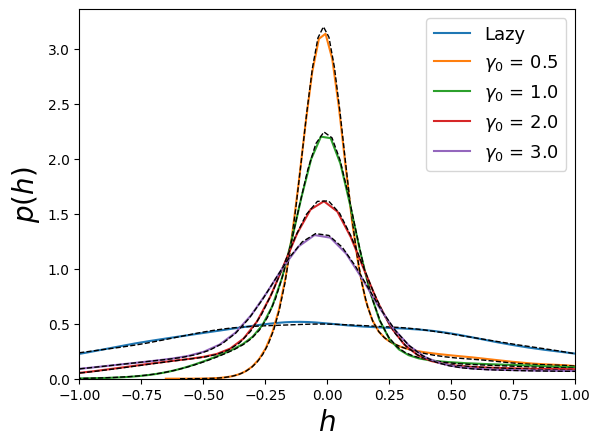

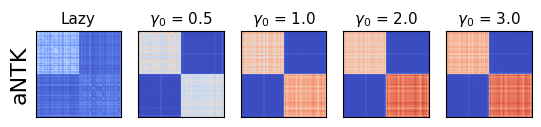

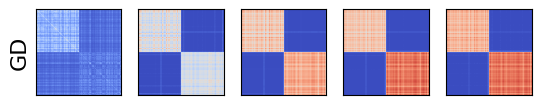

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

#for i, gamma in enumerate(gamma_values):
#    loss = train[gamma]
#    loss_exp = train_exp[gamma]
#    plt.plot(loss, 'k--')
#    plt.plot(loss_exp, label=f'$\gamma$ = {gamma}')
#
#plt.xlabel('Steps', fontsize = 20)
#plt.ylabel('Losses', fontsize = 20)

h0 = h0s[0.5]
h0 = h0[:, 2]
h0_exp = h0s_exp[0.5]
h0_exp = h0_exp[:,2]
sns.kdeplot(h0_exp, label=f'Lazy')
sns.kdeplot(h0, color='k', linestyle='--', linewidth=1.0)

for i, gamma in enumerate(gamma_values):
    h = hs[gamma]
    h = h[:, 2]
    h_exp = hs_exp[gamma]
    h_exp = h_exp[:, 2]
    sns.kdeplot(h_exp, label=f'$\gamma_0$ = {gamma}')
    sns.kdeplot(h, color='k', linestyle='--', linewidth=1.0)
    plt.xlim([-1.0,1.0])
    
plt.ylabel('$p(h)$', fontsize = 20)
plt.xlabel('$h$', fontsize = 20)
plt.legend(fontsize = 13)
plt.savefig('densities_dmft_relu.png', dpi= 300)
plt.show()    

perm = np.argsort(y_train)    
    
#plt.figure(figsize = (20,6))
plt.subplot(1, len(gamma_values)+1, 1)
kernel = lazy_kernels[0.5]
kernel = kernel[:P,:P]
plt.imshow(kernel[perm][:,perm], cmap='coolwarm')
plt.title(f'Lazy', fontsize = 11)
plt.ylabel(f'aNTK', fontsize=16)
plt.xticks([])
plt.yticks([])
for i, gamma in enumerate(gamma_values):
    kernel = kernels[gamma]
    kernel = kernel[:P,:P]
    
    plt.subplot(1, len(gamma_values)+1, i + 2)
    plt.imshow(kernel[perm][:,perm], cmap='coolwarm')
    plt.title(f'$\gamma_0$ = {gamma}', fontsize = 11)
    plt.xticks([])
    plt.yticks([])

plt.savefig('kernels_dmft_relu.svg', dpi= 300)
plt.show()    

plt.subplot(1, len(gamma_values)+1, 1)
kernel = lazy_kernels_exp[0.5]
kernel = kernel[:P,:P]
plt.imshow(kernel[perm][:,perm], cmap='coolwarm')
plt.ylabel(f'GD', fontsize=16)
plt.xticks([])
plt.yticks([])
for i, gamma in enumerate(gamma_values):
    kernel_exp = kernels_exp[gamma]
    kernel_exp = kernel_exp[:P, :P]
    
    plt.subplot(1, len(gamma_values)+1, i + 2)
    plt.imshow(kernel_exp[perm][:,perm], cmap='coolwarm')
    plt.xticks([])
    plt.yticks([])
#plt.show()    
plt.savefig('kernels_gf_relu.svg', dpi= 300)
   
#plt.show()

# Bayesian theory and Langevin dyanmics: kernels, preactivations and test loss

In [100]:
# Langevin
lr = 1e-3
lamb = 1.0
beta = 50
T = 20000
samples = 100000
gamma_values = [0.5, 1.0, 2.0, 3.0]

aligns_expt = []
phi0s_exp_l = []
phis_exp_l = []
h0s_exp_l = []
hs_exp_l = []


Kx = C
Kx_root = sqrt_svd(Kx)
y = y_train

for gamma in gamma_values:
    # Initial Delta and compute initial phi and Phi0
    #Delta = y
    h = random.normal(random.PRNGKey(0), (samples, y.shape[0])) @ Kx_root
    z = random.normal(random.PRNGKey(1), (samples,))
    
    phi = h * (h > 0.0)
    h0 = h
    Phi0 = phi.T @ phi / samples
    phi0s_exp_l += [Phi0]
    h0s_exp_l += [h0]
    f0 = 1.0/gamma * jnp.einsum('ij,i->j', phi, z) / samples
    Delta0 = 1.0 * y - 1/gamma * phi.T @ z / samples + f0

    train_losses = []
    #h_frame = []
    #h_frame += [h]
    key = random.PRNGKey(2)


    for t in range(T):

        key, key1 = random.split(key)

        phi = h * (h > 0.0)
        g = (h > 0.0) * z[:, jnp.newaxis]
        Delta = 1.0 * y - 1/gamma * phi.T @ z / samples + f0

        h += lr * (gamma * jnp.einsum('ij,kj->ik', g[:, :P] * Delta[jnp.newaxis, :P], Kx[:, :P]) - lamb / beta * h) + random.normal(key, (samples, y.shape[0])) * jnp.sqrt(2 * lr / beta)
        z += lr * (gamma * jnp.einsum('ij,j->i', phi[:, :P], Delta[:P]) - lamb / beta * z) + random.normal(key1, (samples,)) * jnp.sqrt(2 * lr / beta)

        train_loss = 0.5 * jnp.mean(Delta[:P] ** 2)
        train_losses.append(train_loss)

        sys.stdout.write(f'\r Iteration {t + 1}/{T}: Train Loss = {train_loss:.6f}')

        #if t % 10 == 0:
        #    h_frame += [h]

        #    Phi = phi.T @ phi / samples
        #    aligns_expt += [ jnp.dot(y, Phi @ y )  ]


    Phi = phi.T @ phi / samples
    phis_exp_l += [Phi]
    hs_exp_l += [h]

 Iteration 20000/20000: Train Loss = 0.000002

In [20]:
# deep Langevin dynamics
import optax

def nonlinear_fn(params, X, gamma0):

    W0 = params[0]
    D = X.shape[0]
    h = W0 @ X / jnp.sqrt(D)
    h = jnp.tanh(h)
    #h = h * (h > 0.0)
    for i, W in enumerate(params[1:-1]):
        h = 1/jnp.sqrt(W.shape[1]) * W @ h
        h = jnp.tanh(h)
        #h = h * (h > 0.0)

    N = params[-1].shape[0]
    f = h.T @ params[-1] / (N * gamma0)
    return f

def nonlinear_fn_reps(params, X, gamma0):

    W0 = params[0]
    D = X.shape[0]
    h = W0 @ X / jnp.sqrt(D)
    h = jnp.tanh(h)
    #h = h * (h > 0.0)
    all_h = [ h.T @ h / h.shape[0] ]
    for i, W in enumerate(params[1:-1]):
        h = 1/jnp.sqrt(W.shape[1]) * W @ h
        h = jnp.tanh(h)
        #h = h * (h > 0.0)
        all_h += [ h.T @ h / h.shape[0] ]
    N = params[-1].shape[0]
    f = h.T @ params[-1] / (N * gamma0)
    return f, all_h

def deep_nonlinear(X, y, P, N, L, T, eta, gamma0, beta, seed = 2, center = False, sigma=0.0):

    M = X.shape[0]

    Ws = [random.normal(random.PRNGKey(seed), (N, M) )]

    for i in range(L-1):
        Ws += [ random.normal(random.PRNGKey(seed+i), ( N ,  N ) ) ]

    Ws += [ random.normal(random.PRNGKey(seed+L), (N,) ) ]

    reg_loss_fn = jit(lambda p: 0.5 * N * gamma0**2 * jnp.sum( ( nonlinear_fn(p, X[:,:P], gamma0)  - y[:P] )**2 ) +  0.5/beta * optimizers.l2_norm(p)**2 )

    test_loss_fn = jit(lambda p: jnp.mean( ( nonlinear_fn(p, X[:,P:], gamma0)  - y[P:] )**2 ))

    solver = optax.noisy_sgd(learning_rate = eta , eta = 2.0 / beta / eta, gamma= 0.0)

    grad_fn = jit( grad(reg_loss_fn) )
    opt_state = solver.init( Ws )
    train_losses = []
    test_losses = []

    params = Ws.copy()

    H_avgs = []
    all_cs = []
    count = 0

    for t in range(T):

        train_losses += [ reg_loss_fn(params) ]
        test_losses += [test_loss_fn(params)]



        if t> 5000 and t % 10:
          _, Hs = nonlinear_fn_reps(params, X[:,:P], gamma0)
          all_cs += [ [jnp.dot(y[:P], H @ y[:P]) for H in Hs] ]
          if count == 0:
            H_avgs = [ H for H in Hs ]
          else:
            H_avgs = [  count / (count+1) * H_avgs[i] + 1/(count+1) * H for i, H in enumerate(Hs) ]

          count += 1
        grads = grad_fn(params)
        updates, opt_state = solver.update(grads, opt_state, params)
        params = optax.apply_updates(params, updates)

    y_NN_test = nonlinear_fn(params, X[:,P:], gamma0)
    W = params[0]
    D = X.shape[0]
    h = W @ X[:,:P] / jnp.sqrt(D) # (N, D) x (D, P) = (N, P)
    phi = jnp.tanh(h)# h * (h > 0.0)
    Phi = phi.T @ phi /N

    # train test kernel
    h_test = W @ X[:,P:]/ jnp.sqrt(D)
    phi_test = jnp.tanh(h_test)#h_test * (h_test > 0.0)
    Phi_traintest = phi_test.T @ phi /N # (Ptest, P)
    I = jnp.eye(P)

    #y_test_pred = Phi_traintest  @ jnp.linalg.solve(Phi + I/beta , y_train)
    y_test_pred = Phi_traintest  @ jnp.linalg.solve(Phi + I/beta , y_train)

    return train_losses, test_losses, H_avgs, all_cs, params, Ws, Phi, h

In [99]:
lr = 1e-3
eta = lr
lamb = 1.0
beta = 50
L = 1
T = 20000
samples = 100000
N = 4096
gamma_values = [0.5, 1.0, 2.0]

phis_exp = []
hs_exp = []

X = jnp.vstack([X_train, X_test])
y = jnp.concatenate([y_train, y_test])
D = X_train.shape[1]
X = X.T

for gamma in gamma_values:
    train_losses, test_losses, H_avgs, all_cs, params, Ws, Phi, h = deep_nonlinear(X, y, P, N, L, T, eta, gamma, beta)
    phis_exp += [Phi]
    hs_exp += [h]

In [8]:
def phi_fn(h, g=1.0):
    #return jnp.maximum(0, g * h)
    return jnp.tanh(g*h)

def init_kernels(C, g=1.0, samples=10000, seed=0):
    key = random.PRNGKey(seed)
    P = C.shape[0]

    sqrt_C = sqrt_svd(C)
    h = random.normal(key, (samples, P)) @ sqrt_C
    phi_h = phi_fn(h, g=g)

    init_Phi = 1 / phi_h.shape[0] * phi_h.T @ phi_h

    return init_Phi

def sqrt_svd(Sigma, eps=0.0):
    s, v = jnp.linalg.eigh(Sigma + eps*jnp.eye(Sigma.shape[0]))
    s = s * (s > 0.0)  # Ensure non-negative eigenvalues
    return v @ jnp.diag(jnp.sqrt(s)) @ v.T

def generate_samples(Phi, samples, key):
    P = Phi.shape[0]
    sqrt_Phi = sqrt_svd(Phi)

    h = random.normal(key,(samples, P)) @ sqrt_Phi
    return h

def single_site(Phi_prev, hat_Phi, samples, key):
    key, subkey = random.split(key)
    h = generate_samples(Phi_prev, samples, subkey)
    phi_h = phi_fn(h)
    exp_term = jnp.exp(-0.5 * jnp.einsum('bi,ij,bj->b', phi_h[:,:P], hat_Phi[:P,:P], phi_h[:,:P]))
    normalization = jnp.mean(exp_term)
    log_exp = jnp.log(normalization)

    return log_exp

In [37]:
def nonlinear_deep_Bayes(C, y, P, L, gamma, beta, seed, up_step_Phi=0.001, up_step_hatPhi=0.001, steps=400, inner_steps=1000, samples=10000):
    key = random.PRNGKey(seed)
    Phis = [init_kernels(C) ]
    for l in range(L-1):
        Phis += [ init_kernels(Phis[-1]) ] 
    hatPhis = [jnp.zeros(C.shape) for _ in range(L)]

    @jit
    def action(Phis, hatPhis, key):
        key, key_site0 = random.split(key)
        S = 0.0

        # Quadratic term: -0.5 * sum_l Phi_l * hatPhi_l
        for l in range(L):
            S -= 0.5 * jnp.sum(Phis[l][:P,:P] * hatPhis[l][:P,:P])

        # Energy term: 0.5 * gamma^2 * y^T (Phi_L)^{-1} y
        energy_term = 0.5 * gamma**2 * jnp.dot(y, jnp.linalg.solve(Phis[-1][:P,:P] + jnp.eye(P)/beta, y))
        S += energy_term

        log_Z_0 = single_site(Phi_prev=C, hat_Phi=hatPhis[0], samples=samples, key=key_site0)
        S -= log_Z_0

        # Log partition function terms via single-site importance sampling
        for l in range(L-1):
            key, key_site_l = random.split(key)
            log_Z_l = single_site(Phi_prev=Phis[l], hat_Phi=hatPhis[l+1], samples=samples, key=key_site_l)
            S -= log_Z_l

        return S, key


    @jit
    def grad_Phi(phis, hatphis, key):
        return grad(lambda X: action(X, hatphis, key)[0])(phis)

    @jit
    def grad_hatPhi(phis, hatphis, key):
        return grad(lambda H: -1.0 * action(phis, H, key)[0])(hatphis)

    # train phi_sqrt , Phi = phi_sqrt.T @ phi_sqrt
    opt_init_1, opt_update_1, get_params_1 = optimizers.sgd( up_step_Phi)
    opt_init_2, opt_update_2, get_params_2 = optimizers.sgd( up_step_hatPhi)

    opt_state_phi = opt_init_1(Phis)
    opt_state_hatphi = opt_init_2(hatPhis)


    action_vals = []
    aligns = []

    for step in range(steps):
        action_value, key = action(get_params_1(opt_state_phi), get_params_2(opt_state_hatphi), key)
        action_vals.append(action_value)


        sys.stdout.write(f'\r step: {step}, action: {action_value}')
        for inner_step in range(inner_steps):

            Phi_sym = [ 0.5 * (phi + phi.T) for phi in get_params_1(opt_state_phi) ]
            hat_Phi_sym = [ 0.5* (hatphi + hatphi.T) for hatphi in get_params_2(opt_state_hatphi) ]

            opt_state_hatphi = opt_update_2(inner_step, grad_hatPhi( Phi_sym, hat_Phi_sym, key ), opt_state_hatphi)
            hat_Phi_sym = [ 0.5* (hatphi + hatphi.T) for hatphi in get_params_2(opt_state_hatphi) ]
            
            grad_hatPhi_norm = jnp.linalg.norm(grad_hatPhi( Phi_sym, hat_Phi_sym, key )[0])
            grad_Phi_norm = jnp.linalg.norm(grad_Phi( Phi_sym, hat_Phi_sym, key )[0])
            
            sys.stdout.write(f'\r step: {step}, action: {action_value}, grad_Phi: {grad_Phi_norm}, grad_hatPhi: {grad_hatPhi_norm}')
            sys.stdout.flush()
            
            if grad_hatPhi_norm < 1e-3:
                break

        Phi_sym = [ 0.5* (phi + phi.T) for phi in get_params_1(opt_state_phi) ]
        hat_Phi_sym = [ 0.5* (hatphi + hatphi.T) for hatphi in get_params_2(opt_state_hatphi) ]

        opt_state_phi = opt_update_1(step, grad_Phi( Phi_sym, hat_Phi_sym, key ), opt_state_phi)
        Phi_sym = [ 0.5 * (phi + phi.T) for phi in get_params_1(opt_state_phi) ]
        aligns +=  [ [ jnp.dot(y, phi[:P,:P] @ y) for phi in Phi_sym ] ]

    Phis_final = get_params_1(opt_state_phi)
    hatPhis_final = get_params_2(opt_state_hatphi)

    return Phis_final, hatPhis_final, action_vals, aligns


In [92]:
L = 1
y = y_train
seed = 0
beta = 50
gamma = 0.5
y = y_train

# P = 50 on MNIST here, run for outer steps = 2000

phis, hat_phis, action_vals, aligns = nonlinear_deep_Bayes(C, y, P, L, gamma, beta, seed, inner_steps= 300, steps=3000, up_step_Phi=1e-3, up_step_hatPhi=1e-2)

 step: 499, action: 1.9046212434768677, grad_Phi: 0.45292675495147705, grad_hatPhi: 0.08026506751775742

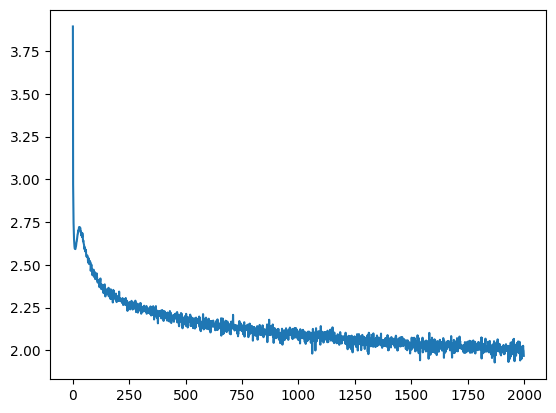

In [68]:
plt.plot(action_vals)

Overlap with exp: 0.9941107630729675, overlap with covariance: 0.9267117977142334
0.19987153 0.034240317 0.03780768


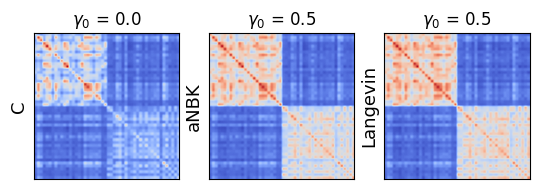

In [107]:
phi_exp_l = phis_exp[0]
phi_exp = phi_exp_l[:P, :P]

plt.subplot(1, 3, 1)
plt.imshow(C[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('C', fontsize = 13)
plt.title(r'$\gamma_0$ = 0.0')

plt.subplot(1, 3, 2)
plt.imshow(phis[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('aNBK', fontsize = 13)
plt.title(r'$\gamma_0$ = 0.5')
 
plt.subplot(1, 3, 3)
plt.imshow(phi_exp[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('Langevin', fontsize = 13)
plt.title(r'$\gamma_0$ = 0.5')
#plt.savefig('kernels_bayes.png', dpi = 300)


a = jnp.sum(phi_exp * phis[0] ) / jnp.sqrt( jnp.sum(phi_exp **2) * jnp.sum(phis[0]**2) )
b = jnp.sum(C * phis[0] ) / jnp.sqrt( jnp.sum(C**2) * jnp.sum(phis[0]**2) )
print(f"Overlap with exp: {a}, overlap with covariance: {b}")

print(jnp.mean(C**2), jnp.mean(phis[0]**2), jnp.mean(phi_exp**2) )

Overlap with exp: 0.9194802045822144, overlap with covariance: 0.8546671271324158
0.19987153 0.052865405 0.16271575


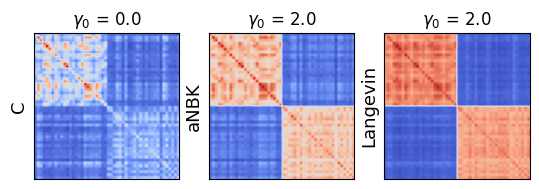

In [141]:
phi_exp_l = phis_exp[2]
phi_exp = phi_exp_l[:P, :P]

plt.subplot(1, 3, 1)
plt.imshow(C[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('C', fontsize = 13)
plt.title(r'$\gamma_0$ = 0.0')

plt.subplot(1, 3, 2)
plt.imshow(phis[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('aNBK', fontsize = 13)
plt.title(r'$\gamma_0$ = 2.0')
 
plt.subplot(1, 3, 3)
plt.imshow(phi_exp[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel('Langevin', fontsize = 13)
plt.title(r'$\gamma_0$ = 2.0')
#plt.savefig('kernels_bayes.png', dpi = 300)


a = jnp.sum(phi_exp * phis[0] ) / jnp.sqrt( jnp.sum(phi_exp **2) * jnp.sum(phis[0]**2) )
b = jnp.sum(C * phis[0] ) / jnp.sqrt( jnp.sum(C**2) * jnp.sum(phis[0]**2) )
print(f"Overlap with exp: {a}, overlap with covariance: {b}")

print(jnp.mean(C**2), jnp.mean(phis[0]**2), jnp.mean(phi_exp**2) )

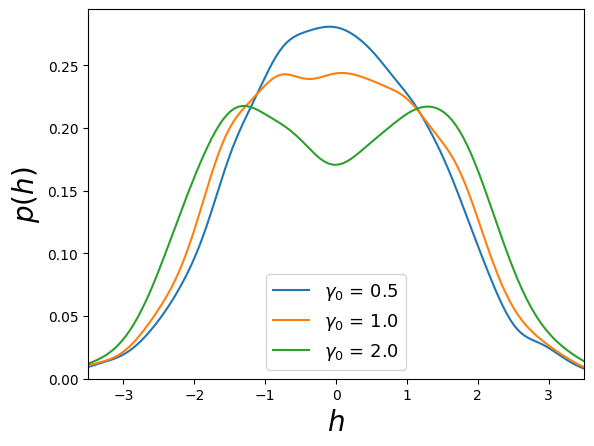

In [102]:
for i, gamma in enumerate(gamma_values):
    h_exp_l = hs_exp[i]
    h_exp = h_exp_l[:, 2]
    #sns.kdeplot(h, color='k', linestyle='--')
    sns.kdeplot(h_exp, label=f'$\gamma_0$ = {gamma}')
    plt.xlim([-3.5,3.5])
plt.ylabel('$p(h)$', fontsize = 20)
plt.xlabel('$h$', fontsize = 20)
plt.legend(fontsize = 13)
plt.savefig('densities_bayes_tanh.png',dpi=300)
plt.show()  

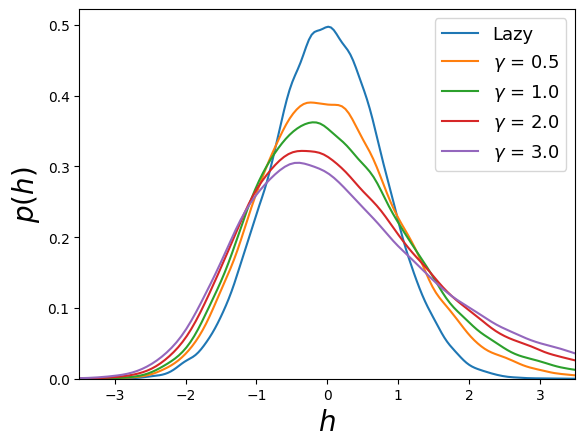

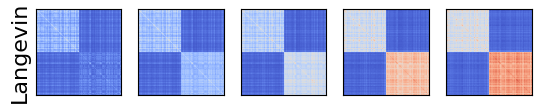

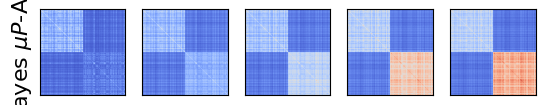

In [62]:
# Theory kernels obtained by replacing relu activation in phi_fn function and solving for P = 200 on MNIST dataset, at different gammas 

perm = np.argsort(y_train)

import matplotlib.pyplot as plt
import seaborn as sns


h0_exp = h0s_exp_l[1]
h0_exp = h0_exp[:,2]
sns.kdeplot(h0_exp, label=f'Lazy')
for i, gamma in enumerate(gamma_values):
    #h = hs[gamma]
    #h = h[:, 2]
    h_exp_l = hs_exp_l[i]
    h_exp = h_exp_l[:, 2]
    #sns.kdeplot(h, color='k', linestyle='--')
    sns.kdeplot(h_exp, label=f'$\gamma$ = {gamma}')
    plt.xlim([-3.5,3.5])
    
plt.ylabel('$p(h)$', fontsize = 20)
plt.xlabel('$h$', fontsize = 20)
plt.legend(fontsize = 13)
plt.savefig('densities_bayes_relu.png',dpi=300)
plt.show()  

plt.subplot(1, len(gamma_values)+1, 1)
phi_exp_l = phi0s_exp_l[0]
phi_exp = phi_exp_l[:P, :P]
plt.imshow(phi_exp[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel(f'Langevin', fontsize=16)

for i, gamma in enumerate(gamma_values):
    phi_exp_l = phis_exp_l[i]
    phi_exp = phi_exp_l[:P, :P]
    
    plt.subplot(1, len(gamma_values)+1, i + 2)
    plt.imshow(phi_exp[perm][:,perm], cmap='coolwarm')
    plt.xticks([])
    plt.yticks([])
    
plt.savefig('kernels_langevin_relu.svg',dpi=300)   
plt.show()


plt.subplot(1, len(gamma_values)+1, 1)
phi_exp_l = phi0s_exp_l[0]
phi_exp = phi_exp_l[:P, :P]
plt.imshow(phi_exp[perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.ylabel(f'Bayes aNBK', fontsize=16)
plt.subplot(1, len(gamma_values)+1, 2)
plt.imshow(phis_05[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.subplot(1, len(gamma_values)+1, 3)
plt.imshow(phis_1[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.subplot(1, len(gamma_values)+1, 4)
plt.imshow(phis_2[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.subplot(1, len(gamma_values)+1, 5)
plt.imshow(phis_3[0][perm][:,perm], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.savefig('kernels_bayes_relu.svg',dpi=300)
plt.show()

L = 1
y = y_train
seed = 0
beta = 50
gamma = 1.0
y = y_train

phis, hat_phis, action_vals, aligns = nonlinear_deep_Bayes(C, y, P, L, gamma, beta, seed, inner_steps= 100, steps=1000, up_step_Phi=1e-5, up_step_hatPhi=1e-3)

# Check generalization error (th and exp)

In [5]:
from teachers import *

P = 800
Ptest = 200

C, x_train, y_train, x_test, y_test = load_cifar(P, Ptest, 1.0)
X = jnp.vstack([x_train, x_test])
y = jnp.concatenate([y_train, y_test])
D = x_train.shape[1]

Ctot = X @ X.T / D

2025-05-27 11:13:00.043174: W tensorflow/core/kernels/data/cache_dataset_ops.cc:913] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.
2025-05-27 11:13:00.408232: W tensorflow/core/kernels/data/cache_dataset_ops.cc:913] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


X_train shape: (800, 784)


In [50]:
L = 1
beta = 50
gamma = 0.3
seed = 0

# To make this converge, run loger, i.e. for steps = 1000
phis, hat_phis, action_vals, aligns = nonlinear_deep_Bayes(Ctot, y_train, P, L, gamma, beta, seed, up_step_Phi = 1e-3, up_step_hatPhi = 1e-4, steps = 30, inner_steps =3000)

 step: 29, action: 21.757431030273438, grad_Phi: 6.406916618347168, grad_hatPhi: 1.34241318702697755

In [22]:
N = 4096
eta = 5e-4 
T = 20000 

X = X.T
    
train_losses, test_losses, H_avgs, all_cs, params, Ws, Phi, h = deep_nonlinear(X, y,P, N, L, T, eta, gamma, beta, seed=seed)

In [51]:
seed = 0

y_th = phis[0][P:,:P] @ jnp.linalg.solve(phis[0][:P,:P]+ jnp.eye(P)/beta , y_train)
diff = (y_test - y_th)**2

err = np.mean(diff)
print(err)

W = params[0]
D = X.shape[0]
h = W @ X[:,:P] / jnp.sqrt(D) # (N, D) x (D, P) = (N, P)
phi = jnp.tanh(h)
Phi = phi.T @ phi /N

# train test kernel
h_test = W @ X[:,P:]/ jnp.sqrt(D)
phi_test = jnp.tanh(h_test)
Phi_traintest = phi_test.T @ phi /N # (Ptest, P)

jnp.sum(phis[0][P:,:P] * Phi_traintest)/jnp.sqrt( jnp.sum(phis[0][P:,:P]**2) * jnp.sum(Phi_traintest**2) )

0.2394415


Array(0.9940288, dtype=float32)

0.24375188

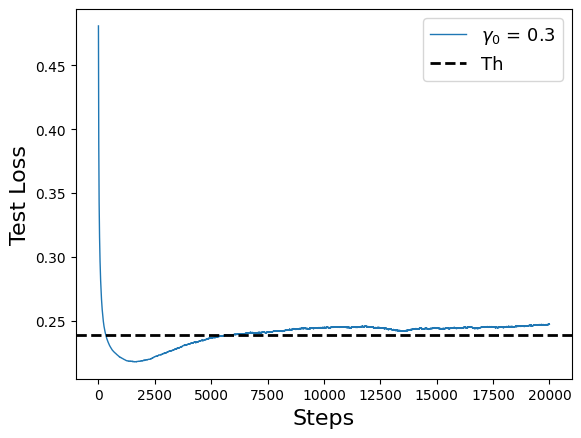

In [52]:
plt.plot(test_losses, linewidth=1.0, label = f'$\gamma_0$ = {gamma}')
plt.axhline(y=err, linestyle ='--', color='black', linewidth = 2, label=r'Th')
plt.legend(fontsize = 13)
plt.xlabel('Steps', fontsize = 16)
plt.ylabel('Test Loss', fontsize = 16)

np.mean(test_losses[5000:])